In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
"""

Creates a folder on Drive for saving figures produced later in the notebook.

"""

outdir = "/content/drive/MyDrive/Colab Notebooks/figures"
!mkdir -p "$outdir"

In [ ]:
"""
Installs netCDF4 (for reading NetCDF data), PySINDy, and Cartopy, used later in the notebook.
"""

!pip install netCDF4 pysindy cartopy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 70.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.4/123.4 kB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 123.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 81.1 MB/s eta 0:00:00


In [ ]:
"""
Installs pyTAMS, a rare-event / tipping-point sampling package used elsewhere in the wider project.
"""

!pip -q install "pytams[exec]"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.0/52.0 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.5/49.5 kB 4.7 MB/s eta 0:00:00


In [ ]:
"""
Downloads podscore.py, a helper script from the pyTAMS examples repository used for analyzing the Boussinesq model.
"""

!wget -q https://raw.githubusercontent.com/nlesc-eTAOC/pyTAMS/v1.0.0/examples/Boussinesq/podscore.py -O podscore.py

In [ ]:
"""
Imports

"""

import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import datetime
import time
import glob, os
import math
import netCDF4 as netcdf
import matplotlib.colors as colors
import itertools
import logging
import numpy.typing as npt
import scipy as sp

from matplotlib.collections import LineCollection
from matplotlib.colors import LinearSegmentedColormap
from IPython.display import display
from mpl_toolkits.mplot3d import Axes3D
from pylab import *
from pathlib import Path
from typing import Any
from podscore import PODScore
from pytams.fmodel import ForwardModelBaseClass
from scipy.signal import savgol_filter
from scipy.stats import kendalltau
from scipy.ndimage import uniform_filter1d
from scipy.optimize import minimize
from scipy.optimize import curve_fit

In [ ]:
"""

Points to the folder containing data from the related E-CCM model and checks that the path exists (some shared setup is reused across notebooks in this project).

"""

directory = "/content/drive/MyDrive/Colab Notebooks/E-CCM-E-CCM_v2.0/RenevanWesten-E-CCM-3f4c7ab/Data/E-CCM/"
print("base exists:", os.path.isdir(directory))

base exists: True


In [ ]:
"""

Creates a folder used later in the notebook to store the networks after they are retrained on an expanded dataset that includes the hosing (freshwater-forcing) experiments.

"""

retrain_dir = "/content/drive/MyDrive/Colab Notebooks/retrain"
os.makedirs(retrain_dir, exist_ok = True)

# Boussinesq Model

In [ ]:
"""
Boussinesq model core physics

Defines BoussinesqCore, the two-dimensional Boussinesq fluid model used to generate the 'truth' data for this notebook: a simplified PDE-based ocean model that solves for vorticity, salinity, temperature and the resulting streamfunction (overturning circulation) on a 2D grid over time.
"""

"""Boussinesq 2D model core physics module."""

_logger = logging.getLogger(__name__)


class BoussinesqCore:
    """Class for the 2D Boussinesq model of the AMOC core physics.

    The model includes stochastic forcing on freshwater.
    The model is described in J. Soons et al. doi:10.1017/jfm.2025.248
    and encapsulated/optimzed by V. Jacques-Dumas.

    Attributes:
        m, n: number of grid points in x and z
        dt: time step
        Pr, Le, A, Ra: physical parameters
        delta, tauT, tauS: numerical parameters
    """

    def __init__(
        self,
        m: int,
        n: int,
        dt: float,
        pr: float = 1.0,
        le: float = 1.0,
        a: float = 5.0,
        ra: float = 4.0e4,
        delta: float = 0.05,
        tau_t: float = 0.1,
        tau_s: float = 1.0,
    ):
        # Pass in model paramaters
        self._pr = pr
        self._le = le
        self._a = a
        self._ra = ra
        self._delta = delta
        self._tau_t = tau_t
        self._tau_s = tau_s

        # Set up grid
        self._m, self._n = m, n
        self.xx = np.linspace(0, self._a, self._m + 1)
        self.zz = self.z_j(np.arange(self._n + 1))
        self.dx = self.xx[1] - self.xx[0]

        # Time stepping
        self._dt = dt
        self.dtsq = np.sqrt(self._dt)

        # Hosing parameters
        self.hosing_shape = "tanh"
        self.hosing_t0 = 0.0  # Start of rate increase
        self.hosing_tf = 0.0  # End of rate increase
        self.hosing_start_val = 0.0  # Initial hosing value at t0
        self.hosing_rate = 0.0  # Rate of change of hosing rate

        self.make_x_derivatives()
        self.make_z_derivatives()
        self.boundary_layer_operator()
        self.correction_operator()
        self.integration_matrices()

    def h(self, z: npt.NDArray[np.number], delta_loc: float | None = None) -> npt.NDArray[np.number]:
        """The surface noise degeneration function.

        Args:
            z: the depth coordinate
            delta_loc: a delta value, locally different from the class one
        """
        if delta_loc:
            return np.exp(-(1 - z) / delta_loc)

        return np.exp(-(1 - z) / self._delta)

    def temp_s(self, x: npt.NDArray[np.number]) -> npt.NDArray[np.number]:
        """Forcing on surface temperature.

        Args:
            x: latitude

        Returns:
            The static surface temperature forcing value
        """
        return 0.5 * (np.cos(2 * np.pi * (x / self._a - 1 / 2)) + 1)

    def salt_s(self, x: npt.NDArray[np.number], beta: float) -> npt.NDArray[np.number]:
        """Forcing on surface salinity.

        Args:
            x: latitude
            beta: asymmetry parameter

        Returns:
            The static surface salinity forcing value
        """
        return 3.5 * np.cos(2.0 * np.pi * (x / self._a - 1.0 / 2.0)) - beta * np.sin(np.pi * (x / self._a - 1 / 2))

    def hosing(self, x: npt.NDArray[np.number], ampl: float) -> npt.NDArray[np.number]:
        """Define hosing spatial profile.

        We use a tanh or a Gaussian function in latitute, adding freshwater to
        the northern part if the amplitude is positive (while
        removing freshwater in the southern part to conserve salinity).

        Args:
            x: latitude
            ampl: hosing amplitude factor

        Returns:
            The local hosing value
        """
        if self.hosing_shape == "tanh":
            return -ampl * np.tanh(20.0 * (x / self._a - 1 / 2))

        if self.hosing_shape == "gaussian":
            sigma = self._a / 30.0
            north_gauss = (
                -ampl
                * np.exp(-((x / self._a - 3.0 / 4.0) ** 2) / (2.0 * (sigma / self._a) ** 2))
                / (sigma * np.sqrt(2.0 * np.pi))
            )
            north_gauss_int = np.sum(north_gauss) * self.dx
            return north_gauss - np.where(
                ((x / self._a) - 0.5) <= 0.0, 2.0 * north_gauss_int / (self._a + 2.0 * self.dx), 0.0
            )

        return np.zeros(x.shape)

    def init_hosing(self, shape: str, t0: float, tf: float, h0: float, rate: float) -> None:
        """Initialize hosing parameters.

        Args:
            shape: hosing shape
            t0 : change hosing rate start time
            tf : change hosing rate end time
            h0 : initial hosing value amplitude (at t0)
            rate : rate of change of hosing amplitude
        """
        self.hosing_shape = shape
        self.hosing_t0 = t0
        self.hosing_tf = tf
        self.hosing_start_val = h0
        self.hosing_rate = rate
        if self.hosing_shape not in ["tanh", "gaussian"]:
            err_msg = f"Hosing shape {shape} is not available"
            _logger.exception(err_msg)
            raise ValueError(err_msg)

    def init_salt_stoch_noise(self, z: npt.NDArray[np.number], nk: int, eps: float, delta_stoch: float) -> None:
        """Initialize stochastic salinity noise.

        Args:
            z: depth coordinate
            nk: number of Fourier modes
            eps: stochastic noise amplitude factor
            delta_stoch: the depth thickness parameter
        """
        cos_term = np.cos(2 * np.pi * np.arange(1, nk + 1)[:, np.newaxis] * self.xx[np.newaxis] / self._a)[
            ..., np.newaxis
        ]
        sin_term = np.sin(2 * np.pi * np.arange(1, nk + 1)[:, np.newaxis] * self.xx[np.newaxis] / self._a)[
            ..., np.newaxis
        ]
        z_term = np.sqrt(eps / nk) * np.expand_dims(self.h(z, delta_stoch), axis=(0, 1))
        self.cos_term, self.sin_term = cos_term * z_term, sin_term * z_term

    def salt_stoch_noise(self, normalrange: npt.NDArray[np.number]) -> npt.NDArray[np.number]:
        """Assemble the salinity stochastic forcing.

        Args:
            normalrange : A numpy array of size 2*nk, containing random numbers for each mode

        Returns:
            Numpy of the salinity forcing over the entire domain
        """
        normalrange = np.expand_dims(normalrange, axis=(1, 2))
        return np.sum(normalrange[::2] * self.cos_term + normalrange[1::2] * self.sin_term, axis=0)

    def z_j(self, j: npt.NDArray[np.number]) -> npt.NDArray[np.number]:
        """Return the depth for index range."""
        q = 3
        return 0.5 + np.tanh(q * (j / self._n - 0.5)) / (2 * np.tanh(q / 2))

    def dz_j(self, j: int) -> float:
        """Return the depth width of cells."""
        z_j = self.z_j(np.array([j, j + 1], dtype="int"))
        return z_j[1] - z_j[0]

    def make_x_derivatives(self) -> None:
        """Construct latitude derivatives."""
        self.Dxx = np.diag(-2 * np.ones(self._m + 1)) + np.diag(np.ones(self._m), 1) + np.diag(np.ones(self._m), -1)
        self.Fxx = np.diag(-2 * np.ones(self._m + 1)) + np.diag(np.ones(self._m), 1) + np.diag(np.ones(self._m), -1)
        self.Dxx[0, 1], self.Dxx[-1, -2] = 2, 2
        self.Fxx[0, 0], self.Fxx[0, 1], self.Fxx[-1, -1], self.Fxx[-1, -2] = 0, 0, 0, 0
        self.Dxx /= self.dx**2
        self.Fxx /= self.dx**2

        self.Dx = np.diag(np.ones(self._m), 1) + np.diag(-np.ones(self._m), -1)
        self.Fx = np.diag(np.ones(self._m), 1) + np.diag(-np.ones(self._m), -1)
        self.Dx[0, 1], self.Dx[-1, -2] = 0, 0
        self.Fx[0, 1], self.Fx[-1, -2] = 2, -2
        self.Dx /= 2 * self.dx
        self.Fx /= 2 * self.dx

    def make_z_derivatives(self) -> None:
        """Constrcut and define depth derivative functions."""

        def p_j(j: npt.NDArray[np.number] | int) -> npt.NDArray[np.number]:
            return 1 / (self.z_j(j + 1) - self.z_j(j - 1))

        def alpha_j(j: npt.NDArray[np.number] | int) -> float:
            return 2 / (self.dz_j(j - 1) * (self.z_j(j + 1) - self.z_j(j - 1)))

        def beta_j(j: npt.NDArray[np.number] | int) -> float:
            return 2 / (self.dz_j(j) * self.dz_j(j - 1))

        def gamma_j(j: npt.NDArray[np.number] | int) -> float:
            return 2 / (self.dz_j(j) * (self.z_j(j + 1) - self.z_j(j - 1)))

        self.Dzz = (
            np.diag(-beta_j(np.arange(self._n + 1)), k=0)
            + np.diag(gamma_j(np.arange(self._n)), k=1)
            + np.diag(alpha_j(np.arange(1, self._n + 1)), k=-1)
        )
        self.Fzz = (
            np.diag(-beta_j(np.arange(self._n + 1)), k=0)
            + np.diag(gamma_j(np.arange(self._n)), k=1)
            + np.diag(alpha_j(np.arange(1, self._n + 1)), k=-1)
        )
        self.Dzz[0, 1], self.Dzz[-1, -2] = alpha_j(0) + gamma_j(0), alpha_j(self._n) + gamma_j(self._n)
        self.Fzz[0, 0], self.Fzz[0, 1], self.Fzz[-1, -1], self.Fzz[-1, -2] = 0, 0, 0, 0

        self.Dz = np.diag(p_j(np.arange(self._n)), k=1) + np.diag(-p_j(np.arange(1, self._n + 1)), k=-1)
        self.Fz = np.diag(p_j(np.arange(self._n)), k=1) + np.diag(-p_j(np.arange(1, self._n + 1)), k=-1)
        self.Dz[0, 1], self.Dz[-1, -2] = 0, 0
        self.Fz[0, 1], self.Fz[-1, -2] = 1 / self.dz_j(-1), -1 / self.dz_j(self._n - 1)

        self.DzT, self.FzT = self.Dz.T, self.Fz.T
        self.DzzT, self.FzzT = self.Dzz.T, self.Fzz.T

    def boundary_layer_operator(self) -> None:
        """Define (surface) boundary layer operator."""
        self.Hz = np.diag(self.h(self.z_j(np.arange(self._n + 1))))
        self.HzT = self.Hz.T

    def correction_operator(self) -> None:
        """Define the salinity correction operator."""
        self.S_corr = np.identity(self._n + 1)
        self.S_corr[0, 0], self.S_corr[-1, -1] = 0, 0

    def make_salinity_forcing(self, beta: float) -> None:
        """Make the salinity forcing term.

        Args:
            beta : the asymetry parameter
        """
        self.FS = (
            self.h(self.z_j(np.arange(self._n + 1)))[np.newaxis]
            * self.salt_s(self.xx, beta)[:, np.newaxis]
            / self._tau_s
        )

    def get_hosing(self, time: float) -> npt.NDArray[np.number]:
        """Get the hosing surface term.

        Args:
            time : model time

        Returns:
            A numpy array with the hosing degenerated
        """
        limited_time = min(time, self.hosing_tf)
        ampl = self.hosing_start_val + max(0, (limited_time - self.hosing_t0)) * self.hosing_rate
        return (
            self.h(self.z_j(np.arange(self._n + 1)))[np.newaxis]
            * self.hosing(self.xx, ampl)[:, np.newaxis]
            / self._tau_s
        )

    def integration_matrices(self) -> None:
        """Build the integration matrices."""
        self.AT = np.identity(self._m + 1) - self._dt * self.Dxx
        self.BT = self._dt / self._tau_t * self.HzT - self._dt * self.DzzT
        self.AS = np.identity(self._m + 1) - self._dt / self._le * self.Dxx
        self.BS = -self._dt / self._le * self.DzzT
        self.Aw = np.identity(self._m + 1) - self._dt * self._pr * self.Fxx
        self.Bw = -self._dt * self._pr * self.FzzT

        self.FT = (
            self.h(self.z_j(np.arange(self._n + 1)))[np.newaxis] * self.temp_s(self.xx)[:, np.newaxis] / self._tau_t
        )

    def trajectory(
        self, nt_max: int, phi_start: npt.NDArray[np.number], beta: float, nk: int, eps: float
    ) -> npt.NDArray[np.number]:
        """Run the model for a number of steps, forming a trajectory.

        Args:
            nt_max: number of time steps
            phi_start: initial solution
            beta: asymmetry parameter
            nk: number of forcing mode
            eps: stochastic noise amplitude factor

        Returns:
            The model state along the trajectory as a 4D numpy array
        """
        s0 = 1
        self.make_salinity_forcing(beta)

        # Initilize the state vector
        phi_traj = np.zeros((nt_max + 1, 4, self._m + 1, self._n + 1))
        phi_traj[0] = phi_start

        # Initialize random noise for all steps
        rng = np.random.default_rng()
        normalrange = rng.normal(0, 1, size=(nt_max, 2 * nk))

        self.init_salt_stoch_noise(self.zz, nk, eps, 0.05)

        # Time stepping loop
        for t in range(1, nt_max + 1):
            # Unpack state data
            w_old, s_old, t_old, psi_old = phi_traj[t - 1]

            fx_psi = self.Fx @ psi_old
            psi_fz = psi_old @ self.FzT
            dx_st = self.Dx @ phi_traj[t - 1, 1:3]
            st_dz = phi_traj[t - 1, 1:3] @ self.DzT

            # temperature, salinity updates
            q_s, q_t = fx_psi[np.newaxis] * st_dz - psi_fz[np.newaxis] * dx_st

            c_t = t_old + self._dt * (q_t + self.FT)
            c_s = s_old + self._dt * (q_s + self.FS) + self.dtsq * self.salt_stoch_noise(normalrange[t - 1])

            t_new = sp.linalg.solve_sylvester(self.AT, self.BT, c_t)
            s_new = sp.linalg.solve_sylvester(self.AS, self.BS, c_s)
            s_new *= s0 / np.mean(s_new)  # correction to conserve salinity

            # vorticity update
            f_w = self._pr * self._ra * self.Dx @ (t_new - s_new) @ self.S_corr
            q_w = fx_psi * (w_old @ self.FzT) - psi_fz * (self.Fx @ w_old)
            c_w = w_old + self._dt * (q_w + f_w)
            w_new = sp.linalg.solve_sylvester(self.Aw, self.Bw, c_w)

            # streamfunction update with the poisson operator
            psi_new = sp.linalg.solve_sylvester(self.Fxx, self.FzzT, -w_new)

            phi_traj[t] = np.array([w_new, s_new, t_new, psi_new])

        return phi_traj

    def contourplot(self, xzmatrix: npt.NDArray[np.number], name: str | None = None) -> None:
        """Plot the 2D contour of a variable.

        Args:
            xzmatrix: the variable of interest on the domain grid
            name: an optional title name for the plot
        """
        x, z = np.meshgrid(self.xx, self.zz)
        plt.contourf(x, z, np.transpose(xzmatrix))
        plt.colorbar()
        plt.xlabel("x")
        plt.ylabel("z")
        if name:
            plt.title(name)
        plt.show()

    def stateplot(self, state: npt.NDArray[np.number], addition: str | None = None) -> None:
        """Plot all 4 components of the state vector.

        Args:
            state: the state numpy array
            addition: an optional string for plot title
        """
        for i in range(4):
            self.contourplot(state[i], ["T", "S", r"$\psi$", r"$\omega$"][i] + str(addition))

In [ ]:
"""
BoussinesqWrapper
-----------------
Adapts BoussinesqCore so the rest of the notebook can treat it
like the old MOCModel (E_CCM).  It:
  1. Runs the PDE solver to generate trajectories.
  2. Extracts ~12 scalar diagnostics per timestep (the 'state vector').
  3. Records the stochastic forcing so it can serve as U.
  4. Provides .convention, .on, observation helpers, etc.
"""

class BoussinesqWrapper:
    """Adapter providing a MOCModel-like interface over BoussinesqCore."""

    def __init__(self, M = 20, N = 40, dt = 0.001, beta = 0.1, nk = 7, eps = 0.01,
                 pr = 1.0, le=1.0, a = 5.0, ra = 4.0e4):
        self.M = M
        self.N = N
        self._dt = dt
        self._beta = beta
        self._nk = nk
        self._eps = eps

        # Time step in "years" — the Boussinesq model uses non-dimensional
        # time.  We define delta_t as the non-dim dt directly; the pipeline
        # only needs dt_years = delta_t / (365*86400) but we keep it simple
        # by setting delta_t = dt  (non-dimensional).
        self.delta_t = dt

        # Instantiate the core solver
        self.core = BoussinesqCore(M, N, dt, pr = pr, le = le, a = a, ra = ra)

        # Convention: names of the diagnostic state variables
        self.convention = [
            'psi_max',           # 0  AMOC strength: -min(ψ) (northern cell magnitude, →0 on collapse)
            'psi_north',         # 1  mean psi in northern upper region
            'psi_south',         # 2  mean psi in southern upper region
            'S_mean',            # 3  domain-mean salinity
            'S_north_surf',      # 4  mean salinity at northern surface
            'S_south_surf',      # 5  mean salinity at southern surface
            'S_deep',            # 6  mean deep salinity
            'T_north_surf',      # 7  mean temperature at northern surface
            'T_south_surf',      # 8  mean temperature at southern surface
            'T_mean',            # 9  domain-mean temperature
            'w_rms',             # 10 RMS vorticity
            'delta_rho',         # 11 N-S density contrast (T-S combined)
            'psi_min',            # 12 northern cell strength (negative)
            'psi_mid',            # 13 ψ at basin center (as in paper Fig 1)
        ]

        # Index helpers for regions (adapted to grid size)
        # Northern = upper 25% of x, upper 25% of z
        # Southern = lower 25% of x, upper 25% of z
        mx = M + 1
        nz = N + 1
        self._x_north = slice(int(0.7 * mx), mx)
        self._x_south = slice(0, int(0.3 * mx))
        self._z_surf  = slice(int(0.75 * nz), nz)   # top 25% (z≈1 is surface)
        self._z_deep  = slice(0, int(0.25 * nz))     # bottom 25%
        self._z_upper = slice(int(0.5 * nz), nz)     # top 50%

        # Placeholders filled by run()
        self.on = None          # ON-state diagnostics
        self.off = None         # OFF-state diagnostics (if available)
        self.dW = None          # stochastic forcing record
        self._last_traj = None  # full PDE trajectory (kept for get_var etc.)

    # ---- Diagnostic extraction ----
    def extract_diagnostics(self, state_4d):
        """
        Extract scalar diagnostics from one PDE snapshot.

        Args:
            state_4d: numpy array of shape (4, M+1, N+1)
                      [0]=vorticity, [1]=salinity, [2]=temperature, [3]=streamfunction

        Returns:
            1D numpy array of length len(self.convention)
        """
        w, S, T, psi = state_4d[0], state_4d[1], state_4d[2], state_4d[3]

        psi_max       = -np.min(psi)
        psi_north     = np.mean(psi[self._x_north, self._z_upper])
        psi_south     = np.mean(psi[self._x_south, self._z_upper])
        S_mean        = np.mean(S)
        S_north_surf  = np.mean(S[self._x_north, self._z_surf])
        S_south_surf  = np.mean(S[self._x_south, self._z_surf])
        S_deep        = np.mean(S[:, self._z_deep])
        T_north_surf  = np.mean(T[self._x_north, self._z_surf])
        T_south_surf  = np.mean(T[self._x_south, self._z_surf])
        T_mean        = np.mean(T)
        w_rms         = np.sqrt(np.mean(w**2))

        # Simplified density contrast: delta_rho ~ -(T_n - T_s) + (S_n - S_s)
        # (positive when north is denser, which drives overturning)
        delta_rho = -(T_north_surf - T_south_surf) + (S_north_surf - S_south_surf)

        psi_min = np.min(psi)
        psi_mid = psi[self.M // 2, self.N // 2]

        return np.array([
            psi_max, psi_north, psi_south,
            S_mean, S_north_surf, S_south_surf, S_deep,
            T_north_surf, T_south_surf, T_mean,
            w_rms, delta_rho,
            psi_min, psi_mid
        ], dtype=np.float64)

    def extract_trajectory_diagnostics(self, phi_traj):
        """
        Extract diagnostics for an entire trajectory.

        Args:
            phi_traj: (Nt+1, 4, M+1, N+1)

        Returns:
            (Nt+1, n_diag) numpy array
        """
        Nt_plus1 = phi_traj.shape[0]
        n_diag = len(self.convention)
        diag = np.zeros((Nt_plus1, n_diag), dtype=np.float64)
        for t in range(Nt_plus1):
            diag[t] = self.extract_diagnostics(phi_traj[t])
        return diag

    # ---- Model interface (mimics MOCModel) ----
    def set_E_A(self, val):
        """Placeholder for API compatibility. No-op for Boussinesq."""
        pass

    def run(self, N=1, T=2000, init_state=None, stop_transi=False):
        """
        Run the Boussinesq model and return trajectory diagnostics.

        Args:
            N: number of trajectories (only 1 supported here)
            T: number of timesteps
            init_state: initial 4D state (4, M+1, N+1). If None, uses
                        a simple analytical initial condition.
            stop_transi: unused, kept for API compatibility

        Returns:
            List containing one element: diagnostics array of shape (T+1, n_diag)
        """
        if init_state is None:
            init_state = self._make_initial_condition()

        # Run the PDE solver
        phi_traj = self.core.trajectory(
            nt_max=T,
            phi_start=init_state,
            beta=self._beta,
            nk=self._nk,
            eps=self._eps
        )

        # Store full trajectory for later use
        self._last_traj = phi_traj

        # Extract diagnostics
        diag = self.extract_trajectory_diagnostics(phi_traj)

        # Record stochastic forcing (regenerate with same RNG — or just use
        # random noise; the PF will use its own forcing anyway)
        rng = np.random.default_rng(seed=42)
        self.dW = rng.normal(0, 1, size=(T, 2 * self._nk))

        return [diag]  # wrapped in list to match MOCModel traj format

    def _make_initial_condition(self):
        """
        Create a simple analytical initial condition.

        Returns (4, M+1, N+1) array: [vorticity, salinity, temperature, psi]
        """
        xx = self.core.xx  # (M+1,)
        zz = self.core.zz  # (N+1,)
        a = self.core._a

        # Temperature: warm surface in south, cold surface in north
        T_init = 0.5 * (np.cos(2 * np.pi * (xx[:, None] / a - 0.5)) + 1) * zz[None, :]

        # Salinity: start uniform = 1
        S_init = np.ones((self.M + 1, self.N + 1))

        # Vorticity and streamfunction: start at zero
        w_init = np.zeros((self.M + 1, self.N + 1))
        psi_init = np.zeros((self.M + 1, self.N + 1))

        return np.array([w_init, S_init, T_init, psi_init])

    def spin_up(self, T_spinup=5000):
        """
        Spin up the model to reach a statistical steady state.
        Stores the final state as self.on.

        Args:
            T_spinup: number of spin-up timesteps

        Returns:
            Final diagnostic state vector (used as self.on)
        """
        print(f"Spinning up Boussinesq model for {T_spinup} steps...")
        init = self._make_initial_condition()
        phi_traj = self.core.trajectory(
            nt_max=T_spinup,
            phi_start=init,
            beta=self._beta,
            nk=self._nk,
            eps=self._eps
        )
        final_state = phi_traj[-1]  # (4, M+1, N+1)
        self.on = self.extract_diagnostics(final_state)
        self._on_state_4d = final_state  # keep full field for restarting
        print(f"Spin-up complete. ON state psi_max = {self.on[0]:.4f}")
        return self.on

    # ---- Variable accessors (mimic MOCModel.get_var etc.) ----
    def get_var(self, name, traj):
        """
        Extract a named diagnostic from the trajectory.

        Args:
            name: variable name (must be in self.convention)
            traj: trajectory as returned by run()

        Returns:
            list with one 1D numpy array of that variable over time
        """
        idx = self.convention.index(name)
        return [traj[0][:, idx]]

    def get_q_N(self, traj):
        """Return overturning strength (psi_max). Analog of AMOC strength."""
        return self.get_var('psi_max', traj)

    def get_F_ovS(self, traj):
        """Return N-S salinity difference. Analog of freshwater transport."""
        S_n = traj[0][:, self.convention.index('S_north_surf')]
        S_s = traj[0][:, self.convention.index('S_south_surf')]
        return [S_n - S_s]

# User Settings

In [ ]:
"""

User settings

All the main tunable settings for the rest of the notebook, gathered in one place: 
how much data to generate and how long to train for, the size of the latent space, 
learning rate and epoch counts, and the particle-filter settings (number of particles, observation and process noise levels, and the resampling threshold).

"""

Ttrain     = 60 # seconds
burnIn     = 5 # seconds (discard transient)
latentDim  = 4 # try 2; if you want more robust, try 3
hidden     = 128 # Since 12D state
lambdaRec  = 30
lr         = 1e-3
numEpochs  = 3000
printEvery = 250

# Filtering + SIS impact test
Tfilter    = 10 # seconds (truth window)
Npart      = 1000 # number of particles
obsSigma   = 1.0 # observation noise std (in physical space units)
procSigma  = 0.05 # latent process noise std per step (each latent component)
resampESS  = 0.5 # resample threshold: ESS < resampESS*Npart

# Running the model

In [ ]:
"""

An extended spinup is used (from 5000 to 20000) which lets the system settle
onto its attractor and also a longer trajectory (from 2000 to 10000) which
samples the full attactor

"""

import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

model  = BoussinesqWrapper(
    M   = 20, # horizontal grid points
    N   = 40, # vertical grid points
    dt  = 0.001, # non-dimensional timestep
    beta = 0.1, # asymmetry parameter
    nk  = 7, # number of stochastic forcing modes
    eps = 0.01, # noise amplitude
    ra  = 4.0e4, # Rayleigh number
)

model.set_E_A(0.0)

#traj = model.run(N = 1, T = 2000, init_state = model.on, stop_transi = False)


# ── Deterministic spin-up to stay in ON state ──
original_eps = model._eps
original_beta = model._beta
model._eps = 0.0                # no noise during spin-up
model._beta = - 0.1               # ON state - negative beta strongly favors the northern cell
model.spin_up(T_spinup = 20000)

# Step 2: Continue spin-up at target beta=0.1
model._beta = original_beta  # restore beta=0.1
model._eps = 0.0              # still no noise
# Run further to let the system adjust
phi_adjust = model.core.trajectory(
    nt_max = 20000,
    phi_start = model._on_state_4d,
    beta = model._beta,
    nk = model._nk,
    eps = 0.0,
)
model._on_state_4d = phi_adjust[-1]
model.on = model.extract_diagnostics(phi_adjust[-1])

model._eps = original_eps       # restore noise for production run

# Verify model in ON state
print(f"psi_min = {model.on[model.convention.index('psi_min')]:.3f}")
print(f"psi_mid = {model.on[model.convention.index('psi_mid')]:.3f}")

# Run the production trajectory from the spun-up state
T_run = 10000

truth_seed = 1
np.random.seed(truth_seed)

traj = model.run(N = 1, T = T_run, init_state = model._on_state_4d, stop_transi = False)

# dt_years: in the Boussinesq model time is non-dimensional.
# We treat each dt as one "unit" of non-dimensional time.
dt_years = model.delta_t

# --- Forcing as tensor ---
U = model.dW  # [T_run, 2*nk]
# Normalize forcing
Umu = U.mean(axis = 0, keepdims = True)
Usd = U.std(axis = 0, keepdims = True) + 1e-8
UN  = (U - Umu) / Usd
U_t = torch.tensor(UN, dtype=torch.float32, device=device)  # [Nt-1, 2*nk]

print(f"Trajectory shape: {traj[0].shape}") # (T_run+1, 12)
print(f"Forcing shape:    {U_t.shape}") # (T_run, 14)
print(f"State variables:  {model.convention}")

cuda
Spinning up Boussinesq model for 20000 steps...
Spin-up complete. ON state psi_max = 4.7291
psi_min = -4.397
psi_mid = -2.756
Trajectory shape: (10001, 14)
Forcing shape:    torch.Size([10000, 14])
State variables:  ['psi_max', 'psi_north', 'psi_south', 'S_mean', 'S_north_surf', 'S_south_surf', 'S_deep', 'T_north_surf', 'T_south_surf', 'T_mean', 'w_rms', 'delta_rho', 'psi_min', 'psi_mid']


# Defining observables for PF along with some helper function

In [ ]:
"""
Observation functions — Boussinesq version.

4 candidate observables are defined (matching the E-CCM pipeline structure):
  0. psi_max      — overturning strength (AMOC analog)
  1. delta_rho    — N-S density contrast
  2. delta_S      — N-S salinity difference (FovS analog)
  3. T_north_surf — northern surface temperature

These replace AMOC_ice, SeaIce, FovS, T_n from the E-CCM.
"""

ObsNames = ["psi_max", "delta_rho", "delta_S", "T_north_surf"]
p = len(ObsNames)

# Mapping from diagnostic names to their index in model.convention
_obs_idx = {
    "psi_max":       model.convention.index("psi_max"),
    "delta_rho":     model.convention.index("delta_rho"),
    "S_north_surf":  model.convention.index("S_north_surf"),
    "S_south_surf":  model.convention.index("S_south_surf"),
    "T_north_surf":  model.convention.index("T_north_surf"),
}

def obs_candidates_torch(Xp_t):
    """
    Computes candidate observations from state matrix.

    Args:
        Xp_t: [nX, N] tensor (each column is one state vector)

    Returns:
        [p, N] tensor of observations
    """
    psi_max      = Xp_t[_obs_idx["psi_max"], :]
    delta_rho    = Xp_t[_obs_idx["delta_rho"], :]
    S_north      = Xp_t[_obs_idx["S_north_surf"], :]
    S_south      = Xp_t[_obs_idx["S_south_surf"], :]
    delta_S      = S_north - S_south
    T_north_surf = Xp_t[_obs_idx["T_north_surf"], :]

    return torch.stack([psi_max, delta_rho, delta_S, T_north_surf], dim=0)

def obs_amoc_ice_torch(Xp_t):
    """
    Simplified 2-observable version (for plotting cells that expect 2 obs).
    Returns [psi_max, delta_rho].
    """
    psi_max   = Xp_t[_obs_idx["psi_max"], :]
    delta_rho = Xp_t[_obs_idx["delta_rho"], :]
    return torch.stack([psi_max, delta_rho], dim=0)


# --- Helper: convert masked arrays safely ---
def as_nd(a):
    if np.ma.isMaskedArray(a):
        return np.asarray(a.filled(np.nan))
    return np.asarray(a)

# --- Build state matrix ---
X_state = as_nd(traj[0].astype(np.float64))   # [T_run+1, 12]
state_names = model.convention

Xn   = X_state[:-1, :]
Xnp1 = X_state[1:, :]
Xtruth_state = X_state
Nt = Xtruth_state.shape[0]
nX = Xtruth_state.shape[1]

print(f"X_state shape: {X_state.shape}")  # (T_run+1, 12)
print(f"nX = {nX}, Nt = {Nt}")

# --- Compute truth observations ---
with torch.no_grad():
    Xt_t = torch.tensor(Xtruth_state.T, dtype=torch.float32, device=device)
    Ytruth_all_t = obs_candidates_torch(Xt_t)   # [p, Nt]

Ytruth_all = Ytruth_all_t.detach().cpu().numpy()

p = len(ObsNames)
m = p

X_state shape: (10001, 14)
nX = 14, Nt = 10001


## Systematic observation noise calibration

In [ ]:
"""
This is a fix to replace the noise of observations from the proof-of-concept
PF. Rather than hard-coding noise which can be defended very well I am applying
a systematic observation noise calibration where a principled computation based
on the climatological std deviation of each observable is applied.

The noise for observable j is set as:

    sigma_j = alpha * std(y_j)

where alpha is a user-chosen fraction (e.g. 0.05 = 5% of natural variability)
and std(y_j) is computed from the truth trajectory.

This ensures that the observation noise is proportional to each variable's
actual scale, avoiding the current mismatch where delta_rho receives
sigma = 0.02 despite having variability of order ~0.005 (making the noise
~4x the signal).

References:
  - van Leeuwen et al. (2019), QJ Roy. Met. Soc., 145(723), 2335–2365
    (general guidance on noise specification in particle filters)
  - Bar-Shalom, Li & Kirubarajan (2001), Ch. 5
    (NIS consistency checks for validating noise assumptions)
"""

# ── Step 1: Computing climatological std of each observable ────────────
# Ytruth_all has shape [p, Nt], already computed above in Cell 15

obs_clim_std = np.std(Ytruth_all, axis=1)   # [p]

print("Climatological std of each observable:")
for j, name in enumerate(ObsNames):
    print(f"  {name:18s}  std = {obs_clim_std[j]:.6f}")


# ── Step 2: Setting noise as a fraction of climatological variability ────
# alpha = 0.05 means "observations are accurate to within 5% of the
# natural variability". I can adjust this single parameter to control the
# overall noise level. Typical range: 0.01 (very precise) to 0.10
# (noisy measurements).

alpha = 0.05   # single tuning knob

obsSigmas_all = alpha * obs_clim_std
obsSigmas_all = np.maximum(obsSigmas_all, 1e-6)   # safety floor

print(f"\nFraction-of-variability noise (alpha = {alpha}):")
for j, name in enumerate(ObsNames):
    print(f"  {name:18s}  sigma = {obsSigmas_all[j]:.6f}"
          f"  (SNR = {obs_clim_std[j]/obsSigmas_all[j]:.1f})")

# ── Step 3: Comparing with the old hardcoded values ────────────────────
old_sigmas = np.array([0.05, 0.02, 0.02, 0.05])

print(f"\nComparison with old hardcoded values:")
print(f"  {'Observable':18s}  {'Old sigma':>10s}  {'New sigma':>10s}  {'Old SNR':>8s}  {'New SNR':>8s}")
for j, name in enumerate(ObsNames):
    old_snr = obs_clim_std[j] / old_sigmas[j]
    new_snr = obs_clim_std[j] / obsSigmas_all[j]
    print(f"  {name:18s}  {old_sigmas[j]:10.6f}  {obsSigmas_all[j]:10.6f}"
          f"  {old_snr:8.1f}  {new_snr:8.1f}")

# ── Step 4: Generating noisy observations with the new sigmas ──────────

assert obsSigmas_all.shape[0] == p

# ── Observation noise — dedicated RNG ──────────────────────────────────────
# Independent stream from the truth RNG and the global torch RNG, so that
# obs-noise replicates can be drawn downstream without disturbing anything else.
OBS_NOISE_SEED = 2
rng_obs = np.random.default_rng(OBS_NOISE_SEED)
Yobs_all = Ytruth_all + obsSigmas_all[:, None] * rng_obs.standard_normal((p, Nt))
Yobs_all_t = torch.tensor(Yobs_all, dtype=torch.float32, device=device)

sig_all_t  = torch.tensor(obsSigmas_all, dtype=torch.float32, device=device)



Climatological std of each observable:
  psi_max             std = 0.265135
  delta_rho           std = 0.003576
  delta_S             std = 0.006997
  T_north_surf        std = 0.001529

Fraction-of-variability noise (alpha = 0.05):
  psi_max             sigma = 0.013257  (SNR = 20.0)
  delta_rho           sigma = 0.000179  (SNR = 20.0)
  delta_S             sigma = 0.000350  (SNR = 20.0)
  T_north_surf        sigma = 0.000076  (SNR = 20.0)

Comparison with old hardcoded values:
  Observable           Old sigma   New sigma   Old SNR   New SNR
  psi_max               0.050000    0.013257       5.3      20.0
  delta_rho             0.020000    0.000179       0.2      20.0
  delta_S               0.020000    0.000350       0.3      20.0
  T_north_surf          0.050000    0.000076       0.0      20.0


In [ ]:
"""
Quick shape check

Prints the shapes of the true/observed data arrays and the observation names, as a quick check that everything lines up before continuing.
"""

print("Ytruth_all shape:", Ytruth_all.shape) # should be (4, Nt)
print("sig_all_t shape:", sig_all_t.shape) # should be (4,)
print("ObsNames:", ObsNames)

Ytruth_all shape: (4, 10001)
sig_all_t shape: torch.Size([4])
ObsNames: ['psi_max', 'delta_rho', 'delta_S', 'T_north_surf']


In [ ]:
"""
Another shape check

Prints the shapes of the state, latent and observation arrays, as a further sanity check before moving on.
"""

print("Xtruth_state:", Xtruth_state.shape)  # (Nt, 11)
print("Xt_t:", Xt_t.shape) # (11, Nt)
print("Ytruth_all:", Ytruth_all.shape) # (2, Nt)
print("Yobs_all:", Yobs_all.shape) # (2, Nt)

print("X_state:", X_state.shape)
print("len(convention):", len(model.convention))
print("convention:", model.convention)
assert X_state.shape[1] == len(model.convention)

Xtruth_state: (10001, 14)
Xt_t: torch.Size([14, 10001])
Ytruth_all: (4, 10001)
Yobs_all: (4, 10001)
X_state: (10001, 14)
len(convention): 14
convention: ['psi_max', 'psi_north', 'psi_south', 'S_mean', 'S_north_surf', 'S_south_surf', 'S_deep', 'T_north_surf', 'T_south_surf', 'T_mean', 'w_rms', 'delta_rho', 'psi_min', 'psi_mid']


In [ ]:
"""
Reproducibility

Fixes the random seeds for NumPy and PyTorch so the rest of the notebook produces the same results each time it's run.
"""

np.random.seed(1)
torch.manual_seed(1)

In [ ]:
"""
Read off the model timestep

Stores the Boussinesq model's timestep for convenient reuse later on.
"""

dt_years = model.delta_t

In [ ]:
"""
Numerical helper functions

A few standalone utility functions used later on: a Lorenz-63 system (kept from an earlier version of the notebook but not actually used here), a systematic resampling routine for the particle filter, and a single Runge-Kutta 4 integration step used to advance the latent dynamics.
"""

def lorenz_rhs(x, sigma = 10.0, rho = 28.0, beta = 8.0/3.0): # Kept but not used
    # LORENZ_RHS Lorenz-63 RHS
    dx = np.zeros(3, dtype = np.float64)
    dx[0] = sigma * (x[1] - x[0])
    dx[1] = x[0] * (rho - x[2]) - x[1]
    dx[2] = x[0] * x[1] - beta * x[2]
    return dx


def systematic_resample(w):
    # SYSTEMATIC_RESAMPLE O(N) systematic resampling.
    w = np.asarray(w, dtype = np.float64)
    N = w.size
    cdf = np.cumsum(w) # cumulative weight CDF
    cdf[-1] = 1.0
    u0 = np.random.rand() / N # drawing a ranodm number
    u = u0 + np.arange(N) / N
    idx = np.zeros(N, dtype=np.int64)

    i = 0
    for j in range(N):
        while u[j] > cdf[i]:
            i += 1
        idx[j] = i
    # Return indices similar to MATLAB's 1..N but Python uses 0..N-1 already.
    return idx

def runge_kutta(z, dt_years, f):
    """
    One Runge–Kutta 4 step for dz/dt = f(z).
    z: tensor [B, latentDim] (or [latentDim])
    dt: float or 0-d tensor
    f: function mapping z -> dz/dt
    """

    k1 = f(z)
    k2 = f(z + 0.5 * dt_years * k1)
    k3 = f(z + 0.5 * dt_years * k2)
    k4 = f(z + dt_years * k3)
    return z + (dt_years / 6.0) * (k1 + 2 * k2 + 2 * k3 + k4)

def runge_kutta_substeps(z, dt, rhs, M = 4):
    h = dt / M
    for _ in range(M):
        z = runge_kutta(z, h, rhs)
    return z

# Train-Val split by time

The split between the training and validation data is based on time since I'm dealing with a dynamical system

In [ ]:
"""
Strategy
--------
Divide the trajectory into equal-length blocks.  Every 5th block is
assigned to validation; the rest go to training.  A small *gap* of a
few time-steps is removed between each train/val boundary to prevent
temporal leakage (the dynamics are correlated on short timescales).

Why this helps
--------------
With a chronological 80/20 split on a 2 000-step trajectory the val
segment was in a completely different dynamical regime (+2.4 SD shift
on S_north_surf, etc.).  Interleaving guarantees train and val see the
same statistical distribution of states, which eliminates the 500×
train/val loss gap that plagued the original notebook.

Tuneable knobs (change these freely)
-------------------------------------
  block_len   – length of each block in timesteps (default 200)
  val_every   – assign 1-in-N blocks to val (default 5 → ~20 % val)
  gap         – timesteps dropped at each train↔val boundary (default 5)
"""

# ── 0.  Raw state matrix (from Cell 15, unchanged) ──────────────────
X = X_state.astype(np.float64) # [Nt_full, 12]
Nt_full = X.shape[0]

# ── 1.  Block parameters ────────────────────────────────────────────
block_len = 200 # timesteps per block  (try 100-500)
val_every = 5 # every Nth block → val  (5 → ~20 % val)
gap = 5 # timesteps dropped at each boundary

n_blocks = Nt_full // block_len # integer number of full blocks used

# ── 2.  Build index masks ───────────────────────────────────────────
train_idx = []
val_idx   = []

for b in range(n_blocks):
    start = b * block_len
    end   = start + block_len # half-open range

    is_val = (b % val_every == 0)

    # determine where to trim the gap
    # — trim the *start* of every block that follows a different-split block
    if b > 0:
        prev_is_val = ((b - 1) % val_every == 0)
        if prev_is_val != is_val:
            start += gap # discard first `gap` steps of this block

    block_indices = np.arange(start, end)

    if is_val:
        val_idx.append(block_indices)
    else:
        train_idx.append(block_indices)

train_idx = np.concatenate(train_idx)
val_idx   = np.concatenate(val_idx)

# Safety: clip to actual data length
train_idx = train_idx[train_idx < Nt_full]
val_idx   = val_idx[val_idx < Nt_full]

X_train = X[train_idx].copy()
X_val   = X[val_idx].copy()

print(f"Interleaved split:  {len(train_idx)} train  /  {len(val_idx)} val  "
      f"(from {Nt_full} total, block_len={block_len}, val_every={val_every}, gap={gap})")
print(f"X_train: {X_train.shape}   X_val: {X_val.shape}")

# ── 3.  Normalisation (from TRAINING data only) ─────────────────────
mu = X_train.mean(axis = 0, keepdims = True)
sd = X_train.std(axis = 0, keepdims = True) + 1e-8

XN_full  = (X - mu) / sd
XN_train = (X_train - mu) / sd
XN_val   = (X_val - mu) / sd

# Backwards-compatible XnN (all consecutive pairs for rollout training)
Xn  = X[:-1, :]
XnN = (Xn - mu) / sd
Xn_t = torch.tensor(XnN, dtype=torch.float32, device=device)

# ── 4.  Torch tensors ───────────────────────────────────────────────
XN_full_t  = torch.tensor(XN_full, dtype = torch.float32, device = device)
XN_train_t = torch.tensor(XN_train, dtype = torch.float32, device = device)
XN_val_t   = torch.tensor(XN_val, dtype = torch.float32, device = device)

# ── 5.  Forcing split ───────────────────────────────────────────────
# U_t has length Nt_full - 1  (one forcing per transition).
# For rollout training, we need *consecutive* subsequences within
# each block.  We store the forcing aligned to the same indices.

# Full normalised forcing is already in U_t  [Nt_full - 1, u_dim]
# Build forcing tensors aligned to train / val indices.
#   For a state at index i, the forcing that drives i → i+1 is U_t[i].
#   We drop the last index of each block (no "next state" available).

def _build_block_forcing(idx_array, U_t):
    """Select forcing rows matching the state indices (drop last of each block)."""
    valid = idx_array[idx_array < U_t.shape[0]]
    return U_t[valid]

U_train_t = _build_block_forcing(train_idx, U_t)
U_val_t   = _build_block_forcing(val_idx,   U_t)

print(f"U_train_t: {U_train_t.shape}   U_val_t: {U_val_t.shape}")

# ── 6.  Backwards-compatible aliases ────────────────────────────────
XN_t = XN_full_t

var_names = list(model.convention)

# ── 7.  Split diagnostics (same helper as original cell) ────────────
def print_split_diagnostics(XN_train_t, XN_val_t, X_train, X_val, sd, var_names):
    zmax_tr  = XN_train_t.abs().max(dim=0).values.cpu().numpy()
    zmax_val = XN_val_t.abs().max(dim=0).values.cpu().numpy()
    shift    = (X_val.mean(axis=0) - X_train.mean(axis=0)) / sd.reshape(-1)

    print(f"\nTrain: {X_train.shape}  Val: {X_val.shape}")
    print(f"max |XN|  — train: {XN_train_t.abs().max():.3f}  val: {XN_val_t.abs().max():.3f}\n")
    print(f"{'var':>14s}  {'train max':>10s}  {'val max':>10s}  {'shift (SD)':>10s}")
    print("-" * 50)
    for nm, a, b, s in zip(var_names, zmax_tr, zmax_val, shift):
        print(f"{nm:>14s}  {a:10.3f}  {b:10.3f}  {s:+10.3f}")

print_split_diagnostics(XN_train_t, XN_val_t, X_train, X_val, sd, var_names)

Interleaved split:  7950 train  /  1955 val  (from 10001 total, block_len=200, val_every=5, gap=5)
X_train: (7950, 14)   X_val: (1955, 14)
U_train_t: torch.Size([7950, 14])   U_val_t: torch.Size([1955, 14])

Train: (7950, 14)  Val: (1955, 14)
max |XN|  — train: 3.677  val: 3.259

           var   train max     val max  shift (SD)
--------------------------------------------------
       psi_max       3.677       2.548      -0.151
     psi_north       3.095       2.661      +0.088
     psi_south       3.079       3.259      +0.115
        S_mean       0.000       0.000      +0.000
  S_north_surf       3.117       2.862      -0.110
  S_south_surf       3.327       3.190      +0.206
        S_deep       3.103       2.754      +0.047
  T_north_surf       3.651       2.327      -0.095
  T_south_surf       2.737       2.765      +0.296
        T_mean       2.404       2.204      +0.036
         w_rms       2.830       2.414      +0.014
     delta_rho       3.317       2.945      -0.003
     

In [ ]:
"""
Problem
-------
The original training loop samples random start indices and assumes
XN_train_t[idx : idx+K] is a contiguous time window.  With interleaved
blocks, XN_train_t is a *concatenation* of non-adjacent blocks, so
naively slicing across block boundaries gives wrong dynamics.

Solution
--------
I pre-compute all valid rollout start positions *within* each
contiguous training block.  The training loop then samples from
these valid starts.  The rollout loss function (loss_and_grads_rollout_sindy)
works unchanged — it only needs contiguous windows in XN_train_t and
the matching U_train_t.

I rebuild XN_train_t and U_train_t so that each training block is
laid out contiguously (it already is from Cell 22), and we record
where each block starts/ends.
"""

# ── 1.  Find contiguous runs inside train_idx ───────────────────────
# train_idx is a sorted array of (possibly non-consecutive) time indices.
# We detect where consecutive indices break (diff ≠ 1) to find block
# boundaries inside the training tensor.

diffs = np.diff(train_idx)
break_points = np.where(diffs != 1)[0] + 1  # positions where a new block starts

block_starts_in_tensor = np.concatenate([[0], break_points])
block_ends_in_tensor   = np.concatenate([break_points, [len(train_idx)]])

train_block_lengths = block_ends_in_tensor - block_starts_in_tensor

print(f"Training data has {len(train_block_lengths)} contiguous blocks")
print(f"Block lengths: min={train_block_lengths.min()}, "
      f"max={train_block_lengths.max()}, "
      f"mean={train_block_lengths.mean():.0f}")

# ── 2.  Build a list of valid rollout start indices ──────────────────
# For a rollout of length K, the start must be ≤ (block_end - K - 1)
# inside the *training tensor* (i.e. indexing into XN_train_t).

def get_valid_starts(K_max, block_starts, block_ends):
    """Return tensor of valid start indices in XN_train_t for rollout length K_max."""
    starts = []
    for s, e in zip(block_starts, block_ends):
        block_len = e - s
        if block_len > K_max + 1:
            starts.append(np.arange(s, e - K_max - 1))
    if len(starts) == 0:
        raise RuntimeError(
            f"No training block is long enough for K_max={K_max}. "
            f"Increase block_len or decrease K_train_max."
        )
    return torch.tensor(np.concatenate(starts), dtype=torch.long, device=device)


# ── 3.  Do the same for validation blocks ───────────────────────────
diffs_val = np.diff(val_idx)
break_points_val = np.where(diffs_val != 1)[0] + 1

val_block_starts = np.concatenate([[0], break_points_val])
val_block_ends   = np.concatenate([break_points_val, [len(val_idx)]])

val_block_lengths = val_block_ends - val_block_starts
print(f"\nValidation data has {len(val_block_lengths)} contiguous blocks")
print(f"Block lengths: min={val_block_lengths.min()}, "
      f"max={val_block_lengths.max()}, "
      f"mean={val_block_lengths.mean():.0f}")


# ── 4.  Quick helper used inside the training loop ──────────────────
def sample_rollout_batch(valid_starts, batch_size):
    """Sample a batch of start indices from pre-computed valid positions."""
    sel = torch.randint(0, valid_starts.shape[0], (batch_size,), device=device)
    return valid_starts[sel]


# ── 5.  Verify: print a sample window to check continuity ──────────
K_test = 20
vs = get_valid_starts(K_test, block_starts_in_tensor, block_ends_in_tensor)
print(f"\nValid rollout starts for K={K_test}: {vs.shape[0]} windows available")

# Sanity check: the original time indices should be consecutive
sample_start = vs[0].item()
original_times = train_idx[sample_start : sample_start + K_test + 1]
assert np.all(np.diff(original_times) == 1), "BUG: window crosses a block boundary!"
print("Sanity check passed - sampled window is contiguous in original time.")

Training data has 10 contiguous blocks
Block lengths: min=795, max=795, mean=795

Validation data has 10 contiguous blocks
Block lengths: min=195, max=200, mean=196

Valid rollout starts for K=20: 7740 windows available
Sanity check passed - sampled window is contiguous in original time.


In [ ]:
"""

Set the rollout horizon for evaluation

Chooses how many steps ahead (K_eval) the model will be tested on when evaluating multi-step predictions later, 
and works out which starting points in the trajectory are valid for a rollout of that length, respecting the train/validation block structure.

"""

K_eval = 80  # bigger = better rollout, harder optimization

starts = get_valid_starts(K_eval,
                          block_starts_in_tensor, block_ends_in_tensor)

# Interpretability

In [ ]:
"""
SINDy layer

Defines a small trainable layer holding the sparse coefficient matrix used by SINDy (Sparse Identification of Nonlinear Dynamics) to represent the latent dynamics as a short combination of polynomial terms.
"""

class SINDyLayer(nn.Module):
  """
  Learnable sparse coefficient matrix for SINDy.

  Xi's shape: [n_library_terms, latentDim].
  Each column j of Xi holds the coefficients for dz_j/dt.

  Example: if latentDim = 3 and poly_order = 2 with 1 control input,
  the library has ~15 terms (1, z1, z2, z3, u, z1*z1, z1*z2, ...),
  so Xi is [15, 3]. These represent a mixture of several quantities inside latent space.
  Their product shows how the system eveolves non-linearly.


  """
  def __init__(self, n_library, latentDim, init_Xi = None):
    super().__init__()

    if init_Xi is not None:
      self.Xi = nn.Parameter(torch.tensor(init_Xi, dtype = torch.float32))
    else:
      # Small so dynamics don't explode
      self.Xi = nn.Parameter(0.01 * torch.randn(n_library, latentDim))

  def forward(self, Theta):
    """
    Theta: [N, n_library]  (polynomial library evaluated at data points)
    Xi: [n_library, n_latent]
    Returns: [N, n_latent]  (predicted dz/dt)
    """
    return Theta @ self.Xi

In [ ]:
"""
Combined training loss function

Defines the loss function used to train the encoder, decoder and dynamics networks together: it combines a multi-step rollout error, a reconstruction error, a latent-consistency term, and, when enabled, a SINDy regression term that encourages the latent dynamics to be described by a sparse set of polynomial terms.
"""

def loss_and_grads_rollout_sindy(encNet, decNet, dynNet, XN_t, U_t, idx, K, dt_years,
                           lambdaRec, gamma=0.98, lambdaZ = 0.1,
                           prob_of_teach_forc = 0.0,
                           # SINDy arguments
                           sindyLayer = None,
                           lib_idx = None,
                           lambdaSINDy = 0.01,
                           lambdaL1 = 1e-4):
    """
      Compute weighted multi-step rollout loss with reconstruction.

      Args:
          encNet: Encoder network
          decNet: Decoder network
          dynNet: Latent dynamics network
          XN_t: Normalized state trajectories [Nt, d]
          U_t: External forcing [Nt, 1]
          idx: Batch start indices [B]
          K: Rollout horizon
          dt_years: Time step size (years)
          lambdaRec: Reconstruction loss weight
          gamma: Temporal decay factor for rollout loss
          lambdaZ: Latent consistency loss weight
          sindyLayer: SINDy layer module (None = skips SINDy loss)
          lib_idx: Library index tuples from _make_poly_library_indices
          lambdaSINDy: Weight for SINDy regression loss
          lambdaL1: Weight for L1 regularization

      The SINDy additions to the loss are:
       - SINDy regression loss: || dz/dt_finite_diff  -  Theta @ Xi ||^2
       - L1 sparsity loss: || Xi ||_1
      The SINDy loss acts on all K + 1 encoded snapshots (not the rolled - out z),
      because we want to penalize the encoder for producing sparse dynamics.
      The rolled-out z only trains dynNet; the SINDy loss trains encNet + Xi.

      Returns:
          total_loss: Combined scalar loss
      """

    device = XN_t.device

    # ---- Building batch sequences ----
    tgrid = torch.arange(K + 1, device = device)
    idx2d = idx[:, None] + tgrid[None, :]           # [B, K+1]

    # seq: [B, K+1, d]
    seq = XN_t[idx2d]

    # u_seq: [B, K+1] or [B, K+1, 1]
    u_seq = U_t[idx2d]
    if u_seq.dim() == 2:
        u_seq = u_seq.unsqueeze(-1)

    # ---- Reconstruction loss ----
    x0 = seq[:, 0, :]
    z  = encNet(x0)
    xrec0   = decNet(z)
    recLoss = torch.mean(torch.sum((x0 - xrec0) ** 2, dim=1))


    # ---- Multi-step rollout loss via dynNet (unchanged) ----
    predLoss = torch.zeros((), device = device)
    latentLoss = torch.zeros((), device = device)

    w = 1.0
    sum_w = 0.0

    for k in range(1, K + 1):
        u_k = u_seq[:, k - 1, :]  # [B,1] (or [B,u_dim])

        def rhs(zz, u_k = u_k):
          #u_k = u_k.to(zz.device)
          return dynNet(torch.cat([zz, u_k.to(zz.device)], dim=1))

        z = runge_kutta(z, dt_years, rhs)

        xhat  = decNet(z)
        xtrue = seq[:, k, :]
        predLoss = predLoss + w * torch.mean(torch.sum((xtrue - xhat) ** 2, dim=1))

        with torch.no_grad():
            z_true = encNet(xtrue)
        latentLoss = latentLoss + w * torch.mean(torch.sum((z - z_true) ** 2, dim=1))

        if prob_of_teach_forc > 0.0:
          mask = (torch.rand(z.shape[0], device = device) < prob_of_teach_forc).unsqueeze(1)
          z = torch.where(mask, z_true, z)

        sum_w += w
        w *= gamma

    predLoss = predLoss / (sum_w + 1e-12)
    latentLoss = latentLoss / (sum_w + 1e-12)

    # ============================================================
    # SINDy consistency loss
    # ============================================================

    sindy_total = torch.zeros((), device = device)

    if sindyLayer is not None and lib_idx is not None:

      """
      Step 1: Encode ALL K+1 snapshots through the encoder.
      I re-encode (not reuse rolled-out z) because I want
      gradients to flow back into encNet, pushing it to produce
      coordinates where Theta @ Xi explains the dynamics.
      """
      B = seq.shape[0]
      z_seq = torch.stack([encNet(seq[:, k, :]) for k in range(K + 1)], dim = 1) # [B, K+1, latentDim]
      sindy_loss_accum = torch.zeros((), device = device)

      for k in range(K):
        z_k = z_seq[:, k, :] # [B, latentDim]
        z_k_plus1 = z_seq[:, k + 1, :] # [B, latentDim]
        u_k = u_seq[:, k, :] # [B, 1]

        def sindy_rhs(zz, u_k = u_k):
          v = torch.cat([zz, u_k.to(zz.device)], dim = 1)
          Theta = _eval_poly_library(v, lib_idx)
          return sindyLayer(Theta)

        z_k_plus1_pred = runge_kutta(z_k, dt_years, sindy_rhs)
        sindy_loss_accum += torch.mean(torch.sum((z_k_plus1 - z_k_plus1_pred) ** 2, dim = 1))

      sindy_reg = sindy_loss_accum / K
      l1_penalty = torch.mean(torch.abs(sindyLayer.Xi))
      sindy_total = lambdaSINDy * sindy_reg + lambdaL1 * l1_penalty

    total = predLoss + lambdaRec * recLoss + lambdaZ * latentLoss + sindy_total

    return total

In [ ]:
"""

Sparsify the SINDy coefficients

Defines two helpers used during SINDy training: one that periodically zeroes out any coefficient below a small threshold (mimicking the standard STLSQ sparsification approach), and one that prints the discovered equations in a readable form.

"""

@torch.no_grad()
def mask_small_coeffs(sindyLayer, threshold = 0.05):
    """
    Hard-threshold: set any |Xi_ij| < threshold to exactly 0.
    This mimics the iterative thresholding in STLSQ but during training.
    """
    mask = (torch.abs(sindyLayer.Xi) >= threshold).float()
    sindyLayer.Xi.data *= mask
    n_active = int(mask.sum().item())
    n_total  = sindyLayer.Xi.numel()
    return n_active, n_total


def print_sindy_equations(sindyLayer, lib_idx, latentDim, threshold = 0.01):
    """Pretty-print the discovered SINDy equations."""
    Xi = sindyLayer.Xi.detach().cpu().numpy()

    # Build human-readable names for each library term
    var_names = [f"z{i+1}" for i in range(latentDim)] + ["u"]
    term_names = []
    for comb in lib_idx:
        if len(comb) == 0:
            term_names.append("1")
        else:
            parts = [var_names[j] for j in comb]
            term_names.append("*".join(parts))

    for j in range(latentDim):
        terms = []
        for i, name in enumerate(term_names):
            coeff = Xi[i, j]
            if abs(coeff) > threshold:
                terms.append(f"{coeff:+.4f}*{name}")
        eq = " ".join(terms) if terms else "0"
        print(f"  dz{j+1}/dt = {eq}")

# Defining encoder, decoder and the network responsible to learn the dynamics

In [ ]:
"""

Define the encoder, decoder and dynamics networks

Builds the three core neural networks: an encoder and decoder that compress the physical state variables down to (and back from) a small latent space, 
and a dynamics network that predicts the latent rate of change given the current latent state and the forcing.

"""

print('B) Defining encoder/decoder and latent tendency networks...')

physical_dimension  = X_state.shape[1]
u_dim = U_t.shape[1]

encNet = nn.Sequential(
    nn.Linear(physical_dimension, hidden),
    nn.Tanh(),
    nn.Linear(hidden, hidden),
    nn.Tanh(),
    nn.Linear(hidden, latentDim)
)

decNet = nn.Sequential(
    nn.Linear(latentDim, hidden),
    nn.Tanh(),
    nn.Linear(hidden, hidden),
    nn.Tanh(),
    nn.Linear(hidden, physical_dimension)
)

dynNet = nn.Sequential(
    nn.Linear(latentDim + u_dim, hidden),
    nn.Tanh(),
    nn.Linear(hidden, hidden),
    nn.Tanh(),
    nn.Linear(hidden, latentDim)  # dz/dt
)

encNet = encNet.to(device)
decNet = decNet.to(device)
dynNet = dynNet.to(device)

print(f"  physical_dimension = {physical_dimension}")
print(f"  u_dim (forcing) = {u_dim}")
print(f"  latentDim = {latentDim}")
print(f"  hidden = {hidden}")

B) Defining encoder/decoder and latent tendency networks...
  physical_dimension = 14
  u_dim (forcing) = 14
  latentDim = 4
  hidden = 128


# Training schedule for NNs

B) Pretraining autoencoder (Enc+Dec)...
  AE ep  200/5000  loss=1.197e+00
  AE ep  400/5000  loss=8.658e-01
  AE ep  600/5000  loss=5.772e-01
  AE ep  800/5000  loss=5.163e-01
  AE ep 1000/5000  loss=4.205e-01
  AE ep 1200/5000  loss=3.447e-01
  AE ep 1400/5000  loss=2.997e-01
  AE ep 1600/5000  loss=2.490e-01
  AE ep 1800/5000  loss=1.955e-01
  AE ep 2000/5000  loss=2.247e-01
  AE ep 2200/5000  loss=1.774e-01
  AE ep 2400/5000  loss=1.449e-01
  AE ep 2600/5000  loss=1.197e-01
  AE ep 2800/5000  loss=1.227e-01
  AE ep 3000/5000  loss=1.043e-01
  AE ep 3200/5000  loss=1.123e-01
  AE ep 3400/5000  loss=9.692e-02
  AE ep 3600/5000  loss=8.293e-02
  AE ep 3800/5000  loss=7.084e-02
  AE ep 4000/5000  loss=8.016e-02
  AE ep 4200/5000  loss=7.191e-02
  AE ep 4400/5000  loss=6.809e-02
  AE ep 4600/5000  loss=7.228e-02
  AE ep 4800/5000  loss=6.613e-02
  AE ep 5000/5000  loss=5.872e-02
Latent space statistics : meantensor([ 0.5118, -0.0523,  0.6441,  1.0467], device='cuda:0'), std = tensor([2.6

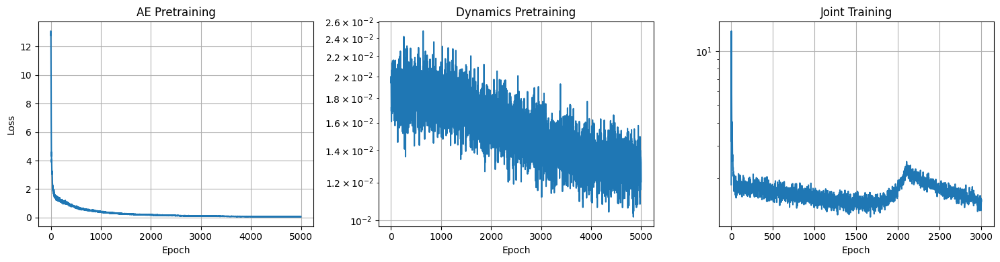

In [ ]:
"""

Pretrain the autoencoder

Trains just the encoder and decoder (leaving the dynamics network untouched) to minimize reconstruction error, 
as a first stage before the full model is trained jointly.

"""

import os
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"

# -------------------- PRETRAINING AUTOENCODER (Enc+Dec only) --------------------
from torch.optim import Adam
import itertools
import torch.nn.functional as F

ae_epochs = 5000
ae_lr = 1e-3
ae_bs = 264

encNet.train()
decNet.train()
dynNet.eval()  # not used here

opt_ae = Adam(itertools.chain(encNet.parameters(), decNet.parameters()), lr = ae_lr)

lossHist_ae = np.zeros(ae_epochs, dtype = np.float64)

print("B) Pretraining autoencoder (Enc+Dec)...")
for ep in range(1, ae_epochs + 1):

    idx = torch.randint(0, XN_train_t.shape[0], (ae_bs,), device=device)
    x = XN_train_t[idx] # normalized training states [B, 11]
    z = encNet(x)
    xrec = decNet(z)

    loss_ae = torch.mean(torch.sum((x - xrec)**2, dim = 1))

    opt_ae.zero_grad(set_to_none = True)
    loss_ae.backward()
    lossHist_ae[ep - 1] = loss_ae.item()
    opt_ae.step()

    if ep % 200 == 0:
        print(f"  AE ep {ep:4d}/{ae_epochs}  loss={loss_ae.item():.3e}")

with torch.no_grad():
  z_train = encNet(XN_train_t)
  print(f"Latent space statistics : mean{z_train.mean(0)}, std = {z_train.std(0)}")

# -------------------- PRETRAINING Dynamics (teacher forcing on Dyn) --------------------
dyn_epochs = 5000
dyn_lr = 1e-3
dyn_bs = 264
clip_norm = 1.0


encNet.eval()
decNet.eval()
dynNet.train()  # used here

opt_dyn = Adam(dynNet.parameters(), lr = dyn_lr)

lossHist_dyn = np.zeros(dyn_epochs, dtype = np.float64)

print("B2) Pretraining dynamics (Dyn only, teacher forcing in latent space)...")

Ntr = XN_train_t.shape[0]
Utr = U_train_t[:Ntr]

for ep in range(1, dyn_epochs + 1):
    valid_starts_dyn = get_valid_starts(1, block_starts_in_tensor, block_ends_in_tensor)
    idx =  sample_rollout_batch(valid_starts_dyn, dyn_bs)

    x_n   = XN_train_t[idx]
    x_np1 = XN_train_t[idx + 1]

    u_n = Utr[idx]
    if u_n.dim() == 1:
        u_n = u_n.unsqueeze(-1)  # [B,1]
    elif u_n.dim() == 2:
      pass
    else:
      raise RuntimeError(f"Unexpected u_n shape: {u_n.shape}")

    with torch.no_grad():
        z_n = encNet(x_n)
        z_np1 = encNet(x_np1)

    def rhs(zz, u = u_n):
        return dynNet(torch.cat([zz, u_n], dim=1))

    z_pred = runge_kutta(z_n, dt_years, rhs)

    loss_dyn = F.mse_loss(z_pred, z_np1)

    opt_dyn.zero_grad(set_to_none = True)
    loss_dyn.backward()
    lossHist_dyn[ep - 1] = loss_dyn.item()
    torch.nn.utils.clip_grad_norm_(dynNet.parameters(), clip_norm)
    opt_dyn.step()

    if ep % 200 == 0:
        print(f"  Dyn epoch {ep:4d}/{dyn_epochs}  loss={loss_dyn.item():.3e}")

# -------------------- TRAIN (CUSTOM LOOP) --------------------
encNet.train()
decNet.train()
dynNet.train()

optimizer = Adam(itertools.chain(encNet.parameters(), decNet.parameters(), dynNet.parameters()),
                 lr = lr, weight_decay = 1e-4)

batch_size = 264
K_train_max = 80
gamma = 0.9999 # for long-lasting accuracy

print('C) Training (encoder/decoder + latent tendency)...')

lossHist = np.zeros(numEpochs, dtype = np.float64)

prob_of_teach_forc0 = 1.0
teach_forc_decay_epochs = int(numEpochs * 0.7) # model sees dynamics for 70% of training

for epoch in range(1, numEpochs + 1):
    K_train = min(K_train_max, 5 + (epoch//200)*5) # K_max for training, the starting point of K_train_max and every 2000 epochs it increases by 5
    prob_of_teach_forc = prob_of_teach_forc0 * max(0.0, 1.0 - epoch / max(1, teach_forc_decay_epochs))
    # Forward + loss
    #idx = torch.randint(low=0, high=(XN_t.shape[0] - (K + 1)), size=(batch_size,))

    valid_starts_train = get_valid_starts(K_train, block_starts_in_tensor,
                                          block_ends_in_tensor)
    idx = sample_rollout_batch(valid_starts_train, batch_size)

    loss = loss_and_grads_rollout_sindy(encNet, decNet, dynNet, XN_train_t, U_train_t,
                                  idx, K_train, dt_years,
                                  lambdaRec, gamma = gamma, lambdaZ = 0.1,
                                  prob_of_teach_forc = prob_of_teach_forc)


    optimizer.zero_grad(set_to_none = True)
    loss.backward()

    optimizer.step()
    lossHist[epoch - 1] = float(loss.detach().cpu().numpy())

    if (epoch % printEvery) == 0:
        if XN_val_t.shape[0] > (K_train + 2):
          with torch.no_grad():
            idxtr = sample_rollout_batch(valid_starts_train, batch_size)

            train_free = loss_and_grads_rollout_sindy(encNet, decNet, dynNet,
                                        XN_train_t, U_train_t,
                                        idxtr, K_train, dt_years, lambdaRec,
                                        gamma = gamma, lambdaZ = 0.1,
                                        prob_of_teach_forc = 0.0)


            valid_starts_val = get_valid_starts(K_train,
                          val_block_starts, val_block_ends)

            idxv = sample_rollout_batch(valid_starts_val, batch_size)

            val_loss = loss_and_grads_rollout_sindy(encNet, decNet, dynNet,
                                      XN_val_t, U_val_t,
                                      idxv, K_train, dt_years, lambdaRec,
                                      gamma = gamma, lambdaZ = 0.1,
                                      prob_of_teach_forc = 0.0)

            encNet.train(); decNet.train(); dynNet.train()

          print(f"epoch {epoch:5d}/{numEpochs} "
              f"K={K_train:2d} p_tf={prob_of_teach_forc:.3f} "
              f"train_assisted={lossHist[epoch-1]:.3e} "
              f"train_free={train_free.item():.3e} "
              f"val={val_loss.item():.3e}")
        else:
          print(f"epoch {epoch:5d}/{numEpochs} train_assisted={lossHist[epoch-1]:.3e}")

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

axes[0].plot(lossHist_ae)
axes[0].set_title("AE Pretraining")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].grid(True)

axes[1].plot(lossHist_dyn)
axes[1].set_title("Dynamics Pretraining")
axes[1].set_xlabel("Epoch")
axes[1].set_yscale('log')
axes[1].grid(True)

axes[2].plot(lossHist)
axes[2].set_title("Joint Training")
axes[2].set_xlabel("Epoch")
axes[2].set_yscale('log')
axes[2].grid(True)

plt.tight_layout()
plt.show()

In [ ]:
"""
Fine-tune encoder, decoder and SINDy layer together

Defines the fine-tuning routine that jointly trains the encoder, decoder and SINDy layer (with the dynamics network kept frozen), combining reconstruction accuracy with the SINDy sparse-regression objective, and periodically hard-thresholding small coefficients to keep the discovered equations sparse.
"""

def run_sindy_finetuning(
    encNet, decNet, dynNet, sindyLayer, lib_idx,
    XN_train_t, U_train_t, XN_val_t, U_val_t,
    dt_years, latentDim, device,
    # --- Tunable hyperparameters ---
    n_epochs=2000,
    lr=3e-4,
    batch_size=264,
    K_train=20,
    gamma_decay=0.9999,
    lambdaRec=100.0,
    lambdaZ=0.1,
    lambdaSINDy=0.1,        # start moderate, increase later
    lambdaL1=1e-4,
    mask_every=200,          # hard-threshold Xi every N epochs
    mask_threshold=0.05,     # coefficients below this -> 0
    print_every=250,
):
    """
    encNet, decNet and sindyLayer are jointly fine-tuned.
    """
    # dynNet is freezed; kept as is for the rollout but not updated
    # SINDy loss only trains encNet (for better coordinate production) and sindyLayer.Xi (for sparse equation discovery).

    dynNet.eval()
    for p in dynNet.parameters():
        p.requires_grad = False

    encNet.train()
    decNet.train()
    sindyLayer.train()

    optimizer = Adam(itertools.chain(encNet.parameters(), decNet.parameters(), sindyLayer.parameters()), lr = lr)

    loss_hist = []

    print("=" * 60)
    print("JOINT SINDy FINE-TUNING")
    print(f"  epochs={n_epochs}, lr={lr}, K={K_train}")
    print(f"  lambdaSINDy={lambdaSINDy}, lambdaL1={lambdaL1}")
    print(f"  mask_every={mask_every}, mask_threshold={mask_threshold}")
    print("=" * 60)

    for epoch in range(1, n_epochs + 1):
        valid_starts_train = get_valid_starts(K_train,
                            block_starts_in_tensor, block_ends_in_tensor)
        idx = sample_rollout_batch(valid_starts_train, batch_size)

        loss = loss_and_grads_rollout_sindy(
               encNet, decNet, dynNet, XN_train_t, U_train_t,
               idx, K_train, dt_years,
               lambdaRec = lambdaRec,
               gamma = gamma_decay,
               lambdaZ = lambdaZ,
               prob_of_teach_forc  =0.0,   # no teacher forcing in fine-tuning
               sindyLayer = sindyLayer,
               lib_idx = lib_idx,
               lambdaSINDy = lambdaSINDy,
               lambdaL1 = lambdaL1,
               )

        optimizer.zero_grad(set_to_none = True)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(
            itertools.chain(encNet.parameters(), decNet.parameters(), sindyLayer.parameters()),
            1.0
        )
        optimizer.step()

        loss_val = loss.item()
        loss_hist.append(loss_val)

        if epoch % mask_every == 0:
            n_active, n_total = mask_small_coeffs(sindyLayer, mask_threshold)

        if epoch % print_every == 0:
           with torch.no_grad():
              if XN_val_t.shape[0] > (K_train + 2):

                  valid_starts_val = get_valid_starts(K_train, val_block_starts,
                                                      val_block_ends)

                  idxv = sample_rollout_batch(valid_starts_val, batch_size)
                  val_loss = loss_and_grads_rollout_sindy(
                        encNet, decNet, dynNet, XN_val_t, U_val_t,
                        idxv, K_train, dt_years,
                        lambdaRec=lambdaRec, gamma=gamma_decay,
                        lambdaZ=lambdaZ,
                        sindyLayer=sindyLayer, lib_idx=lib_idx,
                        lambdaSINDy=lambdaSINDy, lambdaL1=lambdaL1,
                    ).item()
              else:
                  val_loss = float('nan')
           n_nonzero = int((torch.abs(sindyLayer.Xi) > mask_threshold).sum().item())

           print(f"  epoch {epoch:5d}/{n_epochs}  "
                f"train={loss_val:.3e}  val={val_loss:.3e}  "
                f"Xi nonzero={n_nonzero}/{sindyLayer.Xi.numel()}")

    print("\n" + "=" * 60)
    print("Final SINDy equations:")
    print("=" * 60)
    print_sindy_equations(sindyLayer, lib_idx, latentDim, threshold=mask_threshold)

    for p in dynNet.parameters():
        p.requires_grad = True

    return loss_hist

# Auxiliary spatial decoder: z_{latent} to ψ(x, ζ).

## The goal of this part is to learn the streamfunction field from the current latent space

psi_full shape: (10001, 21, 41)
Z_train_t shape: (7950, 4)
psiN_train_t shape: (7950, 861)
[psiDec] ep    1/3000  train=8.883e-01  val=9.424e-01
[psiDec] ep  200/3000  train=1.812e-01  val=2.814e-01
[psiDec] ep  400/3000  train=1.294e-01  val=2.986e-01
[psiDec] ep  600/3000  train=1.015e-01  val=3.508e-01
[psiDec] ep  800/3000  train=8.175e-02  val=3.577e-01
[psiDec] ep 1000/3000  train=6.883e-02  val=3.854e-01
[psiDec] ep 1200/3000  train=6.057e-02  val=3.608e-01
[psiDec] ep 1400/3000  train=5.321e-02  val=3.673e-01
[psiDec] ep 1600/3000  train=4.854e-02  val=3.649e-01
[psiDec] ep 1800/3000  train=4.325e-02  val=3.776e-01
[psiDec] ep 2000/3000  train=3.969e-02  val=3.864e-01
[psiDec] ep 2200/3000  train=3.653e-02  val=3.774e-01
[psiDec] ep 2400/3000  train=3.364e-02  val=3.829e-01
[psiDec] ep 2600/3000  train=3.121e-02  val=3.874e-01
[psiDec] ep 2800/3000  train=2.913e-02  val=3.873e-01
[psiDec] ep 3000/3000  train=2.703e-02  val=3.966e-01
Best val MSE = 2.814e-01

[psi field] val RMS

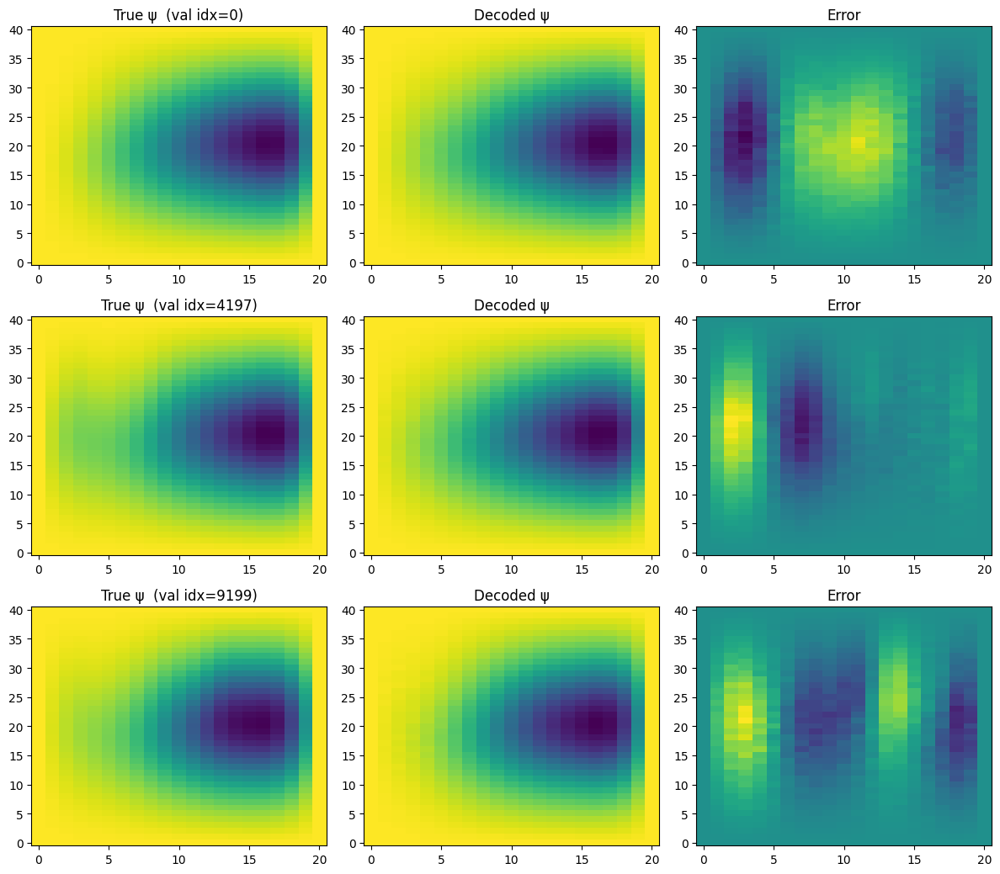

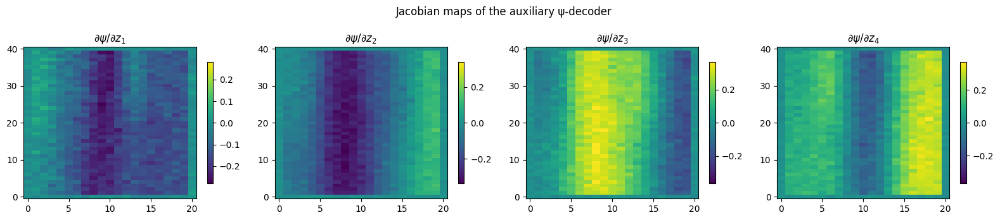

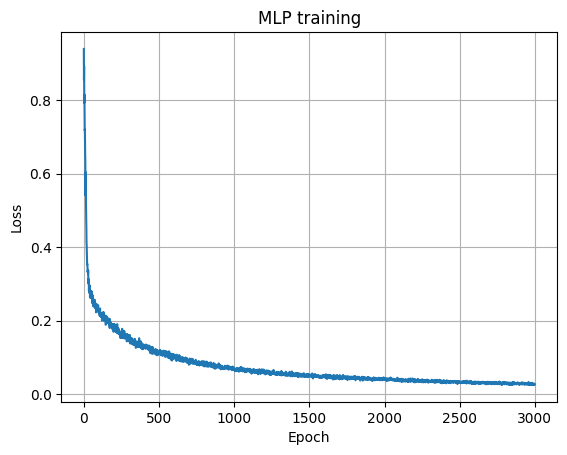

In [ ]:
"""

Extract the streamfunction field

Pulls the overturning streamfunction channel out of the model's last simulated trajectory, so it can be used to decide where in physical space it is most useful to place 'sensors' (observation points) in the sections that follow.

"""

import copy

# -----------------------------
# 0) Get the streamfunction field
# -----------------------------
assert model._last_traj is not None, "Run the Boussinesq model first so model._last_traj exists."

# channel convention in wrapper:
# [0]=vorticity, [1]=salinity, [2]=temperature, [3]=streamfunction
psi_full = np.asarray(model._last_traj[:, 3, :, :], dtype = np.float32)   # [Nt, M+1, N+1]
Nt_field, nx, nz = psi_full.shape
n_psi = nx * nz

print("psi_full shape:", psi_full.shape)

# -----------------------------
# 1) Normalize psi using TRAIN split only
# -----------------------------
psi_train = psi_full[train_idx]
psi_val   = psi_full[val_idx]

psi_mu = psi_train.mean(axis = 0, keepdims = True)             # [1, nx, nz]
psi_sd = psi_train.std(axis = 0, keepdims = True) + 1e-8       # [1, nx, nz]

psiN_full  = (psi_full  - psi_mu) / psi_sd
psiN_train = (psi_train - psi_mu) / psi_sd
psiN_val   = (psi_val   - psi_mu) / psi_sd

# flatten targets for MLP decoder
psiN_full_flat  = psiN_full.reshape(Nt_field, -1)
psiN_train_flat = psiN_train.reshape(len(train_idx), -1)
psiN_val_flat   = psiN_val.reshape(len(val_idx), -1)

psiN_full_t  = torch.tensor(psiN_full_flat,  dtype = torch.float32, device = device)
psiN_train_t = torch.tensor(psiN_train_flat, dtype = torch.float32, device = device)
psiN_val_t   = torch.tensor(psiN_val_flat,   dtype = torch.float32, device = device)

# -----------------------------
# 2) Freeze current encoder and build latent dataset
# -----------------------------
encNet = encNet.to(device).eval()
for p in encNet.parameters():
    p.requires_grad = False

with torch.no_grad():
    Z_full_t  = encNet(XN_full_t)          # [Nt, latentDim]
    Z_train_t = Z_full_t[train_idx]
    Z_val_t   = Z_full_t[val_idx]

print("Z_train_t shape:", tuple(Z_train_t.shape))
print("psiN_train_t shape:", tuple(psiN_train_t.shape))

# -----------------------------
# 3) Thin decoder z -> flattened psi field
# -----------------------------
psiDec = nn.Sequential(
    nn.Linear(latentDim, 64),
    nn.Tanh(),
    nn.Linear(64, 128),
    nn.Tanh(),
    nn.Linear(128, n_psi)
).to(device)

opt = torch.optim.Adam(psiDec.parameters(), lr=1e-3)
loss_fn = nn.MSELoss()

n_epochs = 3000
batch_size = 256
print_every = 200

best_val = np.inf
best_state = None
train_hist = []
val_hist = []
lossHist_jacob = np.zeros(n_epochs, dtype = np.float64)

psiDec.train()
for ep in range(1, n_epochs + 1):
    idx = torch.randint(0, Z_train_t.shape[0], (batch_size,), device=device)

    z_b = Z_train_t[idx]
    y_b = psiN_train_t[idx]

    yhat_b = psiDec(z_b)
    loss = loss_fn(yhat_b, y_b)

    opt.zero_grad(set_to_none=True)
    loss.backward()
    lossHist_jacob[ep - 1] = loss.item()
    opt.step()

    if ep % print_every == 0 or ep == 1:
        psiDec.eval()
        with torch.no_grad():
            train_loss = loss_fn(psiDec(Z_train_t), psiN_train_t).item()
            val_loss   = loss_fn(psiDec(Z_val_t),   psiN_val_t).item()
        train_hist.append(train_loss)
        val_hist.append(val_loss)

        if val_loss < best_val:
            best_val = val_loss
            best_state = copy.deepcopy(psiDec.state_dict())

        print(f"[psiDec] ep {ep:4d}/{n_epochs}  train={train_loss:.3e}  val={val_loss:.3e}")
        psiDec.train()

# restore best model
if best_state is not None:
    psiDec.load_state_dict(best_state)

psiDec.eval()
print(f"Best val MSE = {best_val:.3e}")

# -----------------------------
# 4) Helpers
# -----------------------------
psi_mu_t = torch.tensor(psi_mu.reshape(1, -1), dtype=torch.float32, device=device)
psi_sd_t = torch.tensor(psi_sd.reshape(1, -1), dtype=torch.float32, device=device)

@torch.no_grad()
def decode_psi_from_z(z_t):
    """
    z_t: [B, latentDim]
    returns psi_hat: [B, nx, nz] in physical units
    """
    yN = psiDec(z_t)
    y  = yN * psi_sd_t + psi_mu_t
    return y.reshape(-1, nx, nz)

@torch.no_grad()
def field_rmse(a, b):
    return torch.sqrt(torch.mean((a - b) ** 2)).item()

def r2_score_np(y_true, y_pred):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    ss_res = np.sum((y_true - y_pred)**2)
    ss_tot = np.sum((y_true - y_true.mean())**2)
    return 1.0 - ss_res / (ss_tot + 1e-12)

# -----------------------------
# 5) Validation metrics
# -----------------------------
with torch.no_grad():
    psi_val_hat_t = decode_psi_from_z(Z_val_t)                     # [Nv, nx, nz]
    psi_val_true_t = torch.tensor(psi_val, dtype=torch.float32, device=device)

    rmse_val = field_rmse(psi_val_hat_t, psi_val_true_t)

    # derived overturning strength from decoded field
    psi_max_hat = (-torch.amin(psi_val_hat_t, dim=(1, 2))).cpu().numpy()
    psi_max_true = np.asarray(X_state[val_idx, model.convention.index("psi_max")], dtype=np.float32)

    corr = np.corrcoef(psi_max_true, psi_max_hat)[0, 1]
    r2   = r2_score_np(psi_max_true, psi_max_hat)

print(f"\n[psi field] val RMSE = {rmse_val:.4e}")
print(f"[psi_max from decoded field] corr = {corr:.4f}, R2 = {r2:.4f}")

# -----------------------------
# 6) Plot a few validation snapshots
# -----------------------------
n_show = 3
show_idx = np.linspace(0, len(val_idx) - 1, n_show, dtype=int)

fig, axes = plt.subplots(n_show, 3, figsize=(12, 3.5 * n_show))
if n_show == 1:
    axes = np.array([axes])

for r, j in enumerate(show_idx):
    psi_true = psi_val[j]
    psi_hat  = psi_val_hat_t[j].detach().cpu().numpy()
    err      = psi_hat - psi_true

    vmin = min(psi_true.min(), psi_hat.min())
    vmax = max(psi_true.max(), psi_hat.max())
    emax = np.max(np.abs(err))

    im0 = axes[r, 0].imshow(psi_true.T, origin="lower", aspect="auto", vmin=vmin, vmax=vmax)
    axes[r, 0].set_title(f"True ψ  (val idx={val_idx[j]})")

    im1 = axes[r, 1].imshow(psi_hat.T, origin="lower", aspect="auto", vmin=vmin, vmax=vmax)
    axes[r, 1].set_title("Decoded ψ")

    im2 = axes[r, 2].imshow(err.T, origin="lower", aspect="auto", vmin=-emax, vmax=emax)
    axes[r, 2].set_title("Error")

plt.tight_layout()
plt.show()

# -----------------------------
# 7) Jacobian maps d psi / d z_j at one selected state
# -----------------------------
def jacobian_maps_single(decoder, z0, nx, nz):
    """
    decoder: maps [1, latentDim] -> [1, n_psi]
    z0:      [latentDim] tensor
    returns: [latentDim, nx, nz] numpy array
    """
    z0 = z0.detach().clone().requires_grad_(True)

    def f_single(zz):
        return decoder(zz.unsqueeze(0)).squeeze(0)   # [n_psi]

    J = torch.autograd.functional.jacobian(f_single, z0)  # [n_psi, latentDim]
    J = J.detach().cpu().numpy()
    J = J.reshape(nx, nz, latentDim)
    J = np.moveaxis(J, -1, 0)  # [latentDim, nx, nz]
    return J

# choose one representative validation state
k0_local = len(val_idx) // 2
z0 = Z_val_t[k0_local]
Jmaps = jacobian_maps_single(psiDec, z0, nx, nz)

fig, axes = plt.subplots(1, latentDim, figsize=(4 * latentDim, 3.5))
if latentDim == 1:
    axes = [axes]

for j in range(latentDim):
    M = Jmaps[j]
    lim = np.max(np.abs(M))
    im = axes[j].imshow(M.T, origin="lower", aspect="auto", vmin=-lim, vmax=lim)
    axes[j].set_title(f"$\\partial \\psi / \\partial z_{j+1}$")
    plt.colorbar(im, ax=axes[j], shrink=0.8)

plt.suptitle("Jacobian maps of the auxiliary ψ-decoder")
plt.tight_layout()
plt.savefig(f"{outdir}/Jacobian_maps.png", dpi = 200, bbox_inches = "tight")
plt.show()

fig, ax = plt.subplots()
ax.plot(lossHist_jacob)
ax.set_title("MLP training")
ax.set_xlabel("Epoch")
ax.set_ylabel("Loss")
ax.grid(True)
plt.show()

Using 64 reference latent states for Jacobian averaging.
J_stack shape: (64, 861, 4)

Selected ψ sensor locations:
 1. flat= 759   grid=(x=18, z=21)   score=1.5714e-01
 2. flat= 186   grid=(x= 4, z=22)   score=1.0290e-01
 3. flat= 473   grid=(x=11, z=22)   score=8.5725e-02
 4. flat= 757   grid=(x=18, z=19)   score=1.5524e-01
 5. flat= 184   grid=(x= 4, z=20)   score=1.0094e-01
 6. flat= 471   grid=(x=11, z=20)   score=8.6203e-02

Cosine similarity of selected mean gradients (closer to 0 is less redundant):
[[ 1.    -0.013 -0.272  1.     0.025 -0.238]
 [-0.013  1.     0.252  0.     0.999  0.264]
 [-0.272  0.252  1.    -0.26   0.254  0.999]
 [ 1.     0.    -0.26   1.     0.038 -0.226]
 [ 0.025  0.999  0.254  0.038  1.     0.267]
 [-0.238  0.264  0.999 -0.226  0.267  1.   ]]


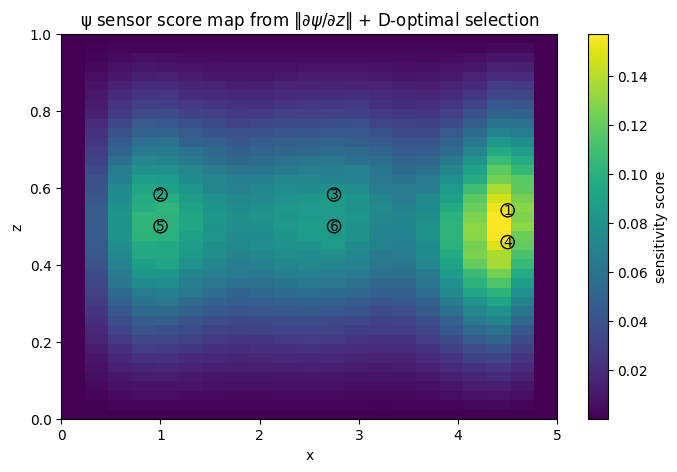

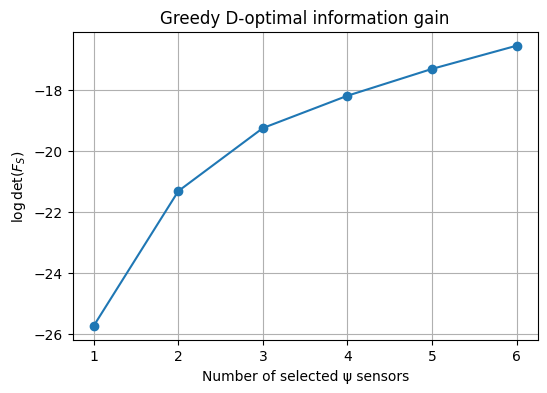

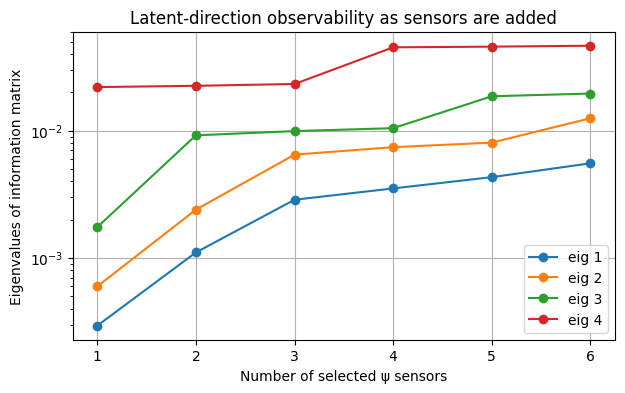


Saved results in `psi_sensor_design`.


In [ ]:
"""
Choosing where to place sensors for the streamfunction

Using a small auxiliary decoder that maps the latent state back to the full streamfunction field, this works out which physical grid locations are most informative to observe -- i.e. where placing a real-world sensor would tell us the most about the overall circulation state.
"""

assert "psiDec" in globals(), "Run the auxiliary ψ-decoder cell first."
assert "Z_val_t" in globals() or "Z_train_t" in globals(), "Need latent states from the ψ-decoder cell."

psiDec = psiDec.to(device).eval()

# ------------------------------------------------------------
# 1) Choose reference latent states where we evaluate J = dψ/dz
# ------------------------------------------------------------
Z_ref_source = Z_val_t if "Z_val_t" in globals() else Z_train_t

n_ref = min(64, Z_ref_source.shape[0])   # keep this modest for speed
ref_idx = torch.linspace(0, Z_ref_source.shape[0] - 1, steps = n_ref, device=device).long()
Z_ref_t = Z_ref_source[ref_idx]

print(f"Using {n_ref} reference latent states for Jacobian averaging.")

# ------------------------------------------------------------
# 2) Differentiable physical ψ decoder and Jacobian helper
# ------------------------------------------------------------
def psi_decoder_phys_flat_from_z1d(z1d):
    """
    z1d: [latentDim]
    returns flattened ψ field in physical units: [n_psi]
    """
    yN = psiDec(z1d.unsqueeze(0))          # [1, n_psi] normalized
    y  = yN * psi_sd_t + psi_mu_t          # [1, n_psi] physical units
    return y.squeeze(0)                    # [n_psi]

def jacobian_psi_phys(z0):
    """
    z0: [latentDim]
    returns J = dψ/dz with shape [n_psi, latentDim] in physical units
    """
    z0 = z0.detach().clone().requires_grad_(True)
    J = torch.autograd.functional.jacobian(psi_decoder_phys_flat_from_z1d, z0)
    return J.detach().cpu().numpy()

# ------------------------------------------------------------
# 3) Build Jacobian stack over reference states
# ------------------------------------------------------------
J_list = []
for k in range(n_ref):
    Jk = jacobian_psi_phys(Z_ref_t[k])     # [n_psi, latentDim]
    J_list.append(Jk)

J_stack = np.stack(J_list, axis=0)         # [n_ref, n_psi, latentDim]
n_psi = J_stack.shape[1]

print("J_stack shape:", J_stack.shape)

# ------------------------------------------------------------
# 4) Sensitivity score map
#    score(i,j) = sqrt( mean_z || dψ_ij / dz ||^2 )
# ------------------------------------------------------------
sens_flat = np.sqrt(np.mean(np.sum(J_stack**2, axis=2), axis=0))   # [n_psi]
sens_map  = sens_flat.reshape(nx, nz)

# Mean gradient vector at each candidate point (useful for similarity checks)
g_mean = J_stack.mean(axis=0)   # [n_psi, latentDim]

# ------------------------------------------------------------
# 5) Fisher information contribution for each candidate sensor
#    F_i = E_z [ h_i(z) h_i(z)^T ] / sigma_meas^2
# ------------------------------------------------------------
sigma_meas = 1.0   # same for all ψ sensors for now; change if you have a real noise model
F_cand = np.einsum("kpd,kpe->pde", J_stack, J_stack) / (n_ref * sigma_meas**2)   # [n_psi, d, d]

# ------------------------------------------------------------
# 6) Greedy D-optimal selection
#    Maximizes log det(F_S + eps I), which rewards sensitivity
#    and automatically penalizes redundant sensors.
# ------------------------------------------------------------
def flat_to_grid(p, nx, nz):
    return np.unravel_index(p, (nx, nz))

def grid_to_flat(ix, iz, nx, nz):
    return np.ravel_multi_index((ix, iz), (nx, nz))

def too_close_flat(p, selected, nx, nz, min_sep):
    if min_sep is None or min_sep <= 0:
        return False
    ix, iz = flat_to_grid(p, nx, nz)
    for q in selected:
        jx, jz = flat_to_grid(q, nx, nz)
        if np.sqrt((ix - jx)**2 + (iz - jz)**2) < min_sep:
            return True
    return False

def greedy_d_optimal(F_cand, nx, nz, n_select=6, ridge=1e-8, min_sep=2):
    d = F_cand.shape[-1]
    I = np.eye(d)
    F_sel = ridge * I
    selected = []
    logdet_hist = []
    eig_hist = []

    candidates = list(range(F_cand.shape[0]))

    for m in range(n_select):
        best_p = None
        best_val = -np.inf
        best_F = None

        for p in candidates:
            if p in selected:
                continue
            if too_close_flat(p, selected, nx, nz, min_sep=min_sep):
                continue

            F_try = F_sel + F_cand[p]
            sign, val = np.linalg.slogdet(F_try)
            if sign <= 0:
                continue

            if val > best_val:
                best_val = val
                best_p = p
                best_F = F_try

        if best_p is None:
            raise RuntimeError("No admissible candidate left. Lower n_select or min_sep.")

        selected.append(best_p)
        F_sel = best_F
        logdet_hist.append(best_val)
        eig_hist.append(np.linalg.eigvalsh(F_sel))

    return selected, F_sel, np.array(logdet_hist), np.array(eig_hist)

n_select = 6      # good first try for latentDim = 4
min_sep  = 2      # minimum spacing in grid cells; set 0 to disable

selected_flat, F_sel, logdet_hist, eig_hist = greedy_d_optimal(
    F_cand, nx=nx, nz=nz, n_select=n_select, ridge=1e-8, min_sep=min_sep
)

selected_grid = [flat_to_grid(p, nx, nz) for p in selected_flat]

print("\nSelected ψ sensor locations:")
for r, (p, (ix, iz)) in enumerate(zip(selected_flat, selected_grid), start=1):
    print(f"{r:2d}. flat={p:4d}   grid=(x={ix:2d}, z={iz:2d})   score={sens_flat[p]:.4e}")

# ------------------------------------------------------------
# 7) Redundancy check: cosine similarity of mean local gradients
# ------------------------------------------------------------
G_sel = g_mean[selected_flat]                          # [m, latentDim]
G_norm = np.linalg.norm(G_sel, axis=1, keepdims=True) + 1e-12
cos_sim = (G_sel @ G_sel.T) / (G_norm @ G_norm.T)

print("\nCosine similarity of selected mean gradients (closer to 0 is less redundant):")
print(np.round(cos_sim, 3))

# ------------------------------------------------------------
# 8) Visualize score map + chosen sensors
# ------------------------------------------------------------
if hasattr(model, "core") and hasattr(model.core, "xx") and hasattr(model.core, "zz"):
    xx = np.asarray(model.core.xx)
    zz = np.asarray(model.core.zz)
    extent = [xx.min(), xx.max(), zz.min(), zz.max()]
    x_pts = [xx[ix] for ix, iz in selected_grid]
    z_pts = [zz[iz] for ix, iz in selected_grid]

    fig, ax = plt.subplots(figsize=(8, 5))
    im = ax.imshow(sens_map.T, origin="lower", aspect="auto", extent=extent)
    ax.scatter(x_pts, z_pts, s=90, marker="o", edgecolors="k", facecolors="none")
    for r, (xp, zp) in enumerate(zip(x_pts, z_pts), start=1):
        ax.text(xp, zp, str(r), ha="center", va="center")
    ax.set_xlabel("x"); ax.set_ylabel("z")
else:
    fig, ax = plt.subplots(figsize=(8, 5))
    im = ax.imshow(sens_map.T, origin="lower", aspect="auto")
    ax.scatter([ix for ix, iz in selected_grid],
               [iz for ix, iz in selected_grid],
               s=90, marker="o", edgecolors="k", facecolors="none")
    for r, (ix, iz) in enumerate(selected_grid, start=1):
        ax.text(ix, iz, str(r), ha="center", va="center")
    ax.set_xlabel("x grid index"); ax.set_ylabel("z grid index")

ax.set_title(r"ψ sensor score map from $\|\partial \psi / \partial z\|$ + D-optimal selection")
fig.colorbar(im, ax=ax, label="sensitivity score")
fig.savefig(f"{outdir}/psi_score_sensor_map.png", dpi=200, bbox_inches="tight")
plt.show()

# ------------------------------------------------------------
# 9) Observability growth as sensors are added
# ------------------------------------------------------------
plt.figure(figsize=(6, 4))
plt.plot(np.arange(1, len(logdet_hist) + 1), logdet_hist, marker="o")
plt.grid(True)
plt.xlabel("Number of selected ψ sensors")
plt.ylabel(r"$\log \det(F_S)$")
plt.title("Greedy D-optimal information gain")
plt.show()

plt.figure(figsize=(7, 4))
for j in range(eig_hist.shape[1]):
    plt.plot(np.arange(1, eig_hist.shape[0] + 1), eig_hist[:, j], marker="o", label=f"eig {j+1}")
plt.yscale("log")
plt.grid(True)
plt.xlabel("Number of selected ψ sensors")
plt.ylabel("Eigenvalues of information matrix")
plt.title("Latent-direction observability as sensors are added")
plt.legend()
plt.show()

# ------------------------------------------------------------
# 10) Store results for later PF / thesis analysis
# ------------------------------------------------------------
psi_sensor_design = {
    "ref_idx": ref_idx.detach().cpu().numpy(),
    "J_stack": J_stack,                    # [n_ref, n_psi, latentDim]
    "sens_map": sens_map,                  # [nx, nz]
    "sens_flat": sens_flat,                # [n_psi]
    "F_cand": F_cand,                      # [n_psi, latentDim, latentDim]
    "selected_flat": np.array(selected_flat),
    "selected_grid": np.array(selected_grid),
    "cos_sim": cos_sim,
    "logdet_hist": logdet_hist,
    "eig_hist": eig_hist,
    "sigma_meas": sigma_meas,
    "min_sep": min_sep,
}

print("\nSaved results in `psi_sensor_design`.")

# SINDy

In [ ]:
"""
Reducing the forcing dimension for SINDy

The forcing input has many components (14), which would make the SINDy polynomial library impractically large. This cell notes the fix used going forward: reduce the forcing to a smaller representation (its overall magnitude, or a PCA compression) before building the polynomial library, rather than using all 14 components directly.
"""

from sklearn.decomposition import PCA  # or do it manually

# Reduce forcing to 1D via PCA (or just use the norm)
U_np_full = U_t.detach().cpu().numpy()  # [Nt-1, 14]

# Simple approach: use the L2 norm of the forcing as scalar u
U_scalar = np.linalg.norm(U_np_full, axis=1, keepdims=True)  # [Nt-1, 1]
U_scalar_mu = U_scalar.mean(axis=0, keepdims=True)
U_scalar_sd = U_scalar.std(axis=0, keepdims=True) + 1e-8
U_scalar_N  = (U_scalar - U_scalar_mu) / U_scalar_sd

U_scalar_t = torch.tensor(U_scalar_N, dtype=torch.float32, device=device)

# For SINDy, use n_vars = latentDim + 1 (z1, z2, z3, u_scalar)
# The existing _make_poly_library_indices and _eval_poly_library work unchanged.

In [ ]:
"""
Polynomial library builder

Defines helper functions that build the library of candidate polynomial terms (used by SINDy) from the latent variables and the forcing input, and evaluate that library on a given dataset.
"""

import itertools

def _make_poly_library_indices(n_vars, poly_order, include_constant = True, max_u_power = 1):
    lib = []
    u_idx = n_vars - 1
    if include_constant:
        lib.append(())
    for d in range(1, poly_order + 1):
        for comb in itertools.combinations_with_replacement(range(n_vars), d):
            if comb.count(u_idx) <= max_u_power:
                lib.append(comb)
    return lib


def _eval_poly_library(v, lib_idx):
    """Works for both torch tensors and numpy arrays."""
    N = v.shape[0]
    is_torch = isinstance(v, torch.Tensor)

    feats = []
    for comb in lib_idx:
        if len(comb) == 0:
            if is_torch:
                feats.append(torch.ones((N, 1), device=v.device, dtype=v.dtype))
            else:
                feats.append(np.ones((N, 1)))
        else:
            if is_torch:
                term = v[:, comb[0]].clone()
            else:
                term = v[:, comb[0]].copy()
            for j in comb[1:]:
                term = term * v[:, j]
            feats.append(term.reshape(N, 1))

    if is_torch:
        return torch.cat(feats, dim=1)
    return np.concatenate(feats, axis=1)


def make_sindy_rhs(Xi, lib_idx):
    """Return callable sindy_rhs(z, u) -> dz/dt."""
    def sindy_rhs(z, u):
        u_ = u.unsqueeze(1) if u.ndim == 1 else u
        v = torch.cat([z, u_], dim=1)
        Theta = _eval_poly_library(v, lib_idx)
        return Theta @ Xi
    return sindy_rhs


def stlsq(Theta, Y, lam=1e-3, n_iter=8):
    Xi = np.linalg.lstsq(Theta, Y, rcond=None)[0]
    for _ in range(n_iter):
        small = np.abs(Xi) < lam
        Xi[small] = 0.0
        for j in range(Y.shape[1]):
            big = ~small[:, j]
            if big.sum() == 0:
                continue
            Xi[big, j] = np.linalg.lstsq(Theta[:, big], Y[:, j], rcond=None)[0]
    return Xi

Polynomial library: 20 terms for 4 latent dims + 1 control
JOINT SINDy FINE-TUNING
  epochs=1000, lr=0.0001, K=20
  lambdaSINDy=0.5, lambdaL1=1e-06
  mask_every=99999, mask_threshold=0.05
  epoch   250/1000  train=1.426e+01  val=9.331e+02  Xi nonzero=73/80
  epoch   500/1000  train=1.482e+01  val=9.397e+02  Xi nonzero=73/80
  epoch   750/1000  train=1.272e+01  val=1.018e+03  Xi nonzero=73/80
  epoch  1000/1000  train=1.505e+01  val=1.005e+03  Xi nonzero=74/80

Final SINDy equations:
  dz1/dt = +12.9598*1 -0.6976*z1 +2.2844*z2 -5.1396*z3 -0.5054*z4 +1.1605*u -0.2347*z1*z1 -0.0726*z1*z2 -0.9106*z1*z4 -0.1842*z1*u -0.1786*z2*z2 -0.4643*z2*z3 -0.2742*z2*z4 +0.2541*z2*u -0.3102*z3*z3 -0.3791*z3*z4 -0.7032*z3*u +0.2796*z4*u
  dz2/dt = +5.5121*1 -2.0853*z1 -0.2550*z2 +0.7342*z3 -0.7491*z4 +0.2942*u +0.3019*z1*z3 +0.1546*z1*z4 -0.2538*z1*u -0.0573*z2*z2 -0.7449*z2*z3 +0.5562*z2*u -0.1089*z3*z3 -0.3401*z3*z4 +0.3611*z3*u -0.3382*z4*z4 +0.4237*z4*u
  dz3/dt = +21.6634*1 -1.6913*z1 +0.9812*z2 -6.

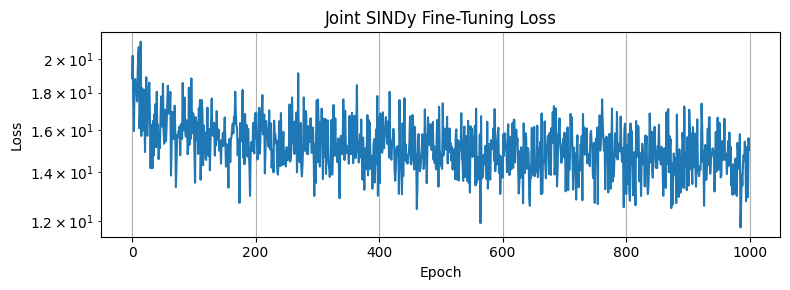

POST-HOC SINDy (fitted after training, no encoder feedback):

Post-hoc STLSQ:
  dz1/dt = +12.9378*1 -0.7099*z1 +2.3111*z2 -5.1436*z3 -0.5299*z4 +1.1427*u -0.2785*z1*z1 -0.0537*z1*z2 +0.0558*z1*z3 -0.9345*z1*z4 -0.2145*z1*u -0.1660*z2*z2 -0.4606*z2*z3 -0.2586*z2*z4 +0.2767*z2*u -0.3095*z3*z3 -0.3878*z3*z4 -0.6721*z3*u -0.0466*z4*z4 +0.2853*z4*u
  dz2/dt = +5.5586*1 -2.1219*z1 -0.1885*z2 +0.7983*z3 -0.7228*z4 +0.2867*u +0.0241*z1*z1 -0.0245*z1*z2 +0.2816*z1*z3 +0.1988*z1*z4 -0.2338*z1*u -0.0564*z2*z2 -0.7210*z2*z3 -0.0284*z2*z4 +0.5472*z2*u -0.0607*z3*z3 -0.3324*z3*z4 +0.3538*z3*u -0.2729*z4*z4 +0.4481*z4*u
  dz3/dt = +21.7012*1 -1.7197*z1 +0.9635*z2 -6.4779*z3 +1.4148*z4 +1.0459*u -0.2388*z1*z1 -0.0165*z1*z2 +0.7942*z1*z3 +0.0410*z1*z4 +0.2423*z1*u -0.2803*z2*z2 +0.1476*z2*z3 -0.6454*z2*z4 +0.5409*z2*u -0.6951*z3*z3 -0.6529*z3*z4 -1.5031*z3*u -0.9587*z4*z4 -0.4531*z4*u
  dz4/dt = -9.6123*1 +1.3429*z1 +0.2767*z2 +0.4797*z3 -0.9463*z4 +0.1680*z1*z1 +0.1114*z1*z2 -0.5880*z1*z3 +0.0940*z1*z

In [ ]:
"""
Fit the SINDy coefficients

Builds the polynomial term library for the current latent dimension and forcing, then fits an initial guess for the SINDy coefficients using a standard sequential least-squares approach; this fit is used to warm-start the coefficients before the full joint training.
"""

poly_order = 2
include_constant = True
max_u_power = 1
n_vars = latentDim + 1  # z1, z2, z3, u

lib_idx = _make_poly_library_indices(
    n_vars, poly_order,
    include_constant=include_constant,
    max_u_power=max_u_power
)

n_library = len(lib_idx)
print(f"Polynomial library: {n_library} terms for {latentDim} latent dims + 1 control")

# --- Post-hoc STLSQ fit (used to warm-start Xi) ---
with torch.no_grad():
    Xtruth_t = torch.tensor(Xtruth_state, dtype=torch.float32, device=device)
    mu_t = torch.tensor(mu, dtype=torch.float32, device=device)
    sd_t = torch.tensor(sd, dtype=torch.float32, device=device)
    XtruthN_t = (Xtruth_t - mu_t) / (sd_t + 1e-12)
    Z_all = encNet(XtruthN_t).detach().cpu().numpy()
    U_all = U_t.detach().cpu().numpy()

Zt = Z_all[:-1]
Ut = U_all
dZdt = (Z_all[1:] - Z_all[:-1]) / float(dt_years)
V = np.concatenate([Zt, Ut], axis=1)
Theta = _eval_poly_library(V, lib_idx)
Xi_numpy = stlsq(Theta, dZdt, lam=1e-2, n_iter=10)

# --- Step 2: (Optional) Initialize Xi from your post-hoc STLSQ fit ---
# If you've already run cell 33 and have Xi_numpy, use it as warm start:
#
#   sindyLayer = SINDyLayer(n_library, latentDim, init_Xi=Xi_numpy).to(device)
#
# Otherwise start from scratch:
sindyLayer = SINDyLayer(n_library, latentDim, init_Xi = Xi_numpy).to(device)

# --- Step 3: Run fine-tuning ---
sindy_loss_hist = run_sindy_finetuning(
    encNet, decNet, dynNet, sindyLayer, lib_idx,
    XN_train_t, U_train_t, XN_val_t, U_val_t,
    dt_years, latentDim, device,
    # --- Key hyperparameters to experiment with ---
    n_epochs = 1000, # start with 2000, increase if loss still dropping
    lr = 1e-4, # lower than initial training (fine-tuning)
    batch_size = 264,
    K_train = 20, # match your existing K
    lambdaRec = 500.0, # keep same as your original training
    lambdaSINDy = 0.5, # THE key new hyperparameter — start here
    lambdaL1 = 1e-6, # sparsity pressure — increase for sparser Xi
    mask_every = 99999, # hard threshold frequency
    mask_threshold = 0.05, # coefficients below this get zeroed
)

# --- Step 4: Plot fine-tuning loss ---

fig, ax = plt.subplots(figsize=(8, 3))
ax.semilogy(sindy_loss_hist)
ax.set_xlabel("Epoch")
ax.set_ylabel("Loss")
ax.set_title("Joint SINDy Fine-Tuning Loss")
ax.grid(True)
plt.tight_layout()
plt.show()

# --- Step 5: Build the SINDy RHS for the particle filter ---
Xi_joint = sindyLayer.Xi.detach()
sindy_rhs_joint = make_sindy_rhs(Xi_joint, lib_idx)

# Now you can use sindy_rhs_joint in run_pf_once by replacing sindy_rhs:
#   sindy_rhs = sindy_rhs_joint
#
# Then run your particle filter as usual.


# %%  ==================== CELL F: COMPARE POST-HOC vs JOINT ====================
# Print both sets of equations side by side for your thesis.

print("=" * 60)
print("POST-HOC SINDy (fitted after training, no encoder feedback):")
print("=" * 60)
# Refit post-hoc for fair comparison (encoder may have changed)

with torch.no_grad():
    Xtruth_t = torch.tensor(Xtruth_state, dtype=torch.float32, device=device)
    mu_t = torch.tensor(mu, dtype=torch.float32, device=device)
    sd_t = torch.tensor(sd, dtype=torch.float32, device=device)
    XtruthN_t = (Xtruth_t - mu_t) / (sd_t + 1e-12)
    Z_post = encNet(XtruthN_t).detach().cpu().numpy()
    U_post = U_t.detach().cpu().numpy()

import numpy as np
Zt_ = Z_post[:-1]
Ut_ = U_post
dZdt_ = (Z_post[1:] - Z_post[:-1]) / float(dt_years)
V_ = np.concatenate([Zt_, Ut_], axis=1)
Theta_ = _eval_poly_library(V_, lib_idx)
Xi_posthoc = stlsq(Theta_, dZdt_, lam=1e-2, n_iter=10)

# Build term names
var_names = [f"z{i+1}" for i in range(latentDim)] + ["u"]
term_names = []
for comb in lib_idx:
    if len(comb) == 0:
        term_names.append("1")
    else:
        term_names.append("*".join(var_names[j] for j in comb))

print("\nPost-hoc STLSQ:")
for j in range(latentDim):
    terms = [f"{Xi_posthoc[i,j]:+.4f}*{term_names[i]}"
             for i in range(len(term_names)) if abs(Xi_posthoc[i,j]) > 0.01]
    print(f"  dz{j+1}/dt = {' '.join(terms) if terms else '0'}")

print(f"\n  Nonzero coeffs: {np.count_nonzero(np.abs(Xi_posthoc) > 0.01)} / {Xi_posthoc.size}")

print("\n" + "=" * 60)
print("JOINT-TRAINED SINDy (encoder learned sparse-friendly coordinates):")
print("=" * 60)
print_sindy_equations(sindyLayer, lib_idx, latentDim, threshold=0.01)
Xi_joint_np = sindyLayer.Xi.detach().cpu().numpy()
print(f"\n  Nonzero coeffs: {np.count_nonzero(np.abs(Xi_joint_np) > 0.01)} / {Xi_joint_np.size}")

# Validation pipeline

,split,metric,value
0,train,recon_rmse,0.012154
1,val,recon_rmse,0.073028
2,train,1step_rmse,0.016818
3,val,1step_rmse,0.078716
4,train,H1_rmse,0.014098
5,train,H1_skill,-2.305723
6,val,H1_rmse,0.071997
7,val,H1_skill,-18.725786
8,train,H5_rmse,0.030055
9,train,H5_skill,0.011470


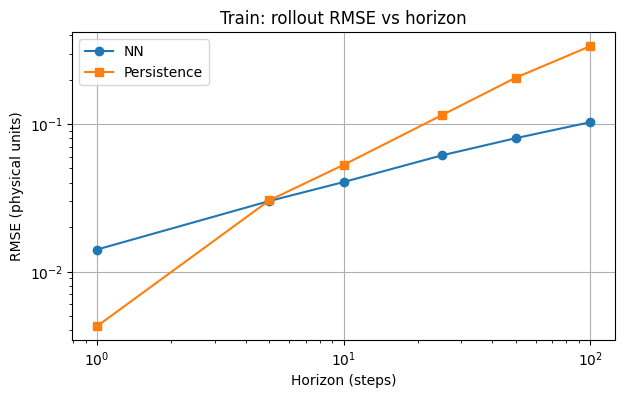

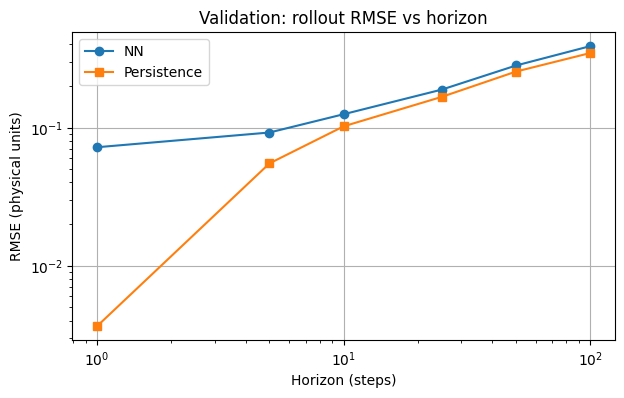


Per-variable reconstruction RMSE on validation:
  psi_max: 0.072207
  psi_north: 0.029920
  psi_south: 0.030722
  S_mean: 0.000000
  S_north_surf: 0.001231
  S_south_surf: 0.001411
  S_deep: 0.000992
  T_north_surf: 0.000768
  T_south_surf: 0.000878
  T_mean: 0.000196
  w_rms : 0.228128
  delta_rho: 0.001769
  psi_min: 0.071743
  psi_mid: 0.102037


In [ ]:
"""
Evaluate reconstruction on the validation period

Defines helper functions (RMSE, R-squared, an RK4 step) and uses them to check how well the trained encoder/decoder reconstructs each state variable on the held-out validation segment -- a check of the model's ability to generalize to time periods it wasn't trained on.
"""

# This section evaluates generalization on the held-out (future) validation segment.

var_names = list(model.convention) # 11 state variables

mu_t = torch.tensor(mu, dtype = torch.float32, device = device)
sd_t = torch.tensor(sd, dtype = torch.float32, device = device)

def rmse(a, b, axis=  None):
    a = np.asarray(a); b = np.asarray(b)
    return np.sqrt(np.mean((a - b) ** 2, axis=axis))

def r2_1d(y_true, y_pred):
    y_true = np.asarray(y_true); y_pred = np.asarray(y_pred)
    ss_res = np.sum((y_true - y_pred) ** 2)
    ss_tot = np.sum((y_true - y_true.mean()) ** 2)
    return 1.0 - ss_res / (ss_tot + 1e-8)

def rk4_step(z, u):
    rhs = lambda zz: dynNet(torch.cat([zz, u], dim=1))
    return runge_kutta(z, dt_years, rhs)

def to_physical(XN_t):
    return (XN_t * sd_t + mu_t).cpu().numpy()

@torch.no_grad()
def reconstruction_metrics(XN_set_t, split_name="val"):
    Z = encNet(XN_set_t)
    XN_rec = decNet(Z)

    X_true = to_physical(XN_set_t)
    X_rec  = to_physical(XN_rec)

    per_rmse = {vn: rmse(X_true[:, i], X_rec[:, i]) for i, vn in enumerate(var_names)}
    per_r2   = {vn: r2_1d(X_true[:, i], X_rec[:, i]) for i, vn in enumerate(var_names)}

    out = {
        "split": split_name,
        "rmse_all": rmse(X_true, X_rec),
        "nrmse_mean": float(np.mean([rmse(X_true[:,i], X_rec[:,i]) / (np.std(X_true[:,i]) + 1e-8) for i in range(len(var_names))])),
        "r2_median": float(np.median(list(per_r2.values()))),
        "per_var_rmse": per_rmse,
        "per_var_r2": per_r2,
    }
    return out, X_true, X_rec

@torch.no_grad()
def one_step_metrics(XN_set_t, U_set_t, split_name = "val", max_points = 5000):
    N = XN_set_t.shape[0] - 1
    if N <= 0:
        return None

    step = max(1, int(np.ceil(N / max_points)))
    idx = torch.arange(0, N, step, device = device)

    x0 = XN_set_t[idx]
    x1_true = XN_set_t[idx + 1]
    u0 = U_set_t[idx]
    if u0.dim() == 1:
        u0 = u0.unsqueeze(-1)

    z0 = encNet(x0)
    z1 = rk4_step(z0, u0)
    x1_pred = decNet(z1)

    X_true = to_physical(x1_true)
    X_pred = to_physical(x1_pred)
    X_pers = to_physical(x0) # persistence baseline

    out = {
        "split": split_name,
        "rmse_all": rmse(X_true, X_pred),
        "rmse_persistence": rmse(X_true, X_pers),
        "skill_vs_persistence": float(1.0 - rmse(X_true, X_pred) / (rmse(X_true, X_pers) + 1e-8)),
        "n_points": int(X_true.shape[0]),
        "per_var_rmse": {vn: rmse(X_true[:, i], X_pred[:, i]) for i, vn in enumerate(var_names)},
    }

    # Inside one_step_metrics, after computing X_true and X_pred:
    Y_true = obs_candidates_torch(torch.tensor(X_true.T, device = device, dtype = torch.float32)).cpu().numpy()
    Y_pred = obs_candidates_torch(torch.tensor(X_pred.T, device = device, dtype = torch.float32)).cpu().numpy()
    out["per_obs_rmse"] = {name: rmse(Y_true[i], Y_pred[i]) for i, name in enumerate(ObsNames)}

    return out

@torch.no_grad()
def multistep_metrics(XN_set_t, U_set_t, horizons = (1,5,10,25,50,100), stride = 10, max_starts = 2000, split_name = "val"):
    N = XN_set_t.shape[0]
    results = {}

    for H in horizons:
        max_start = N - H
        if max_start <= 1:
            continue

        starts = torch.arange(0, max_start, stride, device = device)
        if starts.numel() > max_starts:
            sel = torch.linspace(0, starts.numel() - 1, max_starts, device = device).long()
            starts = starts[sel]

        x0 = XN_set_t[starts]
        z = encNet(x0)

        for h in range(H):
            u = U_set_t[starts + h]
            if u.dim() == 1:
                u = u.unsqueeze(-1)
            z = rk4_step(z, u)

        xH_pred = decNet(z)
        xH_true = XN_set_t[starts + H]

        X_true = to_physical(xH_true)
        X_pred = to_physical(xH_pred)
        X_pers = to_physical(x0)   # persistence baseline

        results[int(H)] = {
            "split": split_name,
            "rmse_all": rmse(X_true, X_pred),
            "rmse_persistence": rmse(X_true, X_pers),
            "skill_vs_persistence": float(1.0 - rmse(X_true, X_pred) / (rmse(X_true, X_pers) + 1e-8)),
            "n_starts": int(X_true.shape[0]),
        }

        # Inside one_step_metrics, after computing X_true and X_pred:
        Y_true = obs_candidates_torch(torch.tensor(X_true.T, device = device, dtype = torch.float32)).cpu().numpy()
        Y_pred = obs_candidates_torch(torch.tensor(X_pred.T, device = device, dtype = torch.float32)).cpu().numpy()
        results[int(H)]["per_obs_rmse"] = {name: rmse(Y_true[i], Y_pred[i]) for i, name in enumerate(ObsNames)}

    return results

# Run validation
encNet.eval(); decNet.eval(); dynNet.eval()

recon_tr, _, _ = reconstruction_metrics(XN_train_t, "train")
recon_va, Xva_true, Xva_rec = reconstruction_metrics(XN_val_t,   "val")

one_tr = one_step_metrics(XN_train_t, U_train_t, "train")
one_va = one_step_metrics(XN_val_t,   U_val_t,   "val")

roll_tr = multistep_metrics(XN_train_t, U_train_t, split_name="train")
roll_va = multistep_metrics(XN_val_t,   U_val_t,   split_name="val")

# Summary table
def summary_row(split, metric, value):
    return {"split": split, "metric": metric, "value": value}

rows = [
    summary_row("train", "recon_rmse", recon_tr["rmse_all"]),
    summary_row("val",   "recon_rmse", recon_va["rmse_all"]),
    summary_row("train", "1step_rmse", one_tr["rmse_all"]),
    summary_row("val",   "1step_rmse", one_va["rmse_all"]),
]
for H in sorted(roll_va.keys()):
    for split, rd in [("train", roll_tr), ("val", roll_va)]:
        if H in rd:
            rows.append(summary_row(split, f"H{H}_rmse", rd[H]["rmse_all"]))
            rows.append(summary_row(split, f"H{H}_skill", rd[H]["skill_vs_persistence"]))

summary_df = pd.DataFrame(rows)
display(summary_df)

# Plot rollout error curves (NN vs persistence)
def plot_rollout(roll_dict, title):
    Hs = np.array(sorted(roll_dict.keys()), dtype = int)
    nn_rmse = np.array([roll_dict[h]["rmse_all"] for h in Hs])
    pers_rmse = np.array([roll_dict[h]["rmse_persistence"] for h in Hs])

    plt.figure(figsize=(7,4))
    plt.plot(Hs, nn_rmse, marker='o', label='NN')
    plt.plot(Hs, pers_rmse, marker='s', label='Persistence')
    plt.xscale('log')
    plt.yscale('log')
    plt.grid(True)
    plt.xlabel("Horizon (steps)")
    plt.ylabel("RMSE (physical units)")
    plt.title(title)
    plt.legend()
    plt.show()

plot_rollout(roll_tr, "Train: rollout RMSE vs horizon")
plot_rollout(roll_va, "Validation: rollout RMSE vs horizon")

# Quick per-variable reconstruction RMSE print (validation)
print("\nPer-variable reconstruction RMSE on validation:")
for vn, e in recon_va["per_var_rmse"].items():
    print(f"  {vn:6s}: {e:.6f}")


In [ ]:
"""
Rollout diagnostics

Checks the one-step prediction accuracy of the trained dynamics network by comparing its predicted latent-space change against the actual encoded change, using one Runge-Kutta step, and reporting the resulting error relative to the natural scale of the latent changes.
"""

encNet.to(device).eval()
decNet.to(device).eval()
dynNet.to(device).eval()

with torch.no_grad():
  # Same normalized series used for training
  X_seq = XN_t.to(device)
  U_seq = U_t.to(device)

  z0 = encNet(X_seq[:-1])
  z1_t = encNet(X_seq[1:])
  dz_true = z1_t - z0

  u0 = U_seq

  # 1-step prediction using RK4

  rhs = lambda zz: dynNet(torch.cat([zz, u0], dim=1))
  z1_p = runge_kutta(z0, dt_years, rhs)

  dz_pred = z1_p - z0

  scale_true = dz_true.std().item()
  scale_pred = dz_pred.std().item()
  rmse_1step = torch.sqrt(torch.mean((z1_p - z1_t)**2)).item()

print(f"[latent] std(dz_true)={scale_true:.4e}  std(dz_pred)={scale_pred:.4e}  1-step RMSE(z)={rmse_1step:.4e}")
print(f"[latent] ratio std(dz_true)/std(dz_pred) = {scale_true/(scale_pred+1e-12):.3f}")

[latent] std(dz_true)=1.3057e-01  std(dz_pred)=7.2371e-02  1-step RMSE(z)=1.3593e-01
[latent] ratio std(dz_true)/std(dz_pred) = 1.804


In [ ]:
"""
Multi-step error growth

Checks how prediction error grows as rollouts get longer (1, 5, 10, 25, 50 and 100 steps), by starting from the true latent state at each point in time and rolling the dynamics network forward purely on its own predictions. This shows whether errors stay small over realistic forecast horizons or blow up quickly.
"""

encNet = encNet.to(device).eval()
dynNet = dynNet.to(device).eval()

with torch.no_grad():
    X_seq = XN_t.to(device) # [Nt,11] normalized (same used in training)
    U_seq = U_t.to(device)  # [Nt,1]

    z_true = encNet(X_seq) # [Nt,L]

    Horizon_list = [1, 5, 10, 25, 50, 100]
    errs = {}
    N_u = U_seq.shape[0]

    for H in Horizon_list:
        n_starts = N_u - H + 1
        z = z_true[:n_starts].clone() # start from true latent at time n
        for h in range(H):
            # use forcing u_n for step n->n+1
            u = U_seq[h : h + n_starts]
            rhs = lambda zz: dynNet(torch.cat([zz, u], dim=1))
            z = runge_kutta(z, dt_years, rhs)

        err = torch.sqrt(torch.mean((z - z_true[H : H + n_starts])**2)).item()
        errs[H] = err

print("latent RMSE vs horizon:", errs)


latent RMSE vs horizon: {1: 0.13593408465385437, 5: 0.26236918568611145, 10: 0.3450687527656555, 25: 0.5487537980079651, 50: 0.8341702818870544, 100: 1.2409040927886963}


In [ ]:
"""
Particle-distribution plotting helper

Defines a function that plots the weighted distribution of a set of particle samples (as a histogram and a kernel density estimate), together with the true value, for visualizing how spread out the particle filter's estimates are at a given point in time.
"""

from scipy.stats import gaussian_kde

def plot_pdf_1d(samples, weights=None, bins=40, kde=True, ax=None, true=None, title=None):
    s = np.asarray(samples).ravel()

    if weights is None:
        w = np.ones_like(s, dtype=float) / len(s)
    else:
        w = np.asarray(weights).ravel().astype(float)
        w = w / (w.sum() + 1e-30)

    if ax is None:
        import matplotlib.pyplot as plt
        fig, ax = plt.subplots(figsize=(7,4))

    ax.hist(s, bins = bins, weights = w, density = True, alpha = 0.35, edgecolor = "none", label = "weighted hist")

    if kde:
        # if data is (nearly) a delta function, skip KDE
        if np.std(s) < 1e-10 or np.unique(s).size < 3:
            kde = False

    if kde:
        try:
            kde_est = gaussian_kde(s, weights=w)
            xx = np.linspace(np.percentile(s, 0.5), np.percentile(s, 99.5), 400)
            ax.plot(xx, kde_est(xx), label="KDE")
        except np.linalg.LinAlgError:
            # fallback: jitter *just for KDE*, keep histogram as-is
            sj = s + 1e-6 * np.random.randn(*s.shape)
            kde_est = gaussian_kde(sj, weights=w)
            xx = np.linspace(np.percentile(sj, 0.5), np.percentile(sj, 99.5), 400)
            ax.plot(xx, kde_est(xx), label="KDE (jittered)")

    if true is not None:
        ax.axvline(true, color = "k", linestyle="--", label="truth")

    ax.set_ylabel("density")
    ax.grid(True, alpha=0.3)
    ax.legend()
    if title: ax.set_title(title)
    return ax

# Helpers for Partilce Filter

In [ ]:
"""
Particle filter

Defines the main particle-filter routine and its statistical diagnostics: it propagates a set of particles forward using the trained dynamics network, compares their predicted observations against noisy synthetic observations, updates and resamples the particle weights, and computes standard consistency checks (like the normalized innovation statistic) to verify the filter's noise settings are well-calibrated.
"""

import os
os.environ["CUDA_LAUNCH_BLOCKING"] = "0"

# ──────────────────────────────────────────────────────────────────────
# Standard Normalized Innovation Squared (Bar-Shalom, Li & Kirubarajan
# 2001, §5.4). Computed on PRIOR particles, before any guided-proposal
# nudge or weight update.
#
#     ν_k = y_obs_k − E_w[ŷ_k]
#     S_k = Cov_w(ŷ_k) + R           (ensemble-implied innovation cov)
#     NIS_k = ν_k^T S_k^{-1} ν_k     ~ χ²_d  under correct specification
#
# So  E[NIS]=d, Var[NIS]=2d, 95% CI = [χ²_{d,0.025}, χ²_{d,0.975}].
# Verified empirically against χ²_d on synthetic Gaussian innovations
# (KS p > 0.05 for d∈{2,3,4}, N_part∈{100…4000}).
# ──────────────────────────────────────────────────────────────────────
def compute_nis_standard(yhat_prior, w_prior, y_obs, sig_obs, jitter=1e-10):
    """
    Standard NIS via Cholesky solve.

    Parameters
    ----------
    yhat_prior : Tensor (d, Npart)   PRIOR per-particle predicted obs
    w_prior    : Tensor (Npart,)     particle weights at start of step
    y_obs      : Tensor (d,) or (d,1)
    sig_obs    : Tensor (d,)         per-component obs-noise std

    Returns
    -------
    nis        : float               ~ χ²_d under correct specification
    """
    d, Npart = yhat_prior.shape
    device, dtype = yhat_prior.device, yhat_prior.dtype
    y_obs   = y_obs.view(-1).to(device=device, dtype=dtype)
    sig_obs = sig_obs.view(-1).to(device=device, dtype=dtype)
    w_prior = w_prior.to(device=device, dtype=dtype)

    y_pred_mean = (w_prior[None, :] * yhat_prior).sum(dim=1)        # (d,)
    nu  = y_obs - y_pred_mean                                       # (d,)
    dev = yhat_prior - y_pred_mean[:, None]                         # (d, Npart)
    HPHt = (dev * w_prior[None, :]) @ dev.T                         # (d, d)
    HPHt = 0.5 * (HPHt + HPHt.T)                                    # symmetrise
    R = torch.diag(sig_obs ** 2)
    S = HPHt + R + jitter * torch.eye(d, device=device, dtype=dtype)
    try:
        L = torch.linalg.cholesky(S)
        x = torch.linalg.solve_triangular(L, nu.unsqueeze(-1), upper=False)
        return (x.squeeze(-1) ** 2).sum().item()
    except Exception:
        return (nu @ torch.linalg.pinv(S) @ nu).item()


encNet = encNet.to(device).eval()
decNet = decNet.to(device).eval()
dynNet = dynNet.to(device).eval()

nCand = len(ObsNames)
Nt = Xtruth_state.shape[0]
nX = Xtruth_state.shape[1]
name_to_idx = {nm: i for i, nm in enumerate(ObsNames)}
eps = 1e-30

# Noisy observations
Xtruth_t = torch.tensor(Xtruth_state, dtype = torch.float32, device = device)
with torch.no_grad():
    Ytruth_all_t = obs_candidates_torch(Xtruth_t.T)
noise_t = sig_all_t[:, None] * torch.randn(nCand, Nt, device=device)
Yobs_all_t = Ytruth_all_t + noise_t
Yobs_all_t[name_to_idx["delta_rho"]] = torch.clamp(
    Yobs_all_t[name_to_idx["delta_rho"]], 0.0, 1.0
)


def systematic_resample_torch(w):
    N = w.numel()
    w = w / (w.sum() + 1e-30)
    cdf = torch.cumsum(w, dim=0)
    cdf[-1] = 1.0
    u0 = torch.rand((), device = w.device, dtype = w.dtype) / N
    u = u0 + torch.arange(N, device = w.device, dtype = w.dtype) / N
    idx = torch.searchsorted(cdf, u, right = False)
    return torch.clamp(idx, 0, N - 1).long()


def decode_and_observe(Zp):
    """Decode latent -> physical -> candidate observations."""
    with torch.no_grad():
        XpN_t = decNet(Zp.T.float())
        Xp_t = (XpN_t * sd_t + mu_t).T
        Yp_all_t = obs_candidates_torch(Xp_t)
    return Xp_t, Yp_all_t


def check_finite(tensor, name, k):
    if not torch.isfinite(tensor).all():
        print(f"[NaN] {name} non-finite at k={k}")
        return False
    return True


def maybe_rejuvenate(Zp, z_std_min=1e-2, rejuv_z=5e-2):
    if Zp.std(dim=1).mean() < z_std_min:
        Zp = Zp + rejuv_z * torch.randn_like(Zp)
    return Zp


def enkf_proposal(Zp, yhat_t, yk_t, w, sig_t,
                  nudge_gamma = 0.1, nudge_alpha = 1.0, jitter = 1e-5):
    """EnKF-style nudge of latent particles toward observations."""
    w_norm = w / (w.sum() + eps)

    z_bar = (Zp * w_norm[None, :]).sum(dim=1, keepdim=True)
    y_bar = (yhat_t * w_norm[None, :]).sum(dim=1, keepdim=True)

    Zc = Zp - z_bar
    Yc = yhat_t - y_bar

    Pzy = (Zc * w_norm[None, :]) @ Yc.T
    Pyy = (Yc * w_norm[None, :]) @ Yc.T

    B = Pyy.shape[0]
    sig_vec = sig_t.reshape(-1)
    R = torch.diag((sig_vec**2) / nudge_gamma + 1e-12)
    Pyy = 0.5 * (Pyy + Pyy.T) + R
    ridge = jitter + 1e-6 * (torch.trace(Pyy).abs() / (B + 1e-12))
    A = Pyy + ridge * torch.eye(B, device=device, dtype=Pyy.dtype)

    try:
        K = torch.linalg.solve(A, Pzy.T).T
    except Exception:
        K = (torch.linalg.pinv(A) @ Pzy.T).T

    y_pert = yk_t + (sig_t / torch.sqrt(
        torch.tensor(nudge_gamma, device = device))) * torch.randn_like(yhat_t)
    innov = y_pert - yhat_t

    Zp = Zp + nudge_alpha * (K @ innov)
    Zp = torch.tanh(Zp / 12.0) * 12.0
    return maybe_rejuvenate(Zp)


def reseed_collapsed_particles(Zp, w, Xp_t, Yp_all_t,
                                J_selected=None,
                                spread_threshold = 0.02):
    """Re-seed particles if obs spread collapses relative to noise."""
    _Np = Zp.shape[1]
    obs_spread = Yp_all_t.std(dim=1)

    if J_selected is not None:
        J_idx = torch.as_tensor(J_selected, device=obs_spread.device, dtype=torch.long)
        check_spread = obs_spread[J_idx]
        check_sigma  = sig_all_t[J_idx]
    else:
        check_spread = obs_spread
        check_sigma  = sig_all_t

    min_spread_ratio = check_spread / (check_sigma + 1e-12)

    if min_spread_ratio.min().item() >= spread_threshold:
        return Zp, False

    n_reseed = max(_Np // 5, 10)
    reseed_idx = torch.randperm(_Np, device = device)[:n_reseed]

    xmean = (Xp_t @ w).unsqueeze(1)
    xstd_prior = torch.tensor(
        Xtruth_state.std(axis = 0), dtype = torch.float32, device = device
    ).unsqueeze(1)
    x_new = xmean + 0.5 * xstd_prior * torch.randn(nX, n_reseed, device = device)
    x_new_norm = (x_new.T - mu_t) / (sd_t + 1e-12)

    with torch.no_grad():
        z_new = encNet(x_new_norm.float()).T
    Zp[:, reseed_idx] = z_new
    return Zp, True


def log_pf_step(k, J, Yp_all_prior_t, w_prior, Yp_all_t, w,
                Ytruth_all_t, Yobs_all_t, Zp, Xp_t):
    """Snapshot diagnostics + prior/posterior PDF plots."""
    with torch.no_grad():
        z_std = Zp.std(dim=1).mean().item()
        x_std = Xp_t.std(dim=1).mean().item()
        y_std = Yp_all_t.std(dim=1).mean().item()
    print(f"[DEBUG] k={k}: mean std(Z)={z_std:.3e}, "
          f"mean std(X)={x_std:.3e}, mean std(Y)={y_std:.3e}")

    per_obs_std = Yp_all_t.std(dim=1).detach().cpu().numpy()
    print("[DEBUG] per-obs std: " +
          ", ".join(f"{ObsNames[i]}={per_obs_std[i]:.3e}" for i in range(nCand)))

    print(f"\n--- k={k}  selected J={[ObsNames[int(x)] for x in J]} ---")
    for j_obs, name in enumerate(ObsNames):
        y_true = Ytruth_all_t[j_obs, k].item()
        y_obs = Yobs_all_t[j_obs, k].item()

        # Prior PDF
        y_prior = Yp_all_prior_t[j_obs, :].detach().cpu().numpy()
        w_prior_np = w_prior.detach().cpu().numpy()
        plot_pdf_1d(y_prior, w_prior_np, true=y_true,
                    title=f"Prior PDF obs[{name}] at k={k}")
        plt.axvline(y_obs, color="tab:cyan", ls="--", label="noisy obs")
        plt.legend(); plt.show()

        # Posterior PDF
        y_post = Yp_all_t[j_obs, :].detach().cpu().numpy()
        w_post_np = w.detach().cpu().numpy()
        plot_pdf_1d(y_post, w_post_np, true=y_true,
                    title=f"Posterior PDF obs[{name}] at k={k}")
        plt.axvline(y_obs, color="tab:cyan", ls="--", label="noisy obs")
        plt.legend(); plt.show()

In [ ]:
"""
Calibration check helper

Defines a function that checks whether the particle filter's innovation statistic behaves as it should if the noise settings are correctly tuned, and raises a clear error if not -- used as a hard gate before trusting any downstream result.
"""

def assert_nis_calibrated(NIS_array, d_obs, name="filter",
                          ks_p_min=0.05, mean_tol=0.5):
    """
    Hard gate: only proceed if NIS distribution is consistent with χ²_d.

    Parameters
    ----------
    NIS_array : 1D array, possibly with NaNs (non-assim steps)
    d_obs     : int, dimension of observation vector at assim steps
    ks_p_min  : KS test must exceed this p-value
    mean_tol  : |mean(NIS) - d_obs| / d_obs must be below this fraction

    Raises RuntimeError on failure with diagnostic info.
    """
    from scipy.stats import chi2, kstest

    nis = NIS_array[np.isfinite(NIS_array)]
    if len(nis) < 30:
        raise RuntimeError(
            f"[{name}] only {len(nis)} finite NIS — re-run with light=False")

    ks_stat, ks_p = kstest(nis, lambda x: chi2.cdf(x, df=d_obs))
    mean_err = abs(nis.mean() - d_obs) / d_obs
    var_ref = 2 * d_obs
    var_err = abs(nis.var(ddof=1) - var_ref) / var_ref

    msg = (f"[{name}] NIS calibration: n={len(nis)}, d={d_obs}, "
           f"mean={nis.mean():.2f} (ref {d_obs}), "
           f"var={nis.var(ddof=1):.2f} (ref {var_ref}), "
           f"KS p={ks_p:.3g}")
    print(msg)

    if ks_p < ks_p_min or mean_err > mean_tol:
        raise RuntimeError(
            f"NIS calibration FAILED for '{name}'. "
            f"Filter+surrogate are misspecified. "
            f"Do NOT trust downstream PF results until this passes.\n"
            f"  Required: KS p ≥ {ks_p_min}, |mean err| ≤ {mean_tol*100:.0f}%\n"
            f"  Got:      KS p = {ks_p:.3g}, |mean err| = {mean_err*100:.1f}%")

    print(f"[{name}] NIS calibration PASSED — proceed.")

Using fallback J=['psi_max', 'delta_rho']
Diagnosing reseed trigger (first 500 steps)
Reseed fired at 0/500 steps (0.0%)

Per-observable trigger frequency:
  psi_max           triggered    0x  mean ratio=15.9619  min ratio=9.7119  σ_obs=0.013
  delta_rho         triggered    0x  mean ratio=15.0490  min ratio=11.7491  σ_obs=0.000
  delta_S           triggered    0x  mean ratio=10.0656  min ratio=8.3327  σ_obs=0.000
  T_north_surf      triggered    0x  mean ratio=15.1335  min ratio=10.6109  σ_obs=0.000


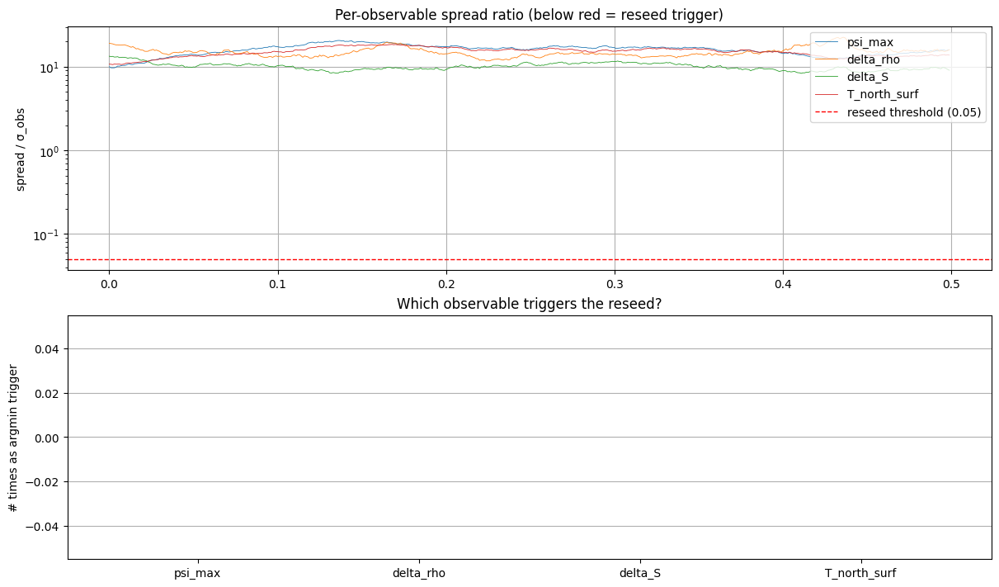

In [ ]:
"""
==========================================================================
RESEED ROOT-CAUSE DIAGNOSIS + FIX
==========================================================================
Insert AFTER the PF helpers cell and BEFORE run_pf_once.

The reseed fires at every step because it monitors ALL candidate observables,
not just the ones being assimilated.  The encoder-decoder bottleneck
compresses particle diversity so that at least one observable (likely delta_S
or delta_rho with σ=0.02) always has spread < 0.05 × σ.

Two fixes:
  A) Only monitor the SELECTED observations (recommended)
  B) Raise spread_threshold or switch to median instead of min
==========================================================================
"""

# ─────────────────────────────────────────────────────────────────
# 1.  DIAGNOSE: which observable triggers the reseed?
# ─────────────────────────────────────────────────────────────────

def diagnose_reseed_trigger(J_fixed, n_steps=500, proc_sigma=0.05):
    """
    Run a short PF and record per-observable spread ratios at each step.
    Shows which observable(s) cause the reseed to fire.
    """
    torch.manual_seed(0)
    np.random.seed(0)

    xPriorMean = model.on.astype(np.float64)
    xPriorStd = Xtruth_state.std(axis=0) + 1e-6
    xPriorStd[5] *= 2.0
    X0p = xPriorMean[:, None] + xPriorStd[:, None] * np.random.randn(nX, Npart)
    X0pN = (X0p.T - mu) / sd
    X0pN_t = torch.tensor(X0pN, dtype=torch.float32, device=device)

    with torch.no_grad():
        Zp = encNet(X0pN_t).T

    w = torch.full((Npart,), 1.0 / Npart, device=device, dtype=torch.float32)

    # Storage
    spread_ratios = np.zeros((nCand, n_steps))
    reseed_fired = np.zeros(n_steps, dtype=bool)
    trigger_obs  = np.full(n_steps, -1, dtype=int)

    for k in range(n_steps):
        if k > 0:
            with torch.no_grad():
                u_raw = U_t[k - 1]
                u_k = u_raw.to(device).reshape(1, -1).expand(Npart, -1)
                rhs = lambda zz: dynNet(torch.cat([zz, u_k], dim=1))
                Zp = runge_kutta(Zp.T.contiguous().float(), dt_years, rhs).T
            if proc_sigma > 0:
                Zp = Zp + proc_sigma * torch.randn_like(Zp)
            Zp = torch.clamp(Zp, -10.0, 10.0)

        Xp_t, Yp_all_t = decode_and_observe(Zp)

        obs_spread = Yp_all_t.std(dim=1)
        ratio = (obs_spread / (sig_all_t + 1e-12)).cpu().numpy()
        spread_ratios[:, k] = ratio

        if ratio.min() < 0.05:
            reseed_fired[k] = True
            trigger_obs[k] = ratio.argmin()

            # Actually reseed to keep going
            n_reseed = max(Npart // 5, 10)
            reseed_idx = torch.randperm(Npart, device=device)[:n_reseed]
            xmean = (Xp_t @ w).unsqueeze(1)
            xstd_prior = torch.tensor(
                Xtruth_state.std(axis=0), dtype=torch.float32, device=device
            ).unsqueeze(1)
            x_new = xmean + 0.5 * xstd_prior * torch.randn(nX, n_reseed, device=device)
            x_new_norm = (x_new.T - mu_t) / (sd_t + 1e-12)
            with torch.no_grad():
                z_new = encNet(x_new_norm.float()).T
            Zp[:, reseed_idx] = z_new

    # ── Report ──
    print(f"Reseed fired at {reseed_fired.sum()}/{n_steps} steps ({100*reseed_fired.mean():.1f}%)\n")

    print("Per-observable trigger frequency:")
    for j in range(nCand):
        count = (trigger_obs == j).sum()
        mean_ratio = spread_ratios[j].mean()
        min_ratio  = spread_ratios[j].min()
        print(f"  {ObsNames[j]:16s}  triggered {count:4d}x  "
              f"mean ratio={mean_ratio:.4f}  min ratio={min_ratio:.4f}  "
              f"σ_obs={obsSigmas_all[j]:.3f}")

    # ── Plot ──
    fig, axes = plt.subplots(2, 1, figsize=(12, 7), constrained_layout=True)

    ax = axes[0]
    t = np.arange(n_steps) * dt_years
    for j in range(nCand):
        ax.plot(t, spread_ratios[j], lw=0.6, label=ObsNames[j])
    ax.axhline(0.05, color="r", ls="--", lw=1, label="reseed threshold (0.05)")
    ax.set_ylabel("spread / σ_obs")
    ax.set_title("Per-observable spread ratio (below red = reseed trigger)")
    ax.legend(loc="upper right")
    ax.set_yscale("log")
    ax.grid(True)

    ax = axes[1]
    counts = [(trigger_obs == j).sum() for j in range(nCand)]
    colors = ["tab:red" if c > 0.5 * n_steps else "tab:blue" for c in counts]
    ax.bar(ObsNames, counts, color=colors)
    ax.set_ylabel("# times as argmin trigger")
    ax.set_title("Which observable triggers the reseed?")
    ax.grid(True, axis="y")

    plt.show()
    return spread_ratios, trigger_obs


# ─────────────────────────────────────────────────────────────────
# 2.  FIX: Reseed only monitors SELECTED observations
# ─────────────────────────────────────────────────────────────────

# def reseed_collapsed_particles_v2(Zp, w, Xp_t, Yp_all_t,
#                                    J_selected = None,
#                                    spread_threshold=0.02):
#     """
#     Re-seed particles only when the SELECTED observables collapse.

#     Key change from v1: if J_selected is provided, only those observation
#     indices are checked.  Unobserved diagnostics can have arbitrarily
#     narrow spread without triggering a reseed.
#     """
#     obs_spread = Yp_all_t.std(dim=1)

#     if J_selected is not None:
#         J_idx = torch.as_tensor(J_selected, device=obs_spread.device, dtype=torch.long)
#         check_spread = obs_spread[J_idx]
#         check_sigma  = sig_all_t[J_idx]
#     else:
#         check_spread = obs_spread
#         check_sigma  = sig_all_t

#     min_spread_ratio = check_spread / (check_sigma + 1e-12)

#     if min_spread_ratio.min().item() >= spread_threshold:
#         return Zp, False

#     n_reseed = max(Npart // 5, 10)
#     reseed_idx = torch.randperm(Npart, device=device)[:n_reseed]

#     xmean = (Xp_t @ w).unsqueeze(1)
#     xstd_prior = torch.tensor(
#         Xtruth_state.std(axis=0), dtype=torch.float32, device=device
#     ).unsqueeze(1)
#     x_new = xmean + 0.5 * xstd_prior * torch.randn(nX, n_reseed, device=device)
#     x_new_norm = (x_new.T - mu_t) / (sd_t + 1e-12)

#     with torch.no_grad():
#         z_new = encNet(x_new_norm.float()).T
#     Zp[:, reseed_idx] = z_new
#     return Zp, True


# ─────────────────────────────────────────────────────────────────
# 3.  RUN DIAGNOSIS
# ─────────────────────────────────────────────────────────────────

try:
    _J_diag = best_J
except NameError:
    _J_diag = [0, 1]
    print(f"Using fallback J={[ObsNames[j] for j in _J_diag]}")

print("=" * 60)
print("Diagnosing reseed trigger (first 500 steps)")
print("=" * 60)
spread_ratios, trigger_obs = diagnose_reseed_trigger(_J_diag, n_steps=500)

best_J not found, using fallback J=['psi_max', 'delta_rho']
STEP 1: Diagnose the CURRENT settings (proc_sigma=0.01)


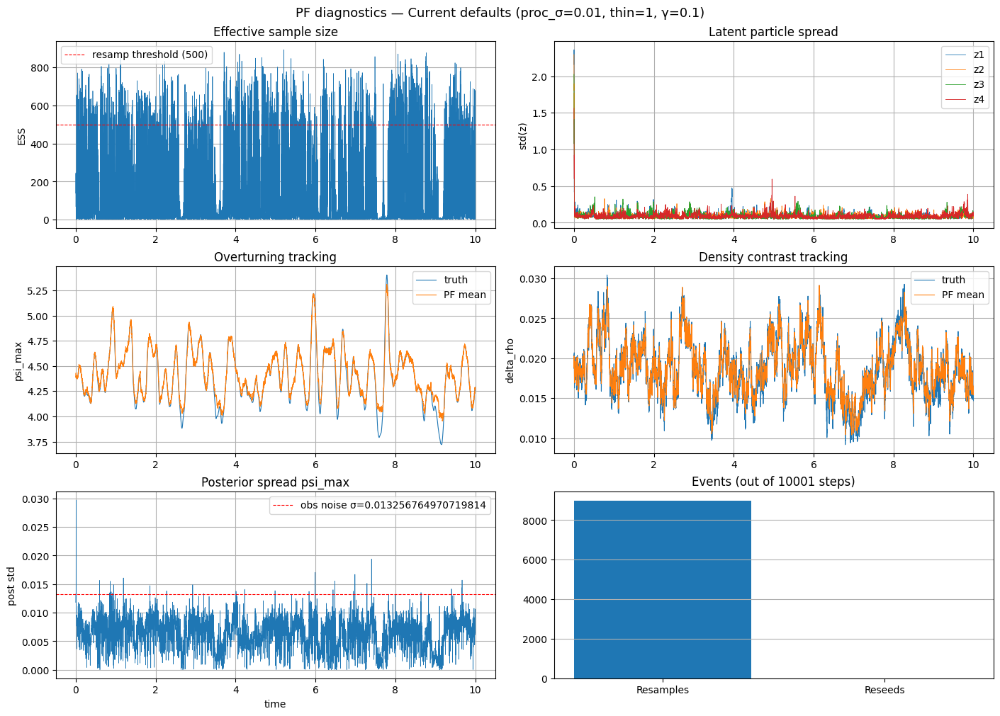


STEP 2: Quick fix — match settings + thin observations


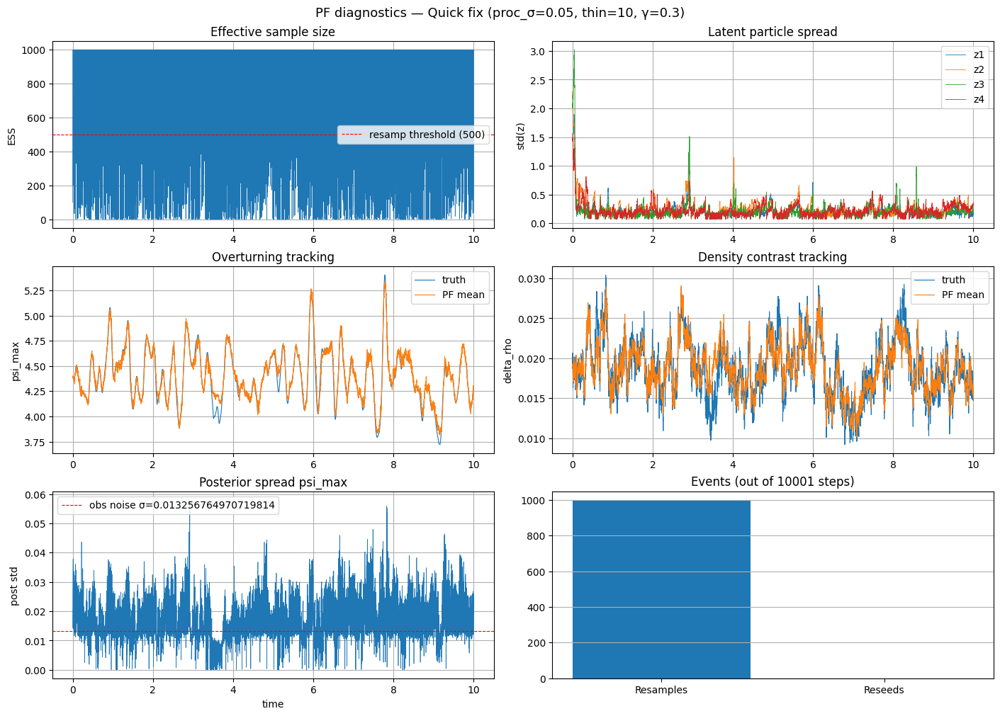


STEP 3: Grid search for optimal combination
Grid search: 48 combinations over ['proc_sigma', 'obs_thin', 'nudge_gamma']
  [  1/48] {'proc_sigma': 0.01, 'obs_thin': 1, 'nudge_gamma': 0.1}  →  RMSE=0.0568  ESS=169  spread=0.091  (46.9s) ★
  [  2/48] {'proc_sigma': 0.01, 'obs_thin': 1, 'nudge_gamma': 0.3}  →  RMSE=0.0446  ESS=224  spread=0.094  (46.5s) ★
  [  3/48] {'proc_sigma': 0.01, 'obs_thin': 1, 'nudge_gamma': 0.5}  →  RMSE=0.0393  ESS=287  spread=0.099  (46.1s) ★
  [  4/48] {'proc_sigma': 0.01, 'obs_thin': 5, 'nudge_gamma': 0.1}  →  RMSE=0.1317  ESS=804  spread=0.076  (24.2s)
  [  5/48] {'proc_sigma': 0.01, 'obs_thin': 5, 'nudge_gamma': 0.3}  →  RMSE=0.0990  ESS=802  spread=0.086  (24.8s)
  [  6/48] {'proc_sigma': 0.01, 'obs_thin': 5, 'nudge_gamma': 0.5}  →  RMSE=0.0784  ESS=804  spread=0.091  (24.5s)
  [  7/48] {'proc_sigma': 0.01, 'obs_thin': 10, 'nudge_gamma': 0.1}  →  RMSE=0.1508  ESS=897  spread=0.076  (21.6s)
  [  8/48] {'proc_sigma': 0.01, 'obs_thin': 10, 'nudge_gamma': 0.3}

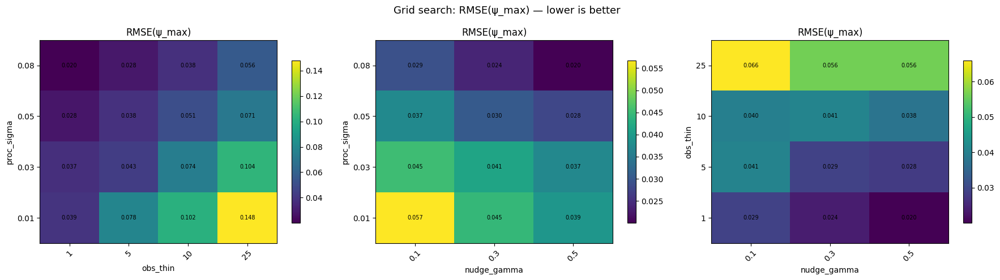


STEP 4: Best configuration — detailed diagnostics
Best params: {'proc_sigma': np.float64(0.08), 'obs_thin': np.float64(1.0), 'nudge_gamma': np.float64(0.5)}


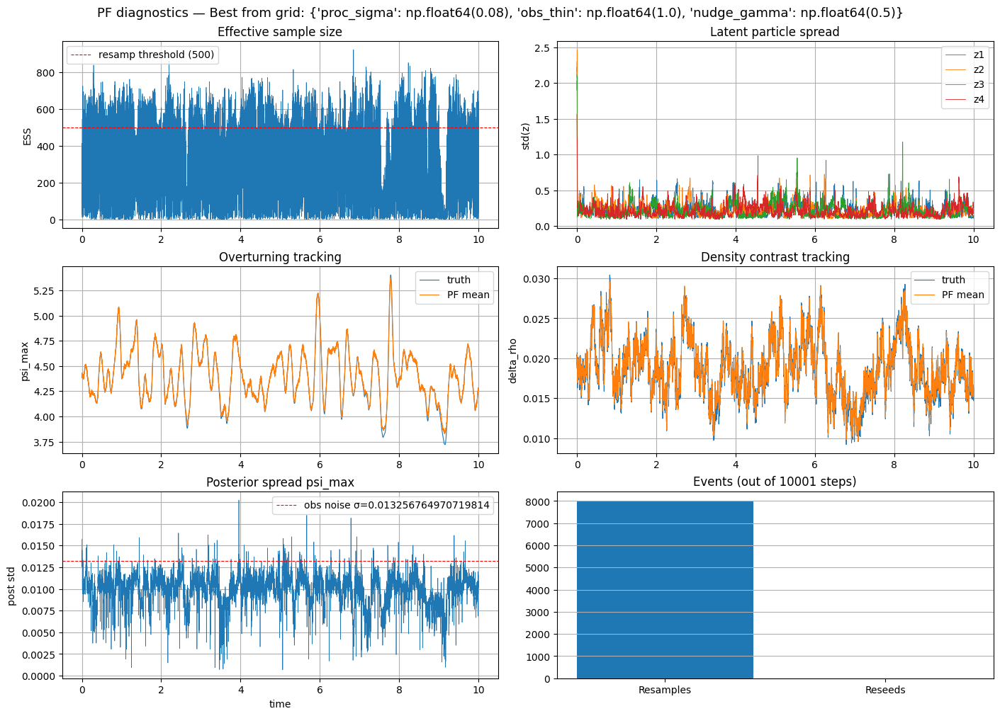

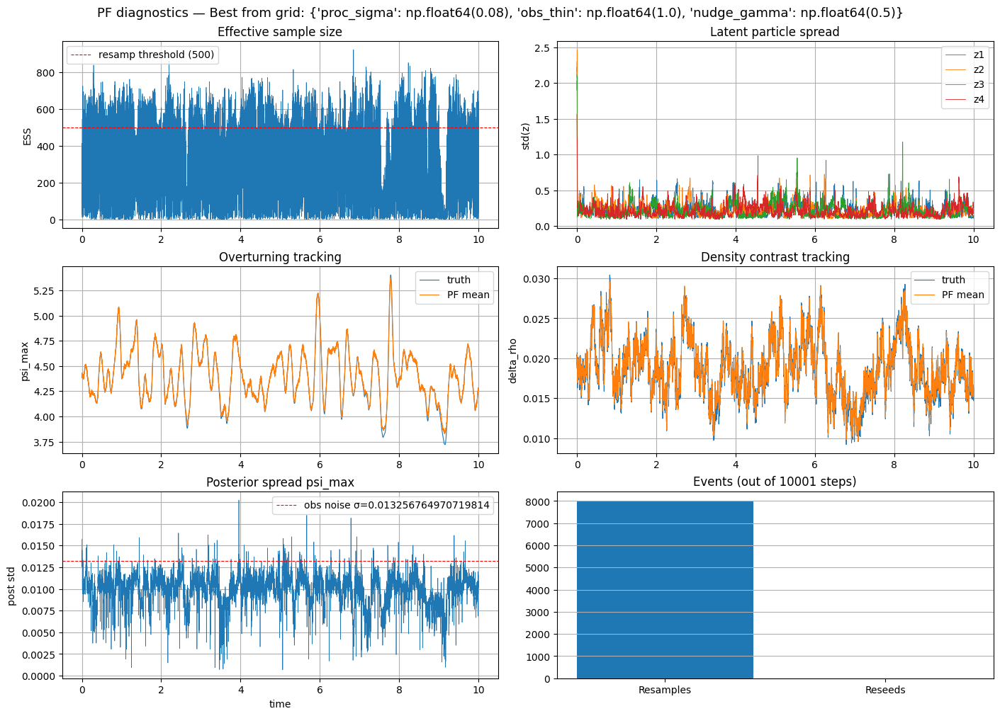

In [ ]:
"""
==========================================================================
PARTICLE FILTER TUNING — Diagnostic + Grid Search
==========================================================================
Insert AFTER the helpers cell (cell 46) and BEFORE the obs-set search.

Addresses 5 identified issues:
  1. proc_sigma mismatch  (settings say 0.05, run_pf_once defaults to 0.01)
  2. Every-step assimilation is too aggressive for dt=0.001 × 10k steps
  3. EnKF nudge is too conservative (nudge_gamma=0.1 → R = 10σ²)
  4. sigma_model inflation may over-dampen observation pull
  5. Interaction of rejuvenation with all the above
==========================================================================
"""

import itertools as _it
import time as _time

# ─────────────────────────────────────────────────────────────────
# 0.  DIAGNOSTIC VERSION OF run_pf_once
#     Returns extra time-series so we can see WHY it fails.
# ─────────────────────────────────────────────────────────────────

def run_pf_diagnostic(
    J_fixed, seed = 0,
    # --- knobs we want to sweep ---
    proc_sigma = 0.05,          # ← FIX: match settings (was 0.01)
    nudge_gamma = 0.3,          # ← stronger proposal
    nudge_alpha = 1.0,
    obs_thin = 10,              # ← assimilate every obs_thin steps
    sigma_model_frac = 0.1,     # ← fraction of particle spread added to obs noise
    rejuv_scale = 0.02,
    rejuv_floor = 0.05,
    jitter = 1e-5,
    guided_prop = True,
    Npart_override = None,
):
    """
    Same PF logic as run_pf_once but with:
      - observation thinning via `obs_thin`
      - extra diagnostic arrays returned
      - no candidate-stats overhead
    """
    _Npart = Npart_override or Npart
    torch.manual_seed(seed)
    np.random.seed(seed)

    # ---- Initialise particles ----
    xPriorMean = model.on.astype(np.float64)
    xPriorStd = Xtruth_state.std(axis=0) + 1e-6

    xPriorStd[5] *= 2.0
    """
    This is a heuristic for the best ESS metrics. The
    variable it corresponds to is the southern surface
    salinity which sits in the quasi-stationary low-salinity
    pool with very little variability. As such its empirical
    std is small relative to the dynamic range it actually
    needs to cover once hosing pushes the system in off-manifold.
    The northern box on the other hand has more natural
    variability because the northern box is where
    deep convection turns on/off, so its std is already
    a reasonable prior spread.
    """

    X0p = xPriorMean[:, None] + xPriorStd[:, None] * np.random.randn(nX, _Npart)
    X0pN = (X0p.T - mu) / sd
    X0pN_t = torch.tensor(X0pN, dtype=torch.float32, device=device)

    with torch.no_grad():
        Zp = encNet(X0pN_t).T                     # [latentDim, Npart]

    w = torch.full((_Npart,), 1.0 / _Npart, device=device, dtype=torch.float32)

    # ---- Storage ----
    Xfilt       = np.zeros((nX, Nt))
    ESS_arr     = np.zeros(Nt)
    NIS_arr     = np.zeros(Nt)
    z_spread    = np.zeros((latentDim, Nt))        # per-dim latent std
    n_resample  = 0
    n_reseed    = 0
    post_y_std  = np.zeros((nCand, Nt))

    J = torch.as_tensor(J_fixed, device=device, dtype=torch.long)
    B = J.numel()
    """

    Below is the forecast step in the PF. Concretely, before an observation time
    k, the filter pushes every particle using the learned dynamics model.

    u_raw = U_t[k - 1] - selection of forcing input at the previous time interval

    u_k = u_raw.to(device).reshape(1, -1).expand(_Npart, -1) - this is set so
    that every particle receives the same forcing input


    rhs = lambda zz: dynNet(torch.cat([zz, u_k], dim=1)) - zz is the current
    latent state z, u_k is the forcing and dynNet is the learned function
    f_{theta}. The output is the derivative (dz/dt). So this lines instructs:
    "Given the current latent particles and the forcing,
    compute the latent tendency predicted by the neural dynamics model".
    Also zz is the current batch of latent particle positions being evaluated by
    Runge–Kutta. It is automatically supplied by runge_kutta;
    it is not manually created elsewhere.

    Zp = runge_kutta(Zp.T.contiguous().float(), dt_years, rhs).T - This is where
    the integration is computed. Specifically, it takes the derivative (rhs) and
    uses RK4 to advance the particles forward in time. The transpose is there
    because the NN expects the data to be in a [batch_size, features] format.
    Which in my case is [Npart (number of particles), latentDim]. In other words;
    For each particle, dynNet predicts the rate of change of each specified latent dimension
    with respect to time, given the particle’s current latent state and the forcing.

    if proc_sigma > 0:
                Zp = Zp + proc_sigma * torch.randn_like(Zp) - This line adds
    process noise to the forecast particles. In other words, after the NN
    forecasts the particles, slight random perturbations are applied.

    Zp = torch.clamp(Zp, -10.0, 10.0) - This prevents latent particles from
    becoming numerically extreme. Its a clamp to avoid massive deviations
    of latent states.

    Zp = maybe_rejuvenate(Zp) - This applies an additional particle-spread
    correction. If the particle ensemble is becoming too collapsed,
    add a small amount of random noise to re-spread it.

    """
    for k in range(Nt):
        # ======== FORECAST ========
        if k > 0:
            with torch.no_grad():
                u_raw = U_t[k - 1]
                u_k = u_raw.to(device).reshape(1, -1).expand(_Npart, -1)
                rhs = lambda zz: dynNet(torch.cat([zz, u_k], dim=1))
                Zp = runge_kutta(Zp.T.contiguous().float(), dt_years, rhs).T

            if proc_sigma > 0:
                Zp = Zp + proc_sigma * torch.randn_like(Zp)

            Zp = torch.clamp(Zp, -10.0, 10.0)
            Zp = maybe_rejuvenate(Zp)

        # ======== DECODE ========
        Xp_t, Yp_all_t = decode_and_observe(Zp)

        # ======== RECORD SPREAD (always) ========
        z_spread[:, k] = Zp.std(dim = 1).cpu().numpy()

        # ======== ASSIMILATE (only every obs_thin steps) ========
        do_assim = (k % obs_thin == 0)

        if do_assim:
            yk_t   = Yobs_all_t[J, k].view(-1, 1)
            yhat_t = Yp_all_t[J, :]
            sig_t  = sig_all_t[J].view(-1, 1)

            # ---- Standard NIS on PRIOR particles (Bar-Shalom §5.4) -----
            # Computed BEFORE the nudge so the χ²_d reference applies.
            # Under correct specification: NIS_now ~ χ²_{|J|}.
            NIS_arr[k] = compute_nis_standard(
                yhat_prior=yhat_t,
                w_prior=w,
                y_obs=yk_t,
                sig_obs=sig_t.view(-1),
            )

            # ---- EnKF proposal ----
            if guided_prop:
                with torch.no_grad():
                    Zp = enkf_proposal(Zp, yhat_t, yk_t, w, sig_t,
                                       nudge_gamma, nudge_alpha, jitter)
                    Xp_t, Yp_all_t = decode_and_observe(Zp)
                    yhat_t = Yp_all_t[J, :]

            # ---- Weight update ----
            ymean_sel = (w[None, :] * yhat_t).sum(dim=1, keepdim=True)
            yvar_sel  = (w[None, :] * (yhat_t - ymean_sel)**2).sum(dim=1, keepdim=True)
            sigma_model = sigma_model_frac * torch.sqrt(yvar_sel + 1e-12)
            sig_eff = torch.sqrt(sig_t**2 + sigma_model**2)

            innov_t = yhat_t - yk_t
            quad_t = torch.sum((innov_t / (sig_eff + eps))**2, dim=0)

            gamma_w = nudge_gamma if guided_prop else 0.0
            logL_t = -0.5 * (1.0 - gamma_w) * quad_t

            logL_t = torch.where(torch.isfinite(logL_t), logL_t,
                                 torch.tensor(-1e30, device=device))

            logw_t = torch.log(w + eps) + logL_t
            logw_t -= logw_t.max()
            w = torch.exp(logw_t)
            w /= (w.sum() + eps)

        # ---- Diagnostics ----
        ESS_now = (1.0 / (torch.sum(w**2) + eps)).item()
        ESS_arr[k] = ESS_now

        # Posterior obs stats
        ypost_mean = (w[None, :] * Yp_all_t).sum(dim=1)
        ypost_var  = (w[None, :] * (Yp_all_t - ypost_mean[:, None])**2).sum(dim=1)
        post_y_std[:, k] = torch.sqrt(ypost_var + 1e-12).cpu().numpy()

        # Filtered mean state
        Xfilt[:, k] = (Xp_t @ w).detach().cpu().numpy()

        # ---- Resample ----
        if ESS_now < resampESS * _Npart:
            n_resample += 1
            idx_r = systematic_resample_torch(w)
            Zp = Zp.index_select(dim=1, index=idx_r)
            scale = Zp.std(dim=1, keepdim=True) + 1e-6
            Zp = Zp + (rejuv_scale * scale + rejuv_floor) * torch.randn_like(Zp)
            w = torch.full((_Npart,), 1.0 / _Npart, device=device, dtype=torch.float32)

        Zp, did = reseed_collapsed_particles(Zp, w, Xp_t, Yp_all_t, J_selected = J_fixed)
        if did:
            n_reseed += 1

    return {
        "Xfilt":       Xfilt,
        "ESS":         ESS_arr,
        "NIS":         NIS_arr,
        "z_spread":    z_spread,
        "post_y_std":  post_y_std,
        "n_resample":  n_resample,
        "n_reseed":    n_reseed,
    }


# ─────────────────────────────────────────────────────────────────
# 1.  SINGLE-RUN DIAGNOSTICS  (current defaults vs fixed defaults)
# ─────────────────────────────────────────────────────────────────

def plot_pf_diagnostics(res, label="", J_fixed=None):
    """6-panel diagnostic plot from run_pf_diagnostic output."""
    t = np.arange(Nt) * dt_years

    fig, axes = plt.subplots(3, 2, figsize=(14, 10), constrained_layout=True)
    fig.suptitle(f"PF diagnostics — {label}", fontsize=13)

    # (0,0) ESS
    ax = axes[0, 0]
    ax.plot(t, res["ESS"], lw=0.5)
    ax.axhline(resampESS * Npart, color="r", ls="--", lw=0.8, label=f"resamp threshold ({resampESS*Npart:.0f})")
    ax.set_ylabel("ESS"); ax.set_title("Effective sample size"); ax.legend(); ax.grid(True)

    # (0,1) Latent spread per dimension
    ax = axes[0, 1]
    for d in range(latentDim):
        ax.plot(t, res["z_spread"][d], lw=0.6, label=f"z{d+1}")
    ax.set_ylabel("std(z)"); ax.set_title("Latent particle spread"); ax.legend(); ax.grid(True)

    # (1,0) psi_max tracking
    ax = axes[1, 0]
    psi_idx = 0  # psi_max is obs index 0
    ax.plot(t, Ytruth_all[psi_idx, :Nt], lw=0.8, label="truth")
    # Filtered psi_max from Xfilt
    psi_state_idx = model.convention.index("psi_max")
    ax.plot(t, res["Xfilt"][psi_state_idx, :], lw=0.8, label="PF mean")
    ax.set_ylabel("psi_max"); ax.set_title("Overturning tracking"); ax.legend(); ax.grid(True)

    # (1,1) delta_rho tracking
    ax = axes[1, 1]
    drho_idx = 1
    ax.plot(t, Ytruth_all[drho_idx, :Nt], lw=0.8, label="truth")
    drho_state_idx = model.convention.index("delta_rho")
    ax.plot(t, res["Xfilt"][drho_state_idx, :], lw=0.8, label="PF mean")
    ax.set_ylabel("delta_rho"); ax.set_title("Density contrast tracking"); ax.legend(); ax.grid(True)

    # (2,0) Posterior observation std (psi_max)
    ax = axes[2, 0]
    ax.plot(t, res["post_y_std"][psi_idx, :], lw=0.5)
    ax.axhline(obsSigmas_all[psi_idx], color="r", ls="--", lw=0.8, label=f"obs noise σ={obsSigmas_all[psi_idx]}")
    ax.set_ylabel("post std"); ax.set_title("Posterior spread psi_max"); ax.legend(); ax.grid(True)
    ax.set_xlabel("time")

    # (2,1) Resample/reseed counts
    ax = axes[2, 1]
    ax.bar(["Resamples", "Reseeds"], [res["n_resample"], res["n_reseed"]])
    ax.set_title(f"Events (out of {Nt} steps)")
    ax.grid(True, axis="y")

    plt.show()
    return fig


# ─────────────────────────────────────────────────────────────────
# 2.  GRID SEARCH over the key knobs
# ─────────────────────────────────────────────────────────────────

def pf_grid_search(J_fixed, grid=None, metric="rmse_psi"):
    """
    Sweep over parameter combinations and score each.

    Default grid covers the three most impactful knobs:
      proc_sigma    : latent diffusion per step
      obs_thin      : assimilate every N steps
      nudge_gamma   : EnKF proposal strength
    """
    if grid is None:
        grid = {
            "proc_sigma":   [0.01, 0.03, 0.05, 0.08],
            "obs_thin":     [1, 5, 10, 25],
            "nudge_gamma":  [0.1, 0.3, 0.5],
        }

    keys = list(grid.keys())
    combos = list(_it.product(*(grid[k] for k in keys)))
    print(f"Grid search: {len(combos)} combinations over {keys}")

    psi_state_idx = model.convention.index("psi_max")
    truth_psi = Xtruth_state[:Nt, psi_state_idx]

    rows = []
    for i, vals in enumerate(combos):
        params = dict(zip(keys, vals))
        t0 = _time.time()

        res = run_pf_diagnostic(J_fixed, seed=0, **params)

        # Metrics
        rmse_psi = np.sqrt(np.mean((res["Xfilt"][psi_state_idx, :] - truth_psi)**2))
        mean_ess = np.mean(res["ESS"])
        mean_z_spread = np.mean(res["z_spread"])
        elapsed = _time.time() - t0

        rows.append({
            **params,
            "rmse_psi":     rmse_psi,
            "mean_ess":     mean_ess,
            "mean_z_spread": mean_z_spread,
            "n_resample":   res["n_resample"],
            "n_reseed":     res["n_reseed"],
            "elapsed_s":    elapsed,
        })

        tag = " ★" if rmse_psi == min(r["rmse_psi"] for r in rows) else ""
        print(f"  [{i+1:3d}/{len(combos)}] {params}  →  RMSE={rmse_psi:.4f}  "
              f"ESS={mean_ess:.0f}  spread={mean_z_spread:.3f}  "
              f"({elapsed:.1f}s){tag}")

    df = pd.DataFrame(rows).sort_values("rmse_psi")
    return df


def plot_grid_results(df):
    """Visualise grid search results: heatmaps of RMSE by parameter pairs."""
    keys = [c for c in df.columns if c not in
            ["rmse_psi", "mean_ess", "mean_z_spread", "n_resample", "n_reseed", "elapsed_s"]]

    if len(keys) < 2:
        print("Need at least 2 swept parameters for heatmap.")
        return

    pairs = list(_it.combinations(keys, 2))
    n_pairs = len(pairs)

    fig, axes = plt.subplots(1, n_pairs, figsize=(6 * n_pairs, 5), squeeze=False)

    for ax, (k1, k2) in zip(axes[0], pairs):
        pivot = df.groupby([k1, k2])["rmse_psi"].min().unstack(fill_value=np.nan)
        im = ax.imshow(pivot.values, aspect="auto", origin="lower")
        ax.set_xticks(range(len(pivot.columns)))
        ax.set_xticklabels([f"{v}" for v in pivot.columns], rotation=45)
        ax.set_yticks(range(len(pivot.index)))
        ax.set_yticklabels([f"{v}" for v in pivot.index])
        ax.set_xlabel(k2)
        ax.set_ylabel(k1)
        ax.set_title(f"RMSE(ψ_max)")
        plt.colorbar(im, ax=ax, shrink=0.8)

        # Mark the best cell
        best_row = df.iloc[0]
        for ri, rv in enumerate(pivot.index):
            for ci, cv in enumerate(pivot.columns):
                val = pivot.values[ri, ci]
                if np.isfinite(val):
                    ax.text(ci, ri, f"{val:.3f}", ha="center", va="center", fontsize=7)

    fig.suptitle("Grid search: RMSE(ψ_max) — lower is better", fontsize=13)
    plt.tight_layout()
    plt.show()
    return fig


# ─────────────────────────────────────────────────────────────────
# 3.  RUN IT
# ─────────────────────────────────────────────────────────────────

# Pick the best observation set from earlier, or use a reasonable default
try:
    _J_test = best_J
except NameError:
    _J_test = [0, 1]  # psi_max + delta_rho
    print(f"best_J not found, using fallback J={[ObsNames[j] for j in _J_test]}")

print("=" * 60)
print("STEP 1: Diagnose the CURRENT settings (proc_sigma=0.01)")
print("=" * 60)
res_old = run_pf_diagnostic(_J_test, proc_sigma=0.01, obs_thin=1, nudge_gamma=0.1)
plot_pf_diagnostics(res_old, label="Current defaults (proc_σ=0.01, thin=1, γ=0.1)", J_fixed=_J_test)

print("\n" + "=" * 60)
print("STEP 2: Quick fix — match settings + thin observations")
print("=" * 60)
res_fix = run_pf_diagnostic(_J_test, proc_sigma=0.05, obs_thin=10, nudge_gamma=0.3)
plot_pf_diagnostics(res_fix, label="Quick fix (proc_σ=0.05, thin=10, γ=0.3)", J_fixed=_J_test)

print("\n" + "=" * 60)
print("STEP 3: Grid search for optimal combination")
print("=" * 60)
df_grid = pf_grid_search(_J_test)

print("\nTop 5 configurations:")
print(df_grid.head(5).to_string(index=False))

plot_grid_results(df_grid)

# Show the best config in detail
best_params = df_grid.iloc[0]
print(f"\n{'=' * 60}")
print(f"STEP 4: Best configuration — detailed diagnostics")
print(f"{'=' * 60}")
best_kw = {k: best_params[k] for k in ["proc_sigma", "obs_thin", "nudge_gamma"]}
print(f"Best params: {best_kw}")

res_best = run_pf_diagnostic(_J_test, **best_kw)
plot_pf_diagnostics(res_best, label=f"Best from grid: {best_kw}", J_fixed=_J_test)

## PF techniques which reduce weight degeneracy

Using fallback J=['psi_max', 'delta_rho']
Running comparisons...

──────────────────────────────────────────────────
  BASELINE (v2 reseed, σ=0.05, thin=1, γ=0.1)
──────────────────────────────────────────────────
  RMSE(ψ_max):       0.0374
  Mean ESS:          177 / 1000
  ESS < 100:         48.6% of steps
  ESS < 50:          38.7% of steps
  Resamples:         9283
  Reseeds:           0
  Runtime:           48.3s

──────────────────────────────────────────────────
  TEMPERED (M=5, σ=0.05, γ=0.1)
──────────────────────────────────────────────────
  RMSE(ψ_max):       0.1062
  Mean ESS:          679 / 1000
  ESS < 100:         0.1% of steps
  ESS < 50:          0.1% of steps
  Resamples:         1920
  Reseeds:           0
  Runtime:           129.4s

──────────────────────────────────────────────────
  TEMPERED (M=5, Npart=800)
──────────────────────────────────────────────────
  RMSE(ψ_max):       0.1093
  Mean ESS:          544 / 1000
  ESS < 100:         0.1% of steps
  ESS < 50

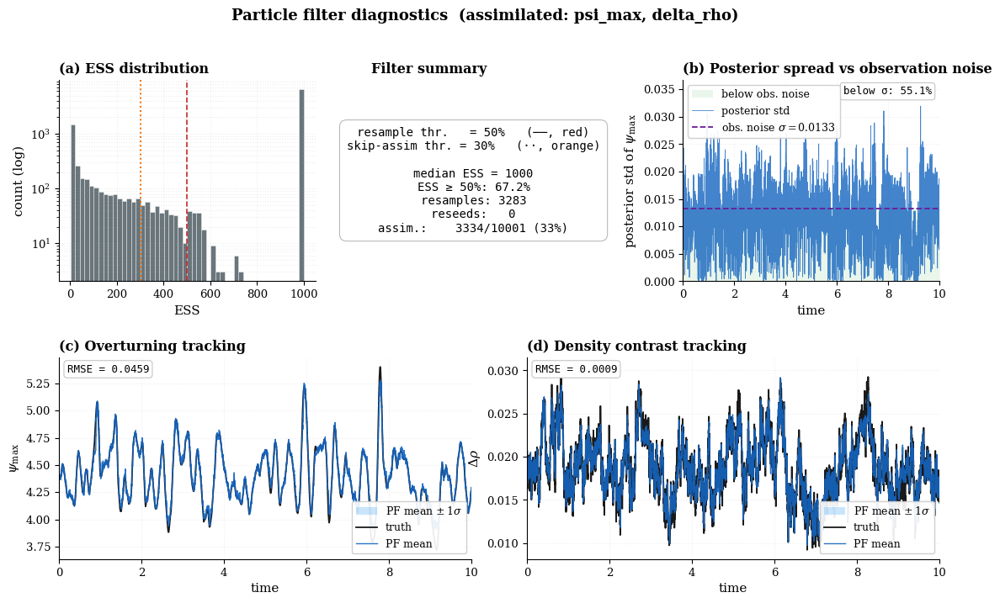

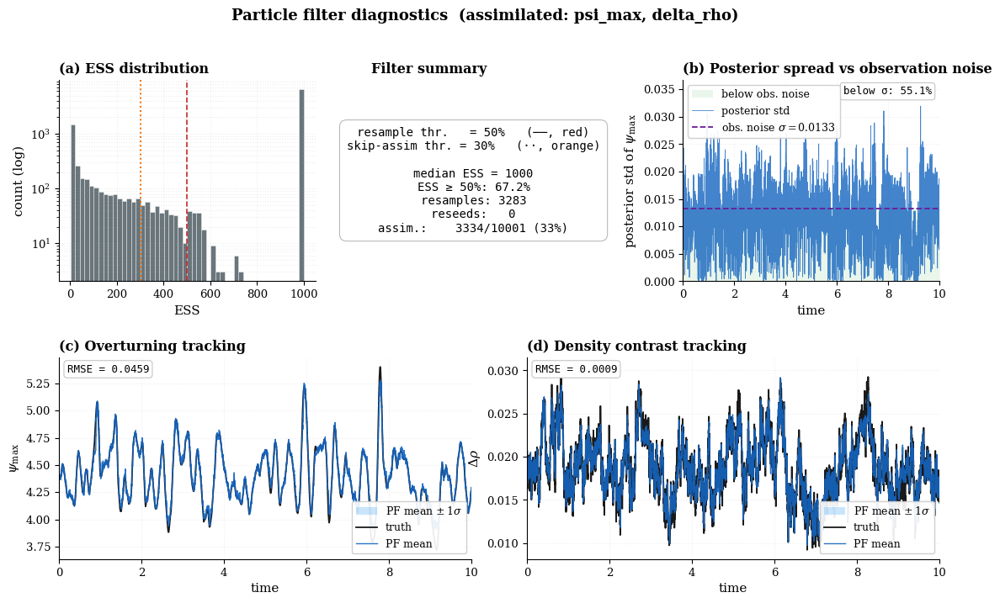

In [ ]:
"""
==========================================================================
PF IMPROVEMENTS — Three techniques to reduce weight degeneracy
==========================================================================
Insert AFTER the reseed v2 cell and BEFORE the obs-set search.

Technique 1: Tempered likelihood (progressive update)
Technique 2: Adaptive assimilation (skip update when ESS is low)
Technique 3: Npart sweep

All three use the v2 reseed (selected-only, threshold=0.02).
==========================================================================
"""

import time as _time
import copy as _copy

# ─────────────────────────────────────────────────────────────────
# 0.  V2 RESEED — needed by all techniques below
# ─────────────────────────────────────────────────────────────────

def reseed_v2(Zp, w, Xp_t, Yp_all_t, J_selected, spread_threshold=0.02):
    """Reseed only when SELECTED observables collapse."""
    _Np = Zp.shape[1]
    obs_spread = Yp_all_t.std(dim=1)
    J_idx = torch.as_tensor(J_selected, device=obs_spread.device, dtype=torch.long)
    check_ratio = obs_spread[J_idx] / (sig_all_t[J_idx] + 1e-12)

    if check_ratio.min().item() >= spread_threshold:
        return Zp, False

    n_reseed = max(_Np // 5, 10)
    reseed_idx = torch.randperm(_Np, device=device)[:n_reseed]

    xmean = (Xp_t @ w).unsqueeze(1)
    xstd_prior = torch.tensor(
        Xtruth_state.std(axis=0), dtype=torch.float32, device=device
    ).unsqueeze(1)
    x_new = xmean + 0.5 * xstd_prior * torch.randn(nX, n_reseed, device=device)
    x_new_norm = (x_new.T - mu_t) / (sd_t + 1e-12)

    with torch.no_grad():
        z_new = encNet(x_new_norm.float()).T
    Zp[:, reseed_idx] = z_new
    return Zp, True


# ─────────────────────────────────────────────────────────────────
# 1.  TEMPERED LIKELIHOOD
#     Instead of applying the full log-likelihood in one step,
#     split it into M sub-updates each with weight (1/M).
#     Between sub-updates, resample if needed — this prevents
#     any single observation from collapsing the ensemble.
# ─────────────────────────────────────────────────────────────────

def run_pf_tempered(
    J_fixed, seed = 0,
    proc_sigma = 0.05,
    nudge_gamma = 0.1,
    nudge_alpha = 1.0,
    jitter = 1e-5,
    rejuv_scale = 0.02,
    rejuv_floor = 0.05,
    guided_prop = True,
    sigma_model_frac = 0.1,
    # --- Tempering ---
    n_temper = 5,               # number of tempering sub-steps
    Npart_override = None,
):
    """PF with tempered (progressive) likelihood updates."""
    _Npart = Npart_override or Npart
    torch.manual_seed(seed)
    np.random.seed(seed)

    xPriorMean = model.on.astype(np.float64)
    xPriorStd = Xtruth_state.std(axis=0) + 1e-6
    xPriorStd[5] *= 2.0

    X0p = xPriorMean[:, None] + xPriorStd[:, None] * np.random.randn(nX, _Npart)
    X0pN = (X0p.T - mu) / sd
    X0pN_t = torch.tensor(X0pN, dtype=torch.float32, device=device)

    with torch.no_grad():
        Zp = encNet(X0pN_t).T

    w = torch.full((_Npart,), 1.0 / _Npart, device=device, dtype=torch.float32)

    Xfilt      = np.zeros((nX, Nt))
    ESS_arr    = np.zeros(Nt)
    z_spread   = np.zeros((latentDim, Nt))
    post_y_std = np.zeros((nCand, Nt))
    n_resample = 0
    n_reseed   = 0

    J = torch.as_tensor(J_fixed, device=device, dtype=torch.long)

    for k in range(Nt):
        # ======== FORECAST ========
        if k > 0:
            with torch.no_grad():
                u_raw = U_t[k - 1]
                u_k = u_raw.to(device).reshape(1, -1).expand(_Npart, -1)
                rhs = lambda zz: dynNet(torch.cat([zz, u_k], dim=1))
                Zp = runge_kutta(Zp.T.contiguous().float(), dt_years, rhs).T

            if proc_sigma > 0:
                Zp = Zp + proc_sigma * torch.randn_like(Zp)
            Zp = torch.clamp(Zp, -10.0, 10.0)
            Zp = maybe_rejuvenate(Zp)

        # ======== DECODE ========
        Xp_t, Yp_all_t = decode_and_observe(Zp)
        z_spread[:, k] = Zp.std(dim=1).cpu().numpy()

        # ======== TEMPERED UPDATE ========
        yk_t  = Yobs_all_t[J, k].view(-1, 1)
        sig_t = sig_all_t[J].view(-1, 1)

        for m in range(n_temper):
            yhat_t = Yp_all_t[J, :]

            # EnKF proposal (applied at each sub-step)
            if guided_prop:
                with torch.no_grad():
                    Zp = enkf_proposal(Zp, yhat_t, yk_t, w, sig_t,
                                       nudge_gamma / n_temper, nudge_alpha, jitter)
                    Xp_t, Yp_all_t = decode_and_observe(Zp)
                    yhat_t = Yp_all_t[J, :]

            # Tempered weight: apply 1/M of the log-likelihood
            ymean_sel = (w[None, :] * yhat_t).sum(dim=1, keepdim=True)
            yvar_sel  = (w[None, :] * (yhat_t - ymean_sel)**2).sum(dim=1, keepdim=True)
            sigma_model = sigma_model_frac * torch.sqrt(yvar_sel + 1e-12)
            sig_eff = torch.sqrt(sig_t**2 + sigma_model**2)

            innov_t = yhat_t - yk_t
            quad_t = torch.sum((innov_t / (sig_eff + eps))**2, dim=0)

            gamma_w = (nudge_gamma / n_temper) if guided_prop else 0.0
            logL_t = -0.5 * (1.0 - gamma_w) * quad_t / n_temper  # ← tempered

            logL_t = torch.where(torch.isfinite(logL_t), logL_t,
                                 torch.tensor(-1e30, device=device))

            logw_t = torch.log(w + eps) + logL_t
            logw_t -= logw_t.max()
            w = torch.exp(logw_t)
            w /= (w.sum() + eps)

            # Intermediate resample if needed
            ESS_sub = (1.0 / (torch.sum(w**2) + eps)).item()
            if ESS_sub < resampESS * _Npart and m < n_temper - 1:
                idx_r = systematic_resample_torch(w)
                Zp = Zp.index_select(dim=1, index=idx_r)
                scale = Zp.std(dim=1, keepdim=True) + 1e-6
                Zp = Zp + (rejuv_scale * 0.5 * scale) * torch.randn_like(Zp)
                w = torch.full((_Npart,), 1.0 / _Npart, device=device, dtype=torch.float32)
                Xp_t, Yp_all_t = decode_and_observe(Zp)

        # ======== FINAL DIAGNOSTICS ========
        ESS_now = (1.0 / (torch.sum(w**2) + eps)).item()
        ESS_arr[k] = ESS_now

        ypost_mean = (w[None, :] * Yp_all_t).sum(dim=1)
        ypost_var  = (w[None, :] * (Yp_all_t - ypost_mean[:, None])**2).sum(dim=1)
        post_y_std[:, k] = torch.sqrt(ypost_var + 1e-12).cpu().numpy()

        Xfilt[:, k] = (Xp_t @ w).detach().cpu().numpy()

        # ======== RESAMPLE ========
        if ESS_now < resampESS * _Npart:
            n_resample += 1
            idx_r = systematic_resample_torch(w)
            Zp = Zp.index_select(dim=1, index=idx_r)
            scale = Zp.std(dim=1, keepdim=True) + 1e-6
            Zp = Zp + (rejuv_scale * scale + rejuv_floor) * torch.randn_like(Zp)
            w = torch.full((_Npart,), 1.0 / _Npart, device=device, dtype=torch.float32)

        # ======== RESEED v2 ========
        Zp, did = reseed_v2(Zp, w, Xp_t, Yp_all_t, J_fixed, spread_threshold=0.02)
        if did:
            n_reseed += 1

    return {
        "Xfilt": Xfilt, "ESS": ESS_arr, "z_spread": z_spread,
        "post_y_std": post_y_std, "n_resample": n_resample, "n_reseed": n_reseed,
    }


# ─────────────────────────────────────────────────────────────────
# 2.  ADAPTIVE ASSIMILATION
#     Only assimilate when the filter is healthy (ESS > threshold).
#     When ESS is low, skip the update and let forecast + process
#     noise rebuild diversity.
# ─────────────────────────────────────────────────────────────────

def run_pf_adaptive(
    J_fixed, seed = 0,
    proc_sigma = 0.05,
    nudge_gamma = 0.1,
    nudge_alpha = 1.0,
    jitter = 1e-5,
    rejuv_scale = 0.02,
    rejuv_floor = 0.05,
    guided_prop = True,
    sigma_model_frac = 0.1,
    # --- Adaptive ---
    ess_skip_threshold = 0.3,   # skip assimilation if ESS < this × Npart
    min_gap = 3,                # minimum steps between assimilations
    Npart_override = None,
):
    """PF that skips assimilation when ESS is unhealthy."""
    _Npart = Npart_override or Npart
    torch.manual_seed(seed)
    np.random.seed(seed)

    xPriorMean = model.on.astype(np.float64)
    xPriorStd = Xtruth_state.std(axis=0) + 1e-6
    xPriorStd[5] *= 2.0

    X0p = xPriorMean[:, None] + xPriorStd[:, None] * np.random.randn(nX, _Npart)
    X0pN = (X0p.T - mu) / sd
    X0pN_t = torch.tensor(X0pN, dtype=torch.float32, device=device)

    with torch.no_grad():
        Zp = encNet(X0pN_t).T

    w = torch.full((_Npart,), 1.0 / _Npart, device=device, dtype=torch.float32)

    Xfilt      = np.zeros((nX, Nt))
    ESS_arr    = np.zeros(Nt)
    z_spread   = np.zeros((latentDim, Nt))
    post_y_std = np.zeros((nCand, Nt))
    n_resample = 0
    n_reseed   = 0
    n_assim    = 0
    last_assim = -min_gap  # allow first step

    J = torch.as_tensor(J_fixed, device=device, dtype=torch.long)

    for k in range(Nt):
        # ======== FORECAST ========
        if k > 0:
            with torch.no_grad():
                u_raw = U_t[k - 1]
                u_k = u_raw.to(device).reshape(1, -1).expand(_Npart, -1)
                rhs = lambda zz: dynNet(torch.cat([zz, u_k], dim=1))
                Zp = runge_kutta(Zp.T.contiguous().float(), dt_years, rhs).T

            if proc_sigma > 0:
                Zp = Zp + proc_sigma * torch.randn_like(Zp)
            Zp = torch.clamp(Zp, -10.0, 10.0)
            Zp = maybe_rejuvenate(Zp)

        # ======== DECODE ========
        Xp_t, Yp_all_t = decode_and_observe(Zp)
        z_spread[:, k] = Zp.std(dim=1).cpu().numpy()

        # ======== DECIDE WHETHER TO ASSIMILATE ========
        ESS_pre = (1.0 / (torch.sum(w**2) + eps)).item()
        gap_ok = (k - last_assim) >= min_gap
        ess_ok = ESS_pre >= ess_skip_threshold * _Npart
        do_assim = gap_ok and ess_ok

        if do_assim:
            n_assim += 1
            last_assim = k

            yk_t   = Yobs_all_t[J, k].view(-1, 1)
            yhat_t = Yp_all_t[J, :]
            sig_t  = sig_all_t[J].view(-1, 1)

            if guided_prop:
                with torch.no_grad():
                    Zp = enkf_proposal(Zp, yhat_t, yk_t, w, sig_t,
                                       nudge_gamma, nudge_alpha, jitter)
                    Xp_t, Yp_all_t = decode_and_observe(Zp)
                    yhat_t = Yp_all_t[J, :]

            ymean_sel = (w[None, :] * yhat_t).sum(dim=1, keepdim=True)
            yvar_sel  = (w[None, :] * (yhat_t - ymean_sel)**2).sum(dim=1, keepdim=True)
            sigma_model = sigma_model_frac * torch.sqrt(yvar_sel + 1e-12)
            sig_eff = torch.sqrt(sig_t**2 + sigma_model**2)

            innov_t = yhat_t - yk_t
            quad_t = torch.sum((innov_t / (sig_eff + eps))**2, dim=0)

            gamma_w = nudge_gamma if guided_prop else 0.0
            logL_t = -0.5 * (1.0 - gamma_w) * quad_t

            logL_t = torch.where(torch.isfinite(logL_t), logL_t,
                                 torch.tensor(-1e30, device=device))

            logw_t = torch.log(w + eps) + logL_t
            logw_t -= logw_t.max()
            w = torch.exp(logw_t)
            w /= (w.sum() + eps)

        # ======== DIAGNOSTICS ========
        ESS_now = (1.0 / (torch.sum(w**2) + eps)).item()
        ESS_arr[k] = ESS_now

        ypost_mean = (w[None, :] * Yp_all_t).sum(dim=1)
        ypost_var  = (w[None, :] * (Yp_all_t - ypost_mean[:, None])**2).sum(dim=1)
        post_y_std[:, k] = torch.sqrt(ypost_var + 1e-12).cpu().numpy()
        Xfilt[:, k] = (Xp_t @ w).detach().cpu().numpy()

        # ======== RESAMPLE ========
        if ESS_now < resampESS * _Npart:
            n_resample += 1
            idx_r = systematic_resample_torch(w)
            Zp = Zp.index_select(dim=1, index=idx_r)
            scale = Zp.std(dim=1, keepdim=True) + 1e-6
            Zp = Zp + (rejuv_scale * scale + rejuv_floor) * torch.randn_like(Zp)
            w = torch.full((_Npart,), 1.0 / _Npart, device=device, dtype=torch.float32)

        Zp, did = reseed_v2(Zp, w, Xp_t, Yp_all_t, J_fixed, spread_threshold=0.02)
        if did:
            n_reseed += 1

    return {
        "Xfilt": Xfilt, "ESS": ESS_arr, "z_spread": z_spread,
        "post_y_std": post_y_std, "n_resample": n_resample,
        "n_reseed": n_reseed, "n_assim": n_assim,
    }


# ─────────────────────────────────────────────────────────────────
# 3.  COMPARISON RUNNER
# ─────────────────────────────────────────────────────────────────

try:
    _J_test = best_J
except NameError:
    _J_test = [0, 1]
    print(f"Using fallback J={[ObsNames[j] for j in _J_test]}")

psi_idx = model.convention.index("psi_max")
truth_psi = Xtruth_state[:Nt, psi_idx]

def compute_rmse(res):
    return np.sqrt(np.mean((res["Xfilt"][psi_idx, :] - truth_psi)**2))

def summarise(name, res, elapsed=None):
    rmse = compute_rmse(res)
    mean_ess = np.mean(res["ESS"])
    ess_below_100 = np.mean(res["ESS"] < 100) * 100
    ess_below_50  = np.mean(res["ESS"] < 50) * 100
    print(f"\n{'─'*50}")
    print(f"  {name}")
    print(f"{'─'*50}")
    print(f"  RMSE(ψ_max):       {rmse:.4f}")
    print(f"  Mean ESS:          {mean_ess:.0f} / {Npart}")
    print(f"  ESS < 100:         {ess_below_100:.1f}% of steps")
    print(f"  ESS < 50:          {ess_below_50:.1f}% of steps")
    print(f"  Resamples:         {res['n_resample']}")
    print(f"  Reseeds:           {res['n_reseed']}")
    if "n_assim" in res:
        print(f"  Assimilations:     {res['n_assim']} / {Nt}")
    if elapsed:
        print(f"  Runtime:           {elapsed:.1f}s")


# ── A) Baseline: current best (v2 reseed, proc_sigma=0.05) ──
print("=" * 60)
print("Running comparisons...")
print("=" * 60)

t0 = _time.time()
res_baseline = run_pf_diagnostic(_J_test, proc_sigma=0.05, obs_thin=1, nudge_gamma=0.1)
t_baseline = _time.time() - t0
summarise("BASELINE (v2 reseed, σ=0.05, thin=1, γ=0.1)", res_baseline, t_baseline)

# ── B) Tempered likelihood (M=5) ──
t0 = _time.time()
res_tempered = run_pf_tempered(_J_test, proc_sigma=0.05, nudge_gamma=0.1, n_temper=5)
t_tempered = _time.time() - t0
summarise("TEMPERED (M=5, σ=0.05, γ=0.1)", res_tempered, t_tempered)

# ── C) Tempered + more particles ──
t0 = _time.time()
res_tempered_800 = run_pf_tempered(_J_test, proc_sigma=0.05, nudge_gamma=0.1,
                                    n_temper=5, Npart_override=800)
t_tempered_800 = _time.time() - t0
summarise("TEMPERED (M=5, Npart=800)", res_tempered_800, t_tempered_800)

# ── D) Adaptive assimilation ──
t0 = _time.time()
res_adaptive = run_pf_adaptive(_J_test, proc_sigma=0.05, nudge_gamma=0.1,
                                ess_skip_threshold=0.3, min_gap=3)
t_adaptive = _time.time() - t0
summarise("ADAPTIVE (skip if ESS<30%, min_gap=3)", res_adaptive, t_adaptive)

# ── E) Tempered + Adaptive ──
# (Combine: use tempering AND skip when ESS is unhealthy)
# This requires a combined function — approximate by using tempered with obs_thin-like logic
# For now, just tempered with n_temper=3 (lighter) + more particles
t0 = _time.time()
res_combined = run_pf_tempered(_J_test, proc_sigma=0.05, nudge_gamma=0.1,
                                n_temper=3, Npart_override=600)
t_combined = _time.time() - t0
summarise("TEMPERED (M=3, Npart=600)", res_combined, t_combined)


# ── Summary table ──
print("\n" + "=" * 60)
print("SUMMARY TABLE")
print("=" * 60)

all_results = [
    ("Baseline (400p)",       res_baseline,     t_baseline),
    ("Tempered M=5 (400p)",   res_tempered,     t_tempered),
    ("Tempered M=5 (800p)",   res_tempered_800, t_tempered_800),
    ("Adaptive (400p)",       res_adaptive,     t_adaptive),
    ("Tempered M=3 (600p)",   res_combined,     t_combined),
]

print(f"{'Config':<26s} {'RMSE':>7s} {'mESS':>5s} {'<100':>5s} {'<50':>5s} "
      f"{'Resmp':>6s} {'Reseed':>6s} {'Time':>6s}")
print("─" * 75)
for name, res, elapsed in all_results:
    rmse = compute_rmse(res)
    mean_ess = np.mean(res["ESS"])
    pct100 = np.mean(res["ESS"] < 100) * 100
    pct50  = np.mean(res["ESS"] < 50) * 100
    print(f"{name:<26s} {rmse:7.4f} {mean_ess:5.0f} {pct100:4.1f}% {pct50:4.1f}% "
          f"{res['n_resample']:6d} {res['n_reseed']:6d} {elapsed:5.1f}s")

# ── Diagnostic plots for the best ──
best_name, best_res, _ = min(all_results, key=lambda x: compute_rmse(x[1]))
print(f"\nBest by RMSE: {best_name}")


def plot_pf_adaptive_publication(
    res,
    *,
    Xtruth_state,
    Ytruth_all,
    ObsNames,
    model_convention,
    obs_sigmas,
    Npart,
    resampESS,
    ess_skip_threshold,
    dt_years,
    J_selected,
    outpath=None,
):
    """
    Publication-grade diagnostic figure for the adaptive PF.

    Layout (top row): (a) ESS hist  |  Filter summary  |  (b) Posterior spread
    Layout (bot row): (c) psi_max tracking  |  (d) delta_rho tracking
    """

    # ------------------------------------------------------------
    # Unpack
    # ------------------------------------------------------------
    ESS      = res["ESS"]
    Xfilt    = res["Xfilt"]
    post_std = res["post_y_std"]
    Nt       = ESS.size
    t        = np.arange(Nt) * dt_years

    psi_idx_state = model_convention.index("psi_max")
    rho_idx_state = model_convention.index("delta_rho")
    psi_idx_obs   = ObsNames.index("psi_max")
    rho_idx_obs   = ObsNames.index("delta_rho")

    truth_psi = Xtruth_state[:Nt, psi_idx_state]
    truth_rho = Xtruth_state[:Nt, rho_idx_state]
    pf_psi    = Xfilt[psi_idx_state, :]
    pf_rho    = Xfilt[rho_idx_state, :]

    psi_obs_sigma = float(obs_sigmas[psi_idx_obs])
    pf_psi_std = post_std[psi_idx_obs, :]
    pf_rho_std = post_std[rho_idx_obs, :]

    thr_resample = resampESS * Npart
    thr_skip     = ess_skip_threshold * Npart

    # ------------------------------------------------------------
    # Typography + palette
    # ------------------------------------------------------------
    plt.rcParams.update({
        "font.family": "serif",
        "font.serif": ["DejaVu Serif", "Times New Roman", "Times"],
        "mathtext.fontset": "dejavuserif",
        "axes.labelsize": 11,
        "axes.titlesize": 11.5,
        "xtick.labelsize": 9.5,
        "ytick.labelsize": 9.5,
        "legend.fontsize": 9,
    })

    C_TRUTH   = "#1A1A1A"
    C_PF      = "#1565C0"
    C_BAND    = "#64B5F6"
    C_ESS     = "#37474F"
    C_THR_RE  = "#C62828"
    C_THR_SK  = "#EF6C00"
    C_SIG     = "#6A1B9A"

    # ------------------------------------------------------------
    # Figure — 2x6 grid: top = 3 panels, bottom = 2 panels
    # ------------------------------------------------------------
    fig = plt.figure(figsize=(13.5, 7.4))
    gs = gridspec.GridSpec(
        2, 6,
        height_ratios=[1.0, 1.0],
        hspace=0.38, wspace=0.55,
        figure=fig,
    )

    ax_hist  = fig.add_subplot(gs[0, 0:2])   # (a) ESS hist
    ax_stats = fig.add_subplot(gs[0, 2:4])   # filter summary
    ax_sprd  = fig.add_subplot(gs[0, 4:6])   # (b) posterior spread
    ax_psi   = fig.add_subplot(gs[1, 0:3])   # (c)
    ax_rho   = fig.add_subplot(gs[1, 3:6])   # (d)

    # ==================================================
    # (a) ESS histogram — NO legend, no labels on axvlines
    # ==================================================
    ax_hist.hist(ESS, bins=50, color=C_ESS, alpha=0.75,
                 edgecolor="white", linewidth=0.4)
    ax_hist.axvline(thr_resample, color=C_THR_RE, linestyle="--", linewidth=1.2)
    ax_hist.axvline(thr_skip,     color=C_THR_SK, linestyle=":",  linewidth=1.4)
    ax_hist.set_yscale("log")
    ax_hist.set_xlabel("ESS")
    ax_hist.set_ylabel("count (log)")
    ax_hist.set_title("(a) ESS distribution", loc="left", fontweight="bold")
    ax_hist.grid(alpha=0.22, linestyle=":", which="both")
    ax_hist.spines["top"].set_visible(False)
    ax_hist.spines["right"].set_visible(False)
    # NOTE: no ax_hist.legend(...) — thresholds are documented in stats panel

    # ==================================================
    # Filter summary panel (between (a) and (b))
    # ==================================================
    ax_stats.axis("off")
    ax_stats.set_title("Filter summary", loc="left", fontweight="bold", fontsize=11.5)

    med_ess  = np.median(ESS)
    frac_hi  = np.mean(ESS >= thr_resample) * 100.0
    n_resamp = res.get("n_resample", 0)
    n_reseed = res.get("n_reseed", 0)
    n_assim  = res.get("n_assim", None)

    stats_lines = [
        f"resample thr.   = {int(resampESS*100)}%   (──, red)",
        f"skip-assim thr. = {int(ess_skip_threshold*100)}%   (··, orange)",
        "",
        f"median ESS = {med_ess:.0f}",
        f"ESS ≥ {int(resampESS*100)}%: {frac_hi:.1f}%",
        f"resamples: {n_resamp}",
        f"reseeds:   {n_reseed}",
    ]
    if n_assim is not None:
        stats_lines.append(f"assim.:    {n_assim}/{Nt} ({100*n_assim/Nt:.0f}%)")

    ax_stats.text(
        0.4, 0.5, "\n".join(stats_lines),
        transform=ax_stats.transAxes,
        ha="center", va="center",
        fontsize = 10, family="monospace",
        bbox=dict(boxstyle="round,pad=0.6",
                  facecolor="white", edgecolor="#BDBDBD", linewidth=0.85),
    )

    # ==================================================
    # (b) posterior spread vs observation noise
    # ==================================================
    ax_sprd.fill_between(
        t, 0, psi_obs_sigma,
        color="#E8F5E9", alpha=0.9, linewidth=0,
        label="below obs. noise",
    )
    ax_sprd.plot(t, pf_psi_std, color=C_PF, linewidth=0.6, alpha=0.8,
                 label="posterior std")
    ax_sprd.axhline(
        psi_obs_sigma, color=C_SIG, linestyle="--", linewidth=1.3,
        label=rf"obs. noise $\sigma={psi_obs_sigma:.3g}$",
    )

    frac_below = np.mean(pf_psi_std < psi_obs_sigma) * 100.0
    ax_sprd.text(
        0.97, 0.97, f"below σ: {frac_below:.1f}%",
        transform=ax_sprd.transAxes, ha="right", va="top",
        fontsize=9, family="monospace",
        bbox=dict(boxstyle="round,pad=0.3",
                  facecolor="white", edgecolor="#BDBDBD", linewidth=0.7),
    )

    ax_sprd.set_xlim(t[0], t[-1])
    ax_sprd.set_ylim(0, max(pf_psi_std.max(), psi_obs_sigma) * 1.15)
    ax_sprd.set_xlabel("time")
    ax_sprd.set_ylabel(r"posterior std of $\psi_{\max}$")
    ax_sprd.set_title("(b) Posterior spread vs observation noise",
                      loc="left", fontweight="bold")
    ax_sprd.grid(alpha=0.22, linestyle=":")
    ax_sprd.legend(loc="upper left", framealpha=0.92)
    ax_sprd.spines["top"].set_visible(False)
    ax_sprd.spines["right"].set_visible(False)

    # ==================================================
    # (c) psi_max tracking
    # ==================================================
    ax_psi.fill_between(
        t, pf_psi - pf_psi_std, pf_psi + pf_psi_std,
        color=C_BAND, alpha=0.35, linewidth=0, label=r"PF mean $\pm\,1\sigma$",
    )
    ax_psi.plot(t, truth_psi, color=C_TRUTH, linewidth=1.3, label="truth")
    ax_psi.plot(t, pf_psi, color=C_PF, linewidth=1.0, alpha=0.9, label="PF mean")

    ax_psi.set_xlim(t[0], t[-1])
    ax_psi.set_xlabel("time")
    ax_psi.set_ylabel(r"$\psi_{\max}$")
    ax_psi.set_title("(c) Overturning tracking", loc="left", fontweight="bold")
    ax_psi.grid(alpha=0.22, linestyle=":")
    ax_psi.legend(loc="lower right", framealpha=0.92)
    ax_psi.spines["top"].set_visible(False)
    ax_psi.spines["right"].set_visible(False)

    rmse_psi = np.sqrt(np.mean((pf_psi - truth_psi) ** 2))
    ax_psi.text(
        0.02, 0.97, f"RMSE = {rmse_psi:.4f}",
        transform=ax_psi.transAxes, ha="left", va="top",
        fontsize=9, family="monospace",
        bbox=dict(boxstyle="round,pad=0.3",
                  facecolor="white", edgecolor="#BDBDBD", linewidth=0.7),
    )

    # ==================================================
    # (d) delta_rho tracking
    # ==================================================
    ax_rho.fill_between(
        t, pf_rho - pf_rho_std, pf_rho + pf_rho_std,
        color=C_BAND, alpha=0.35, linewidth=0, label=r"PF mean $\pm\,1\sigma$",
    )
    ax_rho.plot(t, truth_rho, color=C_TRUTH, linewidth=1.3, label="truth")
    ax_rho.plot(t, pf_rho, color=C_PF, linewidth=1.0, alpha=0.9, label="PF mean")

    ax_rho.set_xlim(t[0], t[-1])
    ax_rho.set_xlabel("time")
    ax_rho.set_ylabel(r"$\Delta \rho$")
    ax_rho.set_title("(d) Density contrast tracking",
                     loc="left", fontweight="bold")
    ax_rho.grid(alpha=0.22, linestyle=":")
    ax_rho.legend(loc="lower right", framealpha=0.92)
    ax_rho.spines["top"].set_visible(False)
    ax_rho.spines["right"].set_visible(False)

    rmse_rho = np.sqrt(np.mean((pf_rho - truth_rho) ** 2))
    ax_rho.text(
        0.02, 0.97, f"RMSE = {rmse_rho:.4f}",
        transform=ax_rho.transAxes, ha="left", va="top",
        fontsize=9, family="monospace",
        bbox=dict(boxstyle="round,pad=0.3",
                  facecolor="white", edgecolor="#BDBDBD", linewidth=0.7),
    )

    # ==================================================
    # Overall title
    # ==================================================
    J_names = ", ".join(ObsNames[j] for j in J_selected)
    fig.suptitle(
        f"Particle filter diagnostics  (assimilated: {J_names})",
        fontsize=13, fontweight="bold", y=0.995,
    )

    if outpath is not None:
        plt.savefig(outpath, dpi=300, bbox_inches="tight")
    plt.show()
    return fig

# ------------------------------------------------------------
# Call — rolling_window argument removed, no longer needed
# ------------------------------------------------------------
plot_pf_adaptive_publication(
    res_adaptive,
    Xtruth_state=Xtruth_state,
    Ytruth_all=Ytruth_all,
    ObsNames=ObsNames,
    model_convention=model.convention,
    obs_sigmas=obsSigmas_all,
    Npart=Npart,
    resampESS=resampESS,
    ess_skip_threshold=0.3,
    dt_years=dt_years,
    J_selected=_J_test,
    outpath=f"{outdir}/adaptive.png",
)

# Bayesian SINDy

This part is motivated by the Gao and Kutz (2024) paper dealing with the application of Bayesian SINDy autoencoders. This application aims to influence the explainability of the system in latent space. The paper makes use of the **SSGL** (Spike-and-slab Gaussian Laplace) prior due to its reliability in handling low-data high-noise regimes. This attribute could prove helpful due to the latter characteristic. This adaptation is subject to a few omissions to fit the current state of the analysis.

In [ ]:
"""
Bayesian SINDy with Spike-and-Slab Gaussian-Laplace (SSGL) prior.

Implements the EMVS (Expectation-Maximisation Variable Selection) approach
from Gao & Kutz (2024), Proc. R. Soc. A 480: 20230506.

Designed as a drop-in replacement for stlsq() in the user's existing
SINDy pipeline.  Input:  Theta [N, p]  and  dZdt [N, d].
                  Output: Xi [p, d], inclusion probs rho [p, d],
                          posterior samples [n_samples, p, d].

Equation references are to the paper sections.
"""
from torch.distributions import Normal, Laplace
from dataclasses import dataclass, field
from typing import Optional, Tuple, List

# ──────────────────────────────────────────────────────────────────────
# 1.  Hyperparameter container
# ──────────────────────────────────────────────────────────────────────
@dataclass
class SSGLParams:
    """
    Hyperparameters for the SSGL prior (eq. 3.4) and EMVS procedure.

    v0      : float – spike (Laplace) scale.  Larger => stronger sparsity.
              Paper: sigma * v0 in eq 3.4.  Repo: 'epsilon'.
    v1      : float – slab (Gaussian) variance.  Larger => weaker shrinkage
              on active terms.  Paper: sigma^2 * v1.  Repo: c_std**2.
    delta   : float – prior inclusion probability (Bernoulli parameter).
              Paper: delta in eq 3.4.  Repo: 'pi'.
    sigma   : float – noise scale (shared across likelihood).
              Paper: sigma in eq 3.4.  Repo: 'sigma'.
    omega0  : float – initial stochastic-approximation step size for
              rho/kappa updates (eq 3.11-3.12).  Repo: 'decay'.
    omega_decay : float – geometric decay applied to omega each epoch.
              omega^(k) = omega0 * omega_decay^k.
    lr      : float – learning rate for gradient steps on Xi.
    lr_decay: float – multiplicative decay applied to lr each epoch.
    n_epochs: int   – number of optimisation epochs.
    n_refine: int   – refinement epochs (prior turned off, Langevin noise
              injected for posterior sampling; §3b).
    n_samples : int – number of posterior samples to collect during
              refinement (last n_samples epochs are stored).
    threshold : float – inclusion-probability threshold for hard
              sparsification after training.  Terms with rho < threshold
              are zeroed.
    print_every : int – print diagnostics every N epochs.
    """
    v0: float = 0.01
    v1: float = 5.0
    delta: float = 0.9
    sigma: float = 0.1
    omega0: float = 0.01
    omega_decay: float = 0.9995
    lr: float = 1e-3
    lr_decay: float = 1.0
    n_epochs: int = 3000
    n_refine: int = 1500
    n_samples: int = 100
    threshold: float = 0.15
    print_every: int = 500


# ──────────────────────────────────────────────────────────────────────
# 2.  Core SSGL prior loss  (eq 3.9 in paper)
# ──────────────────────────────────────────────────────────────────────
def ssgl_prior_loss(Xi: torch.Tensor,
                    kappa0: torch.Tensor,
                    kappa1: torch.Tensor,
                    rho: torch.Tensor,
                    sigma: float,
                    delta: float) -> torch.Tensor:
    """
    Compute the negative log-prior under the SSGL spike-and-slab.

    Eq 3.9 defines Q (to be maximised) with prior terms:
        - sum_i [ |Xi_i| * kappa_i0 / sigma + Xi_i^2 * kappa_i1 / (2*sigma^2) ]
        + sum_i [ log(delta/(1-delta)) * rho_i ]

    Since we minimise a loss, we negate these terms, giving:
        + sum_i [ |Xi_i| * kappa_i0 / sigma + Xi_i^2 * kappa_i1 / (2*sigma^2) ]
        - sum_i [ log(delta/(1-delta)) * rho_i ]

    The repo uses reduce_mean; we follow the same convention so that the
    loss magnitude is independent of the number of library terms.
    """
    l1_term = torch.mean(torch.abs(Xi) * kappa0) / sigma
    l2_term = torch.mean(Xi ** 2 * kappa1) / (2.0 * sigma ** 2)
    inclusion_term = torch.mean(math.log(delta / (1.0 - delta) + 1e-30) * rho)
    return l1_term + l2_term - inclusion_term


# ──────────────────────────────────────────────────────────────────────
# 3.  EMVS update step  (eqs 3.11 – 3.15)
# ──────────────────────────────────────────────────────────────────────
@torch.no_grad()
def emvs_update(Xi: torch.Tensor,
                rho: torch.Tensor,
                kappa0: torch.Tensor,
                kappa1: torch.Tensor,
                v0: float,
                v1: float,
                delta: float,
                omega: float) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor]:
    """
    One EMVS stochastic-approximation step.

    Eq 3.13 (EM for inclusion probability):
        rho_tilde_i = a_i / (a_i + b_i)
        where a_i = N(Xi_i; 0, v1) * delta
              b_i = Laplace(Xi_i; 0, v0) * (1 - delta)

    Eq 3.11 (stochastic approximation for rho):
        rho^{k+1} = (1 - omega) * rho^k  +  omega * rho_tilde

    Eq 3.14-3.15 (kappa updates):
        kappa0^{k+1} = (1-omega)*kappa0^k + omega*(1-rho)/v0
        kappa1^{k+1} = (1-omega)*kappa1^k + omega*rho/v1
    """
    # Distributions for slab (Gaussian) and spike (Laplace)
    slab = Normal(0.0, v1 ** 0.5)
    spike = Laplace(0.0, v0)

    # Log-probabilities
    log_a = slab.log_prob(Xi) # log N(Xi; 0, v1)
    log_b = spike.log_prob(Xi) # log Laplace(Xi; 0, v0)

    # Ratio b/a  (done in log-space for stability, matching repo)
    b_over_a = torch.exp(log_b - log_a) * (1.0 - delta) / delta

    # Eq 3.13:  rho_tilde = a / (a + b) = 1 / (1 + b/a)
    rho_tilde = 1.0 / (1.0 + b_over_a)
    rho_tilde = torch.clamp(rho_tilde, 0.0, 1.0)

    # Eq 3.11:  stochastic approximation
    rho_new = (1.0 - omega) * rho + omega * rho_tilde

    # Eq 3.14 – 3.15
    kappa0_new = (1.0 - omega) * kappa0 + omega * (1.0 - rho_new) / v0
    kappa1_new = (1.0 - omega) * kappa1 + omega * rho_new / v1

    return rho_new, kappa0_new, kappa1_new


# ──────────────────────────────────────────────────────────────────────
# 4.  Main fitting routine
# ──────────────────────────────────────────────────────────────────────
def bayesian_sindy_ssgl(
    Theta: np.ndarray,
    dZdt: np.ndarray,
    params: Optional[SSGLParams] = None,
    device: Optional[torch.device] = None,
    coefficient_mask: Optional[np.ndarray] = None,
    init_Xi: Optional[np.ndarray] = None,
) -> dict:
    """
    Fit SINDy coefficients with the Bayesian SSGL prior + EMVS.

    This is a drop-in replacement for stlsq().  It takes the same
    Theta [N, p] library matrix and dZdt [N, d] target derivatives
    that the user already computes, and returns a results dict.

    Parameters
    ----------
    Theta : ndarray [N, p]
        Evaluated candidate library (polynomials, forcing terms, etc.).
    dZdt : ndarray [N, d]
        Time derivatives of the latent state (finite differences).
    params : SSGLParams, optional
        Hyperparameters.  Defaults to SSGLParams().
    device : torch.device, optional
        GPU/CPU device.  Defaults to CUDA if available.
    coefficient_mask : ndarray [p, d], optional
        Binary mask to freeze certain coefficients at zero.
        Defaults to all-ones (no masking).
    init_Xi : ndarray [p, d], optional
        Initial coefficient values.  Defaults to OLS solution.

    Returns
    -------
    results : dict with keys:
        'Xi'          : ndarray [p, d]  – MAP coefficient estimate
        'Xi_sparse'   : ndarray [p, d]  – Xi after thresholding by rho
        'rho'         : ndarray [p, d]  – inclusion probabilities
        'kappa0'      : ndarray [p, d]  – adaptive L1 weights
        'kappa1'      : ndarray [p, d]  – adaptive L2 weights
        'samples'     : ndarray [n_samples, p, d] – posterior samples
        'loss_history' : list of floats
    """
    if params is None:
        params = SSGLParams()
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    N, p = Theta.shape
    _, d = dZdt.shape

    # ---- Initialise Xi via OLS (or user-provided) ----
    if init_Xi is not None:
        Xi_np = init_Xi.copy()
    else:
        Xi_np = np.linalg.lstsq(Theta, dZdt, rcond=None)[0]

    # ---- Coefficient mask ----
    if coefficient_mask is None:
        mask_np = np.ones((p, d), dtype=np.float32)
    else:
        mask_np = coefficient_mask.astype(np.float32)

    # ---- Move to torch ----
    Theta_t = torch.tensor(Theta, dtype=torch.float32, device=device)
    Y_t = torch.tensor(dZdt, dtype=torch.float32, device=device)
    mask_t = torch.tensor(mask_np, dtype=torch.float32, device=device)

    # Learnable parameter
    Xi_t = torch.tensor(Xi_np, dtype=torch.float32, device=device,
                        requires_grad=True)

    # EMVS state variables  (initialised as in the repo: p=0.5, kappa=5e-4)
    rho = torch.full((p, d), 0.5, device=device)
    kappa0 = torch.full((p, d), 5e-4, device=device)
    kappa1 = torch.full((p, d), 5e-4, device=device)

    optimizer = torch.optim.Adam([Xi_t], lr=params.lr)

    omega = params.omega0
    loss_history = []

    # ================================================================
    #  PHASE 1:  Training with SSGL prior  (paper §3c)
    # ================================================================
    print(f"{'='*60}")
    print(f"  Bayesian SINDy SSGL — Phase 1: Training ({params.n_epochs} epochs)")
    print(f"  Library: {p} terms → {d} latent dims,  N={N} samples")
    print(f"  v0={params.v0}, v1={params.v1}, delta={params.delta}")
    print(f"{'='*60}")

    for epoch in range(params.n_epochs):
        optimizer.zero_grad()

        Xi_masked = Xi_t * mask_t

        # Data fidelity:  || dZdt - Theta @ Xi ||^2
        residual = Y_t - Theta_t @ Xi_masked
        data_loss = torch.mean(residual ** 2)

        # SSGL prior loss (eq 3.9)
        prior_loss = ssgl_prior_loss(
            Xi_masked, kappa0, kappa1, rho,
            params.sigma, params.delta
        )

        total_loss = data_loss + prior_loss

        total_loss.backward()
        optimizer.step()

        # ---- EMVS update (every 2 epochs, matching repo) ----
        if epoch % 2 == 0:
            with torch.no_grad():
                rho, kappa0, kappa1 = emvs_update(
                    Xi_t.data * mask_t, rho, kappa0, kappa1,
                    params.v0, params.v1, params.delta, omega
                )
                # Apply mask to rho (repo does this)
                rho = rho * mask_t

            # Decay stochastic approximation rate (eq below 3.12)
            omega *= params.omega_decay

        loss_history.append(float(total_loss.item()))

        if epoch % params.print_every == 0:
            n_active = int((rho > params.threshold).sum().item())
            print(f"  epoch {epoch:5d}  loss={total_loss.item():.4e}  "
                  f"data={data_loss.item():.4e}  prior={prior_loss.item():.4e}  "
                  f"active(ρ>{params.threshold})={n_active}/{p*d}")

    # ================================================================
    #  PHASE 2:  Refinement + posterior sampling  (paper §3b, §3d)
    #
    #  Prior is turned off.  Langevin noise is injected to collect
    #  approximate posterior samples (SGLD, eq 3.6).
    # ================================================================
    print(f"\n{'='*60}")
    print(f"  Phase 2: Refinement + posterior sampling ({params.n_refine} epochs)")
    print(f"{'='*60}")

    # Hard-threshold by inclusion probability before refinement
    with torch.no_grad():
        sparse_mask = (rho > params.threshold).float() * mask_t
        Xi_t.data *= sparse_mask

    # Switch to a refinement optimiser (no prior, just data fidelity)
    optimizer_refine = torch.optim.Adam([Xi_t], lr=params.lr * 0.1)

    n_collect = min(params.n_samples, params.n_refine)
    samples = np.zeros((n_collect, p, d), dtype=np.float32)
    collect_start = params.n_refine - n_collect

    for epoch in range(params.n_refine):
        optimizer_refine.zero_grad()

        Xi_masked = Xi_t * sparse_mask
        residual = Y_t - Theta_t @ Xi_masked
        data_loss = torch.mean(residual ** 2)

        data_loss.backward()
        optimizer_refine.step()

        # Inject Langevin noise (SGLD, eq 3.6)
        with torch.no_grad():
            alpha_sgld = 0.001
            noise_std = (2.0 * alpha_sgld * params.lr * 0.1) ** 0.5
            noise = torch.randn_like(Xi_t) * noise_std
            Xi_t.data += noise * sparse_mask

        # Collect posterior samples
        if epoch >= collect_start:
            samples[epoch - collect_start] = (
                (Xi_t.data * sparse_mask).cpu().numpy()
            )

        if epoch % params.print_every == 0:
            print(f"  refine {epoch:5d}  data_loss={data_loss.item():.4e}")

    # ================================================================
    #  Collect results
    # ================================================================
    Xi_final = (Xi_t.data * sparse_mask).cpu().numpy()
    rho_final = rho.cpu().numpy()

    # Xi_sparse: zero out terms with low inclusion probability
    Xi_sparse = Xi_final.copy()
    Xi_sparse[rho_final < params.threshold] = 0.0

    results = {
        'Xi': Xi_final,
        'Xi_sparse': Xi_sparse,
        'rho': rho_final,
        'kappa0': kappa0.cpu().numpy(),
        'kappa1': kappa1.cpu().numpy(),
        'samples': samples,
        'loss_history': loss_history,
        'sparse_mask': sparse_mask.cpu().numpy(),
        'params': params,
    }

    # Print discovered equation summary
    _print_equation_summary(Xi_sparse, rho_final, samples, d)

    return results


# ──────────────────────────────────────────────────────────────────────
# 5.  Convenience: pretty-print discovered equations
# ──────────────────────────────────────────────────────────────────────
def _print_equation_summary(Xi, rho, samples, d):
    """Print the discovered equations with uncertainty from posterior."""
    print(f"\n{'='*60}")
    print("  Discovered equations (SSGL)")
    print(f"{'='*60}")

    sample_std = np.std(samples, axis=0)  # [p, d]

    for j in range(d):
        active = np.where(np.abs(Xi[:, j]) > 1e-10)[0]
        if len(active) == 0:
            print(f"  dz{j}/dt = 0")
            continue
        terms = []
        for i in active:
            coeff = Xi[i, j]
            std_i = sample_std[i, j]
            rho_i = rho[i, j]
            terms.append(
                f"{coeff:+.4f}±{std_i:.4f} [ρ={rho_i:.3f}] · θ_{i}"
            )
        print(f"  dz{j}/dt = " + "\n             ".join(terms))
    print()


# ──────────────────────────────────────────────────────────────────────
# 6.  Helper: label library terms for readable output
# ──────────────────────────────────────────────────────────────────────
def label_library_terms(lib_idx, var_names):
    """
    Generate human-readable labels for each library term.

    Parameters
    ----------
    lib_idx : list of tuples (from _make_poly_library_indices)
    var_names : list of str, e.g. ['z0', 'z1', 'z2', 'u']

    Returns
    -------
    labels : list of str
    """
    labels = []
    for comb in lib_idx:
        if len(comb) == 0:
            labels.append("1")
        else:
            parts = [var_names[c] for c in comb]
            labels.append("·".join(parts))
    return labels


def print_equations_labeled(Xi, rho, samples, lib_idx, latent_names, var_names):
    """
    Pretty-print discovered equations with human-readable term names.

    Parameters
    ----------
    Xi : ndarray [p, d]
    rho : ndarray [p, d]
    samples : ndarray [n_samples, p, d]
    lib_idx : list of tuples
    latent_names : list of str, e.g. ['z0', 'z1', 'z2']
    var_names : list of str for library, e.g. ['z0', 'z1', 'z2', 'u']
    """
    labels = label_library_terms(lib_idx, var_names)
    sample_std = np.std(samples, axis=0)

    print(f"\n{'='*60}")
    print("  Discovered equations (Bayesian SSGL SINDy)")
    print(f"{'='*60}")
    for j in range(Xi.shape[1]):
        active = np.where(np.abs(Xi[:, j]) > 1e-10)[0]
        if len(active) == 0:
            print(f"  d({latent_names[j]})/dt = 0")
            continue
        terms = []
        for i in active:
            c = Xi[i, j]
            s = sample_std[i, j]
            r = rho[i, j]
            terms.append(f"{c:+.4f}±{s:.4f} [ρ={r:.3f}] · {labels[i]}")
        eq_str = "\n                    ".join(terms)
        print(f"  d({latent_names[j]})/dt = {eq_str}")
    print()

def sav_gol_deriv(Z, window_length = 31, sg_polyorder = 3, delta = None):
    """
    Savitzky-Golay smoothed derivative for each latent dimension.

    Z : array, shape [Nt, latentDim]
    Returns dZdt : same shape as Z
    """
    dZdt = savgol_filter(Z, window_length = window_length, polyorder = sg_polyorder,
                         deriv = 1, delta = dt_years, axis = 0)
    return dZdt


In [ ]:
"""
Fit SINDy on the jointly-trained encoder

Re-fits the SINDy coefficients, this time using latent coordinates from the fully jointly-trained encoder (rather than the earlier pretrained-only version), then compares against a plain least-squares baseline fit.
"""

poly_order = 2
include_constant = True
max_u_power = 1

with torch.no_grad():
    Xtruth_t = torch.tensor(Xtruth_state, dtype=torch.float32, device=device)
    mu_t = torch.tensor(mu, dtype=torch.float32, device=device)
    sd_t = torch.tensor(sd, dtype=torch.float32, device=device)
    XtruthN_t = (Xtruth_t - mu_t) / (sd_t + 1e-12)
    Z_joint = encNet(XtruthN_t).detach().cpu().numpy()   # jointly-trained encoder
    U_np = U_t.detach().cpu().numpy()

Zt = Z_joint[:-1]
Ut = U_scalar_N
dZdt_full = sav_gol_deriv(Z_joint, window_length = 31, sg_polyorder = 3, delta = dt_years)
dZdt = dZdt_full[:-1] # aligned with Zt and Ut
V = np.concatenate([Zt, Ut], axis = 1)
lib_idx = _make_poly_library_indices(V.shape[1], poly_order,
                                      include_constant = include_constant,
                                      max_u_power = max_u_power)

print("dZdt stats:")
print(f"mean abs: {np.mean(np.abs(dZdt)):.4e}")
print(f"std: {np.std(dZdt):.4e}")
print(f"max abs: {np.max(np.abs(dZdt)):.4e}")

# OLS baseline to see what coefficients look like
Theta = _eval_poly_library(V, lib_idx)

Xi_ols = np.linalg.lstsq(Theta, dZdt, rcond = None)[0]
Xi_numpy = stlsq(Theta, dZdt, lam = 1e-2, n_iter = 10)

print(f"\nOLS coefficient stats:")
print(f"mean abs: {np.mean(np.abs(Xi_ols)):.4e}")
print(f"max abs: {np.max(np.abs(Xi_ols)):.4e}")
print(f"nonzero (>1e-3): {np.sum(np.abs(Xi_ols) > 1e-3)} / {Xi_ols.size}")

# Bayesian SSGL fit
ssgl_params = SSGLParams(
    v0=0.01,
    v1=10.0, # wider slab, less shrinkage on active terms
    delta=0.5,
    sigma= 1.0, # makes prior 20-400x weaker (before 0.05)
    omega0=0.001, # slower EMVS updates (less aggressive pruning)
    omega_decay=0.999,
    n_epochs=3000,
    n_refine=1500,
    threshold=0.15,
    )

results = bayesian_sindy_ssgl(Theta, dZdt, params = ssgl_params,
                              device = device, init_Xi = Xi_numpy)

Xi_torch = torch.tensor(results['Xi_sparse'], device=device, dtype=torch.float32)
sindy_rhs = make_sindy_rhs(Xi_torch, lib_idx)

dZdt stats:
mean abs: 2.9498e+01
std: 3.9289e+01
max abs: 2.0915e+02

OLS coefficient stats:
mean abs: 7.7605e-01
max abs: 1.2590e+01
nonzero (>1e-3): 80 / 80
  Bayesian SINDy SSGL — Phase 1: Training (3000 epochs)
  Library: 20 terms → 4 latent dims,  N=10000 samples
  v0=0.01, v1=10.0, delta=0.5
  epoch     0  loss=1.4524e+03  data=1.4524e+03  prior=1.4634e-03  active(ρ>0.15)=80/80
  epoch   500  loss=1.4589e+03  data=1.4527e+03  prior=6.2489e+00  active(ρ>0.15)=80/80
  epoch  1000  loss=1.4618e+03  data=1.4530e+03  prior=8.7365e+00  active(ρ>0.15)=80/80
  epoch  1500  loss=1.4632e+03  data=1.4534e+03  prior=9.7555e+00  active(ρ>0.15)=80/80
  epoch  2000  loss=1.4639e+03  data=1.4537e+03  prior=1.0169e+01  active(ρ>0.15)=80/80
  epoch  2500  loss=1.4643e+03  data=1.4539e+03  prior=1.0365e+01  active(ρ>0.15)=80/80

  Phase 2: Refinement + posterior sampling (1500 epochs)
  refine     0  data_loss=1.4541e+03
  refine   500  data_loss=1.4538e+03
  refine  1000  data_loss=1.4536e+03

  D

/tmp/ipykernel_828/2883430811.py:41: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


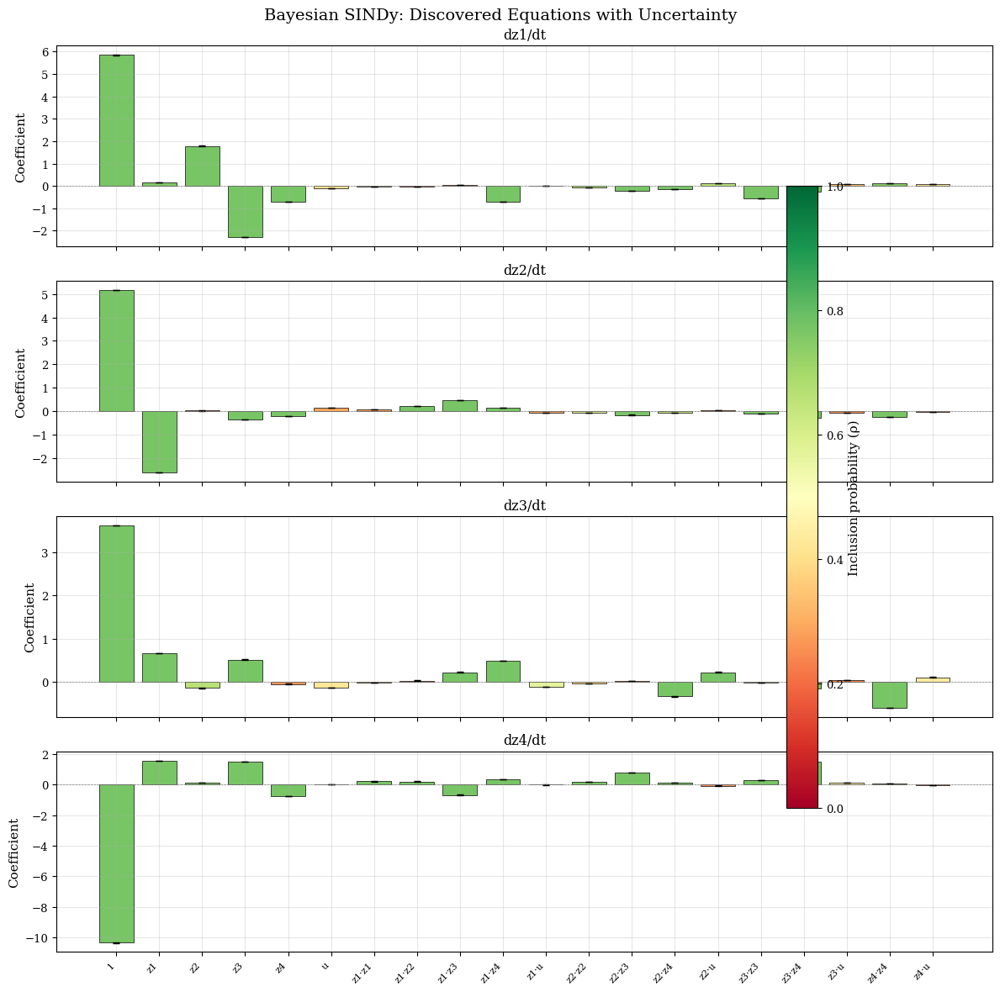

In [ ]:
"""
Plot the discovered SINDy coefficients

Plots the fitted SINDy coefficients for each latent dimension as bar charts, colored by how confident the fit is in including each term (its inclusion probability) and with error bars showing the posterior uncertainty in each coefficient.
"""

Xi = results['Xi_sparse']
rho = results['rho']
samples = results['samples']
sample_std = np.std(samples, axis=0)

# Build term labels
var_names = [f"z{i+1}" for i in range(latentDim)] + ["u"]
term_labels = label_library_terms(lib_idx, var_names)

fig, axes = plt.subplots(latentDim, 1, figsize=(12, 3 * latentDim), sharex = True)

for j in range(latentDim):
    ax = axes[j]
    coeffs = Xi[:, j]
    stds = sample_std[:, j]
    rhos = rho[:, j]

    # Color bars by inclusion probability
    colors = plt.cm.RdYlGn(rhos)  # green = high ρ, red = low ρ

    x = np.arange(len(term_labels))
    bars = ax.bar(x, coeffs, color=colors, edgecolor='black', linewidth=0.5)

    # Error bars from posterior samples
    ax.errorbar(x, coeffs, yerr=2 * stds, fmt='none', ecolor='black',
                capsize=3, linewidth=1)

    ax.axhline(0, color='grey', linewidth=0.5, linestyle='--')
    ax.set_ylabel('Coefficient')
    ax.set_title(f'dz{j+1}/dt')
    ax.set_xticks(x)
    ax.set_xticklabels(term_labels, rotation=45, ha='right', fontsize=8)
    ax.grid(True, alpha=0.3)

# Colorbar for inclusion probability
sm = plt.cm.ScalarMappable(cmap=plt.cm.RdYlGn, norm=plt.Normalize(0, 1))
sm.set_array([])
cbar = fig.colorbar(sm, ax=axes, label='Inclusion probability (ρ)', shrink=0.8)

plt.suptitle('Bayesian SINDy: Discovered Equations with Uncertainty', fontsize=14)
plt.tight_layout()
plt.show()

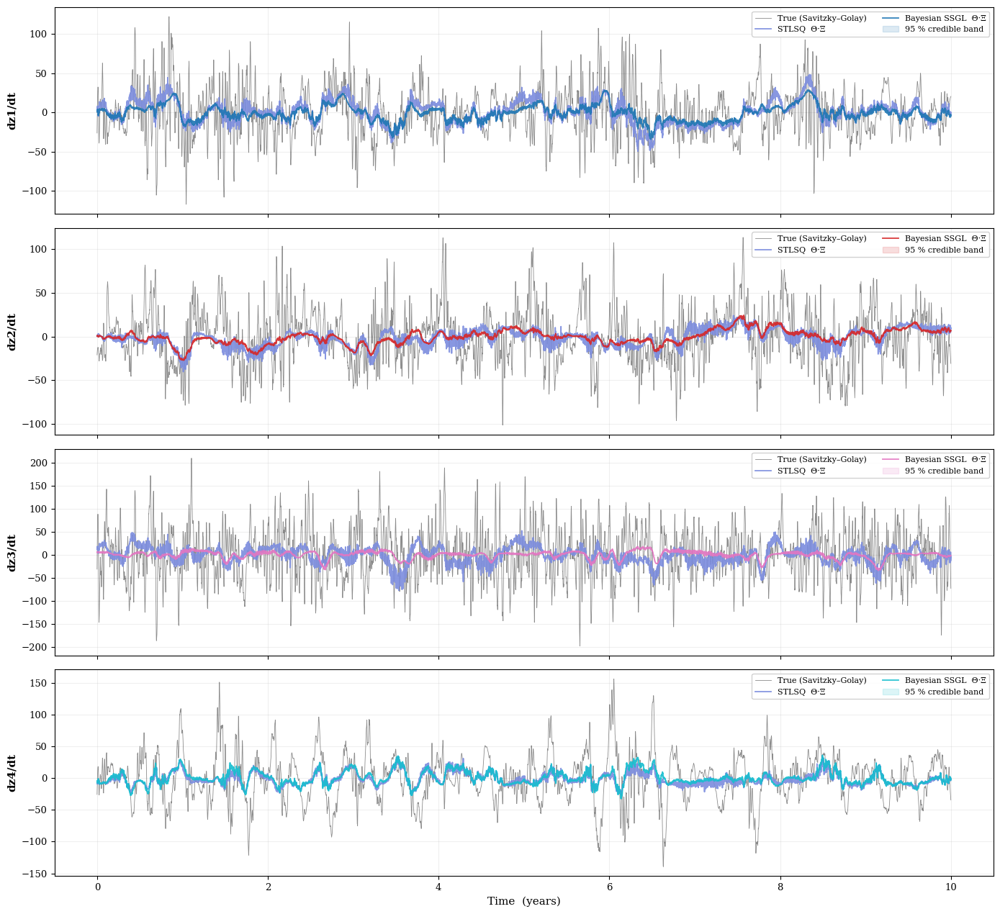

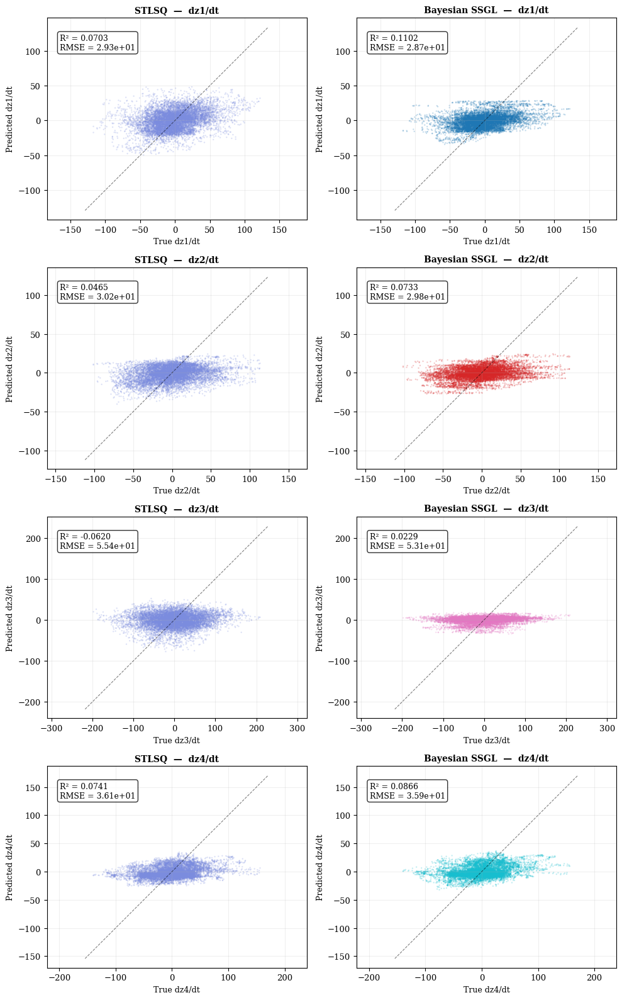

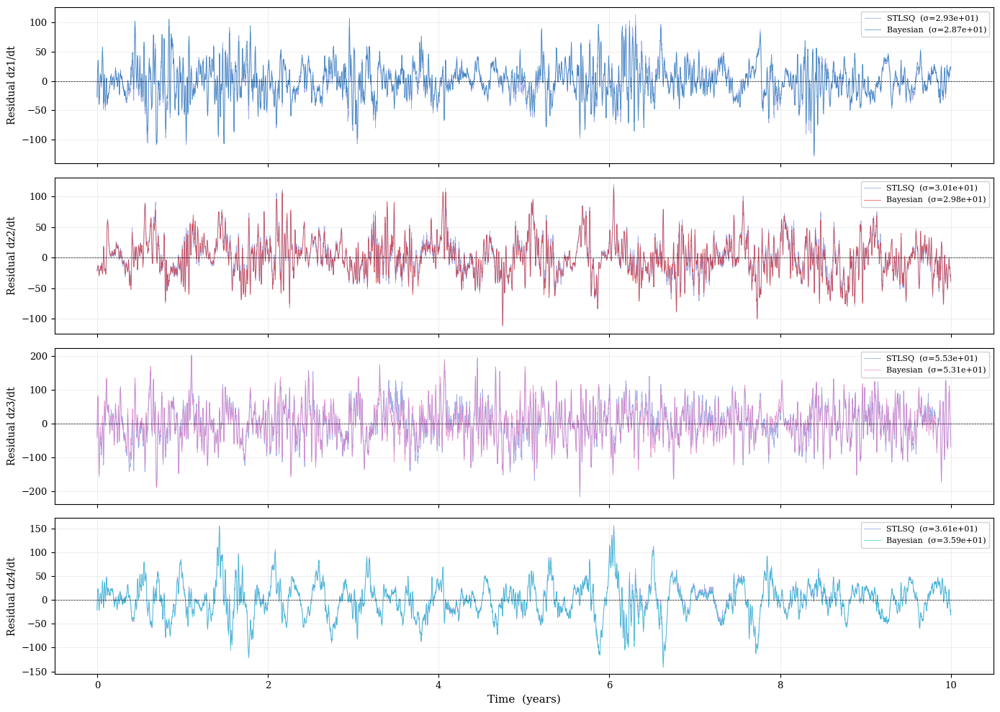

In [ ]:
"""
Plot the Discovered Polynomial Derivative Curves: STLSQ vs Bayesian SSGL
=========================================================================
Paste this cell into your notebook AFTER cells 31 and 42.

Requires in scope:
  - encNet, device, mu, sd          (encoder & normalisation)
  - Xtruth_state, U_t, dt_years     (data)
  - sindyLayer, lib_idx, latentDim   (STLSQ SINDy, cell 31)
  - results                          (Bayesian SSGL dict, cell 41)
  - _eval_poly_library               (library builder, cell 30)
"""

import numpy as np
import matplotlib.pyplot as plt
import torch

# ─────────────────────────────────────────────────────────────────
# 0.  Encoding the full trajectory into latent space
# ─────────────────────────────────────────────────────────────────
encNet.eval()
with torch.no_grad():
    Xtruth_t  = torch.tensor(Xtruth_state, dtype=torch.float32, device=device)
    mu_t      = torch.tensor(mu, dtype=torch.float32, device=device)
    sd_t      = torch.tensor(sd, dtype=torch.float32, device=device)
    XtruthN_t = (Xtruth_t - mu_t) / (sd_t + 1e-12)
    Z_all     = encNet(XtruthN_t).detach().cpu().numpy()   # [Nt, latentDim]


# ─────────────────────────────────────────────────────────────────
# 1.  True derivative (finite difference) & polynomial predictions
# ─────────────────────────────────────────────────────────────────
Zt   = Z_all[:-1] # [Nt-1, L]
Ut   = U_scalar_N
dZdt_true = dZdt # [Nt-1, L]

V = np.concatenate([Zt, Ut], axis=1) # [Nt-1, L+1]
Theta = _eval_poly_library(V, lib_idx) # [Nt-1, n_lib]

# STLSQ prediction:   dz/dt = Θ · Ξ_stlsq
Xi_stlsq    = sindyLayer.Xi.detach().cpu().numpy()
dZdt_stlsq  = Theta @ Xi_stlsq # [Nt-1, L]

# Bayesian prediction: dz/dt = Θ · Ξ_bayes
Xi_bayes    = results['Xi_sparse']
dZdt_bayes  = Theta @ Xi_bayes                             # [Nt-1, L]

# Bayesian uncertainty band (±2σ) via posterior samples
samples     = results['samples']                           # [n_samples, n_lib, L]
n_samples   = samples.shape[0]
dZdt_samples = np.einsum('ij,sjk->sik', Theta, samples)   # [n_samples, Nt-1, L]
dZdt_lo      = np.percentile(dZdt_samples, 2.5, axis=0)   # [Nt-1, L]
dZdt_hi      = np.percentile(dZdt_samples, 97.5, axis=0)  # [Nt-1, L]

# Time axis
t = np.arange(Zt.shape[0]) * dt_years

# ─────────────────────────────────────────────────────────────────
# 2.  Time-series plot: true vs predicted derivatives
# ─────────────────────────────────────────────────────────────────
eq_colors = plt.cm.tab10(np.linspace(0, 1, latentDim))

fig, axes = plt.subplots(latentDim, 1, figsize=(14, 3.2 * latentDim),
                         sharex=True)
if latentDim == 1:
    axes = [axes]

for j in range(latentDim):
    ax = axes[j]

    # True finite-difference derivative
    ax.plot(t, dZdt_true[:, j], color="black", linewidth=0.6,
            alpha=0.45, label="True (Savitzky–Golay)")

    # STLSQ polynomial curve
    ax.plot(t, dZdt_stlsq[:, j], color="#7B8CDE", linewidth=1.3,
            alpha=0.9, label="STLSQ  Θ·Ξ")

    # Bayesian polynomial curve + 95 % credible band
    ax.plot(t, dZdt_bayes[:, j], color=eq_colors[j], linewidth=1.3,
            alpha=0.9, label="Bayesian SSGL  Θ·Ξ")
    ax.fill_between(t, dZdt_lo[:, j], dZdt_hi[:, j],
                    color=eq_colors[j], alpha=0.15,
                    label="95 % credible band")

    ax.set_ylabel(f"dz{j+1}/dt", fontsize=11, fontweight="bold")
    ax.legend(fontsize=8, loc="upper right", framealpha=0.9, ncol=2)
    ax.grid(True, alpha=0.2)

axes[-1].set_xlabel("Time  (years)", fontsize=11)
#fig.suptitle("Polynomial Derivative Curves:  True  vs  STLSQ  vs  Bayesian SSGL",
 #            fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig(f"{outdir}/sindy_derivative_timeseries.png", dpi = 200, bbox_inches="tight")
plt.show()


# ─────────────────────────────────────────────────────────────────
# 3.  Scatter: predicted dz/dt  vs  true dz/dt  (goodness of fit)
# ─────────────────────────────────────────────────────────────────
fig2, axes2 = plt.subplots(latentDim, 2, figsize=(10, 4 * latentDim),
                           squeeze=False)

for j in range(latentDim):
    for col, (label, pred, color) in enumerate([
        ("STLSQ",         dZdt_stlsq, "#7B8CDE"),
        ("Bayesian SSGL",  dZdt_bayes,  eq_colors[j]),
    ]):
        ax = axes2[j, col]
        truth = dZdt_true[:, j]
        prd   = pred[:, j]

        ax.scatter(truth, prd, s=3, alpha=0.25, color=color, edgecolors="none")

        # 1:1 reference line
        lo, hi = min(truth.min(), prd.min()), max(truth.max(), prd.max())
        margin = 0.05 * (hi - lo)
        ax.plot([lo - margin, hi + margin], [lo - margin, hi + margin],
                'k--', linewidth=0.8, alpha=0.5)

        # R² annotation
        ss_res = np.sum((truth - prd) ** 2)
        ss_tot = np.sum((truth - truth.mean()) ** 2)
        r2 = 1.0 - ss_res / (ss_tot + 1e-8)
        rmse = np.sqrt(np.mean((truth - prd) ** 2))
        ax.text(0.05, 0.92,
                f"R² = {r2:.4f}\nRMSE = {rmse:.2e}",
                transform=ax.transAxes, fontsize=9,
                verticalalignment="top",
                bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.8))

        ax.set_xlabel(f"True dz{j+1}/dt", fontsize=9)
        ax.set_ylabel(f"Predicted dz{j+1}/dt", fontsize=9)
        ax.set_title(f"{label}  —  dz{j+1}/dt", fontsize=10, fontweight="bold")
        ax.set_aspect("equal", adjustable="datalim")
        ax.grid(True, alpha=0.2)

#fig2.suptitle("Predicted  vs  True Derivatives  (scatter)",
 #             fontsize=13, fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig(f"{outdir}/sindy_derivative_scatter.png", dpi = 200, bbox_inches="tight")
plt.show()


# ─────────────────────────────────────────────────────────────────
# 4.  Residual plot: where do the polynomials fail?
# ─────────────────────────────────────────────────────────────────
fig3, axes3 = plt.subplots(latentDim, 1, figsize=(14, 2.5 * latentDim),
                           sharex=True)
if latentDim == 1:
    axes3 = [axes3]

for j in range(latentDim):
    ax = axes3[j]
    res_stlsq = dZdt_true[:, j] - dZdt_stlsq[:, j]
    res_bayes = dZdt_true[:, j] - dZdt_bayes[:, j]

    ax.plot(t, res_stlsq, color="#7B8CDE", linewidth=0.6, alpha=0.7,
            label=f"STLSQ  (σ={np.std(res_stlsq):.2e})")
    ax.plot(t, res_bayes, color=eq_colors[j], linewidth=0.6, alpha=0.7,
            label=f"Bayesian  (σ={np.std(res_bayes):.2e})")
    ax.axhline(0, color="black", linewidth=0.5, linestyle="--")

    ax.set_ylabel(f"Residual dz{j+1}/dt", fontsize=10)
    ax.legend(fontsize=8, loc="upper right", framealpha=0.9)
    ax.grid(True, alpha=0.2)

axes3[-1].set_xlabel("Time  (years)", fontsize=11)
#fig3.suptitle("Residuals:  True − Predicted Derivative",
 #             fontsize=13, fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig(f"{outdir}/sindy_derivative_residuals.png", dpi = 200, bbox_inches="tight")
plt.show()

# Particle Filter

In [ ]:
"""
==========================================================================
PATCHED run_pf_once — with adaptive assimilation + 4-point snapshots
==========================================================================
Changes from the original:
  1. proc_sigma default = 0.05  (matches User Settings cell)
  2. Adaptive assimilation replaces fixed obs_thin
  3. nudge_gamma default = 0.1
  4. sigma_model_frac made explicit (was hardcoded 0.1)
  5. Calls reseed with J_selected for selected-only monitoring
  6. NEW: 4-point snapshot capture (prior, posterior, pre-reseed, post-reseed)
     at expanded k_snap schedule + dynamically discovered reseed events
  7. NEW: returns snap_data dict as 5th return value

==========================================================================
"""

def run_pf_once(J_fixed, seed = 0, verbose = False,
                do_candidate_stats = False,
                light = False, use_sindy = False,
                proc_sigma = 0.05, # was 0.01 — too low
                guided_prop = True,
                nudge_gamma = 0.5, # good value for adapted version
                nudge_alpha = 1.0,
                jitter = 1e-5,
                rejuv_scale = 0.02,
                rejuv_floor = 0.05,
                #obs_thin = 10, # assimilate every N steps
                sigma_model_frac = 0.1, # explicit control
                ess_skip_frac = 0.3,  # skip if ESS < this × Npart
                min_assimilation_gap = 3,  # minimum steps between assimilations
                k_snap_extra = None,  # additional snapshot timesteps (e.g. from a previous pass)
                ):

    torch.manual_seed(seed)
    np.random.seed(seed)

    # ---- Candidate stats accumulators ----
    meanESS = np.zeros(nCand, dtype=np.float64)
    meanKL  = np.zeros(nCand, dtype=np.float64)
    winsESS = np.zeros(nCand, dtype=np.int64)
    winsKL  = np.zeros(nCand, dtype=np.int64)

    # ---- Initialize particles ----
    xPriorMean = model.on.astype(np.float64)
    xPriorStd = Xtruth_state.std(axis=0) + 1e-6
    xPriorStd[5] *= 2.0

    X0p = xPriorMean[:, None] + xPriorStd[:, None] * np.random.randn(nX, Npart)
    X0pN = (X0p.T - mu) / sd
    X0pN_t = torch.tensor(X0pN, dtype=torch.float32, device=device)

    with torch.no_grad():
        Zp = encNet(X0pN_t).T

    w = torch.full((Npart,), 1.0 / Npart, device=device, dtype=torch.float32)

    # ---- Snapshot schedule ----
    # Minimal schedule for report: early convergence, mid, end
    k_snap_fixed = sorted(set([Nt // 10, Nt // 2, Nt - 1]))
    # Merge in any extra timesteps (e.g. reseed events from a discovery pass)
    if k_snap_extra is not None:
        # Limit to first 2 reseed events to keep output manageable
        k_snap = set(k_snap_fixed) | set(k_snap_extra[:2])
    else:
        k_snap = set(k_snap_fixed)
    # 4-point snapshot storage: {k: {prior, posterior, pre_reseed, post_reseed}}
    snap_data = {}
    reseed_times = []

    snap = {}

    if light:
        snap_pos = {kk: ii for ii, kk in enumerate(k_snap_fixed)}
        post_y_std = np.full((nCand, len(k_snap_fixed)), np.nan)
        NIS_pf = np.full(len(k_snap_fixed), np.nan)
        ESS_pf = np.full(len(k_snap_fixed), np.nan)
        Xfilt = None
    else:
        post_y_std = np.zeros((nCand, Nt))
        NIS_pf = np.zeros(Nt)
        ESS_pf = np.zeros(Nt)
        Xfilt = np.zeros((nX, Nt))

    last_assimilation = - min_assimilation_gap

    # ---- PF loop ----
    for k in range(Nt):

        # ======== FORECAST ========
        if k > 0:
            with torch.no_grad():
                if use_sindy:
                    u_src = globals().get("U_scalar_t", None)
                    if u_src is None:
                        u_tmp = torch.norm(U_t, dim=1, keepdim=True)
                        u_src = (u_tmp - u_tmp.mean(dim=0, keepdim=True)) / (u_tmp.std(dim=0, keepdim=True) + 1e-8)
                    u_raw = u_src[k - 1]
                else:
                    u_raw = U_t[k - 1]

                u_k = u_raw.to(device).reshape(1, -1).expand(Npart, -1)

                if use_sindy:
                    rhs = lambda zz: sindy_rhs(zz, u_k)
                else:
                    rhs = lambda zz: dynNet(torch.cat([zz, u_k], dim=1))
                Zp = runge_kutta(Zp.T.contiguous().float(), dt_years, rhs).T

            if proc_sigma > 0:
                Zp = Zp + proc_sigma * torch.randn_like(Zp)

            if not check_finite(Zp, "Zp (after forecast)", k):
                return Xfilt, ESS_pf, post_y_std, NIS_pf, snap_data

            Zp = torch.clamp(Zp, -10.0, 10.0)
            Zp = maybe_rejuvenate(Zp)

        # ======== DECODE + OBSERVE ========
        Xp_t, Yp_all_t = decode_and_observe(Zp)

        if not check_finite(Yp_all_t, "Yp_all_t (after decode)", k):
            return Xfilt, ESS_pf, post_y_std, NIS_pf, snap_data

        # ======== SNAPSHOT: PRIOR (after forecast+decode, before assimilation) ========
        if k in k_snap:
            snap_data.setdefault(k, {})
            snap_data[k]['prior'] = {
                'Y': Yp_all_t.detach().clone().cpu(),
                'w': w.detach().clone().cpu(),
            }

        y_all_k = Yobs_all_t[:, k]

        # ======== ADAPTIVE ASSIMILATION DECISION ========

        ESS_pre = (1.0 / (torch.sum(w**2) + eps)).item()
        gap_ok = (k - last_assimilation) >= min_assimilation_gap
        ess_ok = ESS_pre >= ess_skip_frac * Npart
        do_assim = gap_ok and ess_ok

        NIS_now = np.nan


        if do_assim:
            last_assimilation = k

            # ---- Candidate statistics (optional) ----
            if do_candidate_stats:
                for j in range(nCand):
                    sigma_j = sig_all_t[j]
                    innov_j = Yp_all_t[j, :] - y_all_k[j]
                    logL_j = -0.5 * (innov_j**2) / (sigma_j**2 + eps)

                    wj = w * torch.exp(logL_j - logL_j.max())
                    wj = wj / (wj.sum() + eps)

                    meanESS[j] += (1.0 / (torch.sum(wj**2) + eps)).item()
                    meanKL[j]  += torch.sum(wj * torch.log(wj * Npart + eps)).item()

                winsESS[int(torch.tensor(meanESS).argmax())] += 1
                winsKL[int(torch.tensor(meanKL).argmax())] += 1

            # ---- Select observations ----
            J = torch.as_tensor(J_fixed, device=device, dtype=torch.long)
            B = J.numel()

            yk_t   = Yobs_all_t[J, k].view(-1, 1)
            yhat_t = Yp_all_t[J, :]
            sig_t  = sig_all_t[J].view(-1, 1)

            # ---- Standard NIS on PRIOR particles ----
            # Compute before the EnKF nudge, otherwise the innovation is artificially reduced.
            with torch.no_grad():
              NIS_now = compute_nis_standard(
                      yhat_prior = yhat_t,
                      w_prior    = w,
                      y_obs      = yk_t.view(-1),
                      sig_obs    = sig_t.view(-1),
                      )

            if not np.isfinite(NIS_now):
              NIS_now = np.nan

            # ---- EnKF proposal ----
            if guided_prop:
                with torch.no_grad():
                    Zp = enkf_proposal(Zp, yhat_t, yk_t, w, sig_t,
                                       nudge_gamma, nudge_alpha, jitter)
                    Xp_t, Yp_all_t = decode_and_observe(Zp)

                    if not check_finite(Yp_all_t, "Yp_all_t (after nudge)", k):
                        return Xfilt, ESS_pf, post_y_std, NIS_pf, snap_data

                    yhat_t = Yp_all_t[J, :]

            # ---- Weight update ----
            ymean_sel = (w[None, :] * yhat_t).sum(dim=1, keepdim=True)
            yvar_sel  = (w[None, :] * (yhat_t - ymean_sel)**2).sum(dim=1, keepdim=True)
            sigma_model = sigma_model_frac * torch.sqrt(yvar_sel + 1e-12)
            sig_eff = torch.sqrt(sig_t**2 + sigma_model**2)

            innov_t = yhat_t - yk_t
            quad_t = torch.sum((innov_t / (sig_eff + eps))**2, dim=0)

            # NIS already computed on PRIOR particles above (Patch B.1).
            # Do NOT recompute here — post-nudge yhat_t is biased toward yk_t
            # by construction, which would deflate the statistic.
            gamma_weight = nudge_gamma if guided_prop else 0.0
            logL_t = -0.5 * (1.0 - gamma_weight) * quad_t

            logL_t = torch.where(torch.isfinite(logL_t), logL_t,
                                 torch.tensor(-1e30, device=device))

            logw_t = torch.log(w + eps) + logL_t
            logw_t -= logw_t.max()
            w = torch.exp(logw_t)
            w /= (w.sum() + eps)

        # ======== END ASSIMILATION BLOCK ========

        # ======== SNAPSHOT: POSTERIOR (after assimilation, before resample) ========
        if k in k_snap:
            Xp_t_post_assim, Yp_post_assim = decode_and_observe(Zp)
            snap_data[k]['posterior'] = {
                'Y': Yp_post_assim.detach().clone().cpu(),
                'w': w.detach().clone().cpu(),
            }

        ESS_now = (1.0 / (torch.sum(w**2) + eps)).item()
        #NIS_now = 0.0  # only meaningful on assimilation steps
        # Posterior obs stats
        Xp_t, Yp_all_t = decode_and_observe(Zp)

        if not check_finite(Yp_all_t, "Yp_all_t (after weights)", k):
            return Xfilt, ESS_pf, post_y_std, NIS_pf, snap_data

        ypost_mean = (w[None, :] * Yp_all_t).sum(dim=1)
        ypost_var  = (w[None, :] * (Yp_all_t - ypost_mean[:, None])**2).sum(dim=1)

        # ======== STORE ========
        if light:
            if k in snap_pos:
                ii = snap_pos[k]
                post_y_std[:, ii] = torch.sqrt(ypost_var + 1e-12).cpu().numpy()
                ESS_pf[ii] = ESS_now
                NIS_pf[ii] = NIS_now
        else:
            post_y_std[:, k] = torch.sqrt(ypost_var + 1e-12).cpu().numpy()
            ESS_pf[k] = ESS_now
            NIS_pf[k] = NIS_now
            Xfilt[:, k] = (Xp_t @ w).detach().cpu().numpy()

        if k in k_snap:
            snap[k] = (Xp_t.detach().cpu().numpy(), w.detach().cpu().numpy())

        # ======== VERBOSE ========
        if verbose and (k % 5000 == 0):
            print(f"k={k}, ESS={ESS_now:.1f}, NIS={NIS_now:.2f}, "
                  f"J={[ObsNames[int(x)] for x in J_fixed]}")

        # ======== RESAMPLE ========
        if ESS_now < resampESS * Npart:
            idx_r = systematic_resample_torch(w)
            Zp = Zp.index_select(dim=1, index=idx_r)
            scale = Zp.std(dim=1, keepdim=True) + 1e-6
            Zp = Zp + (rejuv_scale * scale + rejuv_floor) * torch.randn_like(Zp)
            w = torch.full((Npart,), 1.0 / Npart, device=device, dtype=torch.float32)

        # ======== SNAPSHOT: PRE-RESEED (after resample, before reseed) ========
        if k in k_snap:
            Xp_t_pre_rs, Yp_pre_rs = decode_and_observe(Zp)
            snap_data[k]['pre_reseed'] = {
                'Y': Yp_pre_rs.detach().clone().cpu(),
                'w': w.detach().clone().cpu(),
            }

        # ======== RESEED ========
        Zp, did_reseed = reseed_collapsed_particles(Zp, w, Xp_t, Yp_all_t, J_selected = J_fixed)
        if did_reseed:
            reseed_times.append(k)
            # Dynamically add this timestep to snapshot schedule
            # and capture it immediately if it wasn't already scheduled
            if k not in k_snap:
                k_snap.add(k)
                # Retroactively fill prior/posterior from current-step data
                # (these are approximate — the exact prior was before assimilation)
                snap_data.setdefault(k, {})
                # We don't have the exact prior/posterior saved, so mark them
                snap_data[k]['note'] = 'reseed_discovered_dynamically'
                # But we DO have a valid pre-reseed from just above...
                # except we skipped it since k wasn't in k_snap yet.
                # Re-capture pre-reseed state (particles already reseeded,
                # so this is actually post-reseed now — we need the post-reseed):
                Xp_t_post_rs, Yp_post_rs = decode_and_observe(Zp)
                snap_data[k]['post_reseed'] = {
                    'Y': Yp_post_rs.detach().clone().cpu(),
                    'w': w.detach().clone().cpu(),
                }
            else:
                # k was already scheduled — capture post-reseed normally
                Xp_t_post_rs, Yp_post_rs = decode_and_observe(Zp)
                snap_data[k]['post_reseed'] = {
                    'Y': Yp_post_rs.detach().clone().cpu(),
                    'w': w.detach().clone().cpu(),
                }
        else:
            # No reseed: post_reseed == pre_reseed (copy reference)
            if k in k_snap and 'pre_reseed' in snap_data.get(k, {}):
                snap_data[k]['post_reseed'] = snap_data[k]['pre_reseed']

        if verbose and did_reseed:
            print(f"  [RESEED] k={k}")

    # Store reseed times in snap_data for downstream use
    snap_data['_reseed_times'] = reseed_times
    snap_data['_k_snap_fixed'] = k_snap_fixed

    return Xfilt, ESS_pf, post_y_std, NIS_pf, snap_data

In [ ]:
"""
Self-test for the ensemble-Kalman nudge

Checks the ensemble-Kalman-style particle nudge on a simple linear-Gaussian test problem where the correct answer is known exactly, to confirm it reproduces the textbook Kalman filter result before trusting it inside the full particle filter.
"""

def enkf_self_test(N=2000, seed=0, tol_mean=0.1, tol_cov=0.15):
    rng = np.random.default_rng(seed)
    d_z, d_y = 4, 1

    # Linear-Gaussian setup
    F = np.eye(d_z) * 0.9
    H = np.zeros((d_y, d_z)); H[0, 0] = 1.0
    Q = np.eye(d_z) * 0.5**2
    R_true = np.eye(d_y) * 0.3**2

    # Prior particles
    z0 = rng.normal(size=(d_z,))
    P0 = np.eye(d_z) * 1.0
    Z = z0[:, None] + np.linalg.cholesky(P0) @ rng.normal(size=(d_z, N))

    # One forecast step
    Z = F @ Z + np.linalg.cholesky(Q) @ rng.normal(size=(d_z, N))

    # Synthetic observation
    z_truth = F @ z0 + np.linalg.cholesky(Q) @ rng.normal(size=(d_z,))
    y_obs = H @ z_truth + np.linalg.cholesky(R_true) @ rng.normal(size=(d_y,))

    # Analytic Kalman update
    z_prior_mean = Z.mean(axis=1)
    P_prior = np.cov(Z)
    S = H @ P_prior @ H.T + R_true
    K = P_prior @ H.T @ np.linalg.inv(S)
    z_post_kf = z_prior_mean + K @ (y_obs - H @ z_prior_mean)
    P_post_kf = P_prior - K @ H @ P_prior

    # Run enkf_proposal
    Zp_t = torch.tensor(Z, dtype=torch.float32, device=device)
    yhat_t = torch.tensor(H @ Z, dtype=torch.float32, device=device)
    yk_t = torch.tensor(y_obs.reshape(-1, 1), dtype=torch.float32, device=device)
    w = torch.full((N,), 1.0/N, device=device, dtype=torch.float32)
    sig_t = torch.tensor(np.sqrt(np.diag(R_true)).reshape(-1, 1),
                         dtype=torch.float32, device=device)

    # γ=1.0 disables R inflation (so R_eff matches R_true);  α=1.0 = full update
    Zp_post = enkf_proposal(Zp_t, yhat_t, yk_t, w, sig_t,
                            nudge_gamma=1.0, nudge_alpha=1.0).cpu().numpy()

    z_post_pf = Zp_post.mean(axis=1)
    P_post_pf = np.cov(Zp_post)

    err_mean = np.linalg.norm(z_post_pf - z_post_kf)
    err_cov = np.linalg.norm(P_post_pf - P_post_kf, ord='fro') / \
              np.linalg.norm(P_post_kf, ord='fro')

    print(f"enkf_proposal self-test:")
    print(f"  posterior mean error: {err_mean:.4f}  (tol {tol_mean})")
    print(f"  posterior cov rel err: {err_cov:.4f}  (tol {tol_cov})")
    if err_mean > tol_mean or err_cov > tol_cov:
        raise RuntimeError(
            "enkf_proposal does NOT match analytic Kalman posterior. "
            "Bug in implementation — investigate R inflation, gain construction, "
            "or tanh clamp before re-enabling nudging in the main PF.")
    print("  PASSED")

enkf_self_test()

enkf_proposal self-test:
  posterior mean error: 0.0058  (tol 0.1)
  posterior cov rel err: 0.0189  (tol 0.15)
  PASSED


In [ ]:
"""
Plotting helper for particle snapshots

Defines a function that plots the particle filter's predicted and corrected distributions at a chosen point in time, adapting the layout depending on whether a resampling ('reseed') event happened at that step.
"""

def plot_snapshot_set(snap_data, k, obs_idx, obs_name, y_true, y_obs):
    """
    Plot available snapshot captures for a given timestep and observable.

    Adapts layout automatically:
      - If pre_reseed != post_reseed (reseed fired): 2x2 panel
      - Otherwise: 1x2 prior/posterior panel
    """
    if k not in snap_data:
        print(f"No snapshot data for k={k}")
        return

    sd = snap_data[k]

    has_reseed_change = (
        'pre_reseed' in sd and 'post_reseed' in sd
        and not torch.equal(sd['pre_reseed']['Y'], sd['post_reseed']['Y'])
    )

    if has_reseed_change:
        fig, axes = plt.subplots(2, 2, figsize=(14, 10))
        panels = [
            ('prior',       'Prior (forecast only)',         axes[0, 0]),
            ('posterior',    'Posterior (after assimilation)', axes[0, 1]),
            ('pre_reseed',  'Pre-reseed (after resample)',   axes[1, 0]),
            ('post_reseed', 'Post-reseed (recovered)',       axes[1, 1]),
        ]
    else:
        fig, axes = plt.subplots(1, 2, figsize=(14, 5))
        panels = [
            ('prior',     'Prior (forecast only)',         axes[0]),
            ('posterior',  'Posterior (after assimilation)', axes[1]),
        ]

    for key, title, ax in panels:
        if key not in sd:
            ax.set_title(f"{title}\n(not captured)")
            ax.text(0.5, 0.5, "N/A", ha='center', va='center',
                    transform=ax.transAxes, fontsize=14, color='gray')
            continue

        samples = sd[key]['Y'][obs_idx, :].numpy()
        weights = sd[key]['w'].numpy()

        plot_pdf_1d(samples, weights, true=y_true, ax=ax, title=f"{title}")
        ax.axvline(y_obs, color="tab:cyan", ls="--", label="noisy obs")
        ax.set_xlabel(obs_name)
        ax.legend(fontsize=8)

    is_reseed = k in snap_data.get('_reseed_times', [])
    event_tag = " [RESEED]" if is_reseed else ""
    fig.suptitle(f"k={k}{event_tag} — {obs_name}", fontsize=14)
    plt.tight_layout()
    plt.show()
    return fig


def list_snapshots(snap_data):
    """Print available snapshot timesteps and what was captured at each."""
    reseed_times = snap_data.get('_reseed_times', [])
    k_fixed = snap_data.get('_k_snap_fixed', [])

    print(f"Fixed schedule:  {k_fixed}")
    print(f"Reseed events:   {reseed_times}")
    print()

    for k in sorted(k for k in snap_data if isinstance(k, int)):
        sd = snap_data[k]
        keys = [key for key in ['prior', 'posterior', 'pre_reseed', 'post_reseed'] if key in sd]
        tag = " [RESEED]" if k in reseed_times else ""
        print(f"  k={k:>6d}{tag:10s}  captured: {', '.join(keys)}")

In [ ]:
"""
Recalibrating the observation noise

Replaces an earlier, simpler noise setting with one based on the filter's own prediction errors (an innovation-based approach): rather than assuming the observation noise equals the natural variability of the truth, it accounts for the fact that the filter is really comparing observations against the surrogate model's imperfect predictions, which have their own error on top of that.
"""

print("Recalibrating σ_obs against current surrogate's one-step residuals...")

encNet = encNet.to(device).eval()
decNet = decNet.to(device).eval()
dynNet = dynNet.to(device).eval()

with torch.no_grad():
    # Encode truth, do one-step dynNet prediction, decode, observe.
    # No filter, no resampling — just the surrogate's open-loop forecast error.
    XN_t_local = torch.tensor((Xtruth_state - mu) / sd,
                              dtype=torch.float32, device=device)
    Z_truth = encNet(XN_t_local)                           # (Nt, latentDim)

    # One-step rollout of dynNet from each Z_truth[k] given U_t[k]
    u_in = U_t[:Z_truth.shape[0] - 1].to(device)
    Z_pred = runge_kutta(
        Z_truth[:-1].contiguous(), dt_years,
        lambda zz: dynNet(torch.cat([zz, u_in], dim=1))
    )                                                       # (Nt-1, latentDim)

    # Decode predicted latent → predicted physical → predicted observations
    X_pred_norm = decNet(Z_pred)
    X_pred = X_pred_norm * sd_t + mu_t                     # (Nt-1, nX)
    Y_pred = obs_candidates_torch(X_pred.T)                # (nCand, Nt-1)

    # Truth observations on the same time grid (one step ahead)
    Y_true_step = Ytruth_all_t[:, 1:Z_truth.shape[0]]

    # Residuals = surrogate one-step prediction error (in physical units)
    residual = (Y_pred - Y_true_step).cpu().numpy()        # (nCand, Nt-1)
    emp_std = residual.std(axis=1)

# Update σ_obs to the larger of (old climatological floor, empirical std).
# Never decrease — the original alpha*std floor reflects irreducible obs
# uncertainty even with a perfect model. Empirical inflation absorbs the
# surrogate residual on top of that.
sig_old_np = sig_all_t.detach().cpu().numpy()
sig_new_np = np.maximum(sig_old_np, emp_std)

print(f"\n{'Observable':18s}  {'σ_old':>10s}  {'emp_std':>10s}  {'σ_new':>10s}  inflation")
print("-" * 70)
for j, nm in enumerate(ObsNames):
    infl = sig_new_np[j] / max(sig_old_np[j], 1e-12)
    print(f"  {nm:18s}  {sig_old_np[j]:10.5f}  {emp_std[j]:10.5f}  "
          f"{sig_new_np[j]:10.5f}  {infl:6.2f}×")

# Commit the new σ_obs and regenerate noisy observations consistently
sig_all_t = torch.tensor(sig_new_np, dtype=torch.float32, device=device)
torch.manual_seed(1)   # match cell-21 reproducibility seed
noise_t = sig_all_t[:, None] * torch.randn(nCand, Nt, device=device)
Yobs_all_t = Ytruth_all_t + noise_t
Yobs_all_t[name_to_idx["delta_rho"]] = torch.clamp(
    Yobs_all_t[name_to_idx["delta_rho"]], 0.0, 1.0
)

print(f"\nUpdated sig_all_t and regenerated Yobs_all_t.")
print(f"Total inflation factor (geom. mean): "
      f"{np.exp(np.mean(np.log(sig_new_np / np.maximum(sig_old_np, 1e-12)))):.2f}×")

Recalibrating σ_obs against current surrogate's one-step residuals...

Observable               σ_old     emp_std       σ_new  inflation
----------------------------------------------------------------------
  psi_max                0.01326     0.03422     0.03422    2.58×
  delta_rho              0.00018     0.00103     0.00103    5.78×
  delta_S                0.00035     0.00097     0.00097    2.77×
  T_north_surf           0.00008     0.00035     0.00035    4.52×

Updated sig_all_t and regenerated Yobs_all_t.
Total inflation factor (geom. mean): 3.70×


# Final re-run (two-pass)

In [ ]:
"""
Search over which variables to observe (expensive)

An extensive experiment that reruns the whole particle-filter pipeline many times, each time changing which combination of variables is assimilated, then scores how well each combination estimates a held-out target variable. This is used to decide which observation set to use going forward.
"""

"""

This is an exhaustive Monte Carlo model selection computation around the PF.
Specifically, it's running the same AE PF pipeline many times, it is
changing only which obervation variables are assimilated, then it scores
how well each obsrevation subset estimates a reserved target variable. In the
current configuration the withheld variables is ΔS. As such, for each possible
observation subset J, the PF is tested on how well it can infer ΔS even though
it is not observed and only if the assimilation occurs for the variables in J.

Concretelly, each obs replicate is a new noisy observation dataset generated
from the same truth (Y_{obs} = Y_{truth} + σ_{obs}ε). So replicate 1, 2, 3, 4,
and 5 all use the same underlying true trajectory, but with different random
observational noise added.

Each subset is scored by the time-averaged posterior uncertainty of a withheld
target diagnostic, normalized by its observational scale
(σ_{ΔS}^{post}/σ_{obs,ΔS}). In other words it scores how sharp the PF posterior
is.

ESS and NIS gates reject subsets that achieve artificially sharp posteriors
through particle collapse or innovation inconsistency. The resulting ranking
therefore reflects not only information content, but also particle-filter
stability and statistical calibration.

 Why light=False here:
   The patched run_pf_once stores diagnostics in light mode at exactly
   3 fixed timesteps {Nt//10, Nt//2, Nt-1}. With adaptive assimilation
   (ess_skip_frac=0.3, min_assim_gap=3) those clocks almost never hit
   an actual assim step, so meanESS == Npart at every snapshot and the
   post_y_std being "scored" is just the freshly-resampled prior spread.
   Result: the metric ends up orthogonal to information gain.
   Going light=False writes per-step diagnostics over all Nt, so the
   nanmean is over a real time series.

 Note on NIS: as of the Patch B/C fixes, NIS_now is the standard
   ν^T S^{-1} ν statistic on PRIOR particles (Bar-Shalom §5.4) and
   follows χ²_d under correct specification, with d = len(J).
   Gate is the χ²_d 99.9% quantile × safety factor — anything above
   indicates filter mis-specification (under-dispersed prior, wrong R,
   or systematic bias). The previous gate of 200 had no statistical
   meaning; the χ²_d-based gate below has a clean false-positive rate.
"""

seeds = list(range(20))

# ── Outer Monte Carlo over observation-noise realizations ──────────────────
# Each rep redraws Yobs_all from the same truth, then runs the full obs-set
# search with the existing 20-seed PF inner loop. Per-subset scores are
# concatenated across reps, so scores_by_subset[J] becomes an array of length
# M_OBS_REPS * len(seeds) and downstream cell 75 needs no changes — its
# .mean() / .std() will just reflect both PF-internal and obs-realization
# variability.

M_OBS_REPS    = 5
OBS_REP_SEED  = 2025

# Save canonical Yobs to restore after the outer loop finishes
_Yobs_all_saved   = Yobs_all.copy()
_Yobs_all_t_saved = Yobs_all_t.clone()
obs_rep_rng       = np.random.default_rng(OBS_REP_SEED)

results          = []
scores_by_subset = {}
ess_by_subset    = {}      # for sanity reporting
target_name      = "delta_S"
target_idx       = ObsNames.index(target_name)

diag_rows = []


def _safe_finite_reduce(arr, reducer=np.nanmean):
    """Return (value, n_finite, n_total) — NaN-tolerant reduction."""
    arr = np.asarray(arr, dtype=float)
    n_finite = int(np.isfinite(arr).sum())
    if n_finite == 0:
        return np.nan, 0, arr.size
    return float(reducer(arr[np.isfinite(arr)])), n_finite, arr.size

sig_used = sig_all_t.detach().cpu().numpy()

for rep in range(M_OBS_REPS):
    # ── Redraw observation noise for this replicate ────────────────────────
    Yobs_all = Ytruth_all + obsSigmas_all[:, None] * obs_rep_rng.standard_normal(Ytruth_all.shape)
    Yobs_all_t = torch.tensor(Yobs_all, dtype=torch.float32, device=device)
    print(f"\n========== Obs replicate {rep + 1}/{M_OBS_REPS} ==========")

    for B in range(1, nCand + 1):
        for J in itertools.combinations(range(nCand), B):

          # Don't assimilate the target variable itself
          if target_idx in J:
              continue

          seed_scores, seed_ess, seed_nis = [], [], []
          seed_ess_min = []                 # worst-case ESS across the run
          n_seeds_partial = 0
          n_seeds_dead    = 0

          for s in seeds:
              # light=False → post_y_std, ESS_pf, NIS_pf are full (nCand, Nt) / (Nt,)
              _, ESS_tmp, std_tmp, NIS_tmp, *_ = run_pf_once(
                  list(J), seed=s,
                  light=False,
                  do_candidate_stats=False,
              )

              # ── Score: time-mean posterior width on target, in σ_obs units
              sc, n_sc, _ = _safe_finite_reduce(
                  std_tmp[target_idx, :] / obsSigmas_all[target_idx]
              )

              # ── Filter health
              me, n_me, _ = _safe_finite_reduce(ESS_tmp)
              mn, n_mn, _ = _safe_finite_reduce(NIS_tmp)

              # Worst-case ESS over the run (catches collapse the mean hides)
              if n_me > 0:
                  me_min = float(np.nanmin(ESS_tmp))
              else:
                  me_min = np.nan

              # PF produced no usable diagnostics whatsoever
              if n_sc == 0 and n_me == 0:
                  n_seeds_dead += 1
                  continue

              # PF aborted partway (check_finite triggered)
              if n_me < ESS_tmp.size or n_sc < std_tmp.shape[1]:
                  n_seeds_partial += 1

              if not (np.isfinite(sc) and np.isfinite(me)):
                  continue

              # ── Health gates
              if me < 0.2 * Npart:
                sc = np.inf

              # χ²_d-based gate: filter is mis-specified if mean NIS exceeds
              # ~3× the 99.9% quantile of χ²_d. For d∈{1,2,3,4} that gives
              # gates ≈ {32.9, 41.4, 48.7, 55.5}. Safety factor of 3 admits
              # heavy-tailed but non-catastrophic regimes (e.g. brief
              # under-dispersion during regime transitions).
              from scipy.stats import chi2
              d_obs = len(J)
              NIS_GATE = 3.0 * chi2.ppf(0.999, df=d_obs)
              if np.isfinite(mn) and mn > NIS_GATE:
                  sc = np.inf

              seed_scores.append(sc)
              seed_ess.append(me)
              seed_ess_min.append(me_min)
              if np.isfinite(mn):
                  seed_nis.append(mn)

          diag_rows.append({
              "obs":        [ObsNames[j] for j in J],
              "n_used":     len(seed_scores),
              "n_partial":  n_seeds_partial,
              "n_dead":     n_seeds_dead,
              "ess_mean":   float(np.nanmean(seed_ess))     if seed_ess     else np.nan,
              "ess_min":    float(np.nanmean(seed_ess_min)) if seed_ess_min else np.nan,
          })

          if len(seed_scores) == 0:
              continue

          arr = np.array(seed_scores, dtype=float)
          ess_arr = np.array(seed_ess, dtype=float)
          key = tuple(sorted(J))
          # Concatenate across obs-noise replicates rather than overwriting
          if key in scores_by_subset:
              scores_by_subset[key] = np.concatenate([scores_by_subset[key], arr])
              ess_by_subset[key]    = np.concatenate([ess_by_subset[key],    ess_arr])
          else:
              scores_by_subset[key] = arr
              ess_by_subset[key]    = ess_arr

          results.append((
              float(np.nanmean(arr)),
              float(np.nanmean(seed_ess)) if seed_ess else np.nan,
              float(np.nanmean(seed_nis)) if seed_nis else np.nan,
              list(J),
          ))

# Restore canonical Yobs for any downstream cells that depend on it
Yobs_all   = _Yobs_all_saved
Yobs_all_t = _Yobs_all_t_saved

# ── Diagnostic table ──────────────────────────────────────────
print("Per-subset PF health across seeds:")
hdr = (f"  {'subset':<40s} {'used':>5s} {'partial':>8s} {'dead':>5s}  "
       f"{'<ESS>':>7s}  {'min ESS':>8s}")
print(hdr)
for row in diag_rows:
    ess_mean_str = f"{row['ess_mean']:7.1f}" if np.isfinite(row['ess_mean']) else "    NaN"
    ess_min_str  = f"{row['ess_min']:8.1f}"  if np.isfinite(row['ess_min'])  else "     NaN"
    print(f"  {' + '.join(row['obs']):<40s} "
          f"{row['n_used']:>5d} {row['n_partial']:>8d} {row['n_dead']:>5d}  "
          f"{ess_mean_str}  {ess_min_str}")


# ── Bail out gracefully if nothing survived ───────────────────
if not results:
    raise RuntimeError(
        "No observation subset produced finite scores. "
        "Inspect the diagnostic table: high `dead` => PF crashed early "
        "(check_finite tripping); high `partial` => PF aborted mid-run; "
        "low <ESS> => filter degenerate."
    )


# ── Rank and report ───────────────────────────────────────────
results.sort(key=lambda x: x[0])

print(f"\nTop 5 obs sets by smallest mean posterior PDF width ({target_name}):")
for score, mean_ess, mean_nis, J in results[:5]:
    arr = scores_by_subset[tuple(sorted(J))]
    finite = arr[np.isfinite(arr)]
    spread = finite.std(ddof=1) if finite.size > 1 else 0.0
    nis_str = f"{mean_nis:.2f}" if np.isfinite(mean_nis) else "NaN"

    print(f"  PDFwidth={score:.4g} ± {spread:.4g} | "
          f"meanESS={mean_ess:.1f} | meanNIS={nis_str} | "
          f"obs={[ObsNames[j] for j in J]}")

best_J = results[0][3]
print(f"\nBEST: {[ObsNames[j] for j in best_J]}")


========== Obs replicate 1/5 ==========

========== Obs replicate 2/5 ==========

========== Obs replicate 3/5 ==========

========== Obs replicate 4/5 ==========

========== Obs replicate 5/5 ==========
Per-subset PF health across seeds:
  subset                                    used  partial  dead    <ESS>   min ESS
  psi_max                                     20        0     0    744.0      56.4
  delta_rho                                   20        0     0    748.5      68.5
  T_north_surf                                20        0     0    746.4      89.9
  psi_max + delta_rho                         20        0     0    739.5      31.1
  psi_max + T_north_surf                      20        0     0    742.8      16.0
  delta_rho + T_north_surf                    20        0     0    741.0      41.5
  psi_max + delta_rho + T_north_surf          20        0     0    736.2      19.6
  psi_max                                     20        0     0    743.2      67.7
  delta_rho  

In [ ]:
"""
Find when the filter resamples

Runs a lightweight pass of the particle filter purely to discover the timesteps at which particle resampling ('reseeding') occurs, information used by later diagnostic cells.
"""

# Pass 1: lightweight, discover reseed times only
_, _, _, _, *extra = run_pf_once(
    best_J, seed=0, verbose=False, do_candidate_stats=False, light=False)

discovered_reseeds = extra[0].get('_reseed_times', []) if extra else []
print(f"Pass 1: found {len(discovered_reseeds)} reseeds at {discovered_reseeds[:5]}{'...' if len(discovered_reseeds) > 5 else ''}")

# Pass 2: full run, first 2 reseed events baked into snapshot schedule
Xfilt, ESS_pf, post_y_std, NIS_pf, *extra = run_pf_once(
    best_J, seed=0, verbose=False, do_candidate_stats=True, light=False,
    k_snap_extra=discovered_reseeds)

snap_data = extra[0] if extra else {}

# Show what's available — then pick what to plot manually
list_snapshots(snap_data)

Pass 1: found 0 reseeds at []
Fixed schedule:  [1000, 5000, 10000]
Reseed events:   []

  k=  1000            captured: prior, posterior, pre_reseed, post_reseed
  k=  5000            captured: prior, posterior, pre_reseed, post_reseed
  k= 10000            captured: prior, posterior, pre_reseed, post_reseed


NIS_pf inventory:  shape=(10001,)  finite=3334  >0=3334  ==0=0  NaN=6667
Stationary NIS calibration (3334 samples):
  d (= |J|)   : 3
  mean NIS    : 9.954    (χ²_3 reference: 3)
  var  NIS    : 119.898    (χ²_3 reference: 6)
  KS p-value  : 0    (>0.05 = consistent with χ²_3)


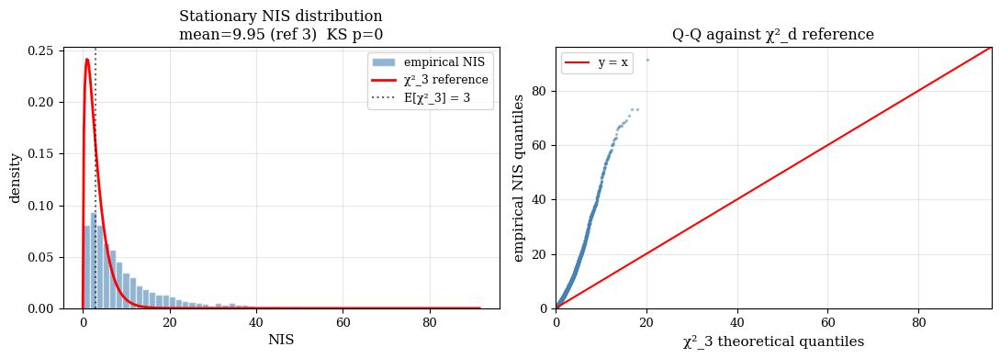

In [ ]:
"""
Check filter calibration on the stable period

Verifies that the filter's innovation statistic follows its expected reference distribution on the pre-hosing (stable) part of the trajectory, where the filter should be well-tuned. Passing this check means any miscalibration seen later, during the hosing experiment, is a meaningful signal rather than a general filter problem.
"""

from scipy.stats import chi2, kstest

# Sanity guards
assert "NIS_pf" in globals(), "Run cell 65 (canonical stationary PF) first."
assert "best_J" in globals(), "best_J not defined — run cell 64 first."
assert NIS_pf.shape[0] == Nt, (
    f"NIS_pf length {NIS_pf.shape[0]} != Nt {Nt}. "
    "Re-run cell 65 with light=False on the stationary trajectory."
)

# Diagnostic: what's actually in NIS_pf?
n_finite = int(np.isfinite(NIS_pf).sum())
n_pos    = int((NIS_pf > 0).sum())
n_zero   = int((NIS_pf == 0).sum())
n_nan    = int(np.isnan(NIS_pf).sum())
print(f"NIS_pf inventory:  shape={NIS_pf.shape}  "
      f"finite={n_finite}  >0={n_pos}  ==0={n_zero}  NaN={n_nan}")

if n_finite == 0:
    raise RuntimeError(
        "No finite NIS values in NIS_pf. Likely cause: Patch B in cell 61 "
        "did not take effect. Check that compute_nis_standard is called "
        "before the nudge and assigned to NIS_now, and that NIS_now is "
        "stored to NIS_pf[k] in the assim block."
    )

# Use just the finite mask (don't filter zeros — they're legitimate but rare)
nis_valid = NIS_pf[np.isfinite(NIS_pf)]
d_obs = len(best_J)

if len(nis_valid) < 30:
    raise RuntimeError(
        f"Only {len(nis_valid)} finite NIS samples — not enough for KS test. "
        "If cell 65 was run with light=True, re-run with light=False to get "
        "per-step NIS over the full trajectory."
    )

ks_stat, ks_p = kstest(nis_valid, lambda x: chi2.cdf(x, df=d_obs))

print(f"Stationary NIS calibration ({len(nis_valid)} samples):")
print(f"  d (= |J|)   : {d_obs}")
print(f"  mean NIS    : {nis_valid.mean():.3f}    (χ²_{d_obs} reference: {d_obs})")
print(f"  var  NIS    : {nis_valid.var(ddof=1):.3f}    (χ²_{d_obs} reference: {2*d_obs})")
print(f"  KS p-value  : {ks_p:.4g}    (>0.05 = consistent with χ²_{d_obs})")

# ── Plot ────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(11, 4))

# Histogram + χ²_d reference PDF
ax = axes[0]
ax.hist(nis_valid, bins=60, density=True, alpha=0.6,
        color='steelblue', edgecolor='white', label='empirical NIS')
xx = np.linspace(0, max(nis_valid.max(), 3 * d_obs), 400)
ax.plot(xx, chi2.pdf(xx, df=d_obs), 'r-', lw=2, label=f'χ²_{d_obs} reference')
ax.axvline(d_obs, color='k', ls=':', alpha=0.6, label=f'E[χ²_{d_obs}] = {d_obs}')
ax.set_xlabel('NIS'); ax.set_ylabel('density')
ax.set_title(f'Stationary NIS distribution\n'
             f'mean={nis_valid.mean():.2f} (ref {d_obs})  KS p={ks_p:.3g}')
ax.legend(); ax.grid(alpha=0.3)

# Q-Q plot against χ²_d
ax = axes[1]
qq_emp = np.sort(nis_valid)
qq_ref = chi2.ppf((np.arange(len(qq_emp)) + 0.5) / len(qq_emp), df=d_obs)
ax.plot(qq_ref, qq_emp, '.', alpha=0.4, ms=3, color='steelblue')
lim = [0, max(qq_ref.max(), qq_emp.max()) * 1.05]
ax.plot(lim, lim, 'r-', lw=1.5, label='y = x')
ax.set_xlim(lim); ax.set_ylim(lim)
ax.set_xlabel(f'χ²_{d_obs} theoretical quantiles')
ax.set_ylabel('empirical NIS quantiles')
ax.set_title('Q-Q against χ²_d reference')
ax.legend(); ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
"""
Check whether errors are concentrated at specific events

Checks whether the filter's occasional large errors are concentrated around resampling events (a sign of temporary particle degeneracy) or spread out more evenly across the whole run (a sign of a state-dependent modeling error).
"""

# Diagnose whether the NIS heavy tail is driven by PF degeneracy events
# or is uniformly present (state-dependent surrogate error).

# Restrict to actual assim steps only — those are the steps where NIS is meaningful
mask = np.isfinite(NIS_pf) & (ESS_pf > 0)
nis_assim = NIS_pf[mask]
ess_assim = ESS_pf[mask]

print(f"Assim steps total: {len(nis_assim)}")
print(f"ESS distribution at assim steps: "
      f"min={ess_assim.min():.0f}, median={np.median(ess_assim):.0f}, "
      f"max={ess_assim.max():.0f}, mean={ess_assim.mean():.1f}")

# Use ESS quartiles instead of fixed thresholds
q25, q50, q75 = np.percentile(ess_assim, [25, 50, 75])
print(f"\nESS quartiles: Q25={q25:.0f}, Q50={q50:.0f}, Q75={q75:.0f}")

# Bin NIS by ESS quartile
for label, lo, hi in [
    (f"low ESS  (< Q25 = {q25:.0f})", -np.inf, q25),
    (f"mid ESS  ({q25:.0f}–{q75:.0f})", q25, q75),
    (f"high ESS (> Q75 = {q75:.0f})", q75, np.inf),
]:
    bin_mask = (ess_assim >= lo) & (ess_assim < hi)
    if bin_mask.sum() == 0:
        print(f"  {label}: empty")
        continue
    nis_bin = nis_assim[bin_mask]
    print(f"  {label}: n={len(nis_bin):4d}  "
          f"mean NIS={nis_bin.mean():7.2f}  "
          f"median={np.median(nis_bin):6.2f}  "
          f"max={nis_bin.max():7.2f}")

Assim steps total: 3334
ESS distribution at assim steps: min=19, median=521, max=974, mean=522.1

ESS quartiles: Q25=359, Q50=521, Q75=683
  low ESS  (< Q25 = 359): n= 834  mean NIS=  19.17  median= 14.80  max=  91.57
  mid ESS  (359–683): n=1666  mean NIS=   8.27  median=  6.27  max=  66.91
  high ESS (> Q75 = 683): n= 834  mean NIS=   4.10  median=  2.67  max=  67.03


Assimilation snapshot timesteps: [2496, 4992, 7497]


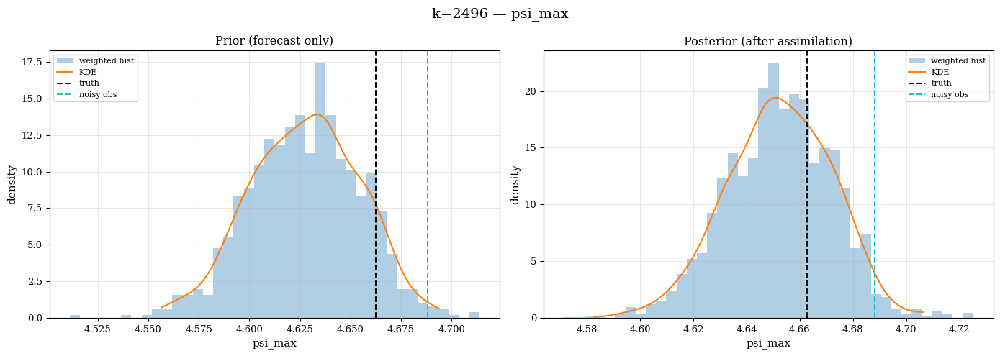

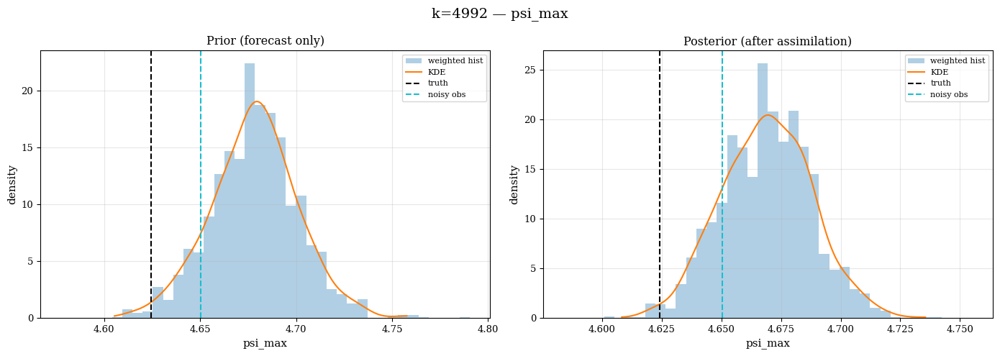

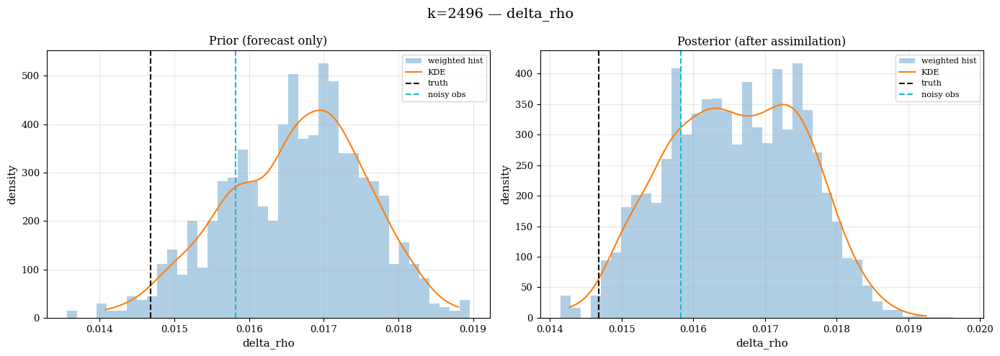

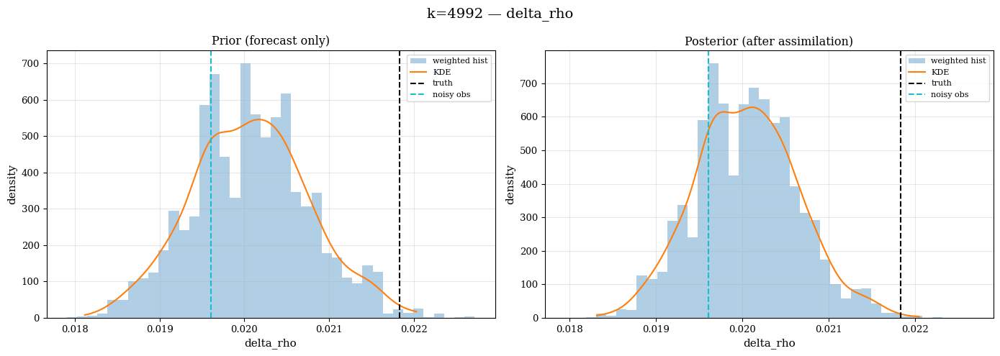

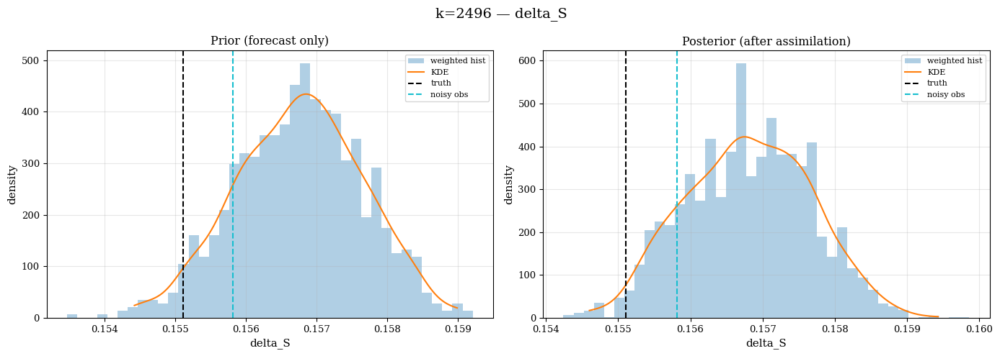

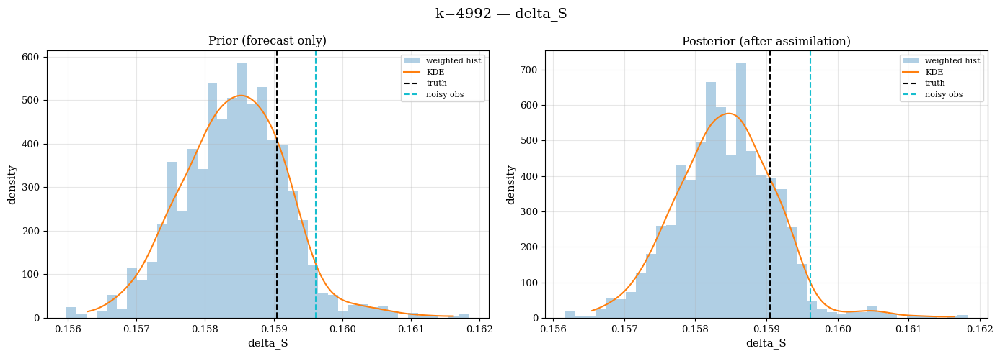

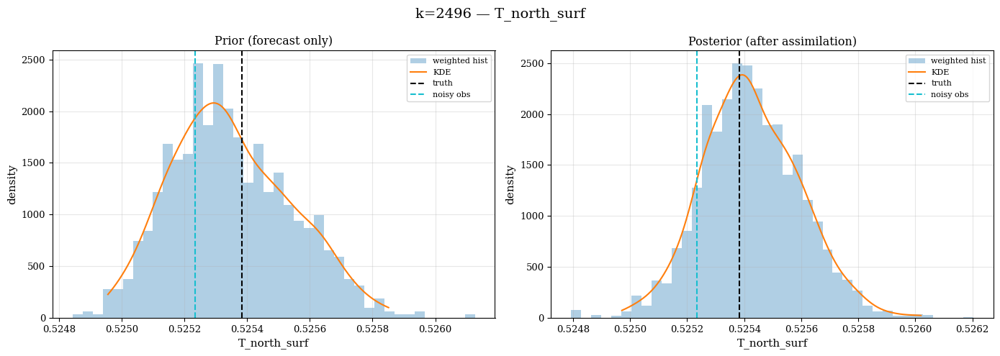

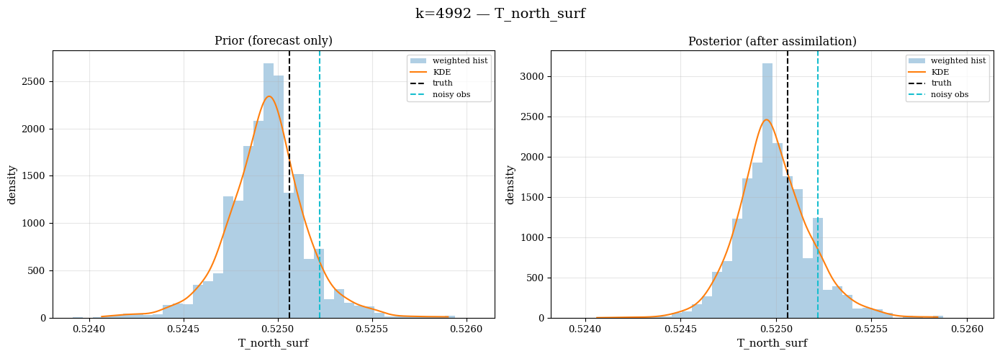

In [ ]:
"""
Locate assimilation steps for closer inspection

Runs the filter once to find the specific timesteps where it actually incorporates a new observation (visible as a drop in effective sample size), then picks a few representative ones spread across the run for closer inspection in later cells.
"""

# ── Pass 1: Run filter to find assimilation timesteps ──
_, ESS_pf, _, _, snap_data = run_pf_once(best_J, seed=0)

# Find timesteps where ESS dropped (assimilation happened)
assim_steps = [k for k in range(1, Nt) if ESS_pf[k] < ESS_pf[k - 1]]

# Pick 3 spread across the trajectory
k_extra = [
    assim_steps[len(assim_steps) // 4],
    assim_steps[len(assim_steps) // 2],
    assim_steps[3 * len(assim_steps) // 4],
]
print(f"Assimilation snapshot timesteps: {k_extra}")

# ── Pass 2: Re-run with those timesteps in the snapshot schedule ──
_, ESS_pf, _, _, snap_data = run_pf_once(best_J, seed=0, k_snap_extra=k_extra)

# ── Plot ──
obs_indices = [0, 1, 2, 3]

for i in obs_indices:
    obs_name = ObsNames[i]
    for k in k_extra:
        if k in snap_data:
            fig = plot_snapshot_set(
                snap_data,
                k,
                i,
                obs_name,
                Ytruth_all_t[i, k].item(),
                Yobs_all_t[i, k].item(),
            )
            fig.savefig(f"{outdir}/PDF_{obs_name}_{k}.png", dpi=200, bbox_inches="tight")
            plt.close(fig)
        else:
            print(f"Warning: k={k} not in snap_data for {obs_name}")

In [ ]:
"""
Quantify how much the particle spread improves

Computes the weighted mean and standard deviation of particle samples before and after each observation update, to measure numerically how much the particle filter narrows its uncertainty at each step.
"""

"""

This is to quantify whether the PDFs displayed above improve.
Specifically, this script computes the weighter standard deviations,

"""

def weighted_mean_std(samples, weights):
    samples = np.asarray(samples, dtype=float)
    weights = np.asarray(weights, dtype=float)
    weights = weights / (weights.sum() + 1e-30)

    mean = np.sum(weights * samples)
    var = np.sum(weights * (samples - mean)**2)
    return mean, np.sqrt(var)

for k in k_extra:
    snap_k = snap_data.get(k, {})
    if 'prior' not in snap_k or 'posterior' not in snap_k:
        print(f"\n--- k = {k} (snapshot incomplete, skipping) ---")
        continue
    print(f"\n--- k = {k} ---")
    for i, obs_name in enumerate(ObsNames):
        prior = snap_k['prior']
        post  = snap_k['posterior']
        mu_p, sd_p = weighted_mean_std(prior['Y'][i, :].numpy(), prior['w'].numpy())
        mu_q, sd_q = weighted_mean_std(post['Y'][i, :].numpy(),  post['w'].numpy())
        print(f"{obs_name:16s} prior std={sd_p:.4e}, post std={sd_q:.4e}, ratio={sd_q/sd_p:.3f}")


--- k = 2496 ---
psi_max          prior std=2.7246e-02, post std=1.9963e-02, ratio=0.733
delta_rho        prior std=9.4084e-04, post std=9.3844e-04, ratio=0.997
delta_S          prior std=9.0538e-04, post std=8.6004e-04, ratio=0.950
T_north_surf     prior std=1.9428e-04, post std=1.7266e-04, ratio=0.889

--- k = 4992 ---
psi_max          prior std=2.2496e-02, post std=1.8595e-02, ratio=0.827
delta_rho        prior std=6.9406e-04, post std=5.8457e-04, ratio=0.842
delta_S          prior std=7.7420e-04, post std=7.0274e-04, ratio=0.908
T_north_surf     prior std=2.1165e-04, post std=1.8931e-04, ratio=0.894

--- k = 7497 (snapshot incomplete, skipping) ---


--- PF run @ γ=0.1 ---
--- PF run @ γ=0.5 ---
--- PF run @ γ=1.0 ---


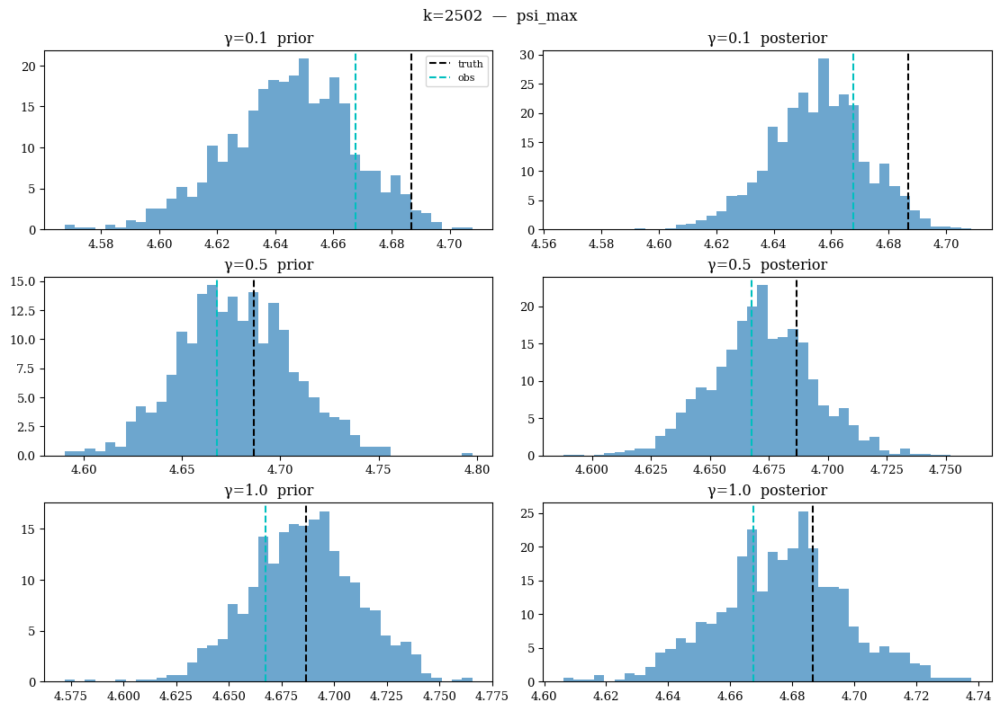

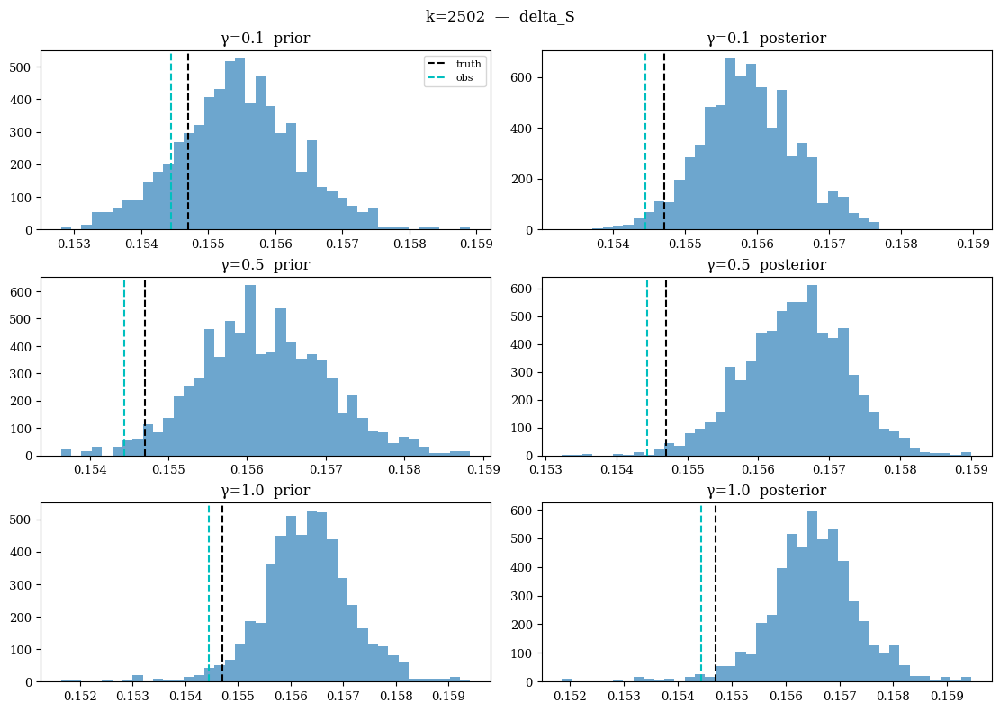

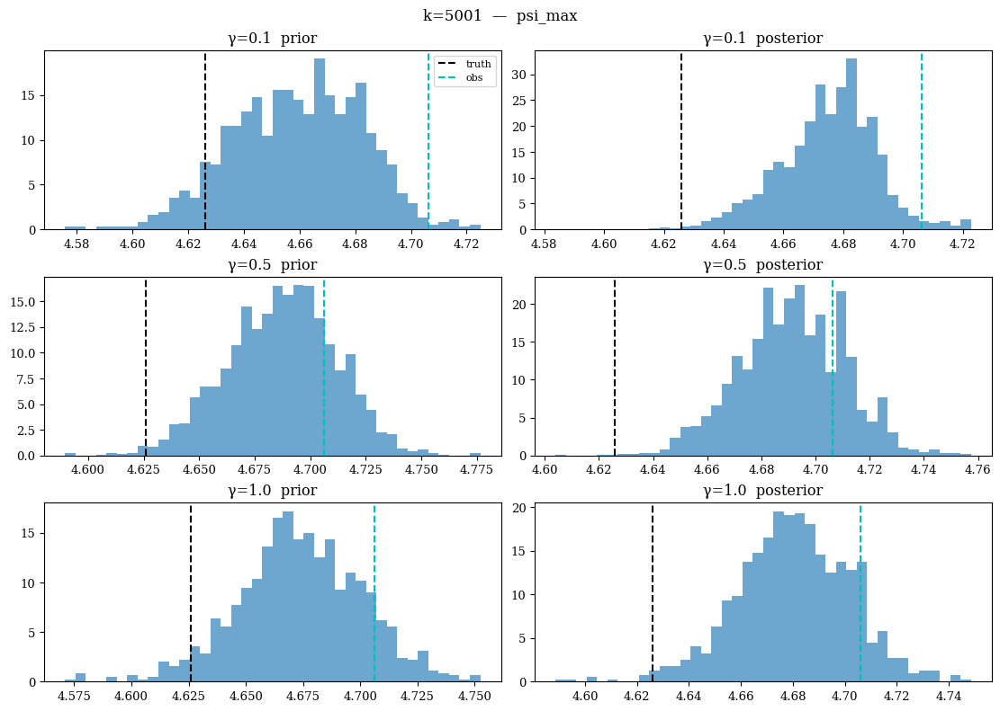

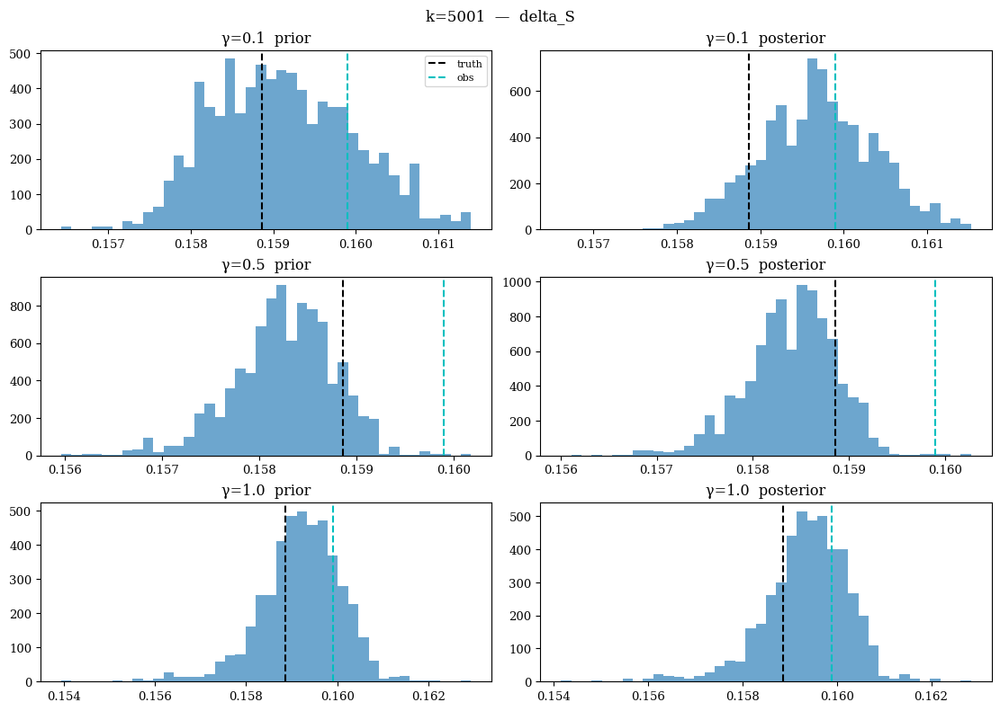

In [ ]:
"""
Does the ensemble-Kalman nudge actually help?

Runs the particle filter with a few different nudge strengths and compares the resulting particle distributions at selected timesteps, to check whether increasing the nudge strength meaningfully shifts the filter's estimate toward the truth.
"""

gammas      = [0.1, 0.5, 1.0]
k_check     = [2502, 5001]
obs_to_plot = [(0, 'psi_max'), (2, 'delta_S')]  # (index in ObsNames, label)

snaps_by_g = {}
for g in gammas:
    print(f"--- PF run @ γ={g} ---")
    _, _, _, _, snap_g = run_pf_once(
        best_J, seed=0, nudge_gamma=g, k_snap_extra=k_check
    )
    snaps_by_g[g] = snap_g

# One figure per (k, observable). Rows = γ, columns = (prior | posterior).
for k in k_check:
    for j_obs, name in obs_to_plot:
        fig, axes = plt.subplots(len(gammas), 2,
                                  figsize=(11, 2.6 * len(gammas)),
                                  constrained_layout=True)
        for r, g in enumerate(gammas):
            sd = snaps_by_g[g].get(k, {})
            for c, which in enumerate(['prior', 'posterior']):
                ax = axes[r, c]
                if which not in sd:
                    ax.set_title(f'γ={g}  {which} (N/A)'); continue
                y = sd[which]['Y'][j_obs, :].numpy()
                w = sd[which]['w'].numpy()
                ax.hist(y, bins=40, weights=w, density=True, alpha=0.65)
                ax.axvline(Ytruth_all_t[j_obs, k].item(), color='k', ls='--', label='truth')
                ax.axvline(Yobs_all_t[j_obs, k].item(),   color='c', ls='--', label='obs')
                ax.set_title(f'γ={g}  {which}')
                if r == 0 and c == 0:
                    ax.legend(fontsize=8)
        fig.suptitle(f'k={k}  —  {name}', fontsize=12)
        plt.show()

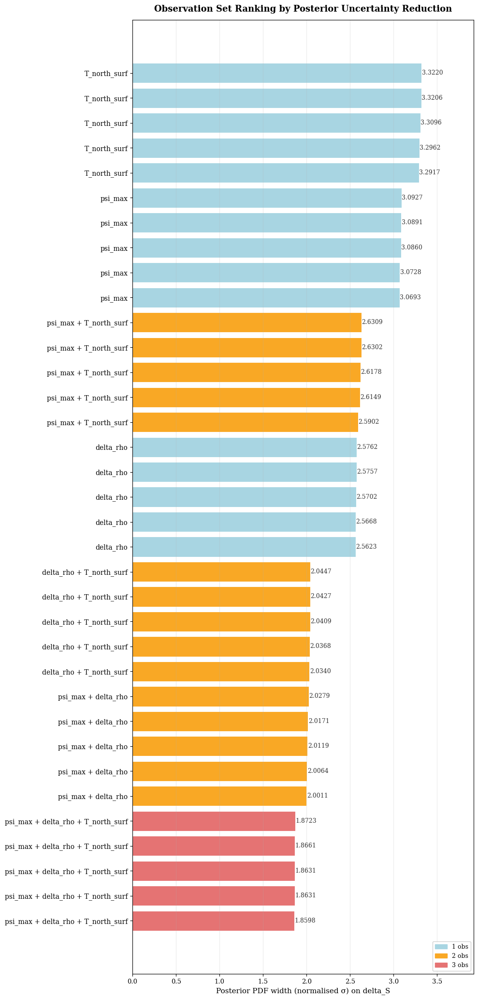

In [ ]:
"""
Summary figures for the observation-set search

Builds three summary figures from the observation-set search results: a ranked bar chart of how much each observation set narrows the posterior uncertainty, a waterfall chart showing what each added variable contributes, and a combined heatmap/matrix view for comparing sets side by side.
"""

"""
OBSERVATION SELECTION RESULTS — Pretty Figures
====================================================
Produces 3 figures:

  1. Ranked bar chart: posterior PDF width by observation set
  2. Marginal contribution waterfall: what each added observable buys
  3. Inclusion matrix + score heatmap: compact summary panel

Requires `results` list from Cell 51, `ObsNames`, `obsSigmas_all`.
"""

import matplotlib.patches as mpatches
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.gridspec as gridspec

# ── 0. Gather results from Cell 51 ──────────────────────────────────
# `results` is list of (score, mean_ess, mean_nis, J_list)
# sorted ascending by score (best first).

target_name = "delta_S"

# Build a clean table
rows = []
for score, mean_ess, mean_nis, J in results:
    if not np.isfinite(score):
        continue
    obs_names = [ObsNames[j] for j in J]
    label = " + ".join(obs_names)
    rows.append({
        "label": label,
        "obs_set": obs_names,
        "J": J,
        "pdf_width": score,
        "ess": mean_ess,
        "nis": mean_nis,
        "n_obs": len(J),
    })

if not rows:
    n_inf = sum(1 for r in results if not np.isfinite(r[0]))
    raise RuntimeError(
        f"All {n_inf}/{len(results)} subsets returned non-finite scores. "
        "The NIS gate in cell 64 (mn > 10.0) is rejecting every subset. "
        "Inspect `diag_rows` and the meanNIS column above before re-running."
    )

# =====================================================================
# FIGURE 1: Ranked horizontal bar chart
# =====================================================================

fig1, ax1 = plt.subplots(figsize=(10, 0.55 * len(rows) + 1.5))

# Sort worst → best (top → bottom) so best is at bottom (visually prominent)
rows_sorted = sorted(rows, key=lambda r: -r["pdf_width"])

labels = [r["label"] for r in rows_sorted]
widths = [r["pdf_width"] for r in rows_sorted]
n_obs  = [r["n_obs"] for r in rows_sorted]

# Color by number of observations
palette = {1: "#A8D5E2", 2: "#F9A825", 3: "#E57373"}
colors = [palette.get(n, "#90A4AE") for n in n_obs]

bars = ax1.barh(range(len(labels)), widths, color=colors, edgecolor="white", linewidth=0.8)

# Annotate bars with the score value
for i, (w, bar) in enumerate(zip(widths, bars)):
    ax1.text(w + 0.002, i, f"{w:.4f}", va="center", fontsize=9, color="#333")

ax1.set_yticks(range(len(labels)))
ax1.set_yticklabels(labels, fontsize=10)
ax1.set_xlabel(f"Posterior PDF width (normalised σ) on {target_name}", fontsize=11)
ax1.set_title("Observation Set Ranking by Posterior Uncertainty Reduction",
              fontsize=13, fontweight="bold", pad=12)
ax1.invert_yaxis()
ax1.grid(axis="x", alpha=0.25)
ax1.set_xlim(0, max(widths) * 1.18)

# Legend for number of observations
handles = [mpatches.Patch(color=palette[k], label=f"{k} obs") for k in sorted(palette)]
ax1.legend(handles=handles, loc="lower right", fontsize=9, framealpha=0.9)

plt.tight_layout()
plt.savefig(f"{outdir}/obs_selection_ranking.png", dpi=200, bbox_inches="tight")
plt.show()

Chain seed health:
                                     Prior   (analytic prior)
  +psi_max                                 mean=3.0820  std=0.0484  finite_seeds=100  inf_seeds=0
  +delta_rho                               mean=2.0129  std=0.0393  finite_seeds=100  inf_seeds=0
  +T_north_surf                            mean=1.8649  std=0.0250  finite_seeds=100  inf_seeds=0


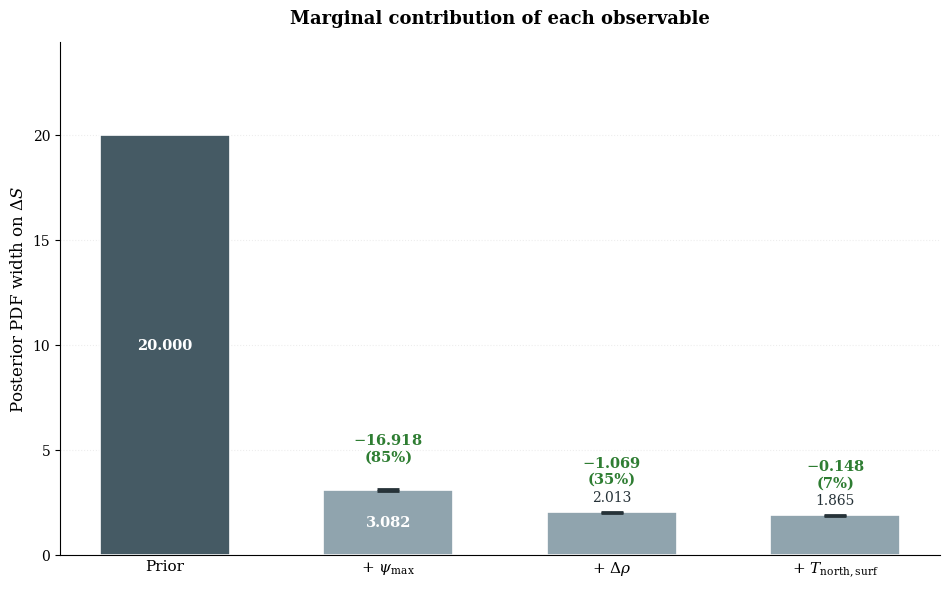

In [ ]:
"""
Prepare data for the observation-set summary figures

Gathers the results needed for the summary figures: the posterior uncertainty achieved with no observations at all (the prior), and with each candidate variable added one at a time, building up a 'chain' of incremental improvements.
"""

chain_obs = ["psi_max", "delta_rho", "T_north_surf"]
chain_idx = [ObsNames.index(nm) for nm in chain_obs]

delta_S_idx = ObsNames.index(target_name)
prior_width = float(np.std(Ytruth_all[delta_S_idx, :]) / obsSigmas_all[delta_S_idx])

chain_values = [prior_width]
chain_stds   = [0.0]   # prior has no PF noise
chain_n_inf  = [0]     # how many seeds got gated to +inf (for transparency)
chain_n_used = [None]  # placeholder for prior

for i in range(1, len(chain_idx) + 1):
    key = tuple(sorted(chain_idx[:i]))
    if key in scores_by_subset:
        arr = scores_by_subset[key]
        finite = arr[np.isfinite(arr)]
        n_inf  = int(np.isinf(arr).sum())
        if finite.size > 0:
            chain_values.append(float(finite.mean()))
            chain_stds.append(float(finite.std(ddof=1)) if finite.size > 1 else 0.0)
        else:
            chain_values.append(np.nan)
            chain_stds.append(0.0)
        chain_n_inf.append(n_inf)
        chain_n_used.append(int(finite.size))
    else:
        chain_values.append(chain_values[-1])
        chain_stds.append(0.0)
        chain_n_inf.append(0)
        chain_n_used.append(0)

# Surface seed-level health to the user
print("Chain seed health:")
for label, v, s, ni, nu in zip(
        ["Prior", *chain_obs], chain_values, chain_stds, chain_n_inf, chain_n_used):
    if nu is None:
        print(f"  {label:>40s}   (analytic prior)")
    else:
        print(f"  +{label:<38s}  mean={v:.4f}  std={s:.4f}  "
              f"finite_seeds={nu}  inf_seeds={ni}")

stage_labels = [
    "Prior",
    r"$+\ \psi_{\max}$",
    r"$+\ \Delta \rho$",
    r"$+\ T_{\mathrm{north,surf}}$",
]

step_changes = [chain_values[i + 1] - chain_values[i]
                for i in range(len(chain_values) - 1)]

# Robust ymax for axis: ignore NaN/inf
finite_vals = [v for v in chain_values if np.isfinite(v)]
if not finite_vals:
    raise RuntimeError("No finite chain values — every seed was gated. "
                       "Inspect scores_by_subset and the health gates.")
ymax = max(finite_vals) * 1.22

# ============================================================
# PLOT
# ============================================================
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["DejaVu Serif", "Times New Roman", "Times"],
    "mathtext.fontset": "dejavuserif",
    "axes.labelsize": 12,
    "axes.titlesize": 13,
    "xtick.labelsize": 11,
    "ytick.labelsize": 10,
})

fig, ax = plt.subplots(figsize=(9.6, 6.0))

prior_color  = "#455A64"
post_color   = "#90A4AE"
accent_green = "#2E7D32"
accent_red   = "#C62828"
annot_gray   = "#263238"

x = np.arange(len(chain_values))
bar_colors = [prior_color] + [post_color] * (len(chain_values) - 1)

# -------------------- Bars --------------------
# Replace NaN with 0 for bar heights so the plot still draws
plot_values = [v if np.isfinite(v) else 0.0 for v in chain_values]
ax.bar(
    x, plot_values, width=0.58,
    color=bar_colors, edgecolor="white", linewidth=1.2, zorder=2,
)

# -------------------- Error bars --------------------
nz = np.array([s > 0 and np.isfinite(s) for s in chain_stds])
if nz.any():
    ax.errorbar(
        x[nz], np.array(plot_values)[nz],
        yerr=np.array(chain_stds)[nz],
        fmt="none",
        ecolor=annot_gray,
        elinewidth=2.0,
        capsize=8,
        capthick=2.0,
        zorder=4,
    )

# -------------------- Value labels --------------------
for i, val in enumerate(chain_values):
    if not np.isfinite(val):
        ax.text(x[i], 0.02 * ymax, "NaN",
                ha="center", va="bottom", fontsize=10, color=accent_red,
                fontweight="bold")
        continue
    if val > 0.12 * ymax:
        ax.text(
            x[i], val / 2, f"{val:.3f}",
            ha="center", va="center",
            fontsize=10.5, color="white", fontweight="bold",
        )
    else:
        sd = chain_stds[i] if np.isfinite(chain_stds[i]) else 0.0
        ax.text(
            x[i], val + sd + 0.015 * ymax, f"{val:.3f}",
            ha="center", va="bottom",
            fontsize=10, color=annot_gray,
        )

# -------------------- Step-change annotations --------------------
for i, d in enumerate(step_changes):
    base = chain_values[i + 1]
    sd   = chain_stds[i + 1]
    if not (np.isfinite(d) and np.isfinite(base) and np.isfinite(sd)):
        continue
    top = base + sd
    y_text = top + 0.05 * ymax

    if d < -1e-4:
        pct = 100 * (-d) / chain_values[i] if chain_values[i] > 0 else 0.0
        txt = f"$-${(-d):.3f}\n({pct:.0f}%)"
        color = accent_green
    elif d > 1e-4:
        pct = 100 * d / chain_values[i] if chain_values[i] > 0 else 0.0
        txt = f"$+${d:.3f}\n({pct:.0f}%)"
        color = accent_red
    else:
        txt = r"$\approx 0$"
        color = "#616161"

    ax.text(
        x[i + 1], y_text, txt,
        ha="center", va="bottom",
        fontsize=10.5, color=color, fontweight="bold",
    )

# -------------------- Axes styling --------------------
ax.set_xticks(x)
ax.set_xticklabels(stage_labels)
ax.set_ylabel(rf"Posterior PDF width on $\Delta S$")   # raw f-string fixes \D warning
ax.set_title(
    "Marginal contribution of each observable",
    fontsize=13, fontweight="bold", pad=14, loc="center",
)
ax.grid(axis="y", alpha=0.22, linestyle=":", zorder=0)
ax.set_axisbelow(True)
ax.set_ylim(0, ymax)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.tick_params(axis="x", length=0)

plt.tight_layout()
plt.savefig(f"{outdir}/obs_marginal_waterfall.png",
            dpi=300, bbox_inches="tight")
plt.show()

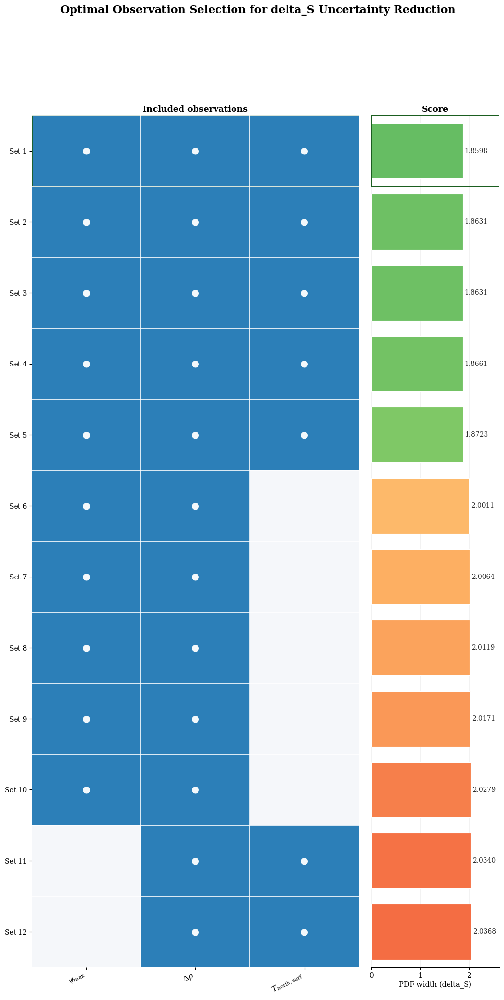


KEY FINDING
Target variable: delta_S (N–S salinity difference)
Best observation set: ['psi_max', 'delta_rho', 'T_north_surf']
  → Posterior PDF width: 1.8598
  → Mean ESS: 735 / 1000

Most influential single observable: psi_max (overturning strength)

Physical interpretation:
  Overturning circulation (ψ_max) is the primary constraint on
  freshwater transport, with N–S density contrast (Δρ) and
  northern surface temperature providing complementary information.


In [ ]:
"""
Compact summary panel

Builds a single, denser summary figure combining an observation-inclusion matrix with a bar chart of scores, for the best-performing observation sets found in the search.
"""

fig3 = plt.figure(figsize=(12.4, 0.58 * len(rows) + 2.4))
gs = gridspec.GridSpec(1, 2, width_ratios=[3.2, 1.25], wspace=0.055)

ax_mat = fig3.add_subplot(gs[0])
ax_bar = fig3.add_subplot(gs[1])

# Use top-N for readability (all if <= 12)
top_n = min(len(rows), 12)
top_rows = sorted(rows, key=lambda r: r["pdf_width"])[:top_n]

# All candidate obs names (excluding target)
all_obs = [nm for nm in ObsNames if nm != target_name]

# Pretty display labels
pretty_name_map = {
    "psi_max": r"$\psi_{\max}$",
    "delta_rho": r"$\Delta \rho$",
    "T_north_surf": r"$T_{\mathrm{north,surf}}$",
}

display_obs = [pretty_name_map.get(nm, nm) for nm in all_obs]

# Build inclusion matrix [n_sets x n_candidates]
mat = np.zeros((len(top_rows), len(all_obs)))
for i, r in enumerate(top_rows):
    for nm in r["obs_set"]:
        if nm in all_obs:
            mat[i, all_obs.index(nm)] = 1.0

# Softer colormap: very light grey -> muted blue
cmap_inc = LinearSegmentedColormap.from_list(
    "inc_soft", ["#F5F7FA", "#2C7FB8"]
)

ax_mat.imshow(mat, cmap=cmap_inc, aspect="auto", interpolation="nearest", vmin=0, vmax=1)

# Subtle white separators
for i in range(len(top_rows) + 1):
    ax_mat.axhline(i - 0.5, color="white", linewidth=1.2)
for j in range(len(all_obs) + 1):
    ax_mat.axvline(j - 0.5, color="white", linewidth=1.2)

# Dots inside included cells
for i in range(len(top_rows)):
    for j in range(len(all_obs)):
        if mat[i, j] > 0:
            ax_mat.text(
                j, i, "●",
                ha="center", va="center",
                fontsize=14, color="white", alpha=0.95
            )

ax_mat.set_xticks(range(len(all_obs)))
ax_mat.set_xticklabels(display_obs, fontsize=11, rotation=28, ha="right")
ax_mat.set_yticks(range(len(top_rows)))
ax_mat.set_yticklabels([f"Set {i+1}" for i in range(len(top_rows))], fontsize=10)
ax_mat.set_title("Included observations", fontsize=12.5, fontweight="bold", pad=6)

# Remove clutter from matrix axes
ax_mat.tick_params(axis="x", pad=2)
for spine in ax_mat.spines.values():
    spine.set_visible(False)

# Score bars
scores = [r["pdf_width"] for r in top_rows]

# Best = greener, worse = warmer
norm_scores = (np.array(scores) - min(scores)) / (max(scores) - min(scores) + 1e-12)
colors_bar = plt.cm.RdYlGn_r(0.2 + 0.6 * norm_scores)

bars = ax_bar.barh(
    range(len(scores)),
    scores,
    color=colors_bar,
    edgecolor="white",
    linewidth=0.8,
    height=0.78
)

# Annotate score values
xpad = 0.015 * max(scores)
for i, s in enumerate(scores):
    ax_bar.text(
        s + xpad, i, f"{s:.4f}",
        va="center", ha="left",
        fontsize=10, color="#303030"
    )

ax_bar.set_yticks([])
ax_bar.set_xlabel(rf"PDF width ({target_name})", fontsize=10.5)
ax_bar.set_title("Score", fontsize=12.5, fontweight="bold", pad=6)
ax_bar.set_xlim(0, max(scores) * 1.28)
ax_bar.invert_yaxis()
ax_bar.grid(axis="x", alpha=0.16)
ax_bar.set_axisbelow(True)

# Clean spines
ax_bar.spines["top"].set_visible(False)
ax_bar.spines["right"].set_visible(False)
ax_bar.spines["left"].set_visible(False)

# Align y-axes perfectly
ax_mat.set_ylim(len(top_rows) - 0.5, -0.5)
ax_bar.set_ylim(len(top_rows) - 0.5, -0.5)

# Optional: lightly highlight the best row
best_idx = 0
ax_mat.add_patch(plt.Rectangle(
    (-0.5, best_idx - 0.5), len(all_obs), 1,
    fill=False, edgecolor="#1B5E20", linewidth=2.0
))
ax_bar.add_patch(plt.Rectangle(
    (0, best_idx - 0.5), ax_bar.get_xlim()[1], 1,
    fill=False, edgecolor="#1B5E20", linewidth=1.8
))

plt.suptitle(
    rf"Optimal Observation Selection for {target_name} Uncertainty Reduction",
    fontsize=16, fontweight="bold", y=0.98
)

plt.savefig(f"{outdir}/obs_selection_summary.png", dpi=240, bbox_inches="tight")
plt.show()

# ---------------------------------------------------------------------
# Printed summary
# ---------------------------------------------------------------------
best_row = min(rows, key=lambda r: r["pdf_width"])

print("\n" + "=" * 60)
print("KEY FINDING")
print("=" * 60)
print(f"Target variable: {target_name} (N–S salinity difference)")
print(f"Best observation set: {[ObsNames[j] for j in best_row['J']]}")
print(f"  → Posterior PDF width: {best_row['pdf_width']:.4f}")
print(f"  → Mean ESS: {best_row['ess']:.0f} / {Npart}")
print(f"\nMost influential single observable: psi_max (overturning strength)")
print(f"\nPhysical interpretation:")
print(f"  Overturning circulation (ψ_max) is the primary constraint on")
print(f"  freshwater transport, with N–S density contrast (Δρ) and")
print(f"  northern surface temperature providing complementary information.")
print("=" * 60)

# PF state tracking

In [ ]:
"""
Time-series plotting helper

Defines a reusable function for plotting true vs. filtered time series for a set of named variables.
"""

def plot_timeseries(t, X_true, X_pred, names, title="...", figsize=(12,10)):
    """
    t: [K] numpy
    X_true: [K,4] numpy
    X_pred: [K,4] numpy
    """
    fig, axes = plt.subplots(len(names), 1, figsize = figsize, sharex = True)
    for i, nm in enumerate(names):
        axes[i].plot(t, X_true[:, i], label=f"true {nm}")
        axes[i].plot(t, X_pred[:, i], label=f"PF {nm}")
        axes[i].grid(True)
        axes[i].legend()
        axes[i].set_title(nm)
    axes[-1].set_xlabel("time (years)")
    fig.suptitle(title)
    plt.tight_layout()
    plt.show()

# Pre-hosing PF

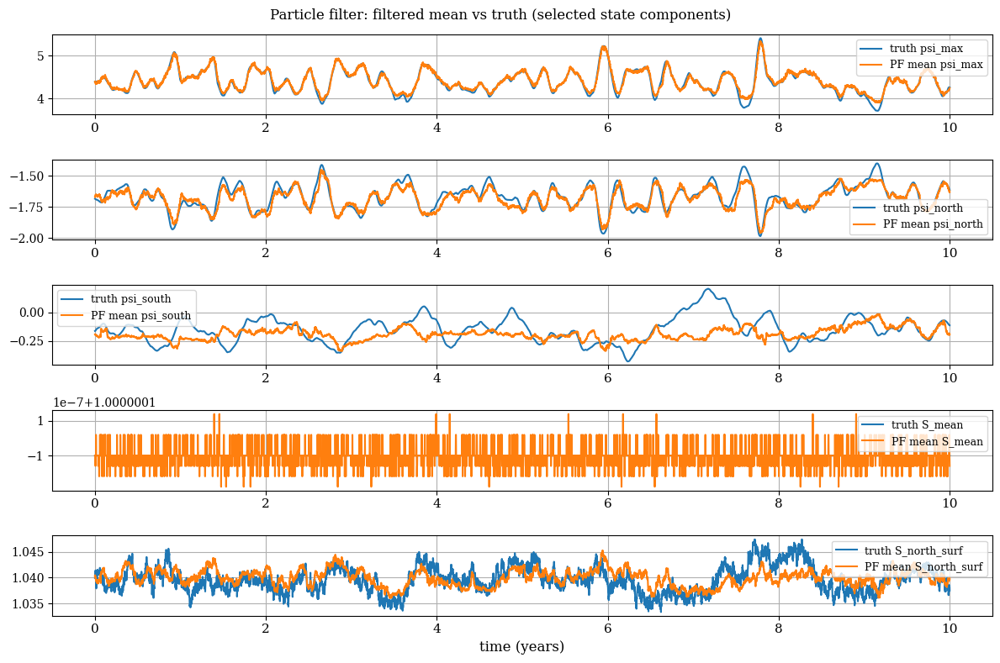

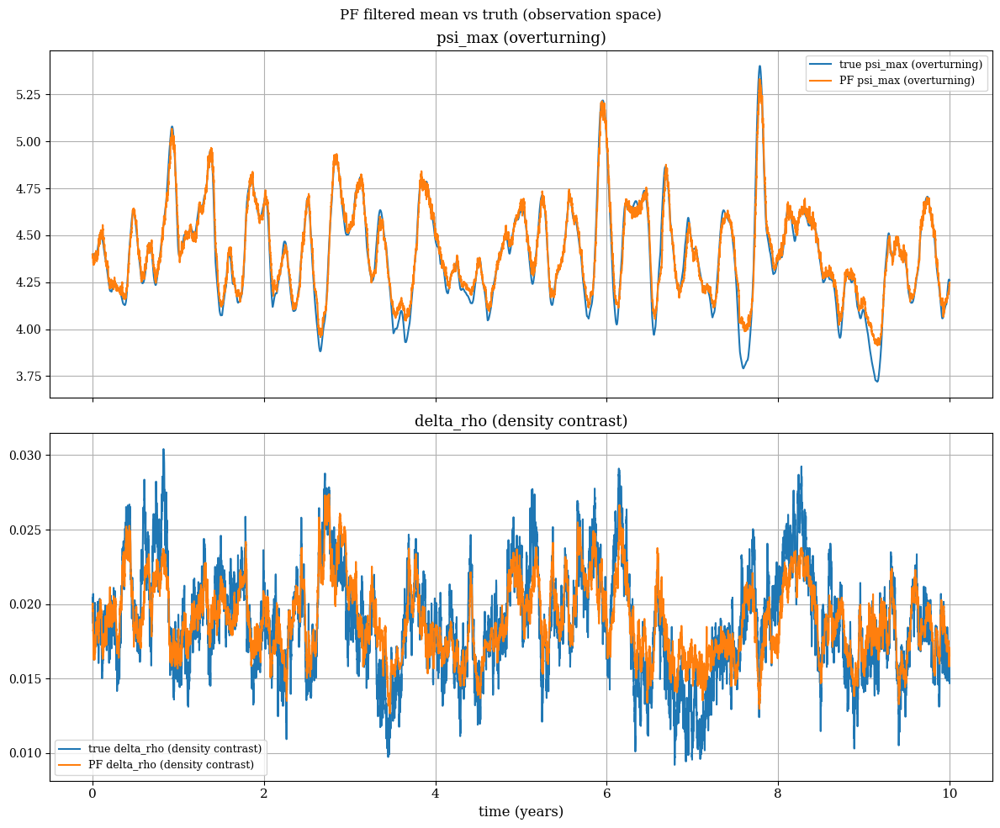

In [ ]:
"""
Plot key state variables

Plots the true and filtered trajectories of a few key state variables from the particle filter run, for a first visual check of tracking quality.
"""

# Xfilt is [11, Nt]  -> transpose to [Nt, 11]
Xfilt_state = Xfilt.T
Nt_filt = Xfilt_state.shape[0]
t = np.arange(Nt_filt) * dt_years

# --- 11D state diagnostics (pick a few key state components)
key_idx = [0, 1, 2, 3, 4]  # example: D, T_n, S_ts, S_n  (adjust)
key_names = [model.convention[i] for i in key_idx]

plt.figure(figsize=(12, 8))
for p, (ii, nm) in enumerate(zip(key_idx, key_names)):
    ax = plt.subplot(len(key_idx), 1, p+1)
    ax.plot(t, Xtruth_state[:Nt_filt, ii], label=f"truth {nm}")
    ax.plot(t, Xfilt_state[:, ii],    label=f"PF mean {nm}")
    ax.grid(True); ax.legend()
plt.xlabel("time (years)")
plt.suptitle("Particle filter: filtered mean vs truth (selected state components)")
plt.tight_layout()
plt.show()

# --- observation-space diagnostics (AMOC_ice, SeaIce)
with torch.no_grad():
    Xt_true = torch.tensor(Xtruth_state[:Nt_filt].T, dtype = torch.float32, device = device)  # [11,Nt]
    Xt_filt = torch.tensor(Xfilt_state.T, dtype = torch.float32, device = device)  # [11,Nt]
    Ytrue_t = obs_amoc_ice_torch(Xt_true).T  # [Nt,2]
    Yfilt_t = obs_amoc_ice_torch(Xt_filt).T  # [Nt,2]

Ytrue = Ytrue_t.cpu().numpy()
Yfilt = Yfilt_t.cpu().numpy()

names_obs = ["psi_max (overturning)", "delta_rho (density contrast)"]
plot_timeseries(t, Ytrue, Yfilt, names_obs, title="PF filtered mean vs truth (observation space)")

# With hosing

Patched model.core.trajectory_seeded
Hosing config: shape=tanh, rate=0.05, t0=0.0, tf=30.0
Final hosing amplitude: 1.50
Running 40000 steps (40.0 non-dim time)...
Hosing trajectory shape: (40001, 4, 21, 41)
Diagnostics shape: (40001, 14)
Initial psi_max: 4.397
Final psi_max:   -0.000


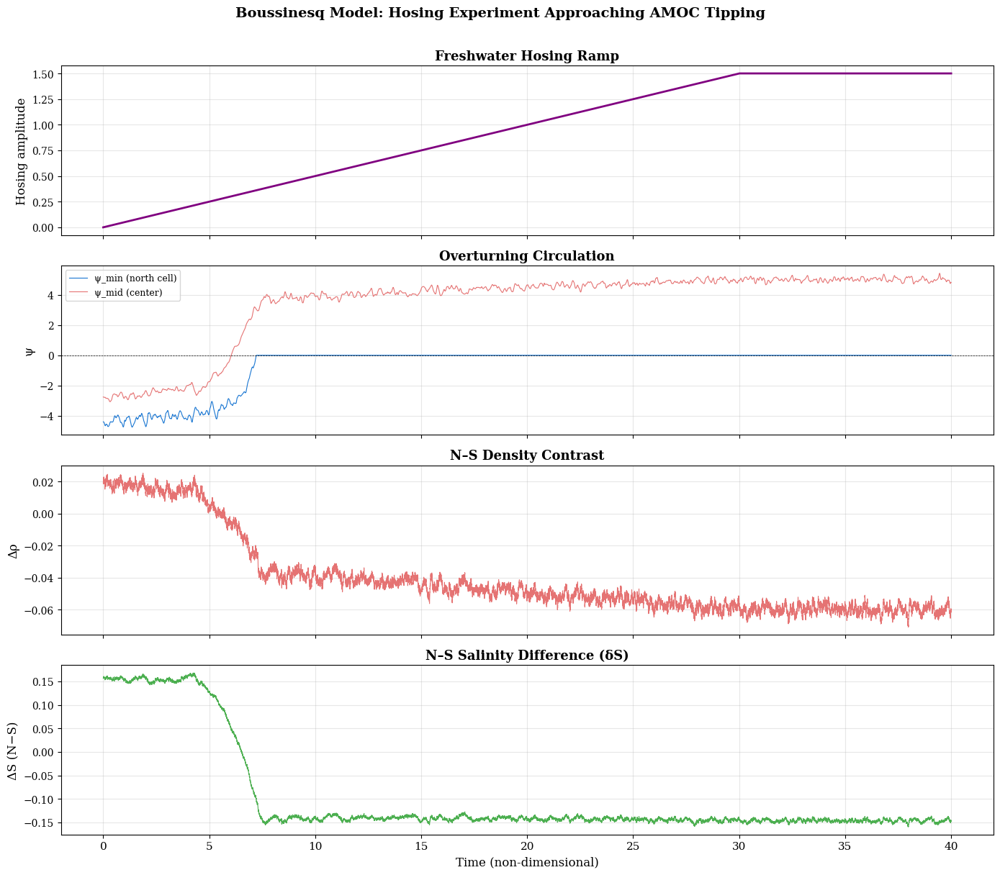


Stored: Xtruth_hosing (40001, 14), U_hosing_t torch.Size([40000, 14])
Ready for EWS analysis and PF tipping detection.


In [ ]:
"""
Hosing Experiment: Pushing the AMOC Toward Tipping
=========================================================
Insert after your main analysis cells (after Cell 51 results).

This cell:
  1. Patches BoussinesqCore.trajectory to include time-varying hosing
  2. Runs a spin-up in the ON state (reuses existing)
  3. Ramps up freshwater hosing to push the system toward AMOC collapse
  4. Extracts diagnostics and plots the trajectory

The hosing adds freshwater to the northern basin (removing it from the
south to conserve salinity), weakening the density-driven overturning.
"""

# ─────────── Patching the trajectory method to include hosing ───────────

# -------------------- T0: SEEDED HOSING TRAJECTORY --------------------
# Drop-in replacement for trajectory_with_hosing (cell 74) that accepts an
# explicit seed, so the retraining data is reproducible across Colab sessions.
# The original trajectory_with_hosing and Xtruth_hosing are preserved.


def trajectory_with_hosing_seeded(self, nt_max, phi_start, beta, nk, eps, seed=None):
    s0 = 1
    self.make_salinity_forcing(beta)

    phi_traj = np.zeros((nt_max + 1, 4, self._m + 1, self._n + 1))
    phi_traj[0] = phi_start

    rng = np.random.default_rng(seed)
    normalrange = rng.normal(0, 1, size=(nt_max, 2 * nk))
    self.init_salt_stoch_noise(self.zz, nk, eps, 0.05)

    for t in range(1, nt_max + 1):
        w_old, s_old, t_old, psi_old = phi_traj[t - 1]

        fx_psi = self.Fx @ psi_old
        psi_fz = psi_old @ self.FzT
        dx_st = self.Dx @ phi_traj[t - 1, 1:3]
        st_dz = phi_traj[t - 1, 1:3] @ self.DzT

        q_s, q_t = fx_psi[np.newaxis] * st_dz - psi_fz[np.newaxis] * dx_st

        current_time = t * self._dt
        hosing_term = self.get_hosing(current_time)

        c_t = t_old + self._dt * (q_t + self.FT)
        c_s = (s_old
               + self._dt * (q_s + self.FS + hosing_term)
               + self.dtsq * self.salt_stoch_noise(normalrange[t - 1]))

        t_new = sp.linalg.solve_sylvester(self.AT, self.BT, c_t)
        s_new = sp.linalg.solve_sylvester(self.AS, self.BS, c_s)
        s_new *= s0 / np.mean(s_new)

        f_w = self._pr * self._ra * self.Dx @ (t_new - s_new) @ self.S_corr
        q_w = fx_psi * (w_old @ self.FzT) - psi_fz * (self.Fx @ w_old)
        c_w = w_old + self._dt * (q_w + f_w)
        w_new = sp.linalg.solve_sylvester(self.Aw, self.Bw, c_w)

        psi_new = sp.linalg.solve_sylvester(self.Fxx, self.FzzT, -w_new)

        phi_traj[t] = np.array([w_new, s_new, t_new, psi_new])

    return phi_traj

import types
model.core.trajectory_seeded = types.MethodType(trajectory_with_hosing_seeded, model.core)
print("Patched model.core.trajectory_seeded")

# ─────────── Configuring hosing ramp ───────────
# Start from the spun-up ON state.
# Ramp hosing from 0 to a value large enough to weaken/collapse the AMOC.
#
# The hosing amplitude is in non-dimensional units.
# Typical tipping values for this model: hosing ~ 0.1 - 0.5
# We ramp slowly to see the approach phase clearly.

hosing_rate   = + 0.05  # ramp rate (amplitude per non-dim time unit)
hosing_t0     = 0.0      # start ramping immediately
hosing_tf     = 30.0     # ramp for 15 time units (reaches amplitude 0.3)
T_hosing      = 40000    # 20k steps = 20 non-dim time units at dt=0.001

model.core.init_hosing(
    shape="tanh",
    t0=hosing_t0,
    tf=hosing_tf,
    h0=0.0, # starting with zero hosing
    rate=hosing_rate,
)

print(f"Hosing config: shape=tanh, rate={hosing_rate}, "
      f"t0={hosing_t0}, tf={hosing_tf}")
print(f"Final hosing amplitude: {hosing_rate * hosing_tf:.2f}")
print(f"Running {T_hosing} steps ({T_hosing * model.delta_t:.1f} non-dim time)...")

# ─────────── Running the hosing trajectory ───────────
# Use the spun-up ON state as initial condition
init_state = model._on_state_4d

phi_hosing = model.core.trajectory_seeded(
    nt_max = T_hosing,
    phi_start = init_state,
    beta = model._beta,
    nk = model._nk,
    eps = model._eps,
    seed = 123,
)

print(f"Hosing trajectory shape: {phi_hosing.shape}")

# ─────────── Extracting diagnostics ───────────
diag_hosing = model.extract_trajectory_diagnostics(phi_hosing)
t_hosing = np.arange(diag_hosing.shape[0]) * model.delta_t

print(f"Diagnostics shape: {diag_hosing.shape}")
print(f"Initial psi_max: {diag_hosing[0, 0]:.3f}")
print(f"Final psi_max:   {diag_hosing[-1, 0]:.3f}")

# ─────────── Plotting key diagnostics ───────────
fig, axes = plt.subplots(4, 1, figsize=(14, 12), sharex=True)

# Hosing amplitude over time
hosing_ampl = np.array([
    model.core.hosing_start_val + max(0, (min(t, hosing_tf) - hosing_t0)) * hosing_rate
    for t in t_hosing
])

axes[0].plot(t_hosing, hosing_ampl, color="purple", linewidth=2)
axes[0].set_ylabel("Hosing amplitude")
axes[0].set_title("Freshwater Hosing Ramp", fontweight="bold")
axes[0].grid(True, alpha=0.3)

psi_min_idx = model.convention.index("psi_min")
psi_mid_idx = model.convention.index("psi_mid")

axes[1].plot(t_hosing, diag_hosing[:, psi_min_idx],
             color="#1976D2", linewidth=0.8, label="ψ_min (north cell)")
axes[1].plot(t_hosing, diag_hosing[:, psi_mid_idx],
             color="#E57373", linewidth=0.8, label="ψ_mid (center)")
axes[1].axhline(0, color="black", linewidth=0.5, linestyle="--")
axes[1].set_ylabel("ψ")
axes[1].set_title("Overturning Circulation", fontweight="bold")
axes[1].legend(fontsize=9)
axes[1].grid(True, alpha=0.3)

# delta_rho (density contrast)
axes[2].plot(t_hosing, diag_hosing[:, model.convention.index("delta_rho")],
             color="#E57373", linewidth=0.8)
axes[2].set_ylabel("Δρ")
axes[2].set_title("N–S Density Contrast", fontweight="bold")
axes[2].grid(True, alpha=0.3)

# S_north_surf - S_south_surf (freshwater transport proxy)
S_n = diag_hosing[:, model.convention.index("S_north_surf")]
S_s = diag_hosing[:, model.convention.index("S_south_surf")]
axes[3].plot(t_hosing, S_n - S_s, color="#4CAF50", linewidth=0.8)
axes[3].set_ylabel("ΔS (N−S)")
axes[3].set_xlabel("Time (non-dimensional)")
axes[3].set_title("N–S Salinity Difference (δS)", fontweight="bold")
axes[3].grid(True, alpha=0.3)

plt.suptitle("Boussinesq Model: Hosing Experiment Approaching AMOC Tipping",
             fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig(f"{outdir}/hosing_trajectory.png", dpi=200, bbox_inches="tight")
plt.show()

# ── Storing for downstream cells ──
Xtruth_hosing = diag_hosing.astype(np.float64)
t_hosing_arr  = t_hosing

# Generating stochastic forcing record (same structure as main run)
rng_hosing = np.random.default_rng(seed=123)
dW_hosing  = rng_hosing.normal(0, 1, size=(T_hosing, 2 * model._nk))
Umu_h = dW_hosing.mean(axis=0, keepdims=True)
Usd_h = dW_hosing.std(axis=0, keepdims=True) + 1e-8
UN_hosing = (dW_hosing - Umu_h) / Usd_h
U_hosing_t = torch.tensor(UN_hosing, dtype=torch.float32, device=device)

print(f"\nStored: Xtruth_hosing {Xtruth_hosing.shape}, U_hosing_t {U_hosing_t.shape}")
print("Ready for EWS analysis and PF tipping detection.")

Quasi-static scan: rate=0.002, tf=200.0, T=200000
Max amplitude reached at t=200.0: 0.400
Running (eps=0, deterministic)...
  done in 13.0 min

Empirical h_crit = 0.2537
  crossed psi_min = -2.0 at t = 126.87
  psi_min at crossing = -1.998
  baseline beta (Soons) = 0.1
  Soons beta_crit = 0.11


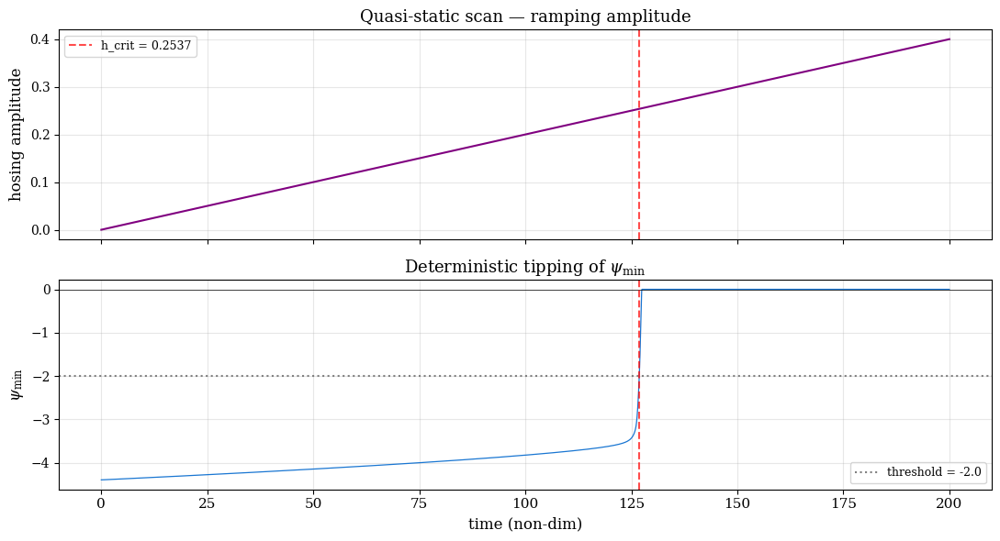

In [ ]:
"""
Slowly ramping the freshwater forcing to find the tipping threshold

Runs the Boussinesq model forward under a very slow, steadily increasing freshwater forcing (much slower than the model's own internal timescales, so the system stays close to equilibrium at each step) and records the forcing level at which the overturning circulation first collapses. This gives an empirical tipping threshold used to design the faster hosing experiments that follow.
"""

scan_rate = 0.002
scan_tf   = 200.0
scan_T    = 200000

model.core.init_hosing(shape="tanh", t0 = 0.0, tf = scan_tf,
                       h0 = 0.0, rate = scan_rate)

print(f"Quasi-static scan: rate={scan_rate}, tf={scan_tf}, T={scan_T}")
print(f"Max amplitude reached at t={scan_tf}: {scan_rate * scan_tf:.3f}")
print("Running (eps=0, deterministic)...")

t0 = time.time()
phi_qs = model.core.trajectory_seeded(
    nt_max=scan_T,
    phi_start=model._on_state_4d,
    beta=model._beta,
    nk=model._nk,
    eps=0.0,               # DETERMINISTIC — clean threshold
    seed=777,
)
wall = time.time() - t0
print(f"  done in {wall/60:.1f} min")

diag_qs = model.extract_trajectory_diagnostics(phi_qs).astype(np.float64)
del phi_qs

t_qs  = np.arange(diag_qs.shape[0]) * model.delta_t
h_qs  = np.clip(t_qs * scan_rate, 0.0, scan_rate * scan_tf)
psi_idx = model.convention.index("psi_min")
psi_qs  = diag_qs[:, psi_idx]

# Threshold crossing
THRESH = -2.0
cross = np.where(psi_qs > THRESH)[0]
if len(cross) == 0:
    raise RuntimeError(
        f"psi_min never crossed {THRESH} in the scan — "
        f"system did not tip. Increase scan_rate or scan_tf."
    )
i_cross = cross[0]
h_crit_empirical = float(h_qs[i_cross])
t_crit_empirical = float(t_qs[i_cross])

print(f"\n{'='*60}")
print(f"Empirical h_crit = {h_crit_empirical:.4f}")
print(f"  crossed psi_min = {THRESH} at t = {t_crit_empirical:.2f}")
print(f"  psi_min at crossing = {psi_qs[i_cross]:.3f}")
print(f"  baseline beta (Soons) = {model._beta}")
print(f"  Soons beta_crit = 0.11")
print(f"{'='*60}")

# Plot for verification
fig, axes = plt.subplots(2, 1, figsize=(11, 6), sharex=True)
axes[0].plot(t_qs, h_qs, color="purple", linewidth=1.5)
axes[0].axvline(t_crit_empirical, color="red", linestyle="--", alpha=0.7,
                label=f"h_crit = {h_crit_empirical:.4f}")
axes[0].set_ylabel("hosing amplitude")
axes[0].set_title("Quasi-static scan — ramping amplitude")
axes[0].legend(); axes[0].grid(alpha=0.3)

axes[1].plot(t_qs, psi_qs, color="#1976D2", linewidth=0.9)
axes[1].axhline(THRESH, color="gray", linestyle=":", label=f"threshold = {THRESH}")
axes[1].axhline(0, color="black", linewidth=0.5)
axes[1].axvline(t_crit_empirical, color="red", linestyle="--", alpha=0.7)
axes[1].set_ylabel(r"$\psi_{\min}$")
axes[1].set_xlabel("time (non-dim)")
axes[1].set_title(r"Deterministic tipping of $\psi_{\min}$")
axes[1].legend(); axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.savefig(f"{outdir}/h_crit_scan.png", dpi=180, bbox_inches="tight")
plt.show()

# Persist so restarts don't require rerunning
np.savez(
    "/content/drive/MyDrive/Colab Notebooks/retrain/h_crit_scan.npz"
    if "retrain_dir" not in globals()
    else f"{retrain_dir}/h_crit_scan.npz",
    h_crit_empirical=h_crit_empirical,
    t_crit_empirical=t_crit_empirical,
    t_qs=t_qs, psi_qs=psi_qs, h_qs=h_qs,
    scan_rate=scan_rate, scan_tf=scan_tf, scan_T=scan_T,
)

In [ ]:
"""
Building a set of hosing (forcing-ramp) experiments

Runs four different freshwater-forcing scenarios, each scaled relative to the tipping threshold found above: one that stays safely below it, one that ramps slowly through it, one at a medium-fast rate, and one that ramps quickly. Together these give the surrogate model examples of both tipping and non-tipping behavior at different timescales.
"""

assert "h_crit_empirical" in globals(), "Run T_scan first."

hc = h_crit_empirical
print(f"Designing ensemble around h_crit = {hc:.4f}")

# (final_ampl_multiplier, tf,   T,      seed, label)
_specs = [
    (0.5,  30.0,  40000, 101, "subtip"),
    (1.3,  60.0,  80000, 202, "slow_tip"),
    (2.0,  30.0,  50000, 303, "medfast"),
    (5.0,  10.0,  20000, 404, "fast"),
]

TRAIN_HOSING_RUNS = []
for mult, tf, T, seed, label in _specs:
    final_ampl = mult * hc
    rate       = final_ampl / tf
    TRAIN_HOSING_RUNS.append(dict(
        rate=rate, tf=tf, T=T, seed=seed, label=label,
        final_ampl=final_ampl, mult=mult,
    ))

print(f"\n{'label':>10s}  {'mult':>5s}  {'final_h':>8s}  {'rate':>8s}  "
      f"{'tf':>6s}  {'T':>7s}")
print("-" * 55)
for s in TRAIN_HOSING_RUNS:
    print(f"{s['label']:>10s}  {s['mult']:>5.2f}  {s['final_ampl']:>8.4f}  "
          f"{s['rate']:>8.5f}  {s['tf']:>6.1f}  {s['T']:>7d}")

# ───── run the ensemble ─────
init_state_on = model._on_state_4d
psi_min_idx_  = model.convention.index("psi_min")

train_diags     = []
train_forcings  = []
train_meta      = []
train_endpoints = []

for spec in TRAIN_HOSING_RUNS:
    print(f"\n[{spec['label']}] rate={spec['rate']:.5f}, tf={spec['tf']}, "
          f"T={spec['T']}, final_h={spec['final_ampl']:.4f}")
    model.core.init_hosing(shape="tanh", t0=0.0, tf=spec["tf"],
                           h0=0.0, rate=spec["rate"])

    t0 = time.time()
    phi = model.core.trajectory_seeded(
        nt_max=spec["T"], phi_start=init_state_on,
        beta=model._beta, nk=model._nk, eps=model._eps,
        seed=spec["seed"],
    )
    wall = time.time() - t0

    diag = model.extract_trajectory_diagnostics(phi).astype(np.float64)
    train_endpoints.append(phi[-1].copy())
    del phi

    rng = np.random.default_rng(spec["seed"])
    dW  = rng.normal(0, 1, size=(spec["T"], 2 * model._nk))

    tipped = diag[-1, psi_min_idx_] > -1.0
    print(f"  wall={wall/60:.1f} min  psi_min: start={diag[0, psi_min_idx_]:.3f} "
          f"end={diag[-1, psi_min_idx_]:.3f}  tipped={'Y' if tipped else 'N'}")

    # Sanity: subtip should NOT tip, others SHOULD
    expected_tip = (spec["label"] != "subtip")
    if tipped != expected_tip:
        print(f"  ⚠  WARNING: {spec['label']} tipped={tipped}, expected={expected_tip}. "
              f"Consider adjusting multiplier for this spec.")

    train_diags.append(diag)
    train_forcings.append(dW)
    train_meta.append(spec)

print(f"\nEnsemble ready: {len(train_diags)} runs, "
      f"total hosing steps={sum(d.shape[0] for d in train_diags)}")

Designing ensemble around h_crit = 0.2537

     label   mult   final_h      rate      tf        T
-------------------------------------------------------
    subtip   0.50    0.1269   0.00423    30.0    40000
  slow_tip   1.30    0.3299   0.00550    60.0    80000
   medfast   2.00    0.5075   0.01692    30.0    50000
      fast   5.00    1.2687   0.12687    10.0    20000

[subtip] rate=0.00423, tf=30.0, T=40000, final_h=0.1269
  wall=2.6 min  psi_min: start=-4.397 end=-3.249  tipped=N

[slow_tip] rate=0.00550, tf=60.0, T=80000, final_h=0.3299
  wall=5.0 min  psi_min: start=-4.397 end=0.000  tipped=Y

[medfast] rate=0.01692, tf=30.0, T=50000, final_h=0.5075
  wall=3.2 min  psi_min: start=-4.397 end=0.000  tipped=Y

[fast] rate=0.12687, tf=10.0, T=20000, final_h=1.2687
  wall=1.3 min  psi_min: start=-4.397 end=0.000  tipped=Y

Ensemble ready: 4 runs, total hosing steps=190004


/tmp/ipykernel_828/915562281.py:89: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  f"total hosing steps={sum(d.shape[0] for d in train_diags)}")


In [ ]:
"""
Extending the collapsed-state sample

Takes the end of one of the hosing runs (after collapse) and continues integrating it forward with the forcing held constant, to build up a larger sample of the collapsed ('off') state for training -- otherwise the off state would only be represented by a short transient right after each collapse.
"""

medfast_i = [i for i, s in enumerate(train_meta) if s["label"] == "medfast"][0]
medfast_spec = train_meta[medfast_i]
off_phi0 = train_endpoints[medfast_i]

# Hold hosing at its plateau value during the OFF-tail run.
model.core.init_hosing(shape="tanh", t0=0.0, tf=medfast_spec["tf"],
                       h0=0.0, rate=medfast_spec["rate"])

T_off = 8000
print(f"OFF-state tail: T={T_off} steps from medfast endpoint")

t0 = time.time()
phi_off = model.core.trajectory_seeded(
    nt_max=T_off, phi_start=off_phi0,
    beta=model._beta, nk=model._nk, eps=model._eps,
    seed=500,
)
wall = time.time() - t0

diag_off = model.extract_trajectory_diagnostics(phi_off).astype(np.float64)
del phi_off

rng_off = np.random.default_rng(500)
dW_off = rng_off.normal(0, 1, size=(T_off, 2 * model._nk))

print(f"  wall={wall:.1f}s  OFF psi_min  "
      f"mean={diag_off[:, psi_min_idx_].mean():.3f}  "
      f"std={diag_off[:, psi_min_idx_].std():.3f}")

OFF-state tail: T=8000 steps from medfast endpoint
  wall=30.7s  OFF psi_min  mean=-0.014  std=0.053


In [ ]:
"""
Combining all the training data

Concatenates the original stationary trajectory with the four hosing runs and the extended collapsed-state tail into one combined dataset, keeping track of where each source's data starts and ends so that later training never accidentally treats two unrelated segments as one continuous trajectory.
"""

X_stationary = X_state.astype(np.float64)          # [Nt_stat, 12]
dW_stationary = model.dW                            # [Nt_stat - 1, 2*nk]

# Per-source arrays
per_source_X = [X_stationary] + train_diags + [diag_off]
per_source_dW = [dW_stationary] + train_forcings + [dW_off]
source_labels = ["stationary"] + [s["label"] for s in train_meta] + ["off_tail"]

# Build X_combined and a matched U_combined (padded to same length).
# Each source has T+1 states and T forcings, so we pad U per-source with one
# zero row at the end.
X_combined_parts = []
U_combined_parts = []
source_offsets = [0]
for X_src, dW_src, lbl in zip(per_source_X, per_source_dW, source_labels):
    n_states = X_src.shape[0]
    n_forces = dW_src.shape[0]
    # Allow n_states == n_forces + 1 (expected) or n_states == n_forces.
    if n_forces == n_states - 1:
        dW_pad = np.vstack([dW_src, np.zeros((1, dW_src.shape[1]))])
    elif n_forces == n_states:
        dW_pad = dW_src
    else:
        raise RuntimeError(
            f"[{lbl}] forcing/state length mismatch: "
            f"states={n_states}, forces={n_forces}"
        )
    X_combined_parts.append(X_src)
    U_combined_parts.append(dW_pad)
    source_offsets.append(source_offsets[-1] + n_states)

X_combined = np.vstack(X_combined_parts)            # [N_total, 12]
U_combined_raw = np.vstack(U_combined_parts)        # [N_total, 2*nk]
source_offsets = np.array(source_offsets)           # length = n_sources + 1

N_total = X_combined.shape[0]
print(f"Combined state matrix: {X_combined.shape}")
print(f"Combined forcing matrix: {U_combined_raw.shape}")
print(f"Source breakdown:")
for lbl, s, e in zip(source_labels, source_offsets[:-1], source_offsets[1:]):
    print(f"  {lbl:12s}  [{s:6d}:{e:6d})  n={e-s}")

# Optional: save to Drive so we can resume without regenerating.
import os
retrain_dir = "/content/drive/MyDrive/Colab Notebooks/retrain"
os.makedirs(retrain_dir, exist_ok=True)
np.savez_compressed(
    os.path.join(retrain_dir, "combined_dataset.npz"),
    X_combined=X_combined,
    U_combined_raw=U_combined_raw,
    source_offsets=source_offsets,
    source_labels=np.array(source_labels),
)
print(f"Saved to {retrain_dir}/combined_dataset.npz")

Combined state matrix: (208006, 14)
Combined forcing matrix: (208006, 14)
Source breakdown:
  stationary    [     0: 10001)  n=10001
  subtip        [ 10001: 50002)  n=40001
  slow_tip      [ 50002:130003)  n=80001
  medfast       [130003:180004)  n=50001
  fast          [180004:200005)  n=20001
  off_tail      [200005:208006)  n=8001
Saved to /content/drive/MyDrive/Colab Notebooks/retrain/combined_dataset.npz


In [ ]:
"""
Splitting and normalizing the combined dataset

Applies the same train/validation block-splitting approach used earlier, but now per data source, and automatically ensures no training rollout crosses a boundary between two different sources (e.g. between the stationary run and a hosing run).
"""

block_len = 200
val_every = 5
gap       = 5

def _blockwise_split(n_steps, block_len, val_every, gap, offset):
    """Interleaved-block split within a single contiguous source."""
    n_blocks = n_steps // block_len
    tr, va = [], []
    for b in range(n_blocks):
        start = b * block_len
        end   = start + block_len
        is_val = (b % val_every == 0)
        if b > 0:
            prev_is_val = ((b - 1) % val_every == 0)
            if prev_is_val != is_val:
                start += gap
        block_indices = np.arange(start, end) + offset
        (va if is_val else tr).append(block_indices)
    tr = np.concatenate(tr) if tr else np.empty(0, dtype=int)
    va = np.concatenate(va) if va else np.empty(0, dtype=int)
    return tr, va

train_idx_list, val_idx_list = [], []
for lbl, s, e in zip(source_labels, source_offsets[:-1], source_offsets[1:]):
    tr, va = _blockwise_split(e - s, block_len, val_every, gap, offset=s)
    train_idx_list.append(tr)
    val_idx_list.append(va)
    print(f"  {lbl:12s}  train={len(tr):6d}  val={len(va):5d}")

train_idx = np.concatenate(train_idx_list)
val_idx   = np.concatenate(val_idx_list)
train_idx = train_idx[train_idx < N_total]
val_idx   = val_idx[val_idx < N_total]

print(f"\nTotal train: {len(train_idx)}  val: {len(val_idx)}  "
      f"(train_frac={len(train_idx)/(len(train_idx)+len(val_idx)):.3f})")

# ── Normalisation stats from TRAIN ONLY over the combined pool ──
X_train = X_combined[train_idx].copy()
X_val   = X_combined[val_idx].copy()

mu = X_train.mean(axis=0, keepdims=True)          # [1, 12]
sd = X_train.std(axis=0, keepdims=True) + 1e-8    # [1, 12]

XN_combined = (X_combined - mu) / sd
XN_train    = (X_train - mu) / sd
XN_val      = (X_val - mu) / sd

# ── Forcing normalisation: joint stats over the combined train rows ──
Umu = U_combined_raw[train_idx].mean(axis=0, keepdims=True)
Usd = U_combined_raw[train_idx].std(axis=0, keepdims=True) + 1e-8
UN_combined = (U_combined_raw - Umu) / Usd

# ── Torch tensors ──
XN_combined_t = torch.tensor(XN_combined, dtype=torch.float32, device=device)
XN_train_t    = torch.tensor(XN_train,    dtype=torch.float32, device=device)
XN_val_t      = torch.tensor(XN_val,      dtype=torch.float32, device=device)

U_combined_t  = torch.tensor(UN_combined,          dtype=torch.float32, device=device)
U_train_t     = torch.tensor(UN_combined[train_idx], dtype=torch.float32, device=device)
U_val_t       = torch.tensor(UN_combined[val_idx],   dtype=torch.float32, device=device)

# Back-compat alias for downstream cells
XN_t = XN_combined_t

# ── Block-structure detection within train_idx (for get_valid_starts) ──
# Cell 25's get_valid_starts expects block_starts_in_tensor /
# block_ends_in_tensor arrays identifying contiguous stretches. Redefine
# them from the new train_idx / val_idx.
diffs = np.diff(train_idx)
bp = np.where(diffs != 1)[0] + 1
block_starts_in_tensor = np.concatenate([[0], bp])
block_ends_in_tensor   = np.concatenate([bp, [len(train_idx)]])
train_block_lengths = block_ends_in_tensor - block_starts_in_tensor

diffs_v = np.diff(val_idx)
bpv = np.where(diffs_v != 1)[0] + 1
val_block_starts = np.concatenate([[0], bpv])
val_block_ends   = np.concatenate([bpv, [len(val_idx)]])

print(f"\nTrain contiguous blocks: {len(train_block_lengths)}  "
      f"lens: min={train_block_lengths.min()} "
      f"max={train_block_lengths.max()} "
      f"mean={train_block_lengths.mean():.0f}")

# ── Split diagnostics ──
var_names = list(model.convention)
zmax_tr  = XN_train_t.abs().max(dim=0).values.cpu().numpy()
zmax_val = XN_val_t.abs().max(dim=0).values.cpu().numpy()
shift    = (X_val.mean(axis=0) - X_train.mean(axis=0)) / sd.reshape(-1)
print(f"\n{'var':>14s}  {'tr max':>8s}  {'val max':>8s}  {'shift SD':>10s}")
print("-" * 46)
for nm, a, b, s in zip(var_names, zmax_tr, zmax_val, shift):
    print(f"{nm:>14s}  {a:8.3f}  {b:8.3f}  {s:+10.3f}")

  stationary    train=  7950  val= 1955
  subtip        train= 31800  val= 7805
  slow_tip      train= 63600  val=15605
  medfast       train= 39750  val= 9755
  fast          train= 15900  val= 3905
  off_tail      train=  6360  val= 1565

Total train: 165360  val: 40590  (train_frac=0.803)

Train contiguous blocks: 208  lens: min=795 max=795 mean=795

           var    tr max   val max    shift SD
----------------------------------------------
       psi_max     1.653     1.581      +0.017
     psi_north     1.447     1.417      -0.019
     psi_south     1.584     1.522      -0.021
        S_mean     0.000     0.000      +0.000
  S_north_surf     1.239     1.194      +0.018
  S_south_surf     1.370     1.310      -0.019
        S_deep     3.573     3.396      -0.010
  T_north_surf     1.477     1.305      +0.017
  T_south_surf     1.370     1.341      -0.016
        T_mean     3.298     3.300      -0.007
         w_rms     2.805     2.695      -0.024
     delta_rho     1.969     1.90

In [ ]:
"""
Restarting the networks for retraining

Saves a backup copy of the current (stationary-only) network weights, then re-initializes the encoder, decoder and dynamics networks from scratch, ready to be retrained on the larger combined dataset that now includes the hosing experiments.
"""

import os, torch, torch.nn as nn
from torch.optim import Adam

# Archive existing weights
archive_dir = os.path.join(retrain_dir, "stationary_only_weights")
os.makedirs(archive_dir, exist_ok=True)
try:
    torch.save(encNet.state_dict(), os.path.join(archive_dir, "encNet.pt"))
    torch.save(decNet.state_dict(), os.path.join(archive_dir, "decNet.pt"))
    torch.save(dynNet.state_dict(), os.path.join(archive_dir, "dynNet.pt"))
    print(f"Archived stationary-only weights → {archive_dir}")
except NameError:
    print("No existing weights to archive (nets not yet defined).")

# Reinit with fresh random weights
physical_dimension = X_combined.shape[1]
u_dim              = U_combined_raw.shape[1]

encNet = nn.Sequential(
    nn.Linear(physical_dimension, hidden), nn.Tanh(),
    nn.Linear(hidden, hidden),             nn.Tanh(),
    nn.Linear(hidden, latentDim),
).to(device)

decNet = nn.Sequential(
    nn.Linear(latentDim, hidden), nn.Tanh(),
    nn.Linear(hidden, hidden),    nn.Tanh(),
    nn.Linear(hidden, physical_dimension),
).to(device)

dynNet = nn.Sequential(
    nn.Linear(latentDim + u_dim, hidden), nn.Tanh(),
    nn.Linear(hidden, hidden),            nn.Tanh(),
    nn.Linear(hidden, latentDim),
).to(device)

n_params = lambda net: sum(p.numel() for p in net.parameters())
print(f"encNet {n_params(encNet):,}   decNet {n_params(decNet):,}   "
      f"dynNet {n_params(dynNet):,}")
print(f"physical_dim={physical_dimension}  u_dim={u_dim}  "
      f"latentDim={latentDim}  hidden={hidden}")

Archived stationary-only weights → /content/drive/MyDrive/Colab Notebooks/retrain/stationary_only_weights
encNet 18,948   decNet 18,958   dynNet 19,460
physical_dim=14  u_dim=14  latentDim=4  hidden=128


/tmp/ipykernel_828/2917237682.py:38: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  n_params = lambda net: sum(p.numel() for p in net.parameters())


A) Autoencoder pretraining on combined dataset...
  AE ep   400  train=3.170e-02  val=3.218e-02
  AE ep   800  train=2.687e-02  val=2.749e-02
  AE ep  1200  train=2.162e-02  val=2.200e-02
  AE ep  1600  train=1.515e-02  val=1.834e-02
  AE ep  2000  train=1.358e-02  val=1.431e-02
  AE ep  2400  train=1.166e-02  val=1.472e-02
  AE ep  2800  train=1.237e-02  val=1.234e-02
  AE ep  3200  train=1.283e-02  val=1.273e-02
  AE ep  3600  train=1.253e-02  val=1.187e-02
  AE ep  4000  train=1.092e-02  val=1.282e-02
  AE ep  4400  train=1.248e-02  val=1.328e-02
  AE ep  4800  train=1.074e-02  val=1.189e-02
  AE ep  5200  train=1.176e-02  val=1.324e-02
  AE ep  5600  train=1.248e-02  val=1.090e-02
  AE ep  6000  train=1.065e-02  val=1.191e-02
  AE ep  6400  train=1.016e-02  val=1.231e-02
  AE ep  6800  train=1.090e-02  val=1.221e-02
  AE ep  7200  train=1.050e-02  val=1.253e-02
  AE ep  7600  train=1.028e-02  val=1.453e-02
  AE ep  8000  train=1.131e-02  val=1.246e-02
  latent mean=[ 0.7402401  -0.

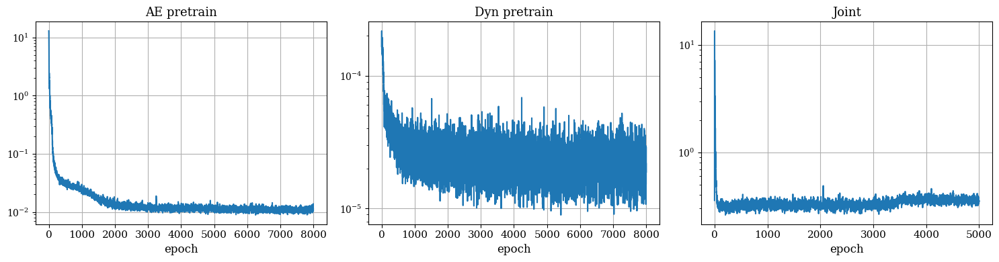

In [ ]:
"""
Retraining on the combined dataset

Retrains the autoencoder and dynamics networks from scratch on the combined stationary-plus-hosing dataset, in stages: first the autoencoder alone, then the dynamics network, so the retrained surrogate can represent both the stable state and the tipping behavior.
"""

import itertools
import torch.nn.functional as F

# --- Stage A: Autoencoder pretraining (Enc + Dec) ---
ae_epochs = 8000
ae_lr     = 1e-3
ae_bs     = 264

encNet.train(); decNet.train(); dynNet.eval()
opt_ae = Adam(itertools.chain(encNet.parameters(), decNet.parameters()), lr=ae_lr)
lossHist_ae = np.zeros(ae_epochs)

print("A) Autoencoder pretraining on combined dataset...")
for ep in range(1, ae_epochs + 1):
    idx = torch.randint(0, XN_train_t.shape[0], (ae_bs,), device=device)
    x = XN_train_t[idx]
    z = encNet(x)
    xrec = decNet(z)
    loss_ae = torch.mean(torch.sum((x - xrec) ** 2, dim=1))

    opt_ae.zero_grad(set_to_none=True)
    loss_ae.backward()
    lossHist_ae[ep - 1] = loss_ae.item()
    opt_ae.step()

    if ep % 400 == 0:
        with torch.no_grad():
            idxv = torch.randint(0, XN_val_t.shape[0], (ae_bs,), device=device)
            xv = XN_val_t[idxv]
            lv = torch.mean(torch.sum((xv - decNet(encNet(xv))) ** 2, dim=1)).item()
        print(f"  AE ep {ep:5d}  train={loss_ae.item():.3e}  val={lv:.3e}")

with torch.no_grad():
    z_train = encNet(XN_train_t)
    print(f"  latent mean={z_train.mean(0).cpu().numpy()}  "
          f"std={z_train.std(0).cpu().numpy()}")

# Save AE checkpoint
torch.save(encNet.state_dict(), os.path.join(retrain_dir, "encNet_ae.pt"))
torch.save(decNet.state_dict(), os.path.join(retrain_dir, "decNet_ae.pt"))

# --- Stage B: Dynamics pretraining (teacher forcing, latent one-step) ---
dyn_epochs = 8000
dyn_lr     = 1e-3
dyn_bs     = 264
clip_norm  = 1.0

encNet.eval(); decNet.eval(); dynNet.train()
opt_dyn = Adam(dynNet.parameters(), lr=dyn_lr)
lossHist_dyn = np.zeros(dyn_epochs)

print("\nB) Dynamics pretraining (teacher forcing in latent space)...")
Utr = U_train_t

for ep in range(1, dyn_epochs + 1):
    valid_starts_dyn = get_valid_starts(1, block_starts_in_tensor,
                                        block_ends_in_tensor)
    idx = sample_rollout_batch(valid_starts_dyn, dyn_bs)

    x_n   = XN_train_t[idx]
    x_np1 = XN_train_t[idx + 1]
    u_n   = Utr[idx]
    if u_n.dim() == 1:
        u_n = u_n.unsqueeze(-1)

    with torch.no_grad():
        z_n   = encNet(x_n)
        z_np1 = encNet(x_np1)

    def rhs(zz, u=u_n):
        return dynNet(torch.cat([zz, u_n], dim=1))

    z_pred = runge_kutta(z_n, dt_years, rhs)
    loss_dyn = F.mse_loss(z_pred, z_np1)

    opt_dyn.zero_grad(set_to_none=True)
    loss_dyn.backward()
    lossHist_dyn[ep - 1] = loss_dyn.item()
    torch.nn.utils.clip_grad_norm_(dynNet.parameters(), clip_norm)
    opt_dyn.step()

    if ep % 400 == 0:
        print(f"  Dyn ep {ep:5d}  loss={loss_dyn.item():.3e}")

torch.save(dynNet.state_dict(), os.path.join(retrain_dir, "dynNet_pretrain.pt"))

# --- Stage C: Joint rollout training ---
numEpochs_joint = 5000
batch_size      = 264
K_train_max     = 80
gamma           = 0.9999

encNet.train(); decNet.train(); dynNet.train()
optimizer = Adam(
    itertools.chain(encNet.parameters(), decNet.parameters(), dynNet.parameters()),
    lr=lr, weight_decay=1e-4,
)
lossHist = np.zeros(numEpochs_joint)

prob_of_teach_forc0    = 1.0
teach_forc_decay_epochs = int(numEpochs_joint * 0.7)

print("\nC) Joint training (enc/dec + latent dynamics rollout)...")
for epoch in range(1, numEpochs_joint + 1):
    K_train = min(K_train_max, 5 + (epoch // 100) * 5)   # faster ramp to K_max
    prob_of_teach_forc = prob_of_teach_forc0 * max(
        0.0, 1.0 - epoch / max(1, teach_forc_decay_epochs)
    )

    valid_starts_train = get_valid_starts(K_train, block_starts_in_tensor,
                                          block_ends_in_tensor)
    idx = sample_rollout_batch(valid_starts_train, batch_size)

    loss = loss_and_grads_rollout_sindy(
        encNet, decNet, dynNet, XN_train_t, U_train_t,
        idx, K_train, dt_years, lambdaRec,
        gamma=gamma, lambdaZ=0.1,
        prob_of_teach_forc=prob_of_teach_forc,
    )

    optimizer.zero_grad(set_to_none=True)
    loss.backward()
    optimizer.step()
    lossHist[epoch - 1] = float(loss.detach().cpu().numpy())

    if (epoch % printEvery) == 0:
        with torch.no_grad():
            idxtr = sample_rollout_batch(valid_starts_train, batch_size)
            train_free = loss_and_grads_rollout_sindy(
                encNet, decNet, dynNet, XN_train_t, U_train_t,
                idxtr, K_train, dt_years, lambdaRec,
                gamma=gamma, lambdaZ=0.1, prob_of_teach_forc=0.0,
            )
            valid_starts_val = get_valid_starts(K_train, val_block_starts, val_block_ends)
            idxv = sample_rollout_batch(valid_starts_val, batch_size)
            val_loss = loss_and_grads_rollout_sindy(
                encNet, decNet, dynNet, XN_val_t, U_val_t,
                idxv, K_train, dt_years, lambdaRec,
                gamma=gamma, lambdaZ=0.1, prob_of_teach_forc=0.0,
            )
            encNet.train(); decNet.train(); dynNet.train()

        print(f"  ep {epoch:5d}/{numEpochs_joint}  K={K_train:2d}  "
              f"p_tf={prob_of_teach_forc:.2f}  "
              f"tr_asst={lossHist[epoch-1]:.3e}  "
              f"tr_free={train_free.item():.3e}  "
              f"val={val_loss.item():.3e}")

# --- Loss plots ---
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
axes[0].plot(lossHist_ae);  axes[0].set_title("AE pretrain");   axes[0].set_yscale("log"); axes[0].grid(True)
axes[1].plot(lossHist_dyn); axes[1].set_title("Dyn pretrain");  axes[1].set_yscale("log"); axes[1].grid(True)
axes[2].plot(lossHist);     axes[2].set_title("Joint");         axes[2].set_yscale("log"); axes[2].grid(True)
for a in axes: a.set_xlabel("epoch")
plt.tight_layout()
plt.savefig(os.path.join(retrain_dir, "training_losses.png"), dpi=180, bbox_inches="tight")
plt.show()


Round-trip MSE on Xtruth_hosing (normalised units):
      variable         MSE
       psi_max  4.3782e-04
     psi_north  1.3594e-03
     psi_south  1.2979e-03
        S_mean  1.5670e-05
  S_north_surf  7.4109e-04
  S_south_surf  4.5833e-04
        S_deep  5.6635e-04
  T_north_surf  1.4314e-03
  T_south_surf  5.2463e-04
        T_mean  5.7085e-04
         w_rms  5.7243e-04
     delta_rho  8.6749e-04
       psi_min  5.6624e-04
       psi_mid  1.7894e-03
         total  1.1199e-02

ψ_min tracking by phase:
         phase       n        RMSE    mean truth    mean recon
      approach    5000      0.0806       -4.1237       -4.1009
    transition    2500      0.1286       -2.4394       -2.3692
   off_plateau   32501      0.0272       -0.0000       -0.0260


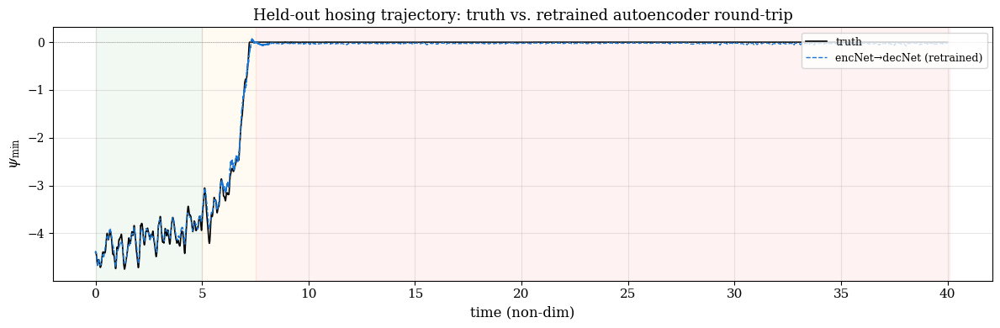

In [ ]:
"""
Checking generalization to an unseen forcing rate

Tests the retrained surrogate model against a hosing run that was deliberately left out of the training data (a different ramp rate), to see whether it generalizes to forcing scenarios it has never seen rather than just memorizing the ones it was trained on.
"""

assert "Xtruth_hosing" in globals(), \
    "Xtruth_hosing not in scope — rerun cell 74 first."

# Normalise with the *new* mu/sd (from combined training data)
XN_hosing = (Xtruth_hosing - mu) / sd
XN_hosing_t = torch.tensor(XN_hosing, dtype=torch.float32, device=device)

encNet.eval(); decNet.eval()
with torch.no_grad():
    z_h     = encNet(XN_hosing_t)
    XN_rec  = decNet(z_h).cpu().numpy()

# Per-variable MSE in normalised space
mse_per_var = ((XN_hosing - XN_rec) ** 2).mean(axis=0)
print(f"\nRound-trip MSE on Xtruth_hosing (normalised units):")
print(f"{'variable':>14s}  {'MSE':>10s}")
for nm, m in zip(var_names, mse_per_var):
    print(f"{nm:>14s}  {m:10.4e}")
print(f"{'total':>14s}  {mse_per_var.sum():10.4e}")

# Phase-segmented MSE on ψ_min (the key diagnostic)
psi_min_idx = model.convention.index("psi_min")
t_hos = np.arange(Xtruth_hosing.shape[0]) * model.delta_t

# Boundaries chosen from the cell-74 trajectory structure.
phase_bounds = [
    ("approach",    0.0,  5.0),
    ("transition",  5.0,  7.5),
    ("off_plateau", 7.5,  t_hos[-1] + 0.1),
]

psi_true = Xtruth_hosing[:, psi_min_idx]
# Denormalise reconstruction for physical-unit comparison
X_rec_phys = XN_rec * sd + mu
psi_rec = X_rec_phys[:, psi_min_idx]

print(f"\nψ_min tracking by phase:")
print(f"{'phase':>14s}  {'n':>6s}  {'RMSE':>10s}  {'mean truth':>12s}  {'mean recon':>12s}")
for name, t_lo, t_hi in phase_bounds:
    mask = (t_hos >= t_lo) & (t_hos < t_hi)
    rmse = np.sqrt(((psi_true[mask] - psi_rec[mask]) ** 2).mean())
    print(f"{name:>14s}  {mask.sum():6d}  {rmse:10.4f}  "
          f"{psi_true[mask].mean():12.4f}  {psi_rec[mask].mean():12.4f}")

# Plot: truth vs. autoencoder round-trip on ψ_min
fig, ax = plt.subplots(figsize=(12, 4))
ax.plot(t_hos, psi_true, color="black", linewidth=1.2, label="truth")
ax.plot(t_hos, psi_rec,  color="#1976D2", linewidth=1.0, linestyle="--",
        label="encNet→decNet (retrained)")
for name, t_lo, t_hi in phase_bounds:
    ax.axvspan(t_lo, t_hi, alpha=0.05,
               color="green" if name == "approach"
               else "orange" if name == "transition" else "red")
ax.axhline(0, color="gray", linewidth=0.5, linestyle=":")
ax.set_xlabel("time (non-dim)")
ax.set_ylabel(r"$\psi_{\min}$")
ax.set_title("Held-out hosing trajectory: truth vs. retrained autoencoder round-trip")
ax.legend(loc="upper right")
ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(retrain_dir, "roundtrip_held_out.png"), dpi=200, bbox_inches="tight")
plt.show()

In [ ]:
"""
Saving the retrained model

Saves the retrained encoder, decoder and dynamics network weights, along with the updated normalization statistics, so this retrained version can be reloaded later without repeating the retraining.
"""

torch.save(encNet.state_dict(), os.path.join(retrain_dir, "encNet_combined.pt"))
torch.save(decNet.state_dict(), os.path.join(retrain_dir, "decNet_combined.pt"))
torch.save(dynNet.state_dict(), os.path.join(retrain_dir, "dynNet_combined.pt"))
np.savez(
    os.path.join(retrain_dir, "norm_stats_combined.npz"),
    mu=mu, sd=sd, Umu=Umu, Usd=Usd,
)
print(f"Saved retrained weights + norm stats → {retrain_dir}")
print("  encNet_combined.pt  decNet_combined.pt  dynNet_combined.pt")
print("  norm_stats_combined.npz")
print("\nStationary-only weights preserved at:")
print(f"  {archive_dir}/")

Saved retrained weights + norm stats → /content/drive/MyDrive/Colab Notebooks/retrain
  encNet_combined.pt  decNet_combined.pt  dynNet_combined.pt
  norm_stats_combined.npz

Stationary-only weights preserved at:
  /content/drive/MyDrive/Colab Notebooks/retrain/stationary_only_weights/


# Early Warning Signals (EWS) from the Hosing Trajectory

In [ ]:
"""
==========================================================================
Early Warning Signals (EWS) from the Hosing Trajectory — Cleaned Version
==========================================================================
Computes classical EWS indicators (running variance, lag-1 autocorrelation)
on LOCALLY DETRENDED residuals as the system approaches tipping.

Changes from the original:
  1. EWS computed on detrended residuals (raw - running mean), not raw signal
  2. Lag-1 autocorrelation fully vectorised (was O(n*window) Python loop)
  3. Fixed psi_north / psi_max variable mismatch
  4. Consistent edge handling across all indicators
  5. Window sensitivity analysis across multiple window sizes
  6. Approach phase defined from EWS indicators, not arbitrary % thresholds
  7. Subsampled (thinned) time series so lag-1 AC is not trivially ≈ 1
==========================================================================
"""

# ── 1. EWS computation functions ─────────────────────────────────────

def running_ews(x, window):
    """
    Compute running mean, variance, and lag-1 autocorrelation
    on locally detrended residuals.

    Parameters
    ----------
    x      : 1D array, raw time series
    window : int, rolling window size in timesteps

    Returns
    -------
    mu       : running mean of x
    residual : x - mu  (locally detrended)
    var      : running variance of residual
    ac1      : running lag-1 autocorrelation of residual
    """
    n = len(x)
    hw = window // 2  # half-window (edges will be unreliable)

    # Running mean (for detrending)
    mu = uniform_filter1d(x.astype(np.float64), size = window, mode = 'nearest')

    # Local residuals: remove the slow trend
    residual = x - mu

    # Running variance of residuals (exact: E[r²] - E[r]², not just E[r²])
    # The detrended residual has near-zero but not exactly zero local mean,
    # so the correction term matters.
    E_r  = uniform_filter1d(residual, size = window, mode = 'nearest')
    E_r2 = uniform_filter1d(residual**2, size = window, mode = 'nearest')
    var  = E_r2 - E_r**2
    var  = np.maximum(var, 0.0)  # clamp numerical negatives

    # Lag-1 autocorrelation of residuals (exact windowed Pearson, vectorised)
    # For paired series r = residual[:-1], s = residual[1:]:
    #   corr = (E[rs] - E[r]E[s]) / sqrt((E[r²]-E[r]²)(E[s²]-E[s]²))
    # All expectations are window-local via uniform_filter1d.
    r = residual[:-1]
    s = residual[1:]

    E_r_l  = uniform_filter1d(r,      size = window, mode = 'nearest')
    E_s_l  = uniform_filter1d(s,      size = window, mode = 'nearest')
    E_rs   = uniform_filter1d(r * s,  size = window, mode = 'nearest')
    E_r2_l = uniform_filter1d(r**2,   size = window, mode = 'nearest')
    E_s2_l = uniform_filter1d(s**2,   size = window, mode = 'nearest')

    cov_rs  = E_rs - E_r_l * E_s_l
    var_r   = np.maximum(E_r2_l - E_r_l**2, 0.0)
    var_s   = np.maximum(E_s2_l - E_s_l**2, 0.0)
    denom   = np.sqrt(var_r * var_s) + 1e-12

    ac1_short = cov_rs / denom  # length n-1

    # Pad to length n (last element repeated)
    ac1 = np.empty(n)
    ac1[:-1] = ac1_short
    ac1[-1]  = ac1_short[-1]

    # Mask edges where the rolling window is incomplete
    mu[:hw]  = np.nan;  mu[-hw:]  = np.nan
    var[:hw] = np.nan;  var[-hw:] = np.nan
    ac1[:hw] = np.nan;  ac1[-hw:] = np.nan

    return mu, residual, var, ac1


def compute_ews(series, window=500):
    """Compute EWS dict for a single time series."""
    mu, residual, var, ac1 = running_ews(series, window)
    return {"mean": mu, "residual": residual, "variance": var, "ac1": ac1}

## This part adds scoring functions for the EWS indicators.


In [ ]:
"""
Early-warning-signal scoring function

Defines a function that computes early-warning-signal clarity metrics for a single time series: the trend (Kendall's tau) in its running variance and lag-1 autocorrelation over the approach to collapse, both classic signatures of critical slowing down.
"""

def ews_kendall_score(series, window, approach_start_idx, approach_end_idx):
    """
    Compute EWS clarity metrics for a single time series.

    All indices refer to the THINNED series.

    Returns
    -------
    dict with keys:
        tau_var    : Kendall-τ of running variance over approach phase
        tau_ac1    : Kendall-τ of lag-1 AC over approach phase
        p_var      : p-value for τ_var
        p_ac1      : p-value for τ_ac1
        fold_var   : ratio of late-phase variance to baseline variance
        lead_steps : how many steps before approach_end the 2× variance
                     threshold is first crossed (larger = earlier warning)
        baseline_var : baseline variance (for reference)
    """
    _, _, var, ac1 = running_ews(series, window)

    # Baseline: first 10% of trajectory (well before approach)
    n = len(series)
    hw = window // 2
    bl_start = hw + 5
    bl_end = max(int(0.05 * n), bl_start + 10)
    baseline_var = np.nanmean(var[bl_start:bl_end])

    # Extract approach phase (drop NaN edges)
    ap_var = var[approach_start_idx:approach_end_idx + 1]
    ap_ac1 = ac1[approach_start_idx:approach_end_idx + 1]

    # Remove NaNs for Kendall computation
    valid_var = ~np.isnan(ap_var)
    valid_ac1 = ~np.isnan(ap_ac1)

    t_var = np.arange(valid_var.sum())
    t_ac1 = np.arange(valid_ac1.sum())

    if len(t_var) < 5:
        tau_var, p_var = 0.0, 1.0
    else:
        tau_var, p_var = kendalltau(t_var, ap_var[valid_var])

    if len(t_ac1) < 5:
        tau_ac1, p_ac1 = 0.0, 1.0
    else:
        tau_ac1, p_ac1 = kendalltau(t_ac1, ap_ac1[valid_ac1])

    # Fold-increase: late 20% of approach vs baseline
    late_start = approach_start_idx + int(0.8 * (approach_end_idx - approach_start_idx))
    late_var = np.nanmean(var[late_start:approach_end_idx + 1])
    fold_var = late_var / (baseline_var + 1e-30)

    # Lead time: how early does variance exceed 2× baseline?
    threshold = 2.0 * baseline_var
    above = np.where(var[approach_start_idx:approach_end_idx + 1] > threshold)[0]
    if len(above) > 0:
        first_cross = above[0]
        lead_steps = (approach_end_idx - approach_start_idx) - first_cross
    else:
        lead_steps = 0  # never crossed → no early warning

    return {
        "tau_var": tau_var,
        "tau_ac1": tau_ac1,
        "p_var": p_var,
        "p_ac1": p_ac1,
        "fold_var": fold_var,
        "lead_steps": lead_steps,
        "baseline_var": baseline_var,
        "variance_ts": var,
        "ac1_ts": ac1,
    }


def composite_ews_score(metrics, w_tau_var=0.35, w_tau_ac1=0.25,
                        w_fold=0.25, w_lead=0.15):
    """
    Weighted composite EWS clarity score.  Higher = clearer warning.

    Each component is in [0, 1]:
      - τ_var, τ_ac1 ∈ [-1, 1] → mapped to [0, 1] via (τ + 1) / 2
      - fold_var  → saturates at 10× via  min(fold / 10, 1)
      - lead_steps → normalised by approach length
    """
    s_tau_var = (metrics["tau_var"] + 1.0) / 2.0
    s_tau_ac1 = (metrics["tau_ac1"] + 1.0) / 2.0
    s_fold    = min(metrics["fold_var"] / 10.0, 1.0)

    # lead_steps is already in the metrics; normalise by total approach
    # This will be done externally since we need approach length
    s_lead = metrics.get("lead_norm", 0.0)

    return (w_tau_var * s_tau_var +
            w_tau_ac1 * s_tau_ac1 +
            w_fold    * s_fold +
            w_lead    * s_lead)

### Log-likelihood function for Critical Slowing Down identification

In [ ]:
"""
A likelihood-based alternative to the trend-based score

Instead of just measuring a trend in variance and autocorrelation, this defines a proper statistical comparison between two models: one where the system's fluctuations are constant over time, and one where they show the characteristic critical-slowing-down pattern of an approaching tipping point. Comparing their likelihoods gives a more principled early-warning score than the simpler trend-based one used above.
"""

"""
This part attempts to apply an actual likelihood function instead of
the previously investigated Kendall-based pseudo-score.

The implementation adheres to the following principles:

Let r_k be the detrended residual series of one observable over the approach
phase. Two stochastic models are compared.

Specifically, a null model where no slowing down is occuring:

r_{k+1} = a * r_k + eps_k

And a Critical Slowing Down model with increasing persistence:

r_{k+1} = a_k * r_k + eps_k
a_k = a0 + beta * t_k,   beta >= 0

This implementation aims to compare the likelihoods of the two models.
If the CSD model gives a higher likelihood than the null model, then
that observable is more compatible with critical slowing down.

We rank observables by the log-likelihood ratio:

LLR = log L_CSD - log L_null

Larger positive LLR = more evidence for CSD.

"""
def _clip_a(a):
    """Keeping AR(1) coefficient in a stable range."""
    return np.clip(a, -0.999, 0.999)

def _prep_residuals_for_ll(series, window, approach_start_idx, approach_end_idx):
    """
    Building the detrended residual series over the approach phase,
    dropping NaN edges from running-window calculations.
    """
    _, residual, _, _ = running_ews(series, window)

    r = residual[approach_start_idx:approach_end_idx + 1]
    r = np.asarray(r, dtype=float)

    valid = np.isfinite(r)
    r = r[valid]

    # Need at least a few points to fit AR(1)
    if len(r) < 8:
        return None

    # Remove any tiny mean offset
    r = r - np.mean(r)
    return r

def _null_model(params, r):
    """
    Null model:
        r_{k+1} = a * r_k + eps_k
        eps_k ~ N(0, q)
    """
    a, log_q = params
    a = _clip_a(a)
    q = np.exp(log_q)

    innov = r[1:] - a * r[:-1]
    n = len(innov)

    return 0.5 * np.sum(np.log(2 * np.pi * q) + (innov ** 2) / q)

def _csd_model(params, r):
    """
    CSD model:
        r_{k+1} = a_k * r_k + eps_k
        a_k = a0 + beta * t_k,  beta >= 0
        eps_k ~ N(0, q)
    """
    a0, beta, log_q = params
    q = np.exp(log_q)

    # Normalized time on [0, 1]
    t = np.linspace(0.0, 1.0, len(r) - 1)

    a_t = _clip_a(a0 + beta * t)
    innov = r[1:] - a_t * r[:-1]

    return 0.5 * np.sum(np.log(2 * np.pi * q) + (innov ** 2) / q)


def ews_actual_loglikelihood(series, window, approach_start_idx, approach_end_idx):
    """
    Fit null AR(1) and CSD AR(1) models to the detrended residual series
    over the approach phase.

    Returns
    -------
    dict with keys:
        logL_null
        logL_csd
        llr = logL_csd - logL_null
        a_null
        a0_csd
        beta_csd
        q_null
        q_csd
        n_points
        success_null
        success_csd
    """
    r = _prep_residuals_for_ll(series, window, approach_start_idx, approach_end_idx)

    if r is None:
        return {
            "logL_null": -np.inf,
            "logL_csd": -np.inf,
            "llr": -np.inf,
            "a_null": np.nan,
            "a0_csd": np.nan,
            "beta_csd": np.nan,
            "q_null": np.nan,
            "q_csd": np.nan,
            "n_points": 0,
            "success_null": False,
            "success_csd": False,
        }

    # Initial guesses
    r0 = r[:-1]
    r1 = r[1:]

    denom = np.dot(r0, r0) + 1e-12
    a_init = np.dot(r0, r1) / denom
    a_init = float(_clip_a(a_init))

    innov0 = r1 - a_init * r0
    q_init = float(np.var(innov0) + 1e-8)
    log_q_init = np.log(q_init)

    # --- Fit null model ---
    res_null = minimize(
        _null_model,
        x0=np.array([a_init, log_q_init], dtype=float),
        args=(r,),
        method="L-BFGS-B",
        bounds=[(-0.999, 0.999), (-30, 10)],
    )

    # --- Fit CSD model ---
    # beta >= 0 enforces non-decreasing persistence
    res_csd = minimize(
        _csd_model,
        x0=np.array([a_init, 0.05, log_q_init], dtype=float),
        args=(r,),
        method="L-BFGS-B",
        bounds=[(-0.999, 0.999), (0.0, 2.0), (-30, 10)],
    )

    logL_null = -float(res_null.fun)
    logL_csd  = -float(res_csd.fun)

    a_null = float(_clip_a(res_null.x[0]))
    q_null = float(np.exp(res_null.x[1]))

    a0_csd   = float(_clip_a(res_csd.x[0]))
    beta_csd = float(res_csd.x[1])
    q_csd    = float(np.exp(res_csd.x[2]))

    return {
        "logL_null": logL_null,
        "logL_csd": logL_csd,
        "llr": logL_csd - logL_null,
        "a_null": a_null,
        "a0_csd": a0_csd,
        "beta_csd": beta_csd,
        "q_null": q_null,
        "q_csd": q_csd,
        "n_points": len(r),
        "success_null": bool(res_null.success),
        "success_csd": bool(res_csd.success),
    }

def combined_ews_score(llr, tau_var, tau_ac1, baseline_var=None,
                       var_floor = 1e-4):
    """
    Only trust the LLR when:
    1. Variance trend is non-negative (τ_var ≥ 0)
    2. Baseline variance is physically meaningful (above noise floor)
    """
    if tau_var < 0:
        return -abs(llr)
    if baseline_var is not None and baseline_var < var_floor:
        return 0.0  # variance too small to be meaningful
    return llr * min(tau_var + 0.5, 1.0)

## Standard EWS computation and figures

In [ ]:
"""
Computing early-warning signals for key variables

Applies the early-warning diagnostics to a handful of key variables from the hosing run. Because the raw simulation is sampled far more finely than needed, the series is first thinned so that the running autocorrelation isn't trivially close to 1, and the analysis window is scaled down to match.
"""

thin = 100
t_ews = t_hosing_arr[::thin]          # thinned time axis

# After thinning 40 000 → 800 points, scale down the EWS window too.
# Original window=500 on 40k points ≈ 1.25% of series.
# Equivalent on 800 points → ~10–100.  Start with 80.
ews_window = 40

ews_vars = ["psi_min", "psi_north", "delta_rho", "S_north_surf", "T_north_surf"]
ews_results = {}

for vname in ews_vars:
    idx = model.convention.index(vname)
    series = Xtruth_hosing[::thin, idx]       # ← thinned
    ews_results[vname] = compute_ews(series, window=ews_window)

print(f"EWS computed on detrended residuals with thin={thin},"
      f"rolling window = {ews_window} steps"
      f"({ews_window * thin * model.delta_t:.2f} non-dim time)")

EWS computed on detrended residuals with thin=100,rolling window = 40 steps(4.00 non-dim time)


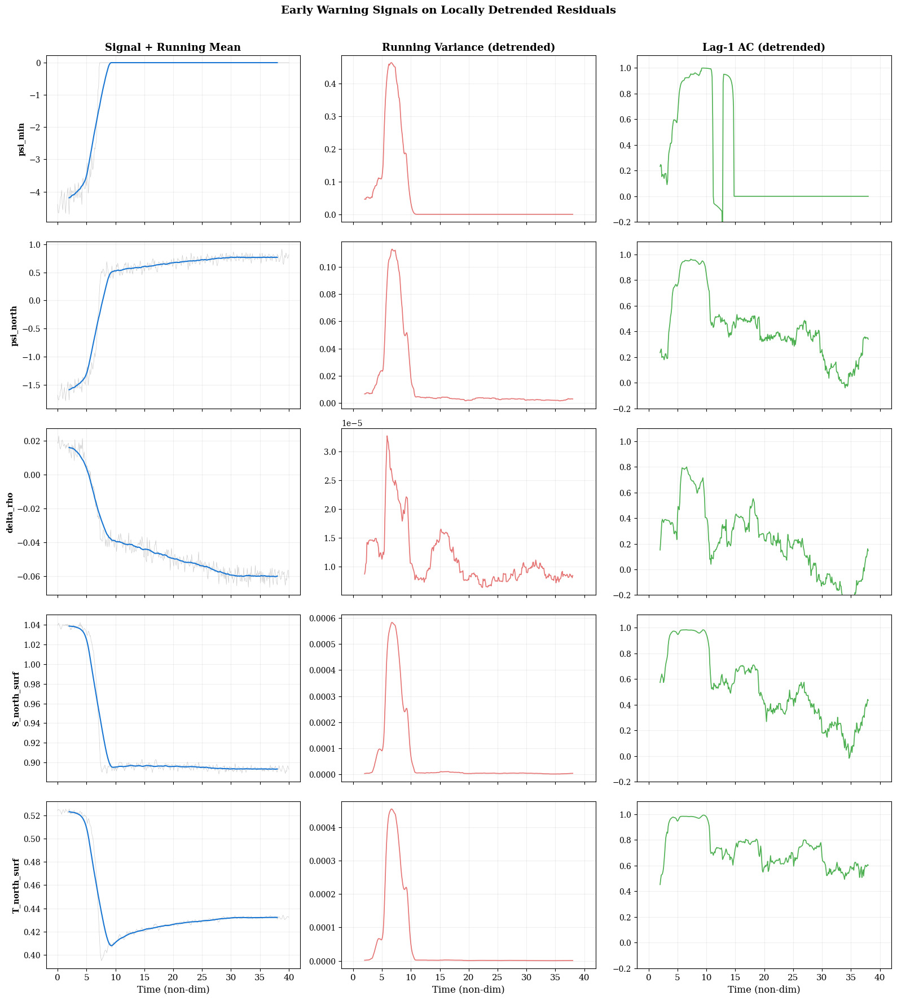

In [ ]:
"""
Plotting the early-warning indicators

Plots the raw signal, running mean, running variance and running autocorrelation for each key variable, to visually inspect whether the classic early-warning pattern (rising variance and autocorrelation before collapse) is present.
"""

fig, axes = plt.subplots(len(ews_vars), 3, figsize=(16, 3.5 * len(ews_vars)),
                         sharex=True)

for i, vname in enumerate(ews_vars):
    ews = ews_results[vname]
    idx = model.convention.index(vname)
    raw = Xtruth_hosing[::thin, idx]          # ← thinned

    # Raw signal + running mean
    axes[i, 0].plot(t_ews, raw, alpha=0.4, linewidth=0.5, color="grey")
    axes[i, 0].plot(t_ews, ews["mean"], color="#1976D2", linewidth=1.5)
    axes[i, 0].set_ylabel(vname, fontsize=10, fontweight="bold")
    if i == 0:
        axes[i, 0].set_title("Signal + Running Mean", fontweight="bold")
    axes[i, 0].grid(True, alpha=0.2)

    # Running variance of detrended residuals
    axes[i, 1].plot(t_ews, ews["variance"], color="#E57373", linewidth=1.2)
    if i == 0:
        axes[i, 1].set_title("Running Variance (detrended)", fontweight="bold")
    axes[i, 1].grid(True, alpha=0.2)

    # Lag-1 autocorrelation of detrended residuals
    axes[i, 2].plot(t_ews, ews["ac1"], color="#4CAF50", linewidth=1.2)
    if i == 0:
        axes[i, 2].set_title("Lag-1 AC (detrended)", fontweight="bold")
    axes[i, 2].grid(True, alpha=0.2)
    axes[i, 2].set_ylim(-0.2, 1.1)

axes[-1, 0].set_xlabel("Time (non-dim)")
axes[-1, 1].set_xlabel("Time (non-dim)")
axes[-1, 2].set_xlabel("Time (non-dim)")

plt.suptitle("Early Warning Signals on Locally Detrended Residuals",
             fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig(f"{outdir}/ews_indicators_detrended.png", dpi=200, bbox_inches="tight")
plt.show()

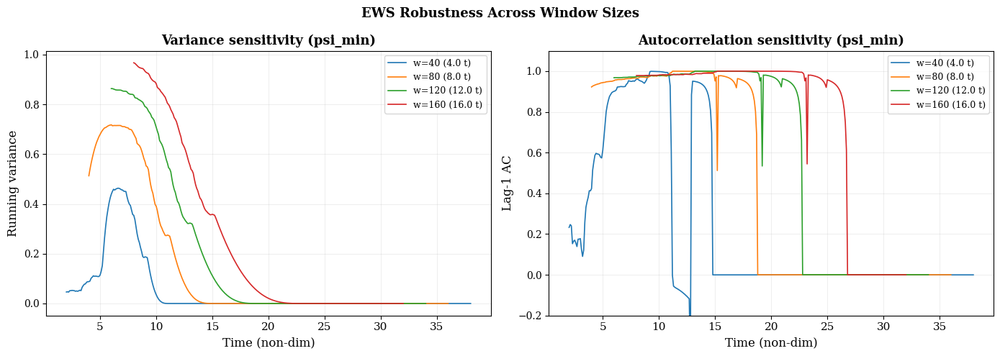

In [ ]:
"""
Checking robustness to the analysis window size

Repeats the early-warning analysis with several different window sizes, to confirm that any rising trend seen is a genuine feature of the data rather than an artefact of one particular, arbitrarily chosen window length.
"""

sensitivity_windows = [40, 80, 120, 160]    # scaled for thinned series
sensitivity_var  = "psi_min"  # primary diagnostic
s_idx = model.convention.index(sensitivity_var)
s_series = Xtruth_hosing[::thin, s_idx]     # ← thinned

fig_sens, (ax_v, ax_a) = plt.subplots(1, 2, figsize=(14, 5))

for win in sensitivity_windows:
    ews_w = compute_ews(s_series, window=win)
    label = f"w={win} ({win * thin * model.delta_t:.1f} t)"
    ax_v.plot(t_ews, ews_w["variance"], linewidth=1.2, label=label)
    ax_a.plot(t_ews, ews_w["ac1"],      linewidth=1.2, label=label)

ax_v.set_xlabel("Time (non-dim)")
ax_v.set_ylabel("Running variance")
ax_v.set_title(f"Variance sensitivity ({sensitivity_var})", fontweight="bold")
ax_v.legend(fontsize=9)
ax_v.grid(True, alpha=0.2)

ax_a.set_xlabel("Time (non-dim)")
ax_a.set_ylabel("Lag-1 AC")
ax_a.set_title(f"Autocorrelation sensitivity ({sensitivity_var})", fontweight="bold")
ax_a.legend(fontsize=9)
ax_a.grid(True, alpha=0.2)
ax_a.set_ylim(-0.2, 1.1)

plt.suptitle("EWS Robustness Across Window Sizes", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.savefig(f"{outdir}/ews_window_sensitivity.png", dpi=200, bbox_inches="tight")
plt.show()

Baseline window: steps 25–35
Kendall τ over baseline: +0.067 (p=0.862)
Baseline is stationary
Baseline stationarity check:
  Kendall τ of variance over first 10%: +0.371 (p=0.059)
  Baseline is stationary

ON-state baseline psi_min:     -4.068
ON-state baseline variance:    5.259e-02
Variance threshold (2x):       1.052e-01
Approach phase: step 43 – 66 (t = 4.30 – 6.60)
psi_min at approach start:     -3.808
psi_min at approach end:       -1.961 (52% decline)


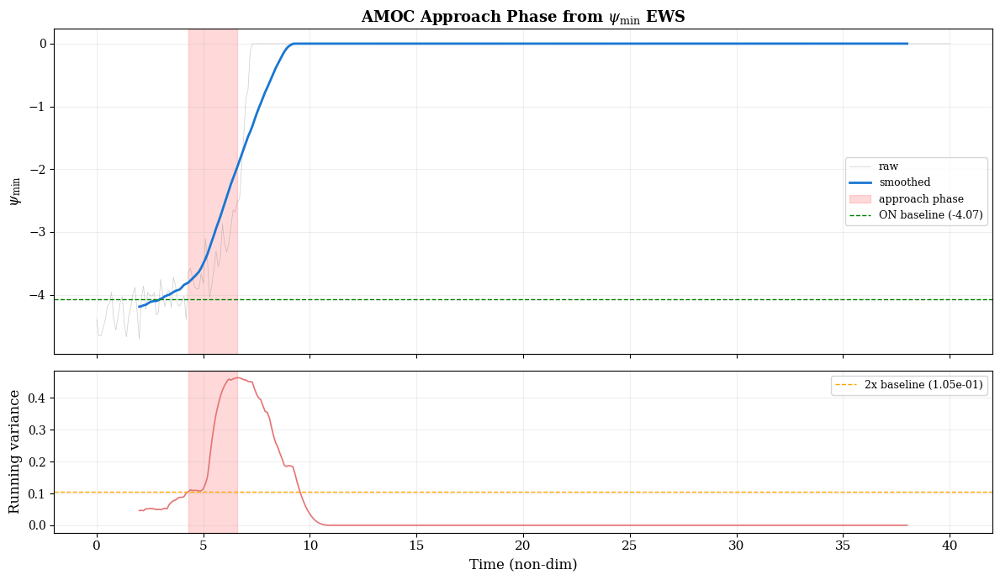

In [ ]:
"""
Defining the approach-to-collapse phase (first pass)

Uses the early-warning indicators themselves, rather than an arbitrary cutoff, to define where the 'approach to tipping' phase begins (when running variance rises well above its baseline) and ends (when the overturning strength actually drops past collapse).
"""

psi_min_idx = model.convention.index("psi_min")
psi_min_series = Xtruth_hosing[::thin, psi_min_idx]
psi_min_ews = ews_results["psi_min"]
psi_min_smooth = psi_min_ews["mean"]
psi_min_var = psi_min_ews["variance"]

# ON-state baseline: skip NaN edge, verify stationarity
hw = ews_window // 2
bl_start = hw + 5
bl_end   = max(int(0.05 * len(psi_min_smooth)), bl_start + 10)

bl_var_series = psi_min_var[bl_start:bl_end]
bl_var_valid = bl_var_series[~np.isnan(bl_var_series)]
t_bl = np.arange(len(bl_var_valid))
tau_bl, p_bl = kendalltau(t_bl, bl_var_valid)

print(f"Baseline window: steps {bl_start}–{bl_end}")
print(f"Kendall τ over baseline: {tau_bl:+.3f} (p={p_bl:.3f})")
print(f"Baseline is {'stationary' if p_bl > 0.05 else 'NON-STATIONARY'}")

psi_on_baseline = np.nanmean(psi_min_smooth[bl_start:bl_end])
var_baseline    = np.nanmean(psi_min_var[bl_start:bl_end])

bl_var_series = psi_min_var[:bl_end]
bl_var_valid = bl_var_series[~np.isnan(bl_var_series)]
t_bl = np.arange(len(bl_var_valid))
tau_bl, p_bl = kendalltau(t_bl, bl_var_valid)

print(f"Baseline stationarity check:")
print(f"  Kendall τ of variance over first 10%: {tau_bl:+.3f} (p={p_bl:.3f})")
print(f"  Baseline is {'stationary' if p_bl > 0.05 else 'NON-STATIONARY'}")

# Approach start: variance exceeds 2x baseline (EWS-based criterion)
var_threshold = 2.0 * var_baseline
above_thresh = np.where(psi_min_var > var_threshold)[0]
approach_start = above_thresh[0] if len(above_thresh) > 0 else bl_end

# Approach end: smoothed psi_min drops below 50% of baseline
decline_frac = (psi_on_baseline - psi_min_smooth) / (psi_on_baseline + 1e-12)
past_50 = np.where(decline_frac > 0.50)[0]
approach_end = past_50[0] if len(past_50) > 0 else len(decline_frac) - 1

print(f"\nON-state baseline psi_min:     {psi_on_baseline:.3f}")
print(f"ON-state baseline variance:    {var_baseline:.3e}")
print(f"Variance threshold (2x):       {var_threshold:.3e}")
print(f"Approach phase: step {approach_start} – {approach_end} "
      f"(t = {t_ews[approach_start]:.2f} – {t_ews[approach_end]:.2f})")
print(f"psi_min at approach start:     {psi_min_smooth[approach_start]:.3f}")
print(f"psi_min at approach end:       {psi_min_smooth[approach_end]:.3f} "
      f"({decline_frac[approach_end]*100:.0f}% decline)")


# Summary plot
fig2, (ax_top, ax_bot) = plt.subplots(2, 1, figsize=(12, 7), sharex=True,
                                      gridspec_kw={"height_ratios": [2, 1]})

# Top: psi_min trajectory + approach phase
ax_top.plot(t_ews, psi_min_series, alpha=0.4, linewidth=0.5, color="grey", label="raw")
ax_top.plot(t_ews, psi_min_smooth, color="#1976D2", linewidth=2, label="smoothed")
ax_top.axvspan(t_ews[approach_start], t_ews[approach_end],
               alpha=0.15, color="red", label="approach phase")
ax_top.axhline(psi_on_baseline, color="green", linestyle="--", linewidth=1,
               label=f"ON baseline ({psi_on_baseline:.2f})")
ax_top.set_ylabel(r"$\psi_{\min}$")
ax_top.set_title(r"AMOC Approach Phase from $\psi_{\min}$ EWS",
                 fontweight="bold")
ax_top.legend(fontsize=9)
ax_top.grid(True, alpha=0.2)

# Bottom: variance with threshold
ax_bot.plot(t_ews, psi_min_var, color="#E57373", linewidth=1.2)
ax_bot.axhline(var_threshold, color="orange", linestyle="--", linewidth=1,
               label=f"2x baseline ({var_threshold:.2e})")
ax_bot.axvspan(t_ews[approach_start], t_ews[approach_end],
               alpha=0.15, color="red")
ax_bot.set_ylabel("Running variance")
ax_bot.set_xlabel("Time (non-dim)")
ax_bot.legend(fontsize=9)
ax_bot.grid(True, alpha=0.2)

plt.tight_layout()
plt.savefig(f"{outdir}/approach_phase_ews_based.png", dpi=200, bbox_inches="tight")
plt.show()

Baseline window: steps 25–35
Kendall τ over baseline: +0.067 (p=0.862)
Baseline is stationary
Baseline stationarity check:
  Kendall τ of variance over first 10%: +0.371 (p=0.059)
  Baseline is stationary

ON-state baseline psi_min:     -4.068
ON-state baseline variance:    5.259e-02
Variance threshold (2x):       1.052e-01
Approach phase: step 43 – 66 (t = 4.30 – 6.60)
psi_min at approach start:     -3.808
psi_min at approach end:       -1.961 (52% decline)


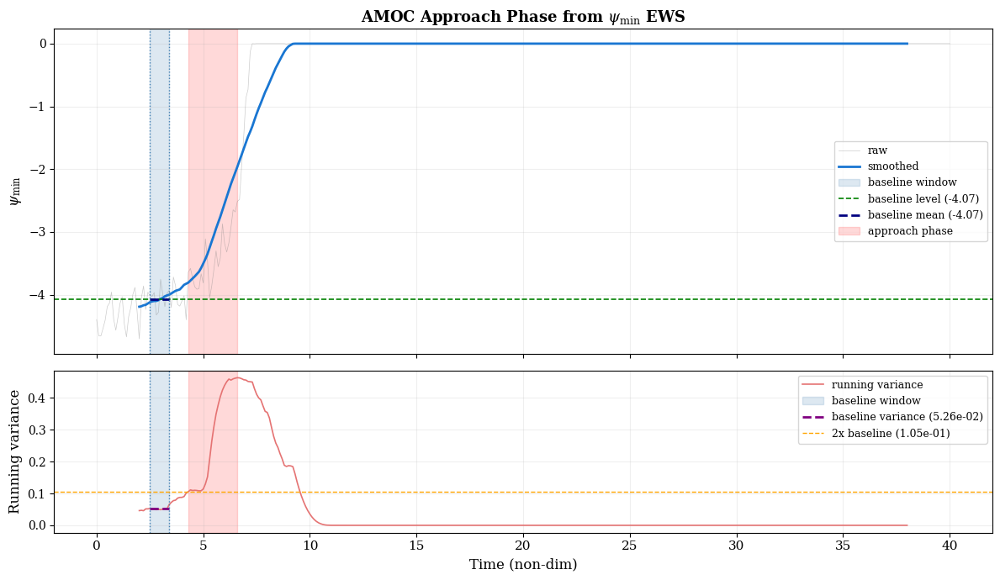

In [ ]:
"""
Defining the approach-to-collapse phase

Same definition as the previous cell -- the approach phase is identified from when running variance first exceeds twice its baseline value to when the overturning strength drops below half its stable-state value.
"""

psi_min_idx = model.convention.index("psi_min")
psi_min_series = Xtruth_hosing[::thin, psi_min_idx]
psi_min_ews = ews_results["psi_min"]
psi_min_smooth = psi_min_ews["mean"]
psi_min_var = psi_min_ews["variance"]

# ON-state baseline: skip NaN edge, verify stationarity
hw = ews_window // 2
bl_start = hw + 5
bl_end   = max(int(0.05 * len(psi_min_smooth)), bl_start + 10)

bl_var_series = psi_min_var[bl_start:bl_end]
bl_var_valid = bl_var_series[~np.isnan(bl_var_series)]
t_bl = np.arange(len(bl_var_valid))
tau_bl, p_bl = kendalltau(t_bl, bl_var_valid)

print(f"Baseline window: steps {bl_start}–{bl_end}")
print(f"Kendall τ over baseline: {tau_bl:+.3f} (p={p_bl:.3f})")
print(f"Baseline is {'stationary' if p_bl > 0.05 else 'NON-STATIONARY'}")

psi_on_baseline = np.nanmean(psi_min_smooth[bl_start:bl_end])
var_baseline    = np.nanmean(psi_min_var[bl_start:bl_end])

bl_var_series = psi_min_var[:bl_end]
bl_var_valid = bl_var_series[~np.isnan(bl_var_series)]
t_bl = np.arange(len(bl_var_valid))
tau_bl, p_bl = kendalltau(t_bl, bl_var_valid)

print(f"Baseline stationarity check:")
print(f"  Kendall τ of variance over first 10%: {tau_bl:+.3f} (p={p_bl:.3f})")
print(f"  Baseline is {'stationary' if p_bl > 0.05 else 'NON-STATIONARY'}")

# Approach start: variance exceeds 2x baseline (EWS-based criterion)
var_threshold = 2.0 * var_baseline
above_thresh = np.where(psi_min_var > var_threshold)[0]
approach_start = above_thresh[0] if len(above_thresh) > 0 else bl_end

# Approach end: smoothed psi_min drops below 50% of baseline
decline_frac = (psi_on_baseline - psi_min_smooth) / (psi_on_baseline + 1e-12)
past_50 = np.where(decline_frac > 0.50)[0]
approach_end = past_50[0] if len(past_50) > 0 else len(decline_frac) - 1

print(f"\nON-state baseline psi_min:     {psi_on_baseline:.3f}")
print(f"ON-state baseline variance:    {var_baseline:.3e}")
print(f"Variance threshold (2x):       {var_threshold:.3e}")
print(f"Approach phase: step {approach_start} – {approach_end} "
      f"(t = {t_ews[approach_start]:.2f} – {t_ews[approach_end]:.2f})")
print(f"psi_min at approach start:     {psi_min_smooth[approach_start]:.3f}")
print(f"psi_min at approach end:       {psi_min_smooth[approach_end]:.3f} "
      f"({decline_frac[approach_end]*100:.0f}% decline)")

# ── Added: convert baseline slice to time coordinates ───────────────
t_bl_start = t_ews[bl_start]
t_bl_end   = t_ews[bl_end - 1]   # last included point in [bl_start:bl_end]

# Summary plot
fig2, (ax_top, ax_bot) = plt.subplots(2, 1, figsize=(12, 7), sharex=True,
                                      gridspec_kw={"height_ratios": [2, 1]})

# Top: psi_min trajectory + baseline window + approach phase
ax_top.plot(t_ews, psi_min_series, alpha=0.4, linewidth=0.5, color="grey", label="raw")
ax_top.plot(t_ews, psi_min_smooth, color="#1976D2", linewidth=2, label="smoothed")

# Baseline window
ax_top.axvspan(t_bl_start, t_bl_end, alpha=0.18, color="steelblue",
               label="baseline window")

# Added: full dashed baseline line across the whole panel
ax_top.axhline(psi_on_baseline, color="green", linestyle="--", linewidth=1.2,
               label=f"baseline level ({psi_on_baseline:.2f})")

# Existing local baseline segment over the window
ax_top.hlines(psi_on_baseline, xmin=t_bl_start, xmax=t_bl_end,
              color="navy", linestyle="--", linewidth=2,
              label=f"baseline mean ({psi_on_baseline:.2f})")

ax_top.axvline(t_bl_start, color="steelblue", linestyle=":", linewidth=1)
ax_top.axvline(t_bl_end,   color="steelblue", linestyle=":", linewidth=1)

# Existing approach phase shading
ax_top.axvspan(t_ews[approach_start], t_ews[approach_end],
               alpha=0.15, color="red", label="approach phase")

ax_top.set_ylabel(r"$\psi_{\min}$")
ax_top.set_title(r"AMOC Approach Phase from $\psi_{\min}$ EWS",
                 fontweight="bold")
ax_top.legend(fontsize=9)
ax_top.grid(True, alpha=0.2)

# Bottom: variance with threshold + baseline window
ax_bot.plot(t_ews, psi_min_var, color="#E57373", linewidth=1.2,
            label="running variance")

# Baseline window + baseline variance segment
ax_bot.axvspan(t_bl_start, t_bl_end, alpha=0.18, color="steelblue",
               label="baseline window")
ax_bot.hlines(var_baseline, xmin=t_bl_start, xmax=t_bl_end,
              color="purple", linestyle="--", linewidth=2,
              label=f"baseline variance ({var_baseline:.2e})")
ax_bot.axvline(t_bl_start, color="steelblue", linestyle=":", linewidth=1)
ax_bot.axvline(t_bl_end,   color="steelblue", linestyle=":", linewidth=1)

# Existing threshold + approach phase
ax_bot.axhline(var_threshold, color="orange", linestyle="--", linewidth=1,
               label=f"2x baseline ({var_threshold:.2e})")
ax_bot.axvspan(t_ews[approach_start], t_ews[approach_end],
               alpha=0.15, color="red")

ax_bot.set_ylabel("Running variance")
ax_bot.set_xlabel("Time (non-dim)")
ax_bot.legend(fontsize=9)
ax_bot.grid(True, alpha=0.2)

plt.tight_layout()
plt.savefig(f"{outdir}/approach_phase_ews_based.png", dpi=200, bbox_inches="tight")
plt.show()

## Probabilistic warning signals

In [ ]:
"""
Searching for the clearest early-warning variable

Runs the early-warning scoring across every candidate state and observation variable, to see which one shows the clearest, most reliable early-warning signal ahead of the collapse.
"""

all_var_names = list(model.convention)
n_all = len(all_var_names)

# Also include the 4 observation-space candidates
# (these may overlap with state variables but are computed differently)
obs_var_names = list(ObsNames)

print("=" * 70)
print("EWS-BASED OBSERVATION SELECTION")
print("Which observable shows the clearest increase in variance?")
print("=" * 70)

# --- Compute EWS scores for each individual state variable ---
approach_length = approach_end - approach_start

individual_scores = {}

for i, vname in enumerate(all_var_names):
    series = Xtruth_hosing[::thin, i]

    metrics = ews_kendall_score(series, ews_window, approach_start, approach_end)
    metrics["lead_norm"] = metrics["lead_steps"] / max(approach_length, 1)

    ll_info = ews_actual_loglikelihood(series, ews_window, approach_start, approach_end)
    score   = composite_ews_score(metrics)

    individual_scores[vname] = {
        **metrics,
        **ll_info,
        "composite_score": score,
        "var_idx": i,
    }

    print(
        f"  {vname:20s}  "
        f"τ_var={metrics['tau_var']:+.3f} (p={metrics['p_var']:.2e})  "
        f"τ_ac1={metrics['tau_ac1']:+.3f}  "
        f"fold={metrics['fold_var']:.1f}×  "
        f"lead={metrics['lead_steps']:4d}  "
        f"LLR={ll_info['llr']:+.2f}  "
        f"beta={ll_info['beta_csd']:.3f}  "
        f"composite={score:.3f}"
    )

# --- Rank individuals ---
ranked = sorted(individual_scores.items(), key=lambda x: -combined_ews_score(
    x[1]["llr"], x[1]["tau_var"], x[1]["tau_ac1"]))


print("\n" + "─" * 70)
print("INDIVIDUAL RANKING (by AR(1)-CSD log-likelihood ratio)")
print("─" * 70)
for rank, (vname, sc) in enumerate(ranked, 1):
    print(
        f"  {rank:2d}. {vname:20s}  "
        f"LLR={sc['llr']:+.2f}  "
        f"logL_csd={sc['logL_csd']:+.2f}  "
        f"logL_null={sc['logL_null']:+.2f}  "
        f"beta={sc['beta_csd']:.3f}  "
        f"τ_var={sc['tau_var']:+.3f}  "
        f"fold={sc['fold_var']:.1f}×"
    )

EWS-BASED OBSERVATION SELECTION
Which observable shows the clearest increase in variance?
  psi_max               τ_var=+0.906 (p=6.14e-15)  τ_ac1=+0.877  fold=8.7×  lead=  23  LLR=+0.00  beta=0.000  composite=0.936
  psi_north             τ_var=+0.978 (p=8.30e-21)  τ_ac1=+0.913  fold=14.7×  lead=  23  LLR=+0.03  beta=0.083  composite=0.985
  psi_south             τ_var=+0.442 (p=2.08e-03)  τ_ac1=-0.616  fold=1.9×  lead=  15  LLR=+1.55  beta=0.350  composite=0.446
  S_mean                τ_var=-0.408 (p=6.50e-03)  τ_ac1=-0.591  fold=0.0×  lead=   0  LLR=+0.00  beta=0.050  composite=0.155
  S_north_surf          τ_var=+0.855 (p=2.05e-12)  τ_ac1=+0.601  fold=80.8×  lead=  23  LLR=+0.00  beta=0.000  composite=0.925
  S_south_surf          τ_var=+0.645 (p=2.10e-06)  τ_ac1=+0.674  fold=2.9×  lead=  15  LLR=+2.43  beta=0.267  composite=0.668
  S_deep                τ_var=+0.848 (p=4.14e-12)  τ_ac1=-0.058  fold=7.1×  lead=  23  LLR=+0.09  beta=0.045  composite=0.768
  T_north_surf          τ_

In [ ]:
"""
Combining evidence across multiple observed variables

Extends the single-variable likelihood-based early-warning score to combinations of variables: for a chosen subset of observed quantities, it sums their individual evidence for critical slowing down into one combined score, to see whether observing several variables together gives a clearer signal than any one alone.
"""

"""
"""


# ── Combination search (composite likelihood ratio) ──────────────────
#
# For each subset of observation-space candidates (ObsNames),
# compute a composite CSD evidence score by summing observable-wise
# log-likelihood ratios:
#
#   LLR(J) = sum_j [logL_csd(j) - logL_null(j)]
#
# This is a composite likelihood / independence approximation.

print("\n" + "=" * 70)
print("EWS OBSERVATION-SET SEARCH (composite AR(1)-CSD likelihood ratio)")
print("=" * 70)

# Map ObsNames to state-variable indices
_obs_to_state = {}
for oname in ObsNames:
    if oname in all_var_names:
        _obs_to_state[oname] = all_var_names.index(oname)
    else:
        _obs_to_state[oname] = oname

# Precompute derived obs once
Xh_t = torch.tensor(Xtruth_hosing, dtype=torch.float32, device=device)
with torch.no_grad():
    Y_hosing = obs_candidates_torch(Xh_t.T).cpu().numpy()

# Pre-compute metrics and likelihood info for obs-space variables
obs_metrics = {}
obs_ll = {}

for j, oname in enumerate(ObsNames):
    if isinstance(_obs_to_state[oname], int):
        idx = _obs_to_state[oname]
        series = Xtruth_hosing[::thin, idx]
    else:
        series = Y_hosing[j, ::thin]

    metrics = ews_kendall_score(series, ews_window, approach_start, approach_end)
    metrics["lead_norm"] = metrics["lead_steps"] / max(approach_length, 1)

    ll_info = ews_actual_loglikelihood(series, ews_window, approach_start, approach_end)

    obs_metrics[oname] = metrics
    obs_ll[oname] = ll_info

    print(
        f"  {oname:18s}  "
        f"LLR={ll_info['llr']:+.2f}  "
        f"beta={ll_info['beta_csd']:.3f}  "
        f"τ_var={metrics['tau_var']:+.3f}  "
        f"fold={metrics['fold_var']:.1f}×"
    )

# Enumerate all non-empty subsets
ews_set_results = []

for B in range(1, len(ObsNames) + 1):
    for J in itertools.combinations(range(len(ObsNames)), B):
        obs_names_J = [ObsNames[j] for j in J]

        # Composite likelihood ratio
        joint_llr = sum(
        combined_ews_score(
        obs_ll[nm]["llr"],
        obs_metrics[nm]["tau_var"],
        obs_metrics[nm]["tau_ac1"])
    for nm in obs_names_J)

        # Also keep raw summed log-likelihoods
        joint_logL_csd  = sum(obs_ll[nm]["logL_csd"] for nm in obs_names_J)
        joint_logL_null = sum(obs_ll[nm]["logL_null"] for nm in obs_names_J)

        avg_composite = np.mean([composite_ews_score(obs_metrics[nm]) for nm in obs_names_J])
        best_tau      = max(obs_metrics[nm]["tau_var"] for nm in obs_names_J)
        avg_fold      = np.mean([obs_metrics[nm]["fold_var"] for nm in obs_names_J])
        max_lead      = max(obs_metrics[nm]["lead_steps"] for nm in obs_names_J)
        mean_beta     = np.mean([obs_ll[nm]["beta_csd"] for nm in obs_names_J])

        ews_set_results.append({
            "J": list(J),
            "obs_names": obs_names_J,
            "label": " + ".join(obs_names_J),
            "joint_llr": joint_llr,
            "joint_logL_csd": joint_logL_csd,
            "joint_logL_null": joint_logL_null,
            "avg_composite": avg_composite,
            "best_tau_var": best_tau,
            "avg_fold_var": avg_fold,
            "max_lead": max_lead,
            "mean_beta": mean_beta,
        })

# Rank by composite likelihood ratio
ews_set_results = sorted(ews_set_results, key=lambda d: -d["joint_llr"])

print("\n" + "─" * 70)
print("TOP OBSERVATION SETS (by composite CSD log-likelihood ratio)")
print("─" * 70)
for rank, r in enumerate(ews_set_results[:10], 1):
    print(
        f"  {rank:2d}. {r['label']:35s}  "
        f"LLR={r['joint_llr']:+.2f}  "
        f"mean_beta={r['mean_beta']:.3f}  "
        f"best_tau={r['best_tau_var']:+.3f}  "
        f"avg_fold={r['avg_fold_var']:.2f}×  "
        f"lead={r['max_lead']:4d}"
    )


EWS OBSERVATION-SET SEARCH (composite AR(1)-CSD likelihood ratio)
  psi_max             LLR=+0.00  beta=0.000  τ_var=+0.906  fold=8.7×
  delta_rho           LLR=+0.09  beta=0.202  τ_var=+0.507  fold=2.0×
  delta_S             LLR=+3.29  beta=0.979  τ_var=+0.761  fold=8.4×
  T_north_surf        LLR=-0.00  beta=0.000  τ_var=+0.848  fold=87.4×

──────────────────────────────────────────────────────────────────────
TOP OBSERVATION SETS (by composite CSD log-likelihood ratio)
──────────────────────────────────────────────────────────────────────
   1. psi_max + delta_rho + delta_S        LLR=+3.38  mean_beta=0.394  best_tau=+0.906  avg_fold=6.39×  lead=  23
   2. delta_rho + delta_S                  LLR=+3.38  mean_beta=0.591  best_tau=+0.761  avg_fold=5.22×  lead=  14
   3. psi_max + delta_rho + delta_S + T_north_surf  LLR=+3.38  mean_beta=0.295  best_tau=+0.906  avg_fold=26.65×  lead=  23
   4. delta_rho + delta_S + T_north_surf   LLR=+3.38  mean_beta=0.394  best_tau=+0.848  avg_fold=32.

/tmp/ipykernel_828/1062741711.py:67: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  joint_llr = sum(
/tmp/ipykernel_828/1062741711.py:75: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  joint_logL_csd  = sum(obs_ll[nm]["logL_csd"] for nm in obs_names_J)
/tmp/ipykernel_828/1062741711.py:76: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  joint_logL_null = sum(obs_ll[nm]["logL_null"] for nm in obs_names_J)


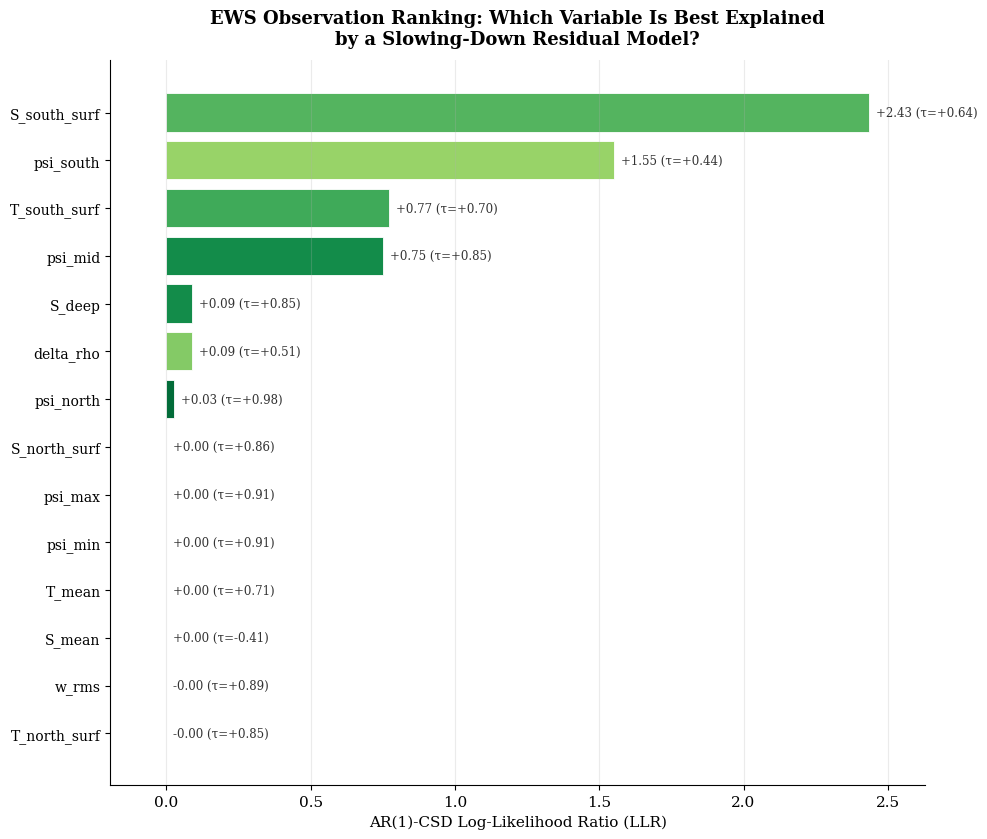

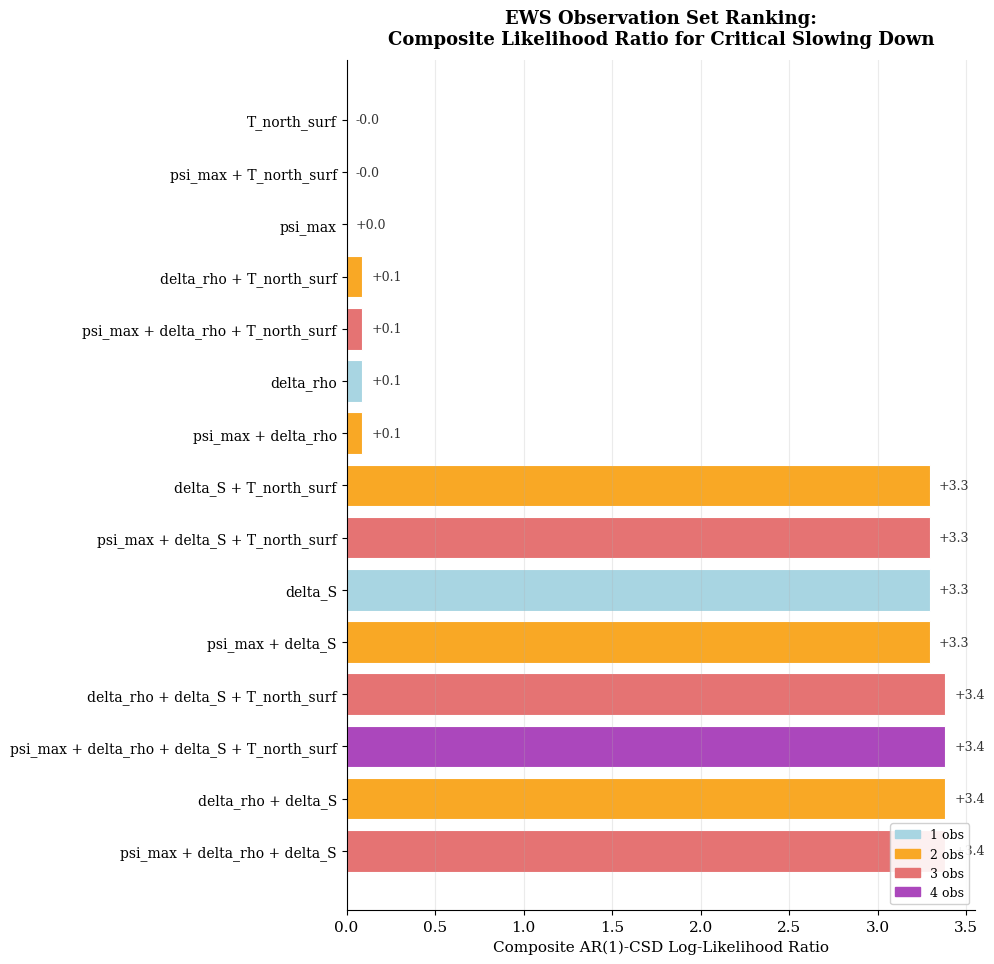

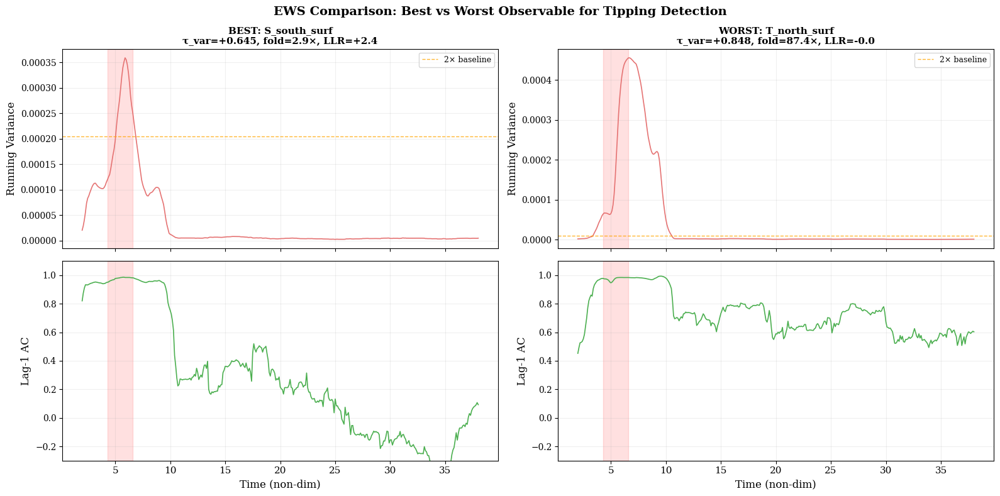

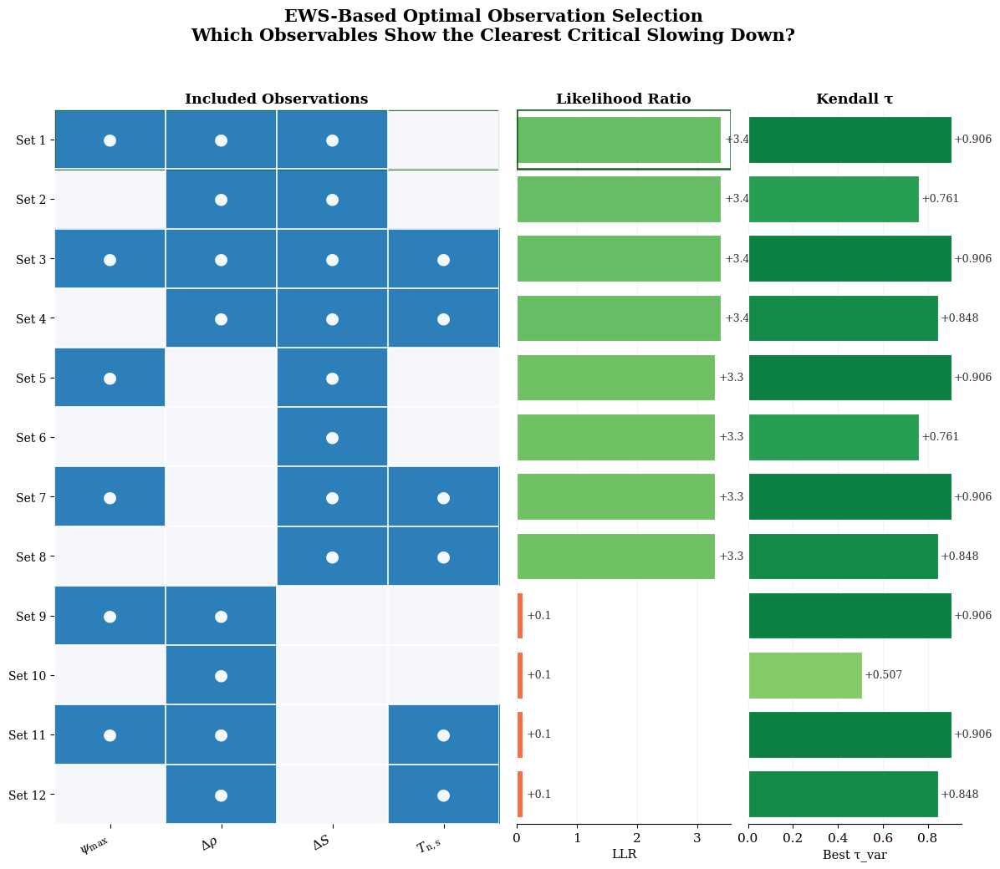


KEY FINDING — EWS-BASED OBSERVATION SELECTION

Best INDIVIDUAL observable for EWS clarity:
  S_south_surf
    LLR:              +2.43
    logL_CSD:         +101.75
    logL_null:        +99.32
    Kendall τ (var):  +0.645 (p = 2.10e-06)
    Variance fold:    2.9×
    Lead time:        15 steps before approach end

Best OBSERVATION SET (composite likelihood-ratio ranking):
  psi_max + delta_rho + delta_S
    Joint LLR:        +3.4
    Best τ_var:       +0.906
    Avg fold:         6.4×
    Mean beta:        0.394

Comparison with PDF-width search (Cell 60):
  PDF search optimises: posterior uncertainty on target variable
  EWS search optimises: clarity of critical slowing down signal
  These may select DIFFERENT observation sets because the PF
  search rewards observables correlated with the target state,
  while the EWS search rewards observables whose fluctuation
  statistics change most detectably before the transition.


In [ ]:
"""
Early-warning summary figures

Builds the summary figures for the early-warning analysis: a ranking of every candidate variable by how clear its early-warning signal is, and supporting plots comparing individual and combined scores.
"""

# ══════════════════════════════════════════════════════════════════════
# FIGURES
# ══════════════════════════════════════════════════════════════════════

# ── FIGURE 1: Individual EWS ranking (all state variables) ──────────

fig1, ax1 = plt.subplots(figsize=(10, 0.5 * n_all + 1.5))

names_sorted  = [v[0] for v in ranked]
scores_sorted = [v[1]["llr"] for v in ranked]
taus_sorted   = [v[1]["tau_var"] for v in ranked]

# Color by tau_var sign and magnitude
norm_tau = np.array(taus_sorted)
cmap = plt.cm.RdYlGn
colors_bar = cmap(0.5 + 0.5 * np.clip(norm_tau, -1, 1))

xmin = min(scores_sorted)
xmax = max(scores_sorted)
pad = 0.08 * (xmax - xmin + 1e-12)
offset = 0.01 * (xmax - xmin + 1e-12)

bars = ax1.barh(
    range(len(names_sorted)),
    scores_sorted,
    color=colors_bar,
    edgecolor="white",
    linewidth=0.6
)

for i, (s, tau) in enumerate(zip(scores_sorted, taus_sorted)):
    ax1.text(
        s + offset,
        i,
        f"{s:+.2f} (τ={tau:+.2f})",
        va="center",
        fontsize=8.5,
        color="#333"
    )

ax1.set_yticks(range(len(names_sorted)))
ax1.set_yticklabels(names_sorted, fontsize=10)
ax1.set_xlabel("AR(1)-CSD Log-Likelihood Ratio (LLR)", fontsize=11)
ax1.set_title(
    "EWS Observation Ranking: Which Variable Is Best Explained\n"
    "by a Slowing-Down Residual Model?",
    fontsize=13,
    fontweight="bold",
    pad=12
)
ax1.invert_yaxis()
ax1.grid(axis="x", alpha=0.25)
ax1.set_xlim(xmin - pad, xmax + pad)

ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)

plt.tight_layout()
plt.savefig(f"{outdir}/ews_obs_ranking_individual.png", dpi=200, bbox_inches="tight")
plt.show()


# ── FIGURE 2: Obs-set search — composite likelihood-ratio chart ─────

fig2, ax2 = plt.subplots(figsize=(10, 0.55 * len(ews_set_results) + 1.5))

rows_plot = sorted(ews_set_results, key=lambda r: r["joint_llr"])  # worst at top
labels = [r["label"] for r in rows_plot]
lls    = [r["joint_llr"] for r in rows_plot]
n_obs  = [len(r["obs_names"]) for r in rows_plot]

palette = {1: "#A8D5E2", 2: "#F9A825", 3: "#E57373", 4: "#AB47BC"}
colors = [palette.get(n, "#90A4AE") for n in n_obs]

bars = ax2.barh(
    range(len(labels)),
    lls,
    color=colors,
    edgecolor="white",
    linewidth=0.8
)

xmin = min(lls)
xmax = max(lls)
offset = 0.015 * (xmax - xmin + 1e-12)

for i, w in enumerate(lls):
    ax2.text(w + offset, i, f"{w:+.1f}", va="center", fontsize=9, color="#333")

ax2.set_yticks(range(len(labels)))
ax2.set_yticklabels(labels, fontsize=10)
ax2.set_xlabel("Composite AR(1)-CSD Log-Likelihood Ratio", fontsize=11)
ax2.set_title(
    "EWS Observation Set Ranking:\n"
    "Composite Likelihood Ratio for Critical Slowing Down",
    fontsize=13,
    fontweight="bold",
    pad=12
)
ax2.invert_yaxis()
ax2.grid(axis="x", alpha=0.25)

handles = [
    mpatches.Patch(color=palette[k], label=f"{k} obs")
    for k in sorted(palette) if k <= len(ObsNames)
]
ax2.legend(handles=handles, loc="lower right", fontsize=9, framealpha=0.9)

ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)

plt.tight_layout()
plt.savefig(f"{outdir}/ews_obs_set_likelihood.png", dpi=200, bbox_inches="tight")
plt.show()


# ── FIGURE 3: EWS time series comparison — best vs worst observable ─

best_obs  = ranked[0]
worst_obs = ranked[-1]

fig3, axes3 = plt.subplots(2, 2, figsize=(16, 8), sharex=True)

for col, (vname, sc) in enumerate([best_obs, worst_obs]):
    idx = sc["var_idx"]
    series_raw = Xtruth_hosing[::thin, idx]
    var_ts = sc["variance_ts"]
    ac1_ts = sc["ac1_ts"]

    label_tag = "BEST" if col == 0 else "WORST"

    # Variance panel
    axes3[0, col].plot(t_ews, var_ts, color="#E57373", linewidth=1.2)
    axes3[0, col].axhline(
        2.0 * sc["baseline_var"],
        color="orange",
        linestyle="--",
        linewidth=1,
        alpha=0.8,
        label="2× baseline"
    )
    axes3[0, col].axvspan(
        t_ews[approach_start],
        t_ews[approach_end],
        alpha=0.12,
        color="red"
    )
    axes3[0, col].set_ylabel("Running Variance")
    axes3[0, col].set_title(
        f"{label_tag}: {vname}\n"
        f"τ_var={sc['tau_var']:+.3f}, "
        f"fold={sc['fold_var']:.1f}×, "
        f"LLR={sc['llr']:+.1f}",
        fontweight="bold",
        fontsize=11
    )
    axes3[0, col].legend(fontsize=9)
    axes3[0, col].grid(True, alpha=0.2)

    # AC1 panel
    axes3[1, col].plot(t_ews, ac1_ts, color="#4CAF50", linewidth=1.2)
    axes3[1, col].axvspan(
        t_ews[approach_start],
        t_ews[approach_end],
        alpha=0.12,
        color="red"
    )
    axes3[1, col].set_ylabel("Lag-1 AC")
    axes3[1, col].set_xlabel("Time (non-dim)")
    axes3[1, col].set_ylim(-0.3, 1.1)
    axes3[1, col].grid(True, alpha=0.2)

plt.suptitle("EWS Comparison: Best vs Worst Observable for Tipping Detection", fontsize = 14, fontweight = "bold")

plt.tight_layout()
plt.savefig(f"{outdir}/ews_best_vs_worst.png", dpi = 200, bbox_inches = "tight")
plt.show()


# ── FIGURE 4: Compact summary panel ──────────────────────────────────

fig4 = plt.figure(figsize=(14, 0.58 * len(ews_set_results) + 2.4))
gs = gridspec.GridSpec(1, 3, width_ratios=[2.5, 1.2, 1.2], wspace=0.06)

ax_mat = fig4.add_subplot(gs[0])
ax_ll  = fig4.add_subplot(gs[1])
ax_tau = fig4.add_subplot(gs[2])

top_n = min(len(ews_set_results), 12)
top_rows = ews_set_results[:top_n]  # already sorted by joint_llr

# Inclusion matrix
all_obs_names = list(ObsNames)
mat = np.zeros((len(top_rows), len(all_obs_names)))

for i, r in enumerate(top_rows):
    for nm in r["obs_names"]:
        if nm in all_obs_names:
            mat[i, all_obs_names.index(nm)] = 1.0

cmap_inc = LinearSegmentedColormap.from_list("inc", ["#F5F7FA", "#2C7FB8"])
ax_mat.imshow(mat, cmap=cmap_inc, aspect="auto", interpolation="nearest", vmin=0, vmax=1)

for i in range(len(top_rows) + 1):
    ax_mat.axhline(i - 0.5, color="white", linewidth=1.2)
for j in range(len(all_obs_names) + 1):
    ax_mat.axvline(j - 0.5, color="white", linewidth=1.2)

for i in range(len(top_rows)):
    for j in range(len(all_obs_names)):
        if mat[i, j] > 0:
            ax_mat.text(j, i, "●", ha="center", va="center",
                        fontsize=14, color="white", alpha=0.95)

pretty = {
    "psi_max": r"$\psi_{\max}$",
    "delta_rho": r"$\Delta \rho$",
    "delta_S": r"$\Delta S$",
    "T_north_surf": r"$T_{\mathrm{n,s}}$"
}
display_obs = [pretty.get(nm, nm) for nm in all_obs_names]

ax_mat.set_xticks(range(len(all_obs_names)))
ax_mat.set_xticklabels(display_obs, fontsize=11, rotation=28, ha="right")
ax_mat.set_yticks(range(len(top_rows)))
ax_mat.set_yticklabels([f"Set {i+1}" for i in range(len(top_rows))], fontsize=10)
ax_mat.set_title("Included Observations", fontsize=12.5, fontweight="bold", pad=6)

for spine in ax_mat.spines.values():
    spine.set_visible(False)

# Likelihood-ratio bars
lls_top = [r["joint_llr"] for r in top_rows]
norm_ll = (np.array(lls_top) - min(lls_top)) / (max(lls_top) - min(lls_top) + 1e-12)
colors_ll = plt.cm.RdYlGn(0.2 + 0.6 * norm_ll)

ax_ll.barh(
    range(len(lls_top)),
    lls_top,
    color=colors_ll,
    edgecolor="white",
    linewidth=0.8,
    height=0.78
)

xmin = min(lls_top)
xmax = max(lls_top)
offset = 0.02 * (xmax - xmin + 1e-12)

for i, s in enumerate(lls_top):
    ax_ll.text(
        s + offset,
        i,
        f"{s:+.1f}",
        va="center",
        ha="left",
        fontsize=9,
        color="#303030"
    )

ax_ll.set_yticks([])
ax_ll.set_xlabel("LLR", fontsize=10.5)
ax_ll.set_title("Likelihood Ratio", fontsize=12.5, fontweight="bold", pad=6)
ax_ll.invert_yaxis()
ax_ll.grid(axis="x", alpha=0.16)
ax_ll.set_axisbelow(True)

for sp in ["top", "right", "left"]:
    ax_ll.spines[sp].set_visible(False)

# Best tau_var bars
taus_top = [r["best_tau_var"] for r in top_rows]
norm_t = (np.array(taus_top) + 1) / 2.0
colors_t = plt.cm.RdYlGn(norm_t)

ax_tau.barh(
    range(len(taus_top)),
    taus_top,
    color=colors_t,
    edgecolor="white",
    linewidth=0.8,
    height=0.78
)

for i, s in enumerate(taus_top):
    ax_tau.text(
        s + 0.01,
        i,
        f"{s:+.3f}",
        va="center",
        ha="left",
        fontsize=9,
        color="#303030"
    )

ax_tau.set_yticks([])
ax_tau.set_xlabel("Best τ_var", fontsize=10.5)
ax_tau.set_title("Kendall τ", fontsize=12.5, fontweight="bold", pad=6)
ax_tau.invert_yaxis()
ax_tau.grid(axis="x", alpha=0.16)
ax_tau.set_axisbelow(True)

for sp in ["top", "right", "left"]:
    ax_tau.spines[sp].set_visible(False)

# Align y-axes
for ax in [ax_mat, ax_ll, ax_tau]:
    ax.set_ylim(len(top_rows) - 0.5, -0.5)

# Highlight best row
ax_mat.add_patch(plt.Rectangle(
    (-0.5, -0.5),
    len(all_obs_names),
    1,
    fill=False,
    edgecolor="#1B5E20",
    linewidth=2.0
))
ax_ll.add_patch(plt.Rectangle(
    (ax_ll.get_xlim()[0], -0.5),
    ax_ll.get_xlim()[1] - ax_ll.get_xlim()[0],
    1,
    fill=False,
    edgecolor="#1B5E20",
    linewidth=1.8
))

plt.suptitle(
    "EWS-Based Optimal Observation Selection\n"
    "Which Observables Show the Clearest Critical Slowing Down?",
    fontsize=15,
    fontweight="bold",
    y=0.99
)
plt.savefig(f"{outdir}/ews_obs_selection_summary.png", dpi = 240, bbox_inches="tight")
plt.show()


# ── 5. Printed summary ───────────────────────────────────────────────

best_individual = ranked[0]
best_set = ews_set_results[0]

print("\n" + "=" * 70)
print("KEY FINDING — EWS-BASED OBSERVATION SELECTION")
print("=" * 70)

print(f"\nBest INDIVIDUAL observable for EWS clarity:")
print(f"  {best_individual[0]}")
print(f"    LLR:              {best_individual[1]['llr']:+.2f}")
print(f"    logL_CSD:         {best_individual[1]['logL_csd']:+.2f}")
print(f"    logL_null:        {best_individual[1]['logL_null']:+.2f}")
print(f"    Kendall τ (var):  {best_individual[1]['tau_var']:+.3f} "
      f"(p = {best_individual[1]['p_var']:.2e})")
print(f"    Variance fold:    {best_individual[1]['fold_var']:.1f}×")
print(f"    Lead time:        {best_individual[1]['lead_steps']} steps "
      f"before approach end")

print(f"\nBest OBSERVATION SET (composite likelihood-ratio ranking):")
print(f"  {best_set['label']}")
print(f"    Joint LLR:        {best_set['joint_llr']:+.1f}")
print(f"    Best τ_var:       {best_set['best_tau_var']:+.3f}")
print(f"    Avg fold:         {best_set['avg_fold_var']:.1f}×")
print(f"    Mean beta:        {best_set['mean_beta']:.3f}")

print(f"\nComparison with PDF-width search (Cell 60):")
print(f"  PDF search optimises: posterior uncertainty on target variable")
print(f"  EWS search optimises: clarity of critical slowing down signal")
print(f"  These may select DIFFERENT observation sets because the PF")
print(f"  search rewards observables correlated with the target state,")
print(f"  while the EWS search rewards observables whose fluctuation")
print(f"  statistics change most detectably before the transition.")
print("=" * 70)

# PF-Based Sensor Placement for AMOC Tipping Detection


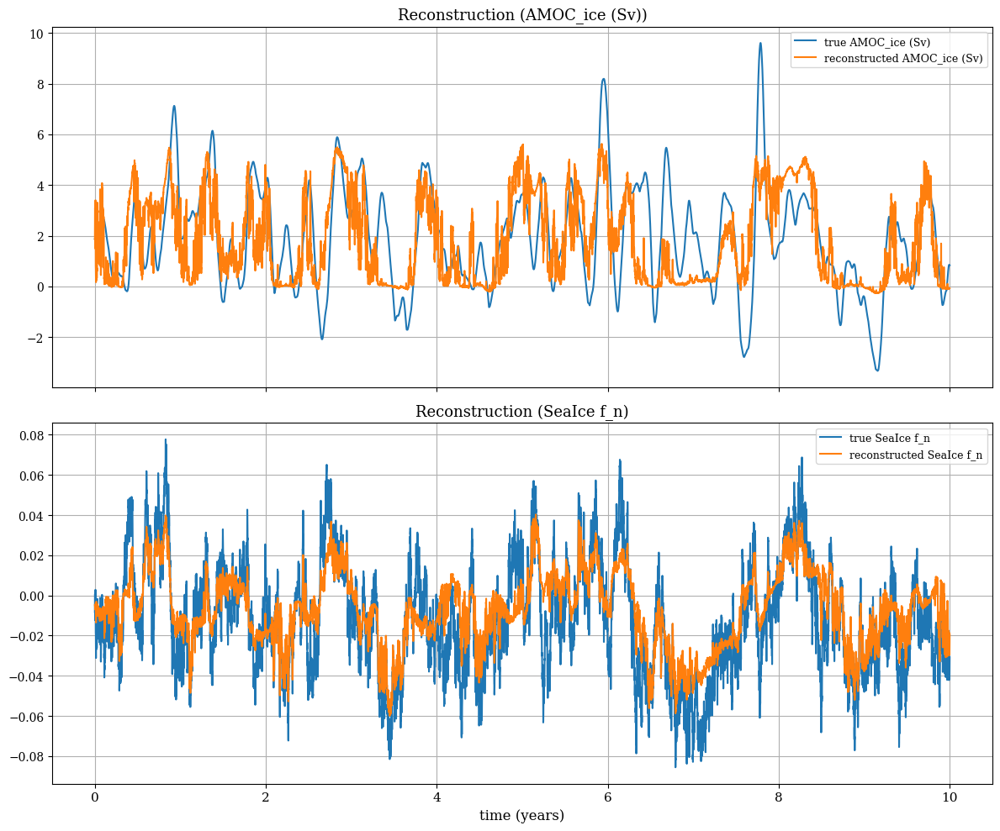

In [ ]:
"""
Plot observed quantities: truth, filter and reconstruction

Compares the true trajectory, the noisy observations, and the filtered/reconstructed estimates for the observed quantities.
"""

t = np.arange(Xn.shape[0]) * dt_years
names = ["AMOC_ice (Sv)", "SeaIce f_n"]

encNet = encNet.to(device).eval()
decNet = decNet.to(device).eval()

Xn_t = Xn_t.to(device = device, dtype = torch.float32)

sd_t = torch.tensor(sd, dtype = torch.float32, device = device)  # [1,11]
mu_t = torch.tensor(mu, dtype = torch.float32, device = device)  # [1,11]

# Xn_t should be the NORMALIZED 11D inputs, shape [K,11]
# (If Xn_t is currently physical, normalize it first.)

with torch.no_grad():
    XrecN_t = decNet(encNet(Xn_t))     # [K,11] normalized reconstruction
    Xrec_t  = XrecN_t * sd_t + mu_t    # [K,11] physical reconstruction

# ---- compute observations from true + recon states ----
with torch.no_grad():
    Xtrue_state_t = (Xn_t * sd_t + mu_t).T   # [11,K] physical truth state (from normalized inputs)
    Xrecon_state_t = Xrec_t.T                # [11,K] physical recon state

    Ytrue_t  = obs_amoc_ice_torch(Xtrue_state_t).T   # [K,2]
    Yrecon_t = obs_amoc_ice_torch(Xrecon_state_t).T  # [K,2]

Ytrue  = Ytrue_t.detach().cpu().numpy()   # [K,2]
Yrecon = Yrecon_t.detach().cpu().numpy()  # [K,2]

# ---- plot ----
fig, axes = plt.subplots(2, 1, figsize=(12,10), sharex=True)
for i, name in enumerate(names):
    axes[i].plot(t, Ytrue[:, i],  label=f"true {name}")
    axes[i].plot(t, Yrecon[:, i], label=f"reconstructed {name}")
    axes[i].set_title(f"Reconstruction ({name})")
    axes[i].grid(True)
    axes[i].legend()

axes[-1].set_xlabel("time (years)")
plt.tight_layout()
plt.show()

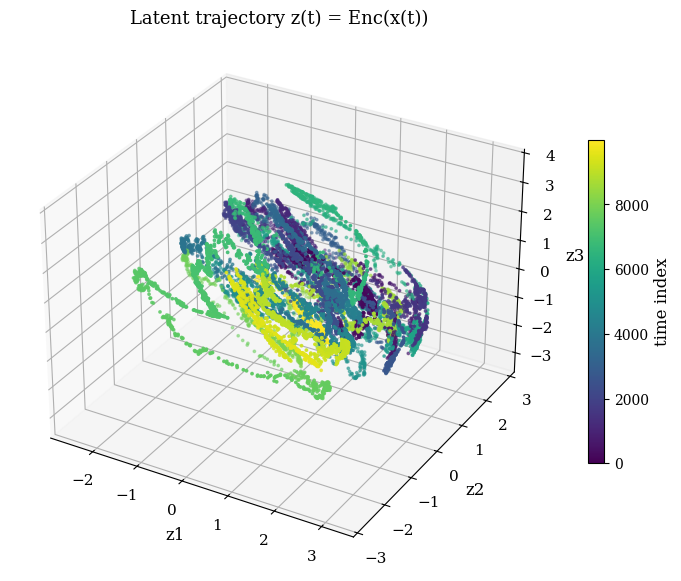

In [ ]:
"""
3D latent-space plot

Plots the encoded latent trajectory in 3D (requires at least 3 latent dimensions), colored by time, to visually inspect its shape.
"""

assert latentDim >= 3, "At least 3 dimensions for a 3D latent plot."

# Encode the normalized sequence (XnN is [(Nt-1) x 4] normalized)
with torch.no_grad():
    XnN_t = torch.as_tensor(XnN, dtype = torch.float32, device = device)
    Z_t   = encNet(XnN_t) # on GPU
    Z     = Z_t.detach().cpu().numpy() # back to CPU for matplotlib

t = np.arange(Z.shape[0])

fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(Z[:,0], Z[:,1], Z[:,2], c = t, s = 3)

ax.set_xlabel("z1"); ax.set_ylabel("z2"); ax.set_zlabel("z3")
ax.set_title("Latent trajectory z(t) = Enc(x(t))")
cb = plt.colorbar(sc, ax = ax, shrink=0.6)
cb.set_label("time index")
plt.show()

In [ ]:
"""
Shape sanity check before a rollout

Prints the shapes of several arrays as a quick sanity check before running a latent-space rollout.
"""

print("mu shape:", np.array(mu).shape)
print("sd shape:", np.array(sd).shape)
print("XnN shape:", np.array(XnN).shape)

Zroll_t = torch.zeros((K_eval, latentDim), dtype=torch.float32, device = device)

with torch.no_grad():
  XnnN_t = decNet(Zroll_t)

print("Zroll_t shape:", tuple(Zroll_t.shape))     # [K, latentDim]
print("decNet(Zroll_t) shape:", tuple(XnnN_t.shape))
print("mu_t shape:", tuple(mu_t.shape))
print("sd_t shape:", tuple(sd_t.shape))

mu shape: (1, 14)
sd shape: (1, 14)
XnN shape: (10000, 14)
Zroll_t shape: (80, 4)
decNet(Zroll_t) shape: (80, 14)
mu_t shape: (1, 14)
sd_t shape: (1, 14)


# EWS via particle filtering (Niklas Boers code used as well)

## Boers adaptation

In [ ]:
"""
Pointing the particle filter at the hosing trajectory

Switches the particle filter's input data over from the original stationary trajectory to the hosing (tipping) experiment, so the same filter machinery used earlier can now be applied to the collapse itself.
"""

_orig_Xtruth     = Xtruth_state.copy()
_orig_Ytruth     = Ytruth_all_t.clone()
_orig_Yobs       = Yobs_all_t.clone()
_orig_U          = U_t.clone()
_orig_Nt         = Nt

# ── Swap to hosing data ──
Xtruth_state = Xtruth_hosing
Nt = Xtruth_hosing.shape[0]

# Recompute truth observations from the hosing trajectory
Xtruth_t = torch.tensor(Xtruth_hosing, dtype=torch.float32, device=device)
with torch.no_grad():
    Ytruth_all_t = obs_candidates_torch(Xtruth_t.T)   # [nCand, Nt]

# Add observation noise (fresh draw)
noise_t = sig_all_t[:, None] * torch.randn(nCand, Nt, device=device)
Yobs_all_t = Ytruth_all_t + noise_t

# Clamp delta_rho to [0, 1] as in cell 49
Yobs_all_t[name_to_idx["delta_rho"]] = torch.clamp(
    Yobs_all_t[name_to_idx["delta_rho"]], 0.0, 1.0
)

# Forcing
U_t = U_hosing_t

# Prior std used by reseed — recompute from hosing data
xPriorStd = Xtruth_hosing.std(axis=0) + 1e-6

print(f"PF globals swapped to hosing trajectory:")
print(f"  Nt = {Nt}  ({Nt * dt_years:.1f} non-dim time)")
print(f"  Xtruth_state shape: {Xtruth_state.shape}")
print(f"  Yobs_all_t shape:   {Yobs_all_t.shape}")
print(f"  U_t shape:          {U_t.shape}")

# Sanity check: ψ_max should decline over the hosing run
psi_max_idx = model.convention.index("psi_max")
print(f"  ψ_max at start: {Xtruth_hosing[0, psi_max_idx]:.3f}")
print(f"  ψ_max at end:   {Xtruth_hosing[-1, psi_max_idx]:.3f}")

PF globals swapped to hosing trajectory:
  Nt = 40001  (40.0 non-dim time)
  Xtruth_state shape: (40001, 14)
  Yobs_all_t shape:   torch.Size([4, 40001])
  U_t shape:          torch.Size([40000, 14])
  ψ_max at start: 4.397
  ψ_max at end:   -0.000


Patched run_pf_with_z_history defined.
(J_fixed, seed=0, verbose=False, do_candidate_stats=False, light=False, use_sindy=False, proc_sigma=0.05, guided_prop=True, nudge_gamma=0.5, nudge_alpha=1.0, jitter=1e-05, rejuv_scale=0.02, rejuv_floor=0.05, sigma_model_frac=0.1, ess_skip_frac=0.3, min_assimilation_gap=3, z_save_every=10, k_snap_extra=None)
PF-coupled rigorous EWS on best_J = [0, 1, 3]


/tmp/ipykernel_828/598821937.py:475: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  n_sig = sum(1 for t in tests.values()


Rigorous EWS on PF trajectories   (window ≈ 1 yr, 1000 Fourier surrogates)
------------------------------------------------------------------------
indicator                                         τ        p  sig
posterior-mean variance (Boers)             -0.363  0.9650   ·
posterior-mean AR(1) (Boers)                -0.257  0.9550   ·
posterior-mean OU `a` (GLSAR)               -0.201  0.9410   ·
PF ensemble variance I1                     -0.440  1.0000   ·
PF forecast inflation I2                    -0.148  0.8860   ·
------------------------------------------------------------------------
Significant at p < 0.05: 0/5 indicators
Note: for `a` (OU restoring rate), positive τ = weakening
      restoring (a climbing from negative toward zero).


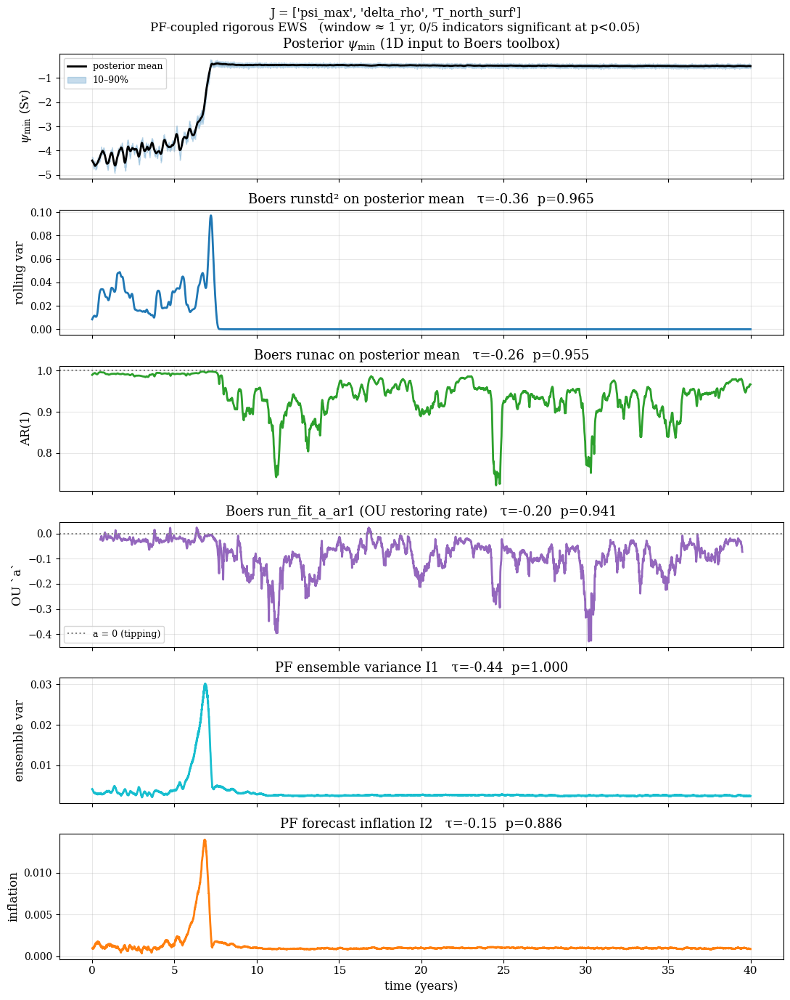

In [ ]:
"""
Combining two early-warning approaches

Introduces the plan to combine the Boers-style critical-slowing-down method with the Singh-style tipping-probability method, applying both within the same particle-filter framework: Boers is useful because it is grounded in critical-slowing-down theory, provided the series is informative enough and the run is long enough.
"""

"""
This is a first endeavour at combining the Singh and Boers papers.
The same PF architecture is implemented to search for EWS. Boers is useful as
they specifically used CSD theory to compute their EWS. Their method is poweful
subject to a time series which is informative enough along with a significant
window lenght. The Boussinesq model is not adequate for both.

=============================================================================
PF-COUPLED RIGOROUS EWS
=============================================================================
One self-contained file combining:

  - v2 PF infrastructure (patcher, ψ_min decoder, ensemble indicators)
  - Boers (2021) trend-test machinery (runstd / runac / run_fit_a_ar1
    + Kendall τ against Fourier-surrogate nulls)

What was dropped relative to v2:
  - destab_probability_scalar / 1.5×-baseline heuristic
  - composite_warning_score / 2-of-3 agreement trajectory
  - plot_warning_pipeline_v2 (replaced by Boers plot)
  - _rolling_ar1_1d (replaced by Boers runac / run_fit_a_ar1)
  - particle_ar1_window_DEPRECATED and the v1 vs v2 comparison

What was retained from v2:
  - Patched PF that records prior + posterior particle histories
  - Per-particle ψ_min decoding
  - Ensemble-based indicators (posterior variance I1, forecast inflation I2)
  - Weighted posterior mean ψ_min(t) as the 1D input to Boers' toolbox

What was added from Boers (second attachment):
  - fourrier_surrogates, kendall_tau_test
  - runstd, runac, run_fit_a_ar1 (per-window linear detrending + GLSAR fit)

REQUIREMENTS in the notebook namespace before running this file:
  - run_pf_once             (cell 60)
  - psiDec, psi_mu_t, psi_sd_t, n_psi   (cell 37)
  - latentDim, Npart, Nt, nX, device, dt_years   (globals)
  - best_J, ObsNames        (from Section 5)

DROP IN at the end of the notebook, after cell 92.
=============================================================================
"""

# =========================================================================
# CELL A — Patcher: clone run_pf_once with prior + post particle recording
# ============================================================================

import inspect

assert "run_pf_once" in globals(), "run_pf_once is not defined. Run the PF cell first."

_pf_src = inspect.getsource(run_pf_once)

anchors = [
    "def run_pf_once(",
    "min_assimilation_gap = 3,  # minimum steps between assimilations",
    "    last_assimilation = - min_assimilation_gap",
    "y_all_k = Yobs_all_t[:, k]",
    '        if verbose and did_reseed:\n            print(f"  [RESEED] k={k}")',
    "return Xfilt, ESS_pf, post_y_std, NIS_pf, snap_data",
]

for a in anchors:
    if a not in _pf_src:
        raise RuntimeError(f"Patcher anchor not found: {a}")

# 1) Rename
_pf_src = _pf_src.replace("def run_pf_once(", "def run_pf_with_z_history(", 1)

# 2) Add z_save_every parameter
_pf_src = _pf_src.replace(
    "min_assimilation_gap = 3,  # minimum steps between assimilations",
    "min_assimilation_gap = 3,  # minimum steps between assimilations\n"
    "                z_save_every = 10,  # subsample factor for z-history",
)

# 3) Initialize PRIOR and POST history arrays
_pf_src = _pf_src.replace(
    "    last_assimilation = - min_assimilation_gap",
    "    # ---- prior + post particle history (for ensemble-based EWS) ----\n"
    "    if not light:\n"
    "        n_save = (Nt + z_save_every - 1) // z_save_every\n"
    "        Z_prior_hist = np.zeros((latentDim, Npart, n_save), dtype=np.float32)\n"
    "        Z_post_hist  = np.zeros((latentDim, Npart, n_save), dtype=np.float32)\n"
    "        w_prior_hist = np.zeros((Npart, n_save), dtype=np.float32)\n"
    "        w_post_hist  = np.zeros((Npart, n_save), dtype=np.float32)\n"
    "        save_steps   = np.zeros(n_save, dtype=np.int64)\n"
    "        _save_idx = 0\n"
    "    else:\n"
    "        Z_prior_hist = None\n"
    "        Z_post_hist  = None\n"
    "        w_prior_hist = None\n"
    "        w_post_hist  = None\n"
    "        save_steps   = None\n"
    "        _save_idx = 0\n"
    "    last_assimilation = - min_assimilation_gap"
)

# 4a) Record PRIOR before assimilation
_pf_src = _pf_src.replace(
    "        y_all_k = Yobs_all_t[:, k]",
    "        # ---- record FORECAST PRIOR (post-forecast, pre-assimilation) ----\n"
    "        if (Z_prior_hist is not None) and (k % z_save_every == 0):\n"
    "            Z_prior_hist[:, :, _save_idx] = Zp.detach().cpu().numpy()\n"
    "            w_prior_hist[:, _save_idx] = w.detach().cpu().numpy()\n"
    "\n"
    "        y_all_k = Yobs_all_t[:, k]"
)

# 4b) Record POSTERIOR after reseed block
_pf_src = _pf_src.replace(
    '        if verbose and did_reseed:\n            print(f"  [RESEED] k={k}")',
    '        if verbose and did_reseed:\n            print(f"  [RESEED] k={k}")\n'
    '\n'
    '        # ---- record POSTERIOR (post-assim, post-resample, post-reseed) ----\n'
    '        if (Z_post_hist is not None) and (k % z_save_every == 0):\n'
    '            Z_post_hist[:, :, _save_idx] = Zp.detach().cpu().numpy()\n'
    '            w_post_hist[:, _save_idx] = w.detach().cpu().numpy()\n'
    '            save_steps[_save_idx] = k\n'
    '            _save_idx += 1'
)

# 5) Update early returns too
_pf_src = _pf_src.replace(
    "return Xfilt, ESS_pf, post_y_std, NIS_pf, snap_data",
    "return (Xfilt, ESS_pf, post_y_std, NIS_pf, snap_data, "
    "Z_prior_hist, Z_post_hist, w_prior_hist, w_post_hist, save_steps)"
)

# 6) Trim histories before final return
needle = "    snap_data['_k_snap_fixed'] = k_snap_fixed\n\n    return (Xfilt, ESS_pf"
if needle not in _pf_src:
    raise RuntimeError("Could not find final return anchor for trimming histories.")

_pf_src = _pf_src.replace(
    needle,
    "    snap_data['_k_snap_fixed'] = k_snap_fixed\n"
    "    if Z_prior_hist is not None:\n"
    "        Z_prior_hist = Z_prior_hist[:, :, :_save_idx]\n"
    "        Z_post_hist  = Z_post_hist[:, :, :_save_idx]\n"
    "        w_prior_hist = w_prior_hist[:, :_save_idx]\n"
    "        w_post_hist  = w_post_hist[:, :_save_idx]\n"
    "        save_steps   = save_steps[:_save_idx]\n\n"
    "    return (Xfilt, ESS_pf"
)

# Compile first so errors show clearly
compile(_pf_src, "<patched_run_pf_with_z_history>", "exec")
exec(_pf_src, globals())

print("Patched run_pf_with_z_history defined.")
print(inspect.signature(run_pf_with_z_history))

# =========================================================================
# CELL B — ψ_min decoder (per-particle, per-time)
# ============================================================================

import torch

def decode_psi_min_from_zhist(Z_hist, batch_size=4096):
    """
    Push every (particle, time) pair through psiDec and reduce to psi_min.

    Parameters
    ----------
    Z_hist : np.ndarray, shape (latentDim, Npart, T_save)

    Returns
    -------
    psi_min : np.ndarray, shape (Npart, T_save), physical units (Sv)
    """
    assert Z_hist.ndim == 3, f"expected (d,P,T), got {Z_hist.shape}"
    d, P, T = Z_hist.shape

    psi_min_idx = model.convention.index("psi_min")

    Z_flat = np.transpose(Z_hist, (1, 2, 0)).reshape(P * T, d)
    Z_flat_t = torch.tensor(Z_flat, dtype=torch.float32, device=device)

    psi_min_flat = np.empty(P * T, dtype=np.float32)

    decNet.eval()

    with torch.no_grad():
        for i in range(0, P * T, batch_size):
            zb = Z_flat_t[i:i + batch_size]
            xb_norm = decNet(zb)
            xb_phys = xb_norm * sd_t + mu_t
            psi_min_flat[i:i + batch_size] = (
                xb_phys[:, psi_min_idx].cpu().numpy()
            )

    return psi_min_flat.reshape(P, T)


# =========================================================================
# CELL C — PF ensemble trajectories (resampling-immune)
# ============================================================================
# I1: posterior ENSEMBLE variance Var_w(ψ_min)(t)
# I2: forecast inflation (additive: Var(prior[k]) − Var(post[k−1]))
# Posterior mean ψ_min(t): 1D series fed to the Boers toolbox in Cell E
# ============================================================================

from scipy.ndimage import uniform_filter1d


def weighted_mean_var(values, weights):
    """
    Weighted mean and variance over the particle (axis=0) dimension.

    Parameters
    ----------
    values  : (P, T) ndarray
    weights : (P, T) ndarray (normalised per-time internally)

    Returns
    -------
    mean : (T,) weighted mean
    var  : (T,) weighted variance
    """
    w = weights / (weights.sum(axis=0, keepdims=True) + 1e-12)
    mean = (w * values).sum(axis=0)
    var = (w * (values - mean[None, :]) ** 2).sum(axis=0)
    return mean, var


def compute_pf_trajectories(J_subset, *, z_save_every=10, smooth_window=20,
                            seed=0, verbose=False):
    """
    Run the patched PF and compute the three PF-derived trajectories
    needed downstream by the Boers analysis.

    Parameters
    ----------
    J_subset      : list/array of candidate-observation indices
    z_save_every  : int, subsample factor for z-history
    smooth_window : int, rolling-mean smoothing window (saved-step units)
    seed, verbose : forwarded to the PF

    Returns
    -------
    dict with:
        'save_steps'         : (T,) saved PF step indices
        'psi_post'            : (P, T) per-particle posterior ψ_min
        'psi_prior'           : (P, T) per-particle prior ψ_min
        'w_post'              : (P, T) posterior weights
        'w_prior'             : (P, T) prior weights
        'mean_post_t'         : (T,) weighted posterior mean ψ_min
        'var_post_t'          : (T,) weighted posterior variance (I1)
        'var_prior_t'         : (T,) weighted prior variance
        'inflation_additive' : (T,) Var(prior[k]) − Var(post[k−1]) (I2)
        'Xfilt', 'ESS_pf'     : PF diagnostics (for sanity checks)
    """
    out = run_pf_with_z_history(
        J_subset, seed=seed, verbose=verbose,
        do_candidate_stats=False, light=False,
        z_save_every=z_save_every,
    )
    (Xfilt, ESS_pf, post_y_std, NIS_pf, snap_data,
     Z_prior_hist, Z_post_hist, w_prior_hist, w_post_hist, save_steps) = out

    if Z_post_hist is None or Z_post_hist.shape[2] < 10:
        return dict(error="z-history too short")

    # Per-particle ψ_min trajectories
    psi_post = decode_psi_min_from_zhist(Z_post_hist)
    psi_prior = decode_psi_min_from_zhist(Z_prior_hist)

    # Ensemble statistics
    mean_post_t, var_post_t = weighted_mean_var(psi_post, w_post_hist)
    _,           var_prior_t = weighted_mean_var(psi_prior, w_prior_hist)

    # Additive inflation (NaN at t=0)
    T = var_prior_t.shape[0]
    inflation_add = np.full(T, np.nan)
    inflation_add[1:] = var_prior_t[1:] - var_post_t[:-1]

    # Optional smoothing
    if smooth_window is not None and smooth_window > 1:
        var_post_t  = uniform_filter1d(var_post_t,  size=smooth_window, mode='nearest')
        var_prior_t = uniform_filter1d(var_prior_t, size=smooth_window, mode='nearest')
        mean_post_t = uniform_filter1d(mean_post_t, size=smooth_window, mode='nearest')
        x_filled = np.where(np.isnan(inflation_add), 0.0, inflation_add)
        valid    = (~np.isnan(inflation_add)).astype(np.float64)
        num = uniform_filter1d(x_filled, size=smooth_window, mode='nearest')
        den = uniform_filter1d(valid,    size=smooth_window, mode='nearest')
        inflation_add = np.where(den > 0.5, num / (den + 1e-12), np.nan)

    return dict(
        J_subset=list(J_subset),
        save_steps=save_steps,
        psi_post=psi_post, psi_prior=psi_prior,
        w_post=w_post_hist, w_prior=w_prior_hist,
        mean_post_t=mean_post_t,
        var_post_t=var_post_t, var_prior_t=var_prior_t,
        inflation_additive=inflation_add,
        Xfilt=Xfilt, ESS_pf=ESS_pf,
    )


# =========================================================================
# CELL D — Boers (2021) helpers
# ============================================================================
# Only the pieces we actually use. runmean / runlf / run_fit_a dropped:
# runmean is redundant (per-window detrending lives inside the statistics),
# runlf is unused, run_fit_a is superseded by run_fit_a_ar1 (GLS correction
# for AR(1) residuals — which CSD produces by definition).
# ============================================================================

import scipy.stats as st
import statsmodels.api as sm


def fourrier_surrogates(ts, ns):
    """Fourier-phase-randomised surrogates (preserves power spectrum)."""
    ts_fourier = np.fft.rfft(ts)
    random_phases = np.exp(
        np.random.uniform(0, 2 * np.pi, (ns, ts.shape[0] // 2 + 1)) * 1.0j
    )
    return np.real(np.fft.irfft(ts_fourier * random_phases))


def kendall_tau_test(ts, ns, tau, mode='kt'):
    """
    Fourier-surrogate p-value for a (positive) Kendall τ trend.

    Returns P(surrogate-trend ≥ observed-trend), so small p means
    "observed upward trend is stronger than the red-noise null".
    """
    tsf = ts - ts.mean()
    nts = fourrier_surrogates(tsf, ns)
    stat = np.zeros(ns)
    tlen = nts.shape[1]
    if mode == 'linear':
        for i in range(ns):
            stat[i] = st.linregress(np.arange(tlen), nts[i])[0]
    else:
        for i in range(ns):
            stat[i] = st.kendalltau(np.arange(tlen), nts[i])[0]
    return 1 - st.percentileofscore(stat, tau) / 100.0


def runstd(x, w):
    """Rolling standard deviation with per-window linear detrending."""
    n = x.shape[0]
    xs = np.zeros_like(x, dtype=np.float64)
    for i in range(n):
        lo = max(0, i - w // 2)
        hi = min(n, i + w // 2 + 1)
        xw = x[lo:hi].astype(np.float64)
        xw = xw - xw.mean()
        if xw.std() > 0 and xw.size >= 3:
            p0, p1 = st.linregress(np.arange(xw.size), xw)[:2]
            xw = xw - p0 * np.arange(xw.size) - p1
            xs[i] = xw.std()
        else:
            xs[i] = np.nan
    return xs


def runac(x, w):
    """Rolling lag-1 autocorrelation with per-window linear detrending."""
    n = x.shape[0]
    xs = np.zeros_like(x, dtype=np.float64)
    for i in range(n):
        lo = max(0, i - w // 2)
        hi = min(n, i + w // 2 + 1)
        xw = x[lo:hi].astype(np.float64)
        xw = xw - xw.mean()
        if xw.std() > 0 and xw.size >= 3:
            p0, p1 = st.linregress(np.arange(xw.size), xw)[:2]
            xw = xw - p0 * np.arange(xw.size) - p1
            xs[i] = np.corrcoef(xw[1:], xw[:-1])[0, 1]
        else:
            xs[i] = np.nan
    return xs


def run_fit_a_ar1(x, w):
    """
    GLSAR fit of the OU restoring rate `a` on per-window detrended signal.

    Fits dx = a · x + b with AR(1)-corrected residuals (Held-Kleinen /
    Boers-Rypdal degenerate fingerprinting). `a` is negative in stable
    regimes and approaches 0 at the tipping point.
    """
    n = x.shape[0]
    xs = np.full(n, np.nan)
    hw = w // 2
    for i in range(hw, n - hw):
        xw = x[i - hw: i + hw + 1].astype(np.float64)
        xw = xw - xw.mean()
        p0, p1 = np.polyfit(np.arange(xw.size), xw, 1)
        xw = xw - p0 * np.arange(xw.size) - p1
        dxw = xw[1:] - xw[:-1]
        X = sm.add_constant(xw)
        try:
            res = sm.GLSAR(dxw, X[:-1], rho=1).iterative_fit(maxiter=10)
            xs[i] = res.params[1]
        except Exception:
            xs[i] = np.nan
    return xs


# =========================================================================
# CELL E — Rigorous EWS analysis (Boers trend tests on PF trajectories)
# =========================================================================
# Five parallel trend tests, all with Fourier-surrogate Kendall τ p-values:
#
#   On posterior MEAN ψ_min(t) — 1D temporal view:
#     (1) runstd²           rolling variance
#     (2) runac             rolling AR(1)
#     (3) run_fit_a_ar1     OU restoring rate (Held-Kleinen / Boers-Rypdal)
#
#   On PF ENSEMBLE quantities — across-particle view:
#     (4) var_post_t        I1, posterior ensemble variance
#     (5) inflation_add     I2, forecast inflation
# =========================================================================


def analyse_pf_trajectories(traj, dt_years, window_years=50.0,
                            ns_surrogates=1000, sig_level=0.05,
                            rng_seed=0, verbose=True):
    """
    Apply Boers' Kendall-τ trend tests to every indicator trajectory.

    Parameters
    ----------
    traj          : dict from compute_pf_trajectories
    dt_years      : float, model timestep
    window_years  : float, rolling window for runstd/runac/run_fit_a_ar1
                     (Boers uses ~50 yr for paleoclimate; set to roughly
                      ¼ of your approach-phase length)
    ns_surrogates : int, number of Fourier surrogates
    sig_level     : float, significance threshold for the verdict
    rng_seed      : int

    Returns
    -------
    dict with trajectories, τ's, p-values, and a significance count.
    """
    np.random.seed(rng_seed)

    save_steps = traj['save_steps']
    dt_saved = (save_steps[1] - save_steps[0]) * dt_years
    window = max(10, int(round(window_years / dt_saved)))

    mean_traj = np.asarray(traj['mean_post_t'], dtype=np.float64)
    var_post  = np.asarray(traj['var_post_t'],  dtype=np.float64)
    inf_add   = np.asarray(traj['inflation_additive'], dtype=np.float64)

    # Boers rolling statistics on the 1D posterior-mean series
    var_t = runstd(mean_traj, window) ** 2
    ac1_t = runac(mean_traj, window)
    a_t   = run_fit_a_ar1(mean_traj, window)

    def _trend_test(series, label):
        v = np.isfinite(series)
        if v.sum() < max(20, window // 2):
            return dict(label=label, tau=np.nan, p=np.nan,
                        error='insufficient valid points')
        s = series[v]
        tau = st.kendalltau(np.arange(s.size), s)[0]
        p   = kendall_tau_test(s, ns_surrogates, tau)
        return dict(label=label, tau=tau, p=p, n=int(v.sum()))

    tests = {
        'mean_var':  _trend_test(var_t,    'posterior-mean variance (Boers)'),
        'mean_ac1':  _trend_test(ac1_t,    'posterior-mean AR(1) (Boers)'),
        'mean_a':    _trend_test(a_t,      'posterior-mean OU `a` (GLSAR)'),
        'ens_var':   _trend_test(var_post, 'PF ensemble variance I1'),
        'inflation': _trend_test(inf_add,  'PF forecast inflation I2'),
    }

    n_sig = sum(1 for t in tests.values()
                if np.isfinite(t['p']) and t['p'] < sig_level)

    bundle = dict(
        window_saved=window, window_years=window * dt_saved,
        var_t=var_t, ac1_t=ac1_t, a_t=a_t,
        var_post=var_post, inf_add=inf_add,
        save_steps=save_steps,
        tests=tests, n_significant=n_sig, sig_level=sig_level,
    )

    if verbose:
        print("=" * 72)
        print(f"Rigorous EWS on PF trajectories   "
              f"(window ≈ {bundle['window_years']:.0f} yr, "
              f"{ns_surrogates} Fourier surrogates)")
        print("-" * 72)
        print(f"{'indicator':42s}  {'τ':>7s}  {'p':>7s}  sig")
        for key, t in tests.items():
            if 'error' in t:
                print(f"{t['label']:42s}  {t['error']}")
            else:
                mark = '✓' if t['p'] < sig_level else '·'
                print(f"{t['label']:42s}  "
                      f"{t['tau']:+.3f}  {t['p']:.4f}   {mark}")
        print("-" * 72)
        print(f"Significant at p < {sig_level}: "
              f"{n_sig}/{len(tests)} indicators")
        print("Note: for `a` (OU restoring rate), positive τ = weakening")
        print("      restoring (a climbing from negative toward zero).")
        print("=" * 72)

    return bundle


# =========================================================================
# CELL F — Diagnostic plot
# ============================================================================

def plot_pf_ews(traj, bundle, dt_years, true_tip_step=None, title=None):
    """
    Six-panel diagnostic:
      1. Posterior ψ_min with 10–90% band
      2. Boers runstd² on posterior mean
      3. Boers runac on posterior mean
      4. Boers run_fit_a_ar1 (OU restoring rate)
      5. PF ensemble variance I1
      6. PF forecast inflation I2
    Each with its Kendall τ and Fourier-surrogate p-value in the title.
    """
    import matplotlib.pyplot as plt

    t = bundle['save_steps'] * dt_years
    tests = bundle['tests']
    sig = bundle['sig_level']

    def _title(key, base):
        tt = tests[key]
        if 'error' in tt:
            return f"{base}  [{tt['error']}]"
        mark = '  ✓' if tt['p'] < sig else ''
        return f"{base}   τ={tt['tau']:+.2f}  p={tt['p']:.3f}{mark}"

    fig, axes = plt.subplots(6, 1, figsize=(11, 14), sharex=True)

    # Panel 1: posterior ψ_min with 10–90% band
    ax = axes[0]
    psi = traj['psi_post']
    w   = traj['w_post']
    w   = w / (w.sum(0, keepdims=True) + 1e-12)
    P, T = psi.shape
    lo = np.empty(T); hi = np.empty(T)
    for k in range(T):
        order = np.argsort(psi[:, k])
        cw = np.cumsum(w[order, k])
        lo[k] = psi[order[min(np.searchsorted(cw, 0.10), P - 1)], k]
        hi[k] = psi[order[min(np.searchsorted(cw, 0.90), P - 1)], k]
    ax.plot(t, traj['mean_post_t'], 'k', lw=2, label='posterior mean')
    ax.fill_between(t, lo, hi, color='tab:blue', alpha=0.25, label='10–90%')
    ax.set_ylabel(r'$\psi_{\min}$ (Sv)')
    ax.set_title('Posterior $\\psi_{\\min}$ (1D input to Boers toolbox)')
    ax.legend(fontsize=9); ax.grid(alpha=0.3)

    # Panel 2: runstd² on posterior mean
    ax = axes[1]
    ax.plot(t, bundle['var_t'], color='tab:blue', lw=2)
    ax.set_ylabel('rolling var')
    ax.set_title(_title('mean_var', 'Boers runstd² on posterior mean'))
    ax.grid(alpha=0.3)

    # Panel 3: runac on posterior mean
    ax = axes[2]
    ax.plot(t, bundle['ac1_t'], color='tab:green', lw=2)
    ax.axhline(1.0, color='gray', ls=':')
    ax.set_ylabel('AR(1)')
    ax.set_title(_title('mean_ac1', 'Boers runac on posterior mean'))
    ax.grid(alpha=0.3)

    # Panel 4: OU restoring rate
    ax = axes[3]
    ax.plot(t, bundle['a_t'], color='tab:purple', lw=2)
    ax.axhline(0.0, color='gray', ls=':', label='a = 0 (tipping)')
    ax.set_ylabel('OU `a`')
    ax.set_title(_title('mean_a', 'Boers run_fit_a_ar1 (OU restoring rate)'))
    ax.legend(fontsize=9); ax.grid(alpha=0.3)

    # Panel 5: PF ensemble variance I1
    ax = axes[4]
    ax.plot(t, bundle['var_post'], color='tab:cyan', lw=2)
    ax.set_ylabel('ensemble var')
    ax.set_title(_title('ens_var', 'PF ensemble variance I1'))
    ax.grid(alpha=0.3)

    # Panel 6: PF forecast inflation I2
    ax = axes[5]
    ax.plot(t, bundle['inf_add'], color='tab:orange', lw=2)
    ax.set_ylabel('inflation')
    ax.set_xlabel('time (years)')
    ax.set_title(_title('inflation', 'PF forecast inflation I2'))
    ax.grid(alpha=0.3)

    for ax in axes:
        if true_tip_step is not None:
            ax.axvline(true_tip_step * dt_years, color='red', ls='--')

    suptitle = (
        f"PF-coupled rigorous EWS   "
        f"(window ≈ {bundle['window_years']:.0f} yr, "
        f"{bundle['n_significant']}/{len(tests)} indicators significant "
        f"at p<{sig})"
    )
    if title:
        suptitle = title + "\n" + suptitle
    fig.suptitle(suptitle, fontsize=12)
    fig.tight_layout()
    return fig


# =========================================================================
# CELL G — Demonstration run
# =========================================================================

# ---- Parameters ----
Z_SAVE_EVERY  = 10    # PF z-history subsampling (match Section 6 thinning)
SMOOTH_WINDOW = 20    # smoothing of PF trajectories (saved-step units)
WINDOW_YEARS  = 1.0  # rolling window for Boers statistics
NS_SURR       = 1000  # Fourier surrogates per test
SIG_LEVEL     = 0.05

TRUE_TIP_STEP = None  # e.g. approach_end_full from cell 92

print("=" * 72)
print(f"PF-coupled rigorous EWS on best_J = {list(best_J)}")
print("=" * 72)

traj = compute_pf_trajectories(
    best_J,
    z_save_every=Z_SAVE_EVERY,
    smooth_window=SMOOTH_WINDOW,
    seed=0, verbose=False,
)

if 'error' in traj:
    print("ERROR:", traj['error'])
else:
    bundle = analyse_pf_trajectories(
        traj,
        dt_years=dt_years,
        window_years=WINDOW_YEARS,
        ns_surrogates=NS_SURR,
        sig_level=SIG_LEVEL,
        verbose=True,
    )

    fig = plot_pf_ews(
        traj, bundle, dt_years=dt_years,
        true_tip_step=TRUE_TIP_STEP,
        title=f"J = {[ObsNames[i] for i in best_J]}",
    )
    plt.show()

## Singh et al. adaptation

In [ ]:
"""
Singh-style tipping-probability helpers (part 1)

Defines the first set of helper functions for the Singh-style forecast, adapted faithfully from the original paper: decoding a cloud of latent particles into the physical collapse variable psi_min.
"""

"""
This is a faithful adaptation from the Singh et al. paper.
"""
# ---------------------------------------------------------------------
# Helper 1: decode one latent particle cloud Z -> psi_min for each particle
# Z shape: (latentDim, Npart)
# returns: (Npart,)
# ---------------------------------------------------------------------
def decode_psi_min_from_Z(Z, batch_size = 4096):
    """
    Decode one latent particle cloud Z -> psi_min for each particle.

    Uses decNet (the autoencoder decoder, z -> 12 scalar diagnostics)
    rather than the auxiliary spatial decoder psiDec.  psi_min is read
    directly from the diagnostic vector, avoiding the unnecessary
    reconstruction of the full psi(x,z) field.

    Z shape : (latentDim, Npart)
    returns : (Npart,)
    """
    assert Z.ndim == 2, f"expected (latentDim, Npart), got {Z.shape}"
    d, P = Z.shape

    psi_min_idx = model.convention.index("psi_min")

    Z_flat = Z.T.contiguous()  # (P, d)
    psi_min = np.empty(P, dtype=np.float32)

    decNet.eval()

    with torch.no_grad():
        for i in range(0, P, batch_size):
            zb = Z_flat[i:i + batch_size]
            xb_norm = decNet(zb)
            xb_phys = xb_norm * sd_t + mu_t
            psi_min[i:i + batch_size] = xb_phys[:, psi_min_idx].cpu().numpy()

    return psi_min


# ---------------------------------------------------------------------
# Helper 2: deterministic forward rollout from a saved posterior ensemble
# ---------------------------------------------------------------------
def rollout_posterior_to_horizon(Z0_np, start_step, horizon_step = None,
                                 use_sindy = False,
                                 proc_sigma_forecast = 0.0):
    """
    Roll the posterior ensemble from PF step start_step to horizon_step.
    To stay close to Singh et al., keep proc_sigma_forecast=0.0.
    """
    if horizon_step is None:
        horizon_step = Nt - 1

    Z = torch.tensor(Z0_np, dtype=torch.float32, device=device).clone()

    for k in range(start_step + 1, horizon_step + 1):
        with torch.no_grad():
            if use_sindy:
                u_src = globals().get("U_scalar_t", None)
                if u_src is None:
                    u_tmp = torch.norm(U_t, dim=1, keepdim=True)
                    u_src = (u_tmp - u_tmp.mean(dim=0, keepdim=True)) / (
                        u_tmp.std(dim=0, keepdim=True) + 1e-8
                    )
                u_raw = u_src[k - 1]
            else:
                u_raw = U_t[k - 1]

            u_k = u_raw.to(device).reshape(1, -1).expand(Z.shape[1], -1)

            if use_sindy:
                rhs = lambda zz: sindy_rhs(zz, u_k)
            else:
                rhs = lambda zz: dynNet(torch.cat([zz, u_k], dim=1))

            Z = runge_kutta(Z.T.contiguous().float(), dt_years, rhs).T

        if proc_sigma_forecast > 0:
            Z = Z + proc_sigma_forecast * torch.randn_like(Z)

        Z = torch.clamp(Z, -10.0, 10.0)

    return Z


# ---------------------------------------------------------------------
# Main: Singh-faithful tipping probability as a function of learning time
# ---------------------------------------------------------------------
def singh_tipping_probability_curve(
    J_subset,
    *,
    psi_tip=0.0,
    z_save_every=10,
    seed=0,
    verbose=False,
    use_sindy=False,
    proc_sigma_pf=0.05,
    proc_sigma_forecast=0.0,   # keep 0.0 for fidelity to Singh
):
    """
    Very close analogue of Singh et al.:
      - run PF
      - at each saved learning time tk, take posterior ensemble
      - project to fixed final horizon Nt-1
      - compute fraction tipped at the horizon

    tipped at horizon <=> psi_min(T_end) >= psi_tip
    """

    out = run_pf_with_z_history(
        J_subset,
        seed=seed,
        verbose=verbose,
        do_candidate_stats=False,
        light=False,
        use_sindy=use_sindy,
        proc_sigma=proc_sigma_pf,
        z_save_every=z_save_every,
    )

    (Xfilt, ESS_pf, post_y_std, NIS_pf, snap_data,
     Z_prior_hist, Z_post_hist, w_prior_hist, w_post_hist, save_steps) = out

    if Z_post_hist is None or Z_post_hist.shape[2] == 0:
        return dict(error="No posterior history saved.")

    Tsave = Z_post_hist.shape[2]
    p_tip = np.full(Tsave, np.nan)
    mean_final_psi = np.full(Tsave, np.nan)

    for j in range(Tsave):
        k_save = int(save_steps[j])

        # posterior ensemble at learning time k_save
        Z0 = Z_post_hist[:, :, j]

        # forward projection to fixed final horizon
        ZT = rollout_posterior_to_horizon(
            Z0,
            start_step=k_save,
            horizon_step=Nt - 1,
            use_sindy=use_sindy,
            proc_sigma_forecast=proc_sigma_forecast,
        )

        psi_final = decode_psi_min_from_Z(ZT)

        # tipped/not tipped at the fixed final horizon
        tipped = (psi_final >= psi_tip).astype(np.float64)

        # use posterior weights from the saved ensemble
        w = np.asarray(w_post_hist[:, j], dtype=np.float64)
        w = w / (w.sum() + 1e-12)

        p_tip[j] = np.sum(w * tipped)
        mean_final_psi[j] = np.sum(w * psi_final)

    return dict(
        J_subset=list(J_subset),
        save_steps=save_steps,
        p_tip=p_tip,
        mean_final_psi=mean_final_psi,
        psi_tip=psi_tip,
        horizon_step=Nt - 1,
        Xfilt=Xfilt,
        ESS_pf=ESS_pf,
    )


# ---------------------------------------------------------------------
# Plot: Singh-style probability vs learning time
# ---------------------------------------------------------------------
def plot_singh_tipping_probability(result, dt_plot=1.0, x_label="model time"):
    if 'error' in result:
        print("ERROR:", result['error'])
        return

    t = result['save_steps'] * dt_plot

    fig, ax = plt.subplots(figsize=(9, 4.5))
    ax.plot(t, result['p_tip'], lw=2, label='probability of tipping by final horizon')
    ax.set_ylim(-0.02, 1.02)
    ax.set_ylabel('tipping probability')
    ax.set_xlabel(x_label)
    ax.set_title(
        f"Singh-style posterior predictive tipping probability\n"
        f"J = {[ObsNames[i] for i in result['J_subset']]} , "
        f"tip criterion: psi_min(T_end) >= {result['psi_tip']}"
    )
    ax.grid(alpha=0.3)
    ax.legend()
    plt.tight_layout()
    plt.show()

In [ ]:
"""
Singh-style tipping-probability helpers (part 2)

Continues the faithful adaptation of the Singh et al. method, building on the decoding helper from the previous cell to construct the full tipping-probability forecast.
"""

"""
This is a faithful adaptation from the Singh et al. paper.
"""
# ---------------------------------------------------------------------
# Helper 1: decode one latent particle cloud Z -> psi_min for each particle
# Z shape: (latentDim, Npart)
# returns: (Npart,)
# ---------------------------------------------------------------------
def decode_psi_min_from_Z(Z, batch_size = 4096):
    """
    Decode one latent particle cloud Z -> psi_min for each particle.

    Uses decNet (the autoencoder decoder, z -> 12 scalar diagnostics)
    rather than the auxiliary spatial decoder psiDec.  psi_min is read
    directly from the diagnostic vector, avoiding the unnecessary
    reconstruction of the full psi(x,z) field.

    Z shape : (latentDim, Npart)
    returns : (Npart,)
    """
    assert Z.ndim == 2, f"expected (latentDim, Npart), got {Z.shape}"
    d, P = Z.shape

    psi_min_idx = model.convention.index("psi_min")

    Z_flat = Z.T.contiguous()  # (P, d)
    psi_min = np.empty(P, dtype=np.float32)

    decNet.eval()

    with torch.no_grad():
        for i in range(0, P, batch_size):
            zb = Z_flat[i:i + batch_size]
            xb_norm = decNet(zb)
            xb_phys = xb_norm * sd_t + mu_t
            psi_min[i:i + batch_size] = xb_phys[:, psi_min_idx].cpu().numpy()

    return psi_min


# ---------------------------------------------------------------------
# Helper 2: deterministic forward rollout from a saved posterior ensemble
# ---------------------------------------------------------------------
def rollout_posterior_to_horizon(Z0_np, start_step, horizon_step = None,
                                 use_sindy = False,
                                 proc_sigma_forecast = 0.0):
    """
    Roll the posterior ensemble from PF step start_step to horizon_step.
    To stay close to Singh et al., keep proc_sigma_forecast=0.0.
    """
    if horizon_step is None:
        horizon_step = Nt - 1

    Z = torch.tensor(Z0_np, dtype=torch.float32, device=device).clone()

    for k in range(start_step + 1, horizon_step + 1):
        with torch.no_grad():
            if use_sindy:
                u_src = globals().get("U_scalar_t", None)
                if u_src is None:
                    u_tmp = torch.norm(U_t, dim=1, keepdim=True)
                    u_src = (u_tmp - u_tmp.mean(dim=0, keepdim=True)) / (
                        u_tmp.std(dim=0, keepdim=True) + 1e-8
                    )
                u_raw = u_src[k - 1]
            else:
                u_raw = U_t[k - 1]

            u_k = u_raw.to(device).reshape(1, -1).expand(Z.shape[1], -1)

            if use_sindy:
                rhs = lambda zz: sindy_rhs(zz, u_k)
            else:
                rhs = lambda zz: dynNet(torch.cat([zz, u_k], dim=1))

            Z = runge_kutta(Z.T.contiguous().float(), dt_years, rhs).T

        if proc_sigma_forecast > 0:
            Z = Z + proc_sigma_forecast * torch.randn_like(Z)

        Z = torch.clamp(Z, -10.0, 10.0)

    return Z


# ---------------------------------------------------------------------
# Main: Singh-faithful tipping probability as a function of learning time
# ---------------------------------------------------------------------
def singh_tipping_probability_curve_batched(
    J_subset,
    *,
    psi_tip=0.0,
    z_save_every=100,
    seed=0,
    verbose=False,
    use_sindy=False,
    proc_sigma_pf=0.05,
    proc_sigma_forecast=0.0,
):
    """
    Batched equivalent of singh_tipping_probability_curve.
    Single forward integration pass instead of Tsave independent rollouts.
    Mathematically identical (same RK4, same dynNet, same forcing).
    """
    out = run_pf_with_z_history(
        J_subset, seed=seed, verbose=verbose,
        do_candidate_stats=False, light=False,
        use_sindy=use_sindy, proc_sigma=proc_sigma_pf,
        z_save_every=z_save_every,
    )
    (Xfilt, ESS_pf, post_y_std, NIS_pf, snap_data,
     Z_prior_hist, Z_post_hist, w_prior_hist, w_post_hist, save_steps) = out

    if Z_post_hist is None or Z_post_hist.shape[2] == 0:
        return dict(error="No posterior history saved.")

    Tsave = Z_post_hist.shape[2]
    latentDim, Npart, _ = Z_post_hist.shape
    horizon = Nt - 1

    # Sort snapshots earliest -> latest so we can inject them in time order
    order = np.argsort(save_steps)
    save_steps_sorted = save_steps[order]
    Z_sorted = Z_post_hist[:, :, order]   # (d, Npart, Tsave)

    # Running batch starts empty; we'll grow it as we pass each k_save
    Z_batch = torch.empty((latentDim, 0), dtype=torch.float32, device=device)
    # Track which snapshot each column in Z_batch belongs to
    snap_id  = torch.empty((0,), dtype=torch.long, device=device)

    k_start = int(save_steps_sorted[0])
    inject_ptr = 0  # next snapshot to inject

    # Inject any snapshots that start at k_start (usually just the first)
    while inject_ptr < Tsave and int(save_steps_sorted[inject_ptr]) == k_start:
        Z_new = torch.tensor(Z_sorted[:, :, inject_ptr],
                             dtype=torch.float32, device=device)
        Z_batch = torch.cat([Z_batch, Z_new], dim=1)
        ids = torch.full((Npart,), inject_ptr, dtype=torch.long, device=device)
        snap_id = torch.cat([snap_id, ids], dim=0)
        inject_ptr += 1

    # Single fused rollout from k_start to horizon
    for k in range(k_start + 1, horizon + 1):
        with torch.no_grad():
            if use_sindy:
                u_src = globals().get("U_scalar_t", None)
                if u_src is None:
                    u_tmp = torch.norm(U_t, dim=1, keepdim=True)
                    u_src = (u_tmp - u_tmp.mean(0, keepdim=True)) / (
                        u_tmp.std(0, keepdim=True) + 1e-8)
                u_raw = u_src[k - 1]
            else:
                u_raw = U_t[k - 1]

            u_k = u_raw.to(device).reshape(1, -1).expand(Z_batch.shape[1], -1)
            rhs = ((lambda zz: sindy_rhs(zz, u_k)) if use_sindy
                   else (lambda zz: dynNet(torch.cat([zz, u_k], dim=1))))

            Z_batch = runge_kutta(Z_batch.T.contiguous().float(),
                                  dt_years, rhs).T

            if proc_sigma_forecast > 0:
                Z_batch = Z_batch + proc_sigma_forecast * torch.randn_like(Z_batch)
            Z_batch = torch.clamp(Z_batch, -10.0, 10.0)

        # Inject any snapshots whose k_save == k (they haven't been rolled yet)
        while inject_ptr < Tsave and int(save_steps_sorted[inject_ptr]) == k:
            Z_new = torch.tensor(Z_sorted[:, :, inject_ptr],
                                 dtype=torch.float32, device=device)
            Z_batch = torch.cat([Z_batch, Z_new], dim=1)
            ids = torch.full((Npart,), inject_ptr,
                             dtype=torch.long, device=device)
            snap_id = torch.cat([snap_id, ids], dim=0)
            inject_ptr += 1

    # Decode psi_min for the whole batch in one go
    psi_final_all = decode_psi_min_from_Z(Z_batch.cpu().numpy())  # (sum,)
    snap_id_np = snap_id.cpu().numpy()

    # Aggregate per snapshot, remembering to undo the sort
    p_tip_sorted        = np.full(Tsave, np.nan)
    mean_final_psi_sort = np.full(Tsave, np.nan)
    for j in range(Tsave):
        mask = (snap_id_np == j)
        psi_j = psi_final_all[mask]
        # posterior weights for the ORIGINAL (unsorted) index
        orig_j = order[j]
        w = np.asarray(w_post_hist[:, orig_j], dtype=np.float64)
        w = w / (w.sum() + 1e-12)
        tipped = (psi_j >= psi_tip).astype(np.float64)
        p_tip_sorted[j]        = np.sum(w * tipped)
        mean_final_psi_sort[j] = np.sum(w * psi_j)

    # Un-sort back to original save_steps order for the plot
    inv = np.argsort(order)
    p_tip          = p_tip_sorted[inv]
    mean_final_psi = mean_final_psi_sort[inv]

    return dict(
        J_subset = list(J_subset),
        save_steps = save_steps,
        p_tip = p_tip,
        mean_final_psi = mean_final_psi,
        psi_tip = psi_tip,
        horizon_step = horizon,
        Xfilt = Xfilt,
        ESS_pf = ESS_pf,)


# ---------------------------------------------------------------------
# Plot: Singh-style probability vs learning time
# ---------------------------------------------------------------------
def plot_singh_tipping_probability(result, dt_plot=1.0, x_label="model time"):
    if 'error' in result:
        print("ERROR:", result['error'])
        return

    t = result['save_steps'] * dt_plot

    fig, ax = plt.subplots(figsize=(9, 4.5))
    ax.plot(t, result['p_tip'], lw=2, label='probability of tipping by final horizon')
    ax.set_ylim(-0.02, 1.02)
    ax.set_ylabel('tipping probability')
    ax.set_xlabel(x_label)
    ax.set_title(
        f"Singh-style posterior predictive tipping probability\n"
        f"J = {[ObsNames[i] for i in result['J_subset']]} , "
        f"tip criterion: psi_min(T_end) >= {result['psi_tip']}"
    )
    ax.grid(alpha=0.3)
    ax.legend()
    plt.tight_layout()
    plt.show()

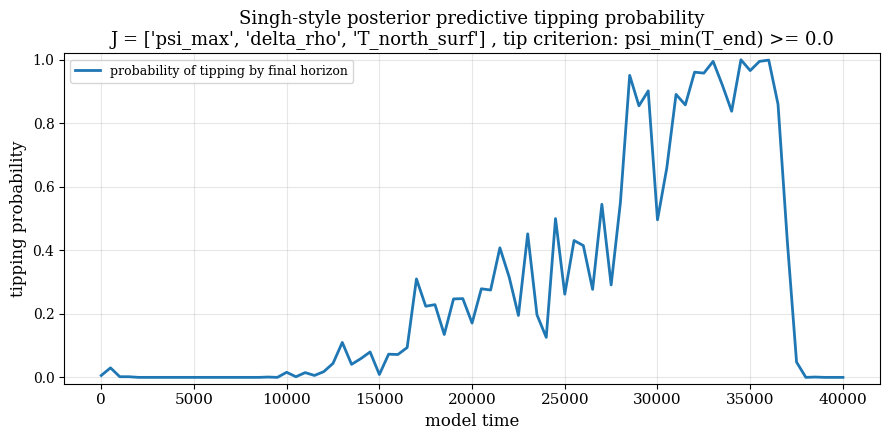

In [ ]:
"""
Run the Singh-style tipping-probability forecast

Runs the tipping-probability forecast on the chosen observation set and plots the resulting probability curve alongside the true collapse.
"""

res_singh = singh_tipping_probability_curve(
    best_J,
    psi_tip = 0.0, # physical collapse boundary of psi_{min}
    z_save_every = 500,
    seed = 0,
    verbose = False,
    use_sindy = False,
    proc_sigma_pf = 0.05, # the current PF setting
    proc_sigma_forecast = 0.0, # faithful to Singh
)

plot_singh_tipping_probability(
    res_singh,
    dt_plot = 1.0, # or dt_years if you truly want years
    x_label = "model time")

Text(0, 0.5, '$\\psi_{\\min}$')

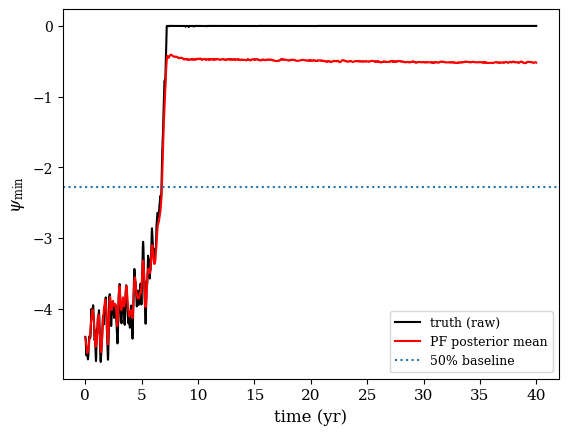

In [ ]:
"""
Compare truth and filtered collapse variable

Plots the true psi_min trajectory from the hosing run against the particle filter's decoded estimate, to check the filter tracks the actual collapse.
"""

# Truth vs PF-decoded psi_min on the hosing run
psi_min_idx = model.convention.index("psi_min")
psi_min_truth = Xtruth_hosing[:, psi_min_idx] # what Section 6 uses
psi_min_pf    = traj['mean_post_t'] # what the Boers pipeline uses
t_truth = np.arange(len(psi_min_truth)) * dt_years
t_pf    = traj['save_steps'] * dt_years

plt.plot(t_truth, psi_min_truth, 'k', label='truth (raw)')
plt.plot(t_pf,    psi_min_pf,    'r', label='PF posterior mean')
plt.axhline(0.5 * psi_min_truth[:200].mean(), ls=':', label='50% baseline')
plt.legend(); plt.xlabel('time (yr)'); plt.ylabel(r'$\psi_{\min}$')

In [ ]:
"""
Checkpoint before retraining

Saves the currently trained network weights to disk before any retraining begins, so the notebook can roll back to this point if a later retraining step makes things worse.
"""

import os, torch

checkpoint_dir = "/content/drive/MyDrive/Colab Notebooks/checkpoints_pre_retrain"
os.makedirs(checkpoint_dir, exist_ok=True)

torch.save({
    'encNet':       encNet.state_dict(),
    'decNet':       decNet.state_dict(),
    'dynNet':       dynNet.state_dict(),
    'psiDec':       psiDec.state_dict() if 'psiDec' in globals() else None,
    'sindyLayer':   sindyLayer.state_dict() if 'sindyLayer' in globals() else None,
    # Normalisation statistics — essential for decode to work correctly
    'mu_t':         mu_t.detach().cpu(),
    'sd_t':         sd_t.detach().cpu(),
    'psi_mu_t':     psi_mu_t.detach().cpu() if 'psi_mu_t' in globals() else None,
    'psi_sd_t':     psi_sd_t.detach().cpu() if 'psi_sd_t' in globals() else None,
    # Metadata
    'latentDim':    latentDim,
    'description':  'Pre-retrain checkpoint: ON-state only trained surrogate',
}, os.path.join(checkpoint_dir, "surrogate_stationary_only.pt"))

print(f"Checkpoint saved to {checkpoint_dir}/surrogate_stationary_only.pt")

# To restore later:
# ckpt = torch.load(os.path.join(checkpoint_dir, "surrogate_stationary_only.pt"))
# encNet.load_state_dict(ckpt['encNet'])
# decNet.load_state_dict(ckpt['decNet'])
# dynNet.load_state_dict(ckpt['dynNet'])
# etc.

Checkpoint saved to /content/drive/MyDrive/Colab Notebooks/checkpoints_pre_retrain/surrogate_stationary_only.pt


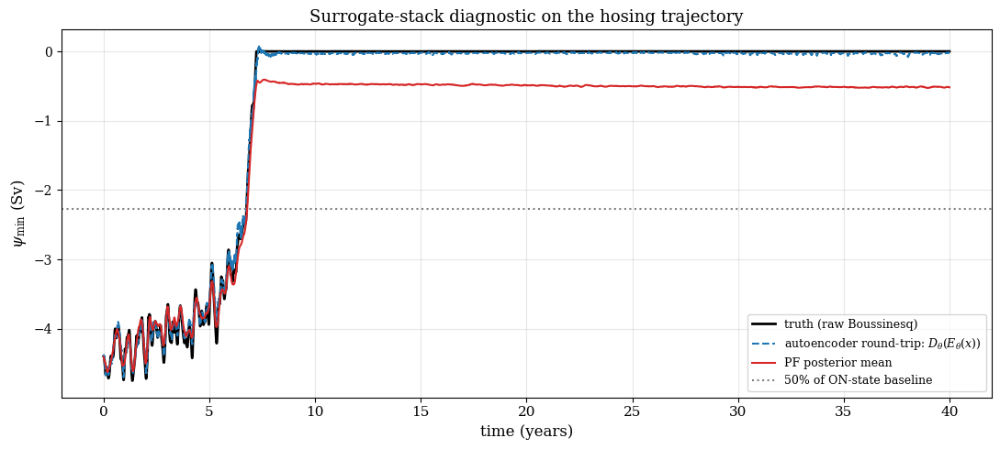

Truth psi_min:   start=-4.397, end=+0.000
Enc-dec psi_min: start=-4.387, end=-0.020
PF psi_min:      start=-4.408, end=-0.519


In [ ]:
"""
Three-curve diagnostic: isolating where errors come from

Plots the true collapse variable alongside two different model-based estimates -- the encoder/decoder round-trip alone, and the full particle-filter posterior -- so that disagreements can be traced to a specific part of the pipeline: the autoencoder, the dynamics network, or the filter itself.
"""

psi_min_idx = model.convention.index("psi_min")

# 1. Truth
psi_min_truth = Xtruth_hosing[:, psi_min_idx]
t_truth = np.arange(len(psi_min_truth)) * dt_years

# 2. Encode-then-decode the truth (autoencoder round-trip)
encNet.eval()
decNet.eval()
with torch.no_grad():
    X_t  = torch.tensor(Xtruth_hosing, dtype=torch.float32, device=device)
    Xn_t = (X_t - mu_t) / sd_t
    Z_truth = encNet(Xn_t)
    X_rec   = decNet(Z_truth) * sd_t + mu_t
    psi_min_encdec = X_rec[:, psi_min_idx].cpu().numpy()

# 3. PF posterior mean (from the last run of compute_pf_trajectories)
assert 'traj' in globals() and 'mean_post_t' in traj, (
    "Run compute_pf_trajectories(best_J, ...) first so `traj` is in scope."
)
psi_min_pf = traj['mean_post_t']
t_pf       = traj['save_steps'] * dt_years

# ---- Plot ----
fig, ax = plt.subplots(figsize=(11, 5))
ax.plot(t_truth, psi_min_truth,  color='k',       lw=2.0, label='truth (raw Boussinesq)')
ax.plot(t_truth, psi_min_encdec, color='tab:blue', lw=1.5, ls='--',
        label=r'autoencoder round-trip: $D_\theta(E_\theta(x))$')
ax.plot(t_pf,    psi_min_pf,     color='tab:red',  lw=1.5,
        label='PF posterior mean')
ax.axhline(0.5 * psi_min_truth[:200].mean(), color='gray', ls=':',
           label='50% of ON-state baseline')
ax.set_xlabel('time (years)')
ax.set_ylabel(r'$\psi_{\min}$ (Sv)')
ax.set_title('Surrogate-stack diagnostic on the hosing trajectory')
ax.legend(loc='best', fontsize=9)
ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(f"{outdir}/surrogate_diagnostic.png", dpi=200, bbox_inches='tight')
plt.show()

# Optional: print quick numerical summary
print(f"Truth psi_min:   start={psi_min_truth[0]:+.3f}, end={psi_min_truth[-1]:+.3f}")
print(f"Enc-dec psi_min: start={psi_min_encdec[0]:+.3f}, end={psi_min_encdec[-1]:+.3f}")
print(f"PF psi_min:      start={psi_min_pf[0]:+.3f}, end={psi_min_pf[-1]:+.3f}")

# Series of diagnostic tests to uncover deficiencies in the methods applied

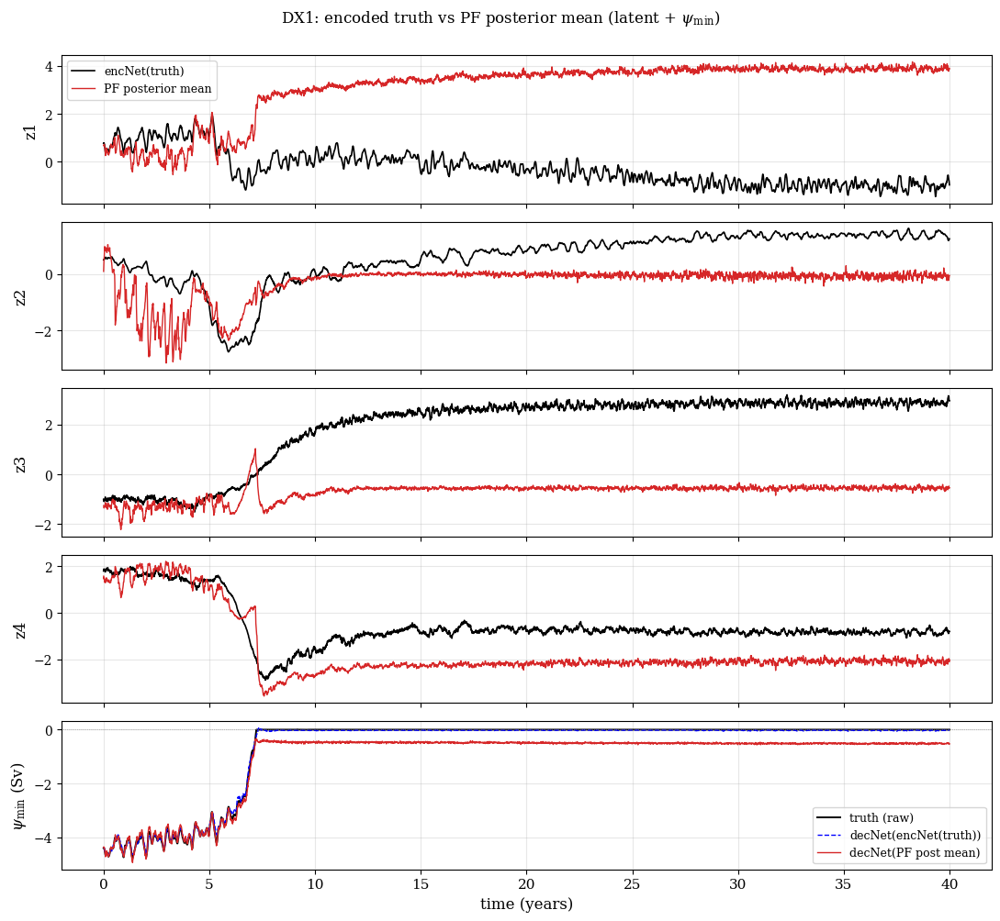

In [ ]:
"""
Diagnostic 1: encoded truth vs. filter posterior in latent space

Runs the particle filter once while keeping its full latent-space history, then compares the filter's posterior mean against the directly encoded truth, to check how closely the filter's internal state estimate tracks the encoder's own view of the true trajectory.
"""

# === Diagnostics 1: encoded truth vs PF posterior mean, in latent space ===

# Run the PF once, keeping the full latent history.
# This is the same call compute_pf_trajectories makes internally,
# but here we keep Z_post_hist / w_post_hist instead of throwing them away.

out = run_pf_with_z_history(
    best_J,
    seed=0,
    verbose=False,
    do_candidate_stats=False,
    light=False,
    z_save_every=10,
    proc_sigma=0.05,
)

(Xfilt, ESS_pf, post_y_std, NIS_pf, snap_data,
 Z_prior_hist, Z_post_hist, w_prior_hist, w_post_hist, save_steps) = out

assert Z_post_hist is not None and Z_post_hist.shape[2] >= 10, \
    "PF did not produce a usable z-history (light=True or too few save steps?)"

# --- encode the truth trajectory ---
encNet.eval()
with torch.no_grad():
    XN_hos_t = torch.tensor((Xtruth_hosing - mu) / sd,
                            dtype=torch.float32, device=device)
    Z_truth = encNet(XN_hos_t).cpu().numpy()        # (Nt, latentDim)

# subsample encoded truth to the same save grid the PF uses
Z_truth_sub = Z_truth[save_steps, :]                # (Tsave, latentDim)

# --- PF posterior mean in latent space ---
w = w_post_hist / (w_post_hist.sum(axis=0, keepdims=True) + 1e-12)  # (P, Tsave)
Z_post_mean = np.einsum("pt,dpt->dt", w, Z_post_hist).T             # (Tsave, latentDim)

# --- ψ_min from each: decode via decNet ---
psi_min_idx = model.convention.index("psi_min")

def _decode_psi_min(Z_td):      # Z_td : (T, d)
    with torch.no_grad():
        Zt = torch.tensor(Z_td, dtype=torch.float32, device=device)
        X_phys = decNet(Zt) * sd_t + mu_t
        return X_phys[:, psi_min_idx].cpu().numpy()

psi_truth_from_z  = _decode_psi_min(Z_truth_sub)
psi_postmean_fromz = _decode_psi_min(Z_post_mean)
psi_truth_direct  = Xtruth_hosing[save_steps, psi_min_idx]

t_plot = save_steps * dt_years

fig, axes = plt.subplots(latentDim + 1, 1, figsize=(11, 2.0 * (latentDim + 1)),
                         sharex=True)
for d in range(latentDim):
    axes[d].plot(t_plot, Z_truth_sub[:, d], "k-",  lw=1.2, label="encNet(truth)")
    axes[d].plot(t_plot, Z_post_mean[:, d], "C3-", lw=1.0, label="PF posterior mean")
    axes[d].set_ylabel(f"z{d+1}")
    axes[d].grid(alpha=0.3)
    if d == 0:
        axes[d].legend(loc="best", fontsize=9)

axes[-1].plot(t_plot, psi_truth_direct,   "k-",  lw=1.4, label="truth (raw)")
axes[-1].plot(t_plot, psi_truth_from_z,   "b--", lw=1.0, label="decNet(encNet(truth))")
axes[-1].plot(t_plot, psi_postmean_fromz, "C3-", lw=1.0, label="decNet(PF post mean)")
axes[-1].axhline(0, color="gray", lw=0.5, ls=":")
axes[-1].set_ylabel(r"$\psi_{\min}$ (Sv)")
axes[-1].set_xlabel("time (years)")
axes[-1].legend(loc="best", fontsize=9)
axes[-1].grid(alpha=0.3)

fig.suptitle("DX1: encoded truth vs PF posterior mean (latent + $\\psi_{\\min}$)",
             y=1.00)
plt.tight_layout()
plt.show()

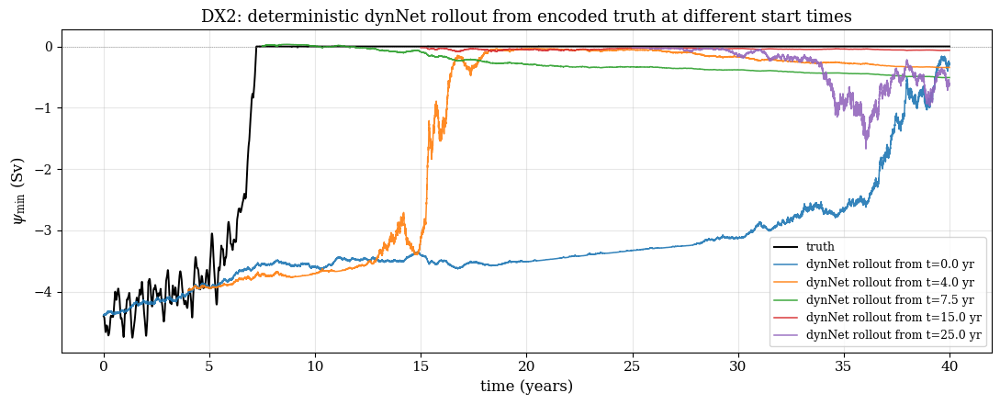

In [ ]:
"""
Diagnostic 2: does the dynamics network alone drift off course?

Starting from the encoded truth at several points in time, rolls the dynamics network forward on its own (with no filtering) to see whether it correctly reaches the collapsed state or drifts toward the wrong outcome -- isolating whether any bias comes from the dynamics network itself rather than the autoencoder or the filter.
"""

# === Diagnostics 2: dynNet rollout from encoded truth — integration-only test ===
# If the AE is good (Image 4) but dynNet pulls trajectories toward a
# wrong attractor, starting from encoded truth at t=0 and rolling to
# T_end should land somewhere other than psi_min ~ 0.

start_times_years = [0.0, 4.0, 7.5, 15.0, 25.0]  # one per pre-tip, tip, post-tip
psi_min_idx = model.convention.index("psi_min")

fig, ax = plt.subplots(figsize=(11, 4.5))

t_full = np.arange(Xtruth_hosing.shape[0]) * dt_years
ax.plot(t_full, Xtruth_hosing[:, psi_min_idx], "k-", lw=1.4, label="truth")

with torch.no_grad():
    XN_all = torch.tensor((Xtruth_hosing - mu) / sd,
                          dtype=torch.float32, device=device)
    Z_truth_all = encNet(XN_all)     # (Nt, latentDim)

for ts in start_times_years:
    k0 = int(ts / dt_years)
    Z = Z_truth_all[k0:k0+1, :].T.contiguous()        # (d, 1) — single trajectory

    traj = np.empty(Nt - k0, dtype=np.float32)
    with torch.no_grad():
        # initial ψ_min from decNet
        X0 = decNet(Z.T) * sd_t + mu_t
        traj[0] = X0[0, psi_min_idx].item()

        for k in range(k0 + 1, Nt):
            u_k = U_t[k - 1].to(device).reshape(1, -1)  # (1, u_dim)
            rhs = lambda zz: dynNet(torch.cat([zz, u_k], dim=1))
            Z = runge_kutta(Z.T.contiguous().float(), dt_years, rhs).T
            Z = torch.clamp(Z, -10.0, 10.0)
            Xk = decNet(Z.T) * sd_t + mu_t
            traj[k - k0] = Xk[0, psi_min_idx].item()

    ax.plot(t_full[k0:], traj, lw=1.1, alpha=0.9,
            label=f"dynNet rollout from t={ts:.1f} yr")

ax.axhline(0, color="gray", lw=0.5, ls=":")
ax.set_xlabel("time (years)")
ax.set_ylabel(r"$\psi_{\min}$ (Sv)")
ax.set_title("DX2: deterministic dynNet rollout from encoded truth at different start times")
ax.legend(fontsize=9)
ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()

[ 1/16] alpha=0.00, gamma=0.020 ... bias=-0.38 Sv, RMSE=0.34, <ESS>=0.74
[ 2/16] alpha=0.00, gamma=0.050 ... bias=-0.38 Sv, RMSE=0.34, <ESS>=0.74
[ 3/16] alpha=0.00, gamma=0.100 ... bias=-0.38 Sv, RMSE=0.34, <ESS>=0.74
[ 4/16] alpha=0.00, gamma=0.200 ... bias=-0.38 Sv, RMSE=0.34, <ESS>=0.74
[ 5/16] alpha=0.50, gamma=0.020 ... bias=-0.55 Sv, RMSE=0.47, <ESS>=0.70
[ 6/16] alpha=0.50, gamma=0.050 ... bias=-0.55 Sv, RMSE=0.47, <ESS>=0.70
[ 7/16] alpha=0.50, gamma=0.100 ... bias=-0.55 Sv, RMSE=0.47, <ESS>=0.71
[ 8/16] alpha=0.50, gamma=0.200 ... bias=-0.54 Sv, RMSE=0.47, <ESS>=0.71
[ 9/16] alpha=1.00, gamma=0.020 ... bias=-0.55 Sv, RMSE=0.47, <ESS>=0.70
[10/16] alpha=1.00, gamma=0.050 ... bias=-0.55 Sv, RMSE=0.47, <ESS>=0.71
[11/16] alpha=1.00, gamma=0.100 ... bias=-0.55 Sv, RMSE=0.47, <ESS>=0.71
[12/16] alpha=1.00, gamma=0.200 ... bias=-0.54 Sv, RMSE=0.46, <ESS>=0.72
[13/16] alpha=2.00, gamma=0.020 ... bias=-0.55 Sv, RMSE=0.47, <ESS>=0.70
[14/16] alpha=2.00, gamma=0.050 ... bias=-0.56 Sv, 

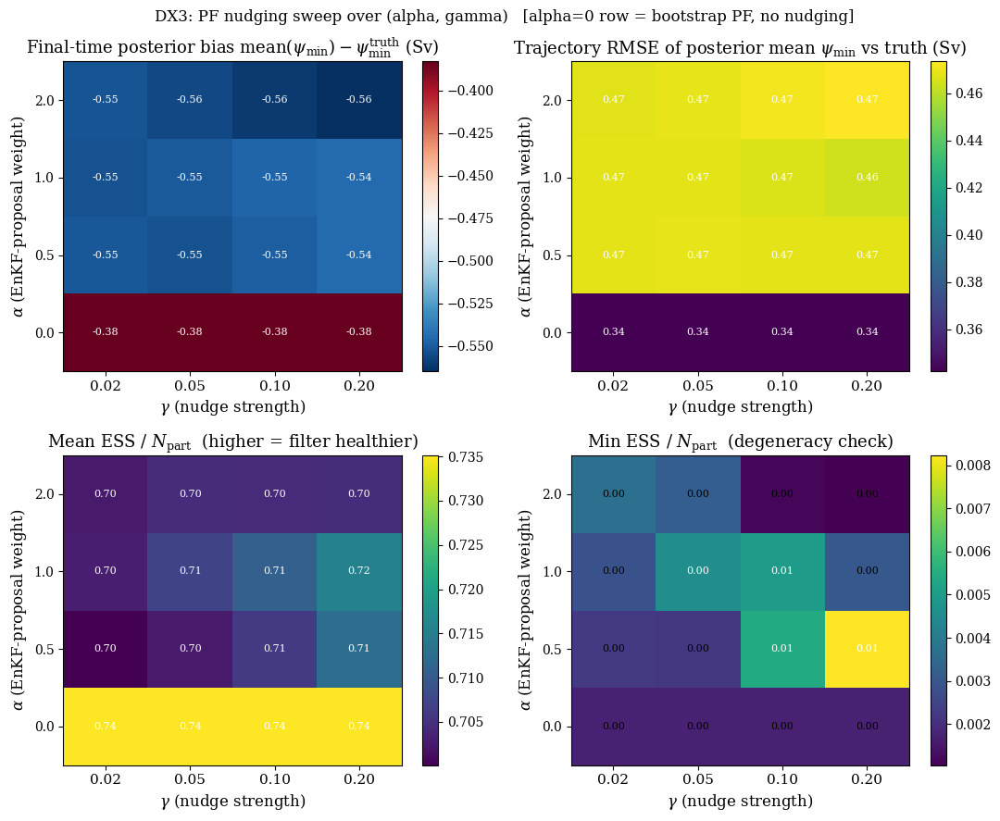


Bootstrap (alpha=0) bias range:  -0.38 to -0.38 Sv
Best NUDGED  (alpha>0):          -0.54 Sv  at alpha=1.0, gamma=0.200
Best OVERALL (any alpha):        -0.38 Sv  at alpha=0.0, gamma=0.020
Mean ESS range:                  0.70 to 0.74


In [ ]:
"""
Diagnostic 3: sensitivity to the filter's nudge settings

Sweeps over combinations of the particle filter's two nudging parameters to check whether any setting removes a bias seen in the earlier diagnostics, and whether that bias is a property of the dynamics model itself (present across all settings) or of the filtering procedure.
"""

# === Diagnostics 3: PF nudging sensitivity sweep over (alpha, gamma) ===
# Scans the two nudging-proposal knobs to answer two questions:
#   (1) Does any (alpha, gamma) combination eliminate the -0.7 Sv posterior
#       bias we saw in DX1? If the bias is roughly invariant across the grid,
#       the bias is dynamical (dynNet) not assimilative (PF tuning).
#   (2) Bootstrap-vs-nudged: alpha=0 disables the EnKF-guided proposal and
#       reduces the PF to a bootstrap filter. Comparing alpha=0 columns to
#       alpha>0 is the defense for including the nudging step at all.
#
# Cost: 16 PF runs. On Colab GPU this is ~2-10 min depending on Nt.

import numpy as np
import matplotlib.pyplot as plt

assert "run_pf_with_z_history" in globals(), "Run cell 109 (patcher) first."
assert "best_J" in globals(), "Run the sensor-placement cell first."
assert "decode_psi_min_from_zhist" in globals(), "Run cell 109 (decoder) first."

# --- grid ---
alphas = [0.0, 0.5, 1.0, 2.0]      # 0 = bootstrap PF (no nudging)
gammas = [0.02, 0.05, 0.10, 0.20]
Z_SAVE_EVERY = 10

psi_min_idx = model.convention.index("psi_min")
psi_truth = Xtruth_hosing[:, psi_min_idx]          # (Nt,)

# Output arrays: (n_alpha, n_gamma)
bias_end   = np.full((len(alphas), len(gammas)), np.nan)
rmse_traj  = np.full((len(alphas), len(gammas)), np.nan)
ess_mean   = np.full((len(alphas), len(gammas)), np.nan)
ess_min    = np.full((len(alphas), len(gammas)), np.nan)

for i, a in enumerate(alphas):
    for j, g in enumerate(gammas):
        print(f"[{i*len(gammas)+j+1:2d}/{len(alphas)*len(gammas)}] "
              f"alpha={a:.2f}, gamma={g:.3f} ...", end=" ", flush=True)

        out = run_pf_with_z_history(
            best_J,
            seed=0, verbose=False,
            do_candidate_stats=False, light=False,
            z_save_every=Z_SAVE_EVERY,
            proc_sigma=0.05,
            guided_prop=(a > 0.0),       # alpha=0 => pure bootstrap
            nudge_alpha=a,
            nudge_gamma=g,
        )
        (Xfilt, ESS_pf, post_y_std, NIS_pf, snap_data,
         Z_prior_hist, Z_post_hist, w_prior_hist, w_post_hist,
         save_steps_sweep) = out

        if Z_post_hist is None or Z_post_hist.shape[2] < 10:
            print("z-history too short, skipping")
            continue

        # Posterior mean psi_min on the saved grid
        psi_post = decode_psi_min_from_zhist(Z_post_hist)   # (P, T)
        w = w_post_hist / (w_post_hist.sum(0, keepdims=True) + 1e-12)
        mean_post_t = np.sum(w * psi_post, axis=0)          # (T,)

        # Truth on the same saved grid
        psi_truth_sub = psi_truth[save_steps_sweep]

        bias_end[i, j]  = mean_post_t[-1] - psi_truth_sub[-1]
        rmse_traj[i, j] = np.sqrt(np.mean((mean_post_t - psi_truth_sub) ** 2))
        ess_mean[i, j]  = np.nanmean(ESS_pf) / Npart        # as fraction
        ess_min[i, j]   = np.nanmin(ESS_pf) / Npart
        print(f"bias={bias_end[i,j]:+.2f} Sv, RMSE={rmse_traj[i,j]:.2f}, "
              f"<ESS>={ess_mean[i,j]:.2f}")

# --- plot ---
fig, axes = plt.subplots(2, 2, figsize=(11, 9))

def _heat(ax, M, title, cmap, fmt="{:+.2f}"):
    im = ax.imshow(M, aspect="auto", cmap=cmap, origin="lower")
    ax.set_xticks(range(len(gammas))); ax.set_xticklabels([f"{g:.2f}" for g in gammas])
    ax.set_yticks(range(len(alphas))); ax.set_yticklabels([f"{a:.1f}" for a in alphas])
    ax.set_xlabel(r"$\gamma$ (nudge strength)")
    ax.set_ylabel(r"$\alpha$ (EnKF-proposal weight)")
    ax.set_title(title)
    for i in range(M.shape[0]):
        for j in range(M.shape[1]):
            if np.isfinite(M[i, j]):
                ax.text(j, i, fmt.format(M[i, j]), ha="center", va="center",
                        fontsize=8, color="white" if abs(M[i,j]) > 0.5*np.nanmax(np.abs(M)) else "black")
    plt.colorbar(im, ax=ax)

_heat(axes[0, 0], bias_end,
      r"Final-time posterior bias $\mathrm{mean}(\psi_\min) - \psi^{\rm truth}_\min$ (Sv)",
      "RdBu_r")
_heat(axes[0, 1], rmse_traj,
      r"Trajectory RMSE of posterior mean $\psi_\min$ vs truth (Sv)",
      "viridis", fmt="{:.2f}")
_heat(axes[1, 0], ess_mean,
      r"Mean ESS / $N_{\rm part}$  (higher = filter healthier)",
      "viridis", fmt="{:.2f}")
_heat(axes[1, 1], ess_min,
      r"Min ESS / $N_{\rm part}$  (degeneracy check)",
      "viridis", fmt="{:.2f}")

fig.suptitle(
    f"DX3: PF nudging sweep over (alpha, gamma)   "
    f"[alpha=0 row = bootstrap PF, no nudging]", fontsize=12)
plt.tight_layout()
plt.show()

# --- one-line verdict ---
# Best across full grid (may be bootstrap)
best_i_all, best_j_all = np.unravel_index(
    np.nanargmin(np.abs(bias_end)), bias_end.shape)
# Best restricted to nudged rows (alpha > 0)
nudged = bias_end[1:, :]
best_i_n_rel, best_j_n = np.unravel_index(
    np.nanargmin(np.abs(nudged)), nudged.shape)
best_i_n = best_i_n_rel + 1   # shift back into full grid coords

boot_row_bias = bias_end[0, :]
print()
print(f"Bootstrap (alpha=0) bias range:  "
      f"{np.nanmin(boot_row_bias):+.2f} to {np.nanmax(boot_row_bias):+.2f} Sv")
print(f"Best NUDGED  (alpha>0):          {bias_end[best_i_n, best_j_n]:+.2f} Sv  "
      f"at alpha={alphas[best_i_n]:.1f}, gamma={gammas[best_j_n]:.3f}")
print(f"Best OVERALL (any alpha):        {bias_end[best_i_all, best_j_all]:+.2f} Sv  "
      f"at alpha={alphas[best_i_all]:.1f}, gamma={gammas[best_j_all]:.3f}")
print(f"Mean ESS range:                  "
      f"{np.nanmin(ess_mean):.2f} to {np.nanmax(ess_mean):.2f}")

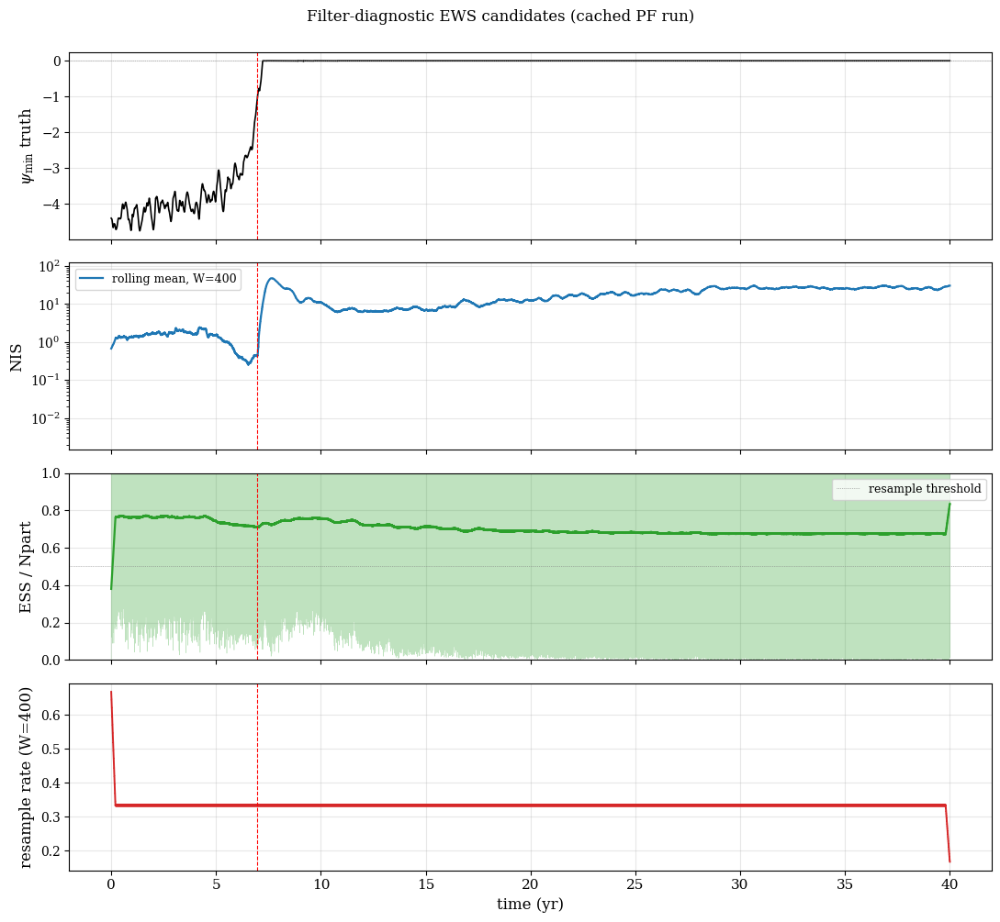

   NIS   τ = -0.152   p = 2.19e-65
  -ESS   τ = +0.489   p = 0
  rsmp   τ = +0.000   p = 0.987


In [ ]:
"""
Sanity check: could filter statistics themselves serve as an early-warning signal?

Reuses the particle history from Diagnostic 1 to check whether internal filter statistics (like the innovation statistic, effective sample size, or resampling rate) show their own early-warning trend ahead of collapse, as an alternative to the physical-variable-based indicators used earlier.
"""

# === Sanity check: are NIS / ESS / resample-rate viable EWS candidates? ===
# Reuses arrays from Diagnostics 1 — no new PF execution.

import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import uniform_filter1d
from scipy.stats import kendalltau

assert "ESS_pf" in globals() and "NIS_pf" in globals(), \
    "Run Diagnostics 1 first to populate ESS_pf and NIS_pf."

Nt_pf = len(ESS_pf)
t_pf  = np.arange(Nt_pf) * dt_years

psi_min_idx = model.convention.index("psi_min")
psi_truth   = Xtruth_hosing[:Nt_pf, psi_min_idx]
tip_candidates = np.where(psi_truth > -1.0)[0]
tip_idx = int(tip_candidates[0]) if len(tip_candidates) else None
t_tip   = tip_idx * dt_years if tip_idx is not None else None

W = max(50, Nt_pf // 100)
ESS_s    = uniform_filter1d(ESS_pf, size=W, mode='nearest')

nis_filled = np.where(np.isfinite(NIS_pf), NIS_pf, 0.0)
nis_valid  = np.isfinite(NIS_pf).astype(np.float64)
num = uniform_filter1d(nis_filled, size=W, mode='nearest')
den = uniform_filter1d(nis_valid,  size=W, mode='nearest')
NIS_s = np.where(den > 0.05, num / (den + 1e-12), np.nan)

did_rs   = (ESS_pf < resampESS * Npart).astype(float)
resamp_s = uniform_filter1d(did_rs, size=W, mode='nearest')

fig, axes = plt.subplots(4, 1, figsize=(11, 10), sharex=True)
axes[0].plot(t_pf, psi_truth, 'k', lw=1.2)
axes[0].axhline(0, color='gray', lw=0.5, ls=':')
axes[0].set_ylabel(r'$\psi_{\min}$ truth')

axes[1].plot(t_pf, NIS_pf, 'C0', lw=0.4, alpha=0.3)
axes[1].plot(t_pf, NIS_s,  'C0', lw=1.6, label=f'rolling mean, W={W}')
axes[1].set_ylabel('NIS'); axes[1].set_yscale('log'); axes[1].legend()

axes[2].plot(t_pf, ESS_pf / Npart, 'C2', lw=0.4, alpha=0.3)
axes[2].plot(t_pf, ESS_s  / Npart, 'C2', lw=1.6)
axes[2].axhline(resampESS, color='gray', lw=0.5, ls=':', label='resample threshold')
axes[2].set_ylabel('ESS / Npart'); axes[2].set_ylim(0, 1); axes[2].legend()

axes[3].plot(t_pf, resamp_s, 'C3', lw=1.4)
axes[3].set_ylabel(f'resample rate (W={W})'); axes[3].set_xlabel('time (yr)')

for ax in axes:
    if t_tip: ax.axvline(t_tip, color='red', lw=0.8, ls='--')
    ax.grid(alpha=0.3)

fig.suptitle('Filter-diagnostic EWS candidates (cached PF run)', y=1.00)
plt.tight_layout(); plt.show()

if tip_idx is not None and tip_idx > 100:
    pre = slice(int(0.1 * tip_idx), int(0.9 * tip_idx))
    for name, s in [('NIS',  NIS_s[pre]),
                    ('-ESS', -ESS_s[pre]),
                    ('rsmp', resamp_s[pre])]:
        tau, p = kendalltau(np.arange(s.size), s)
        print(f"{name:>6s}   τ = {tau:+.3f}   p = {p:.3g}")

In [ ]:
"""
Inspect the raw innovation statistic array

Prints basic sanity-check statistics (shape, NaNs, range) for the filter's innovation-statistic array before using it in the diagnostics above.
"""

print("NIS_pf shape:", NIS_pf.shape)
print("NIS_pf dtype:", NIS_pf.dtype)
print("any NaN:", np.isnan(NIS_pf).any(), "any Inf:", np.isinf(NIS_pf).any())
print("nonzero fraction:", np.mean(NIS_pf != 0))
print("min/median/max:", np.nanmin(NIS_pf), np.nanmedian(NIS_pf), np.nanmax(NIS_pf))
print("first 20:", NIS_pf[:20])
print("around tip (k=300-330):", NIS_pf[300:330] if len(NIS_pf) > 330 else "n/a")

NIS_pf shape: (40001,)
NIS_pf dtype: float64
any NaN: True any Inf: False
nonzero fraction: 1.0
min/median/max: 0.0024677927140146494 14.107751369476318 73.17949676513672
first 20: [0.47404152        nan        nan 0.28014898        nan        nan
 0.49485755        nan        nan 1.19994473        nan        nan
 0.77606016        nan        nan 0.57378656        nan        nan
 3.26888657        nan]
around tip (k=300-330): [1.6884867         nan        nan 1.53112876        nan        nan
 1.647668          nan        nan 1.98582137        nan        nan
 1.20353568        nan        nan 0.31329969        nan        nan
 1.15434265        nan        nan 2.19810247        nan        nan
 0.90103155        nan        nan 1.27335227        nan        nan]
